In [100]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# TensorFlow ≥2.0 is required
import tensorflow as tf
from tensorflow import keras
assert tf.__version__ >= "2.0"

# Common imports
import numpy as np
import os
import math

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

import pandas as pd
import datetime
import time

## Load data

In [101]:
# Mesh size
nl = 10
nc = 10
print('Grid: ', nl, 'x',nc)

Grid:  10 x 10


In [102]:
import joblib
#...
pca_compress = joblib.load("pca_compress_15.pkl") 
X_train_compressed = np.loadtxt('X_train_pca.csv', delimiter=',') 

X_train_1D = np.loadtxt('X_train_1D.csv', delimiter=',') 
times  = np.loadtxt('times.csv', delimiter=',') 
R0s  = np.loadtxt('R0s.csv', delimiter=',') 
nrun = int(X_train_1D.shape[0]/len(times))
with open('groups.txt') as f:
    groups = [g.strip() for g in f.readlines()]

# PCA recovered
X_recovered = pca_compress.inverse_transform(X_train_compressed)

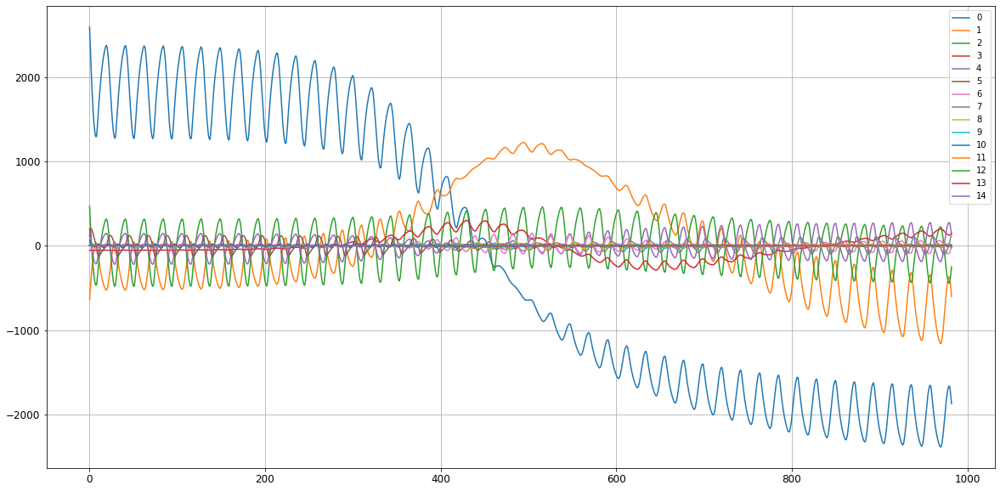

In [103]:
fig, ax = plt.subplots(1,1, figsize=[20,10])
ax.plot(X_train_compressed[:len(times)*1]);
ax.grid()
ax.legend(range(15))

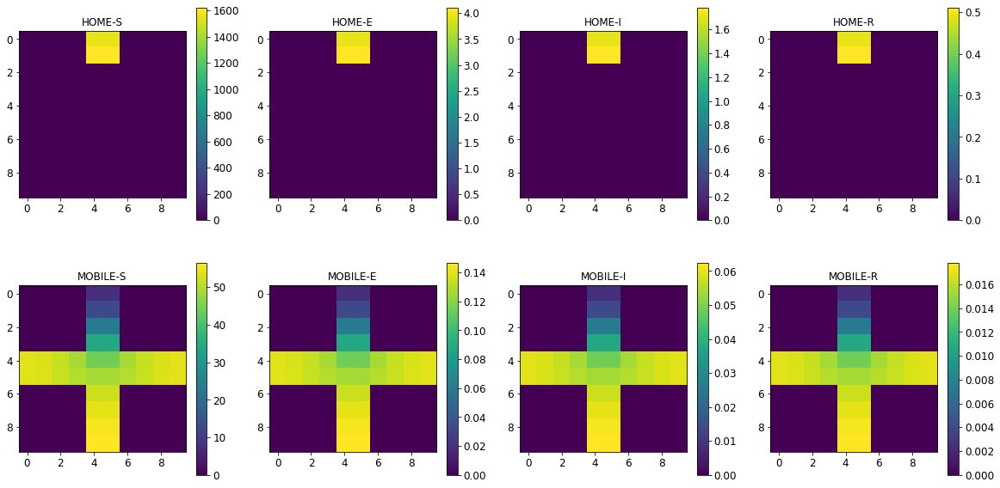

In [104]:
fig, ax = plt.subplots(2,4, figsize=[20,10])
for i, group in enumerate(groups):
    im = ax.flatten()[i].imshow(X_train_1D.reshape(nrun,len(times),len(groups),nl,nc)[0,100,i,:,:])
    fig.colorbar(im, ax=ax.flatten()[i])
    ax.flatten()[i].set_title(group)

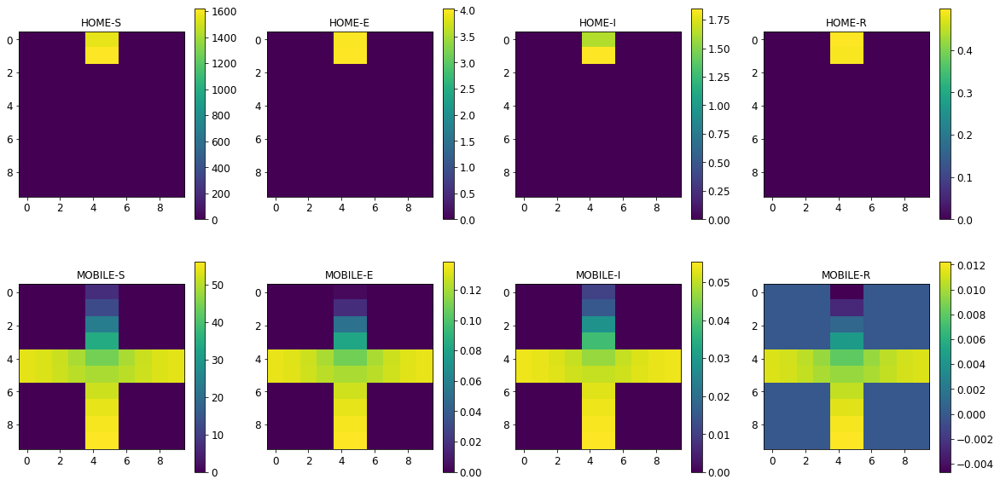

In [105]:
fig, ax = plt.subplots(2,4, figsize=[20,10])
for i, group in enumerate(groups):
    im = ax.flatten()[i].imshow(X_recovered.reshape(nrun,len(times),len(groups),nl,nc)[0,100,i,:,:])
    fig.colorbar(im, ax=ax.flatten()[i])
    ax.flatten()[i].set_title(group)

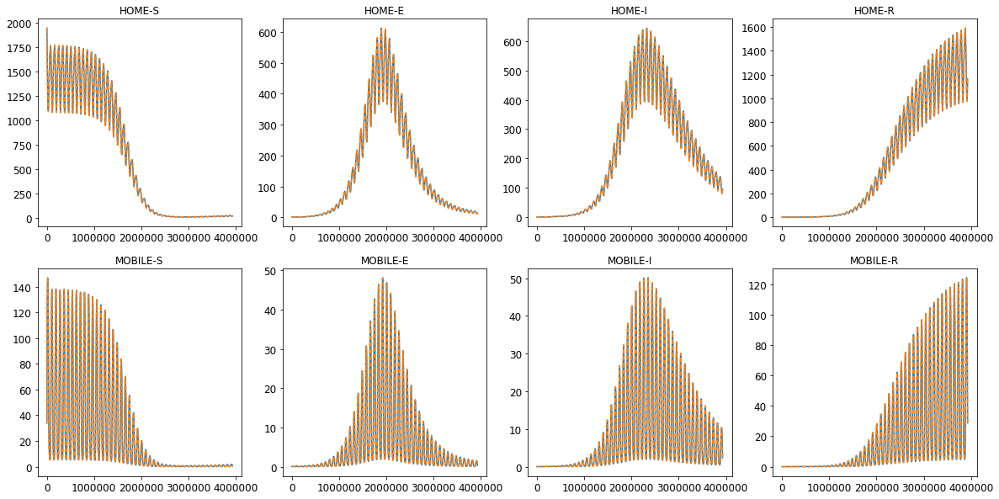

In [106]:
fig, ax = plt.subplots(2,4, figsize=[20,10])
for i, group in enumerate(groups):
    ax.flatten()[i].plot(times, X_train_1D.reshape(nrun, len(times),len(groups),nl,nc)[0,:,i,0,4])
    ax.flatten()[i].plot(times, X_recovered.reshape(nrun, len(times),len(groups),nl,nc)[0,:,i,0,4],'--')
    ax.flatten()[i].set_title(group)

## Prepare data

In [107]:
pca_size = X_train_compressed.shape[1]
X_train_compressed.shape

(39320, 15)

In [108]:
X_train_R0s = R0s.repeat(len(times), axis=0)
X_train_R0s.shape

(39320, 2)

In [109]:
X_train_compressedplus = np.concatenate((X_train_compressed, X_train_R0s), axis=1) 
codings_size = X_train_compressedplus.shape[1]
X_train_compressedplus.shape

(39320, 17)

In [110]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler((-1,1))
X_train_scaled = scaler.fit_transform(X_train_compressedplus)
np.allclose(X_train_compressedplus, scaler.inverse_transform(X_train_scaled))

True

In [111]:
def concat_timesteps(X_train, ntimes, step, times):
    X_train_concat = []
    for j in range(len(X_train)//len(times)):
        for i in range(j*len(times), j*len(times)+(len(times)-ntimes*step)):
            X_train_concat.append(X_train[i:i+ntimes*step:step])
    return np.array(X_train_concat)

In [112]:
ntimes = 10 # Consecutive times for the GAN
step = 2 # step between times

X_train_concat = concat_timesteps(X_train_scaled, ntimes, step, times)
#X_train_concat_flatten = X_train_concat.reshape(X_train_concat.shape[0], codings_size*ntimes )

(38520, 10, 17)


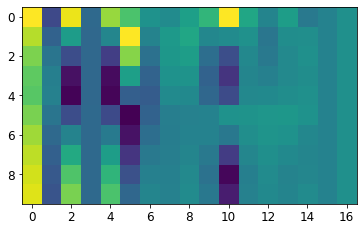

In [113]:
print(X_train_concat.shape)
plt.imshow(X_train_concat[0, :, :])

In [114]:
np.random.seed(42)
tf.random.set_seed(1234)

BATCH_SIZE = 128
latent_space = 100

# Create a tensorflow dataset and split it into batches
train_dataset = X_train_concat.reshape(X_train_concat.shape[0], ntimes, codings_size , 1).astype('float32')
train_dataset = tf.data.Dataset.from_tensor_slices(train_dataset)
train_dataset = train_dataset.shuffle(len(X_train_concat))
train_dataset = train_dataset.batch(BATCH_SIZE)
for data in train_dataset:
    print(data)
    break

tf.Tensor(
[[[[ 0.7721959 ]
   [-0.33461073]
   [ 0.26192167]
   ...
   [-0.07557973]
   [ 0.25579125]
   [ 0.10401603]]

  [[ 0.8286563 ]
   [-0.380571  ]
   [ 0.4846424 ]
   ...
   [-0.03660819]
   [ 0.25579125]
   [ 0.10401603]]

  [[ 0.8638956 ]
   [-0.40875682]
   [ 0.6251556 ]
   ...
   [-0.00311662]
   [ 0.25579125]
   [ 0.10401603]]

  ...

  [[ 0.4482724 ]
   [-0.06089072]
   [-0.95986944]
   ...
   [-0.02397341]
   [ 0.25579125]
   [ 0.10401603]]

  [[ 0.47749946]
   [-0.08438924]
   [-0.83158326]
   ...
   [ 0.090842  ]
   [ 0.25579125]
   [ 0.10401603]]

  [[ 0.5945618 ]
   [-0.17984095]
   [-0.36251575]
   ...
   [-0.08684829]
   [ 0.25579125]
   [ 0.10401603]]]


 [[[ 0.8833958 ]
   [-0.44594896]
   [ 0.5330885 ]
   ...
   [-0.03875915]
   [-0.10111754]
   [ 0.00999323]]

  [[ 0.77767324]
   [-0.3560126 ]
   [ 0.13200502]
   ...
   [-0.05539494]
   [-0.10111754]
   [ 0.00999323]]

  [[ 0.64117473]
   [-0.24013133]
   [-0.37952563]
   ...
   [-0.05919233]
   [-0.10111754]


## Train the GAN

In [115]:
init = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

In [116]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(keras.layers.Dense(5*5*256, use_bias=False, kernel_initializer=init, input_shape=(latent_space,)))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.2))

    model.add(keras.layers.Reshape((5, 5, 256)))

    model.add(keras.layers.Conv2DTranspose(128, (3, 3), strides=(1, 1), padding='same', kernel_initializer=init, use_bias=False))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.2))

    model.add(keras.layers.Conv2DTranspose(64, (3, 3), strides=(1, 2), padding='same', output_padding=[0,0], kernel_initializer=init, use_bias=False))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.2))

    model.add(keras.layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', output_padding=[1,0], kernel_initializer=init, use_bias=False, activation='tanh'))

    return model

In [117]:
generator = make_generator_model()
generator.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 6400)              640000    
_________________________________________________________________
batch_normalization_9 (Batch (None, 6400)              25600     
_________________________________________________________________
leaky_re_lu_15 (LeakyReLU)   (None, 6400)              0         
_________________________________________________________________
reshape_3 (Reshape)          (None, 5, 5, 256)         0         
_________________________________________________________________
conv2d_transpose_9 (Conv2DTr (None, 5, 5, 128)         294912    
_________________________________________________________________
batch_normalization_10 (Batc (None, 5, 5, 128)         512       
_________________________________________________________________
leaky_re_lu_16 (LeakyReLU)   (None, 5, 5, 128)        

(1, 10, 17, 1)


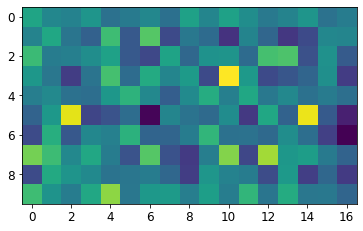

In [118]:
noise = tf.random.normal([1, latent_space])
generated_image = generator(noise, training=False)
print(generated_image.shape)
plt.imshow(generated_image[0, :, :, 0])

In [119]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(keras.layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', kernel_initializer=init, input_shape=[10, 17, 1]))
    model.add(keras.layers.LeakyReLU(0.2))

    model.add(keras.layers.Conv2D(128, (3, 3), strides=(1, 2), padding='same', kernel_initializer=init))
    #model.add(keras.layers.BatchNormalization()) # Replaced by LayerNorem because of the WGAN-GP
    model.add(keras.layers.LayerNormalization())
    model.add(keras.layers.LeakyReLU(0.2))

    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(1, kernel_initializer=init))

    return model

In [120]:
discriminator = make_discriminator_model()
discriminator.summary()

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 5, 9, 64)          1664      
_________________________________________________________________
leaky_re_lu_18 (LeakyReLU)   (None, 5, 9, 64)          0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 5, 5, 128)         73856     
_________________________________________________________________
layer_normalization_3 (Layer (None, 5, 5, 128)         256       
_________________________________________________________________
leaky_re_lu_19 (LeakyReLU)   (None, 5, 5, 128)         0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 3200)              0         
_________________________________________________________________
dense_7 (Dense)              (None, 1)               

In [121]:
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[0.0003695]], shape=(1, 1), dtype=float32)


In [122]:
gan = keras.models.Sequential([generator, discriminator])

In [123]:
def discriminator_loss(real_output, fake_output):
    real_loss = tf.reduce_mean(real_output)
    fake_loss = tf.reduce_mean(fake_output)
    return fake_loss - real_loss 


def generator_loss(fake_output):
    return -tf.reduce_mean(fake_output)

generator_mean_loss = tf.keras.metrics.Mean(dtype=tf.float32)
discriminator_mean_loss = tf.keras.metrics.Mean(dtype=tf.float32)

In [124]:
def gradient_penalty(real, fake):
    
    alpha = tf.random.uniform(shape=[real.shape[0], 1, 1, 1], minval=0., maxval=1.) 
    interp = real + alpha * (fake - real)

    with tf.GradientTape() as gp_tape:
        gp_tape.watch(interp)
        interp_output = discriminator(interp, training=True)
    grads = gp_tape.gradient(interp_output, interp)
    grads_norm = tf.norm(tf.reshape(grads, [grads.shape[0], -1]), axis=1) 
    gp = tf.reduce_mean((grads_norm - 1.)**2)
    
    return gp

In [125]:
# The discriminator and the generator optimizers are different since we will train two networks separately.
generator_optimizer = tf.keras.optimizers.Adam(1.0e-4, 0.5, 0.9)
discriminator_optimizer = tf.keras.optimizers.Adam(1.0e-4, 0.5, 0.9)

In [126]:
# discriminator iterations per generator iteration
n_critic = 5
gp_lambda = 10

# We will reuse this seed overtime 
num_examples_to_generate = 5
seed = tf.random.normal([num_examples_to_generate, latent_space])

In [127]:
# logs to follow losses on tensorboard
current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
print(current_time)
generator_log_dir = './logs/'+current_time+'/generator-wgan'
discriminator_log_dir = './logs/'+current_time+'/discriminator-wgan'

generator_summary_writer = tf.summary.create_file_writer(generator_log_dir)
discriminator_summary_writer = tf.summary.create_file_writer(discriminator_log_dir)

20220309-095638


In [128]:
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
@tf.function
def train_gen(batch):

    noise = tf.random.normal([batch.shape[0], latent_space])

    with tf.GradientTape() as gen_tape:
        generated_images = generator(noise, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    
    generator_mean_loss(gen_loss)
    

In [129]:
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
@tf.function
def train_crit(batch):

    noise = tf.random.normal([batch.shape[0], latent_space])

    with tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(batch, training=True)
        fake_output = discriminator(generated_images, training=True)

        disc_loss_orig = discriminator_loss(real_output, fake_output)
        gp = gradient_penalty(batch, generated_images)
        disc_loss = disc_loss_orig + gp_lambda*gp 

    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    
    discriminator_mean_loss(disc_loss)
    

In [130]:
# calculate the kl divergence for independente variables
def kl_divergence(p, q):
    return sum(p[i] * math.log2(p[i]/q[i]) for i in range(len(p)) if p[i]!=0.0)
 
# calculate the js divergence for independente variables
def js_divergence(p, q):
    m = 0.5 * (p + q)
    return 0.5 * kl_divergence(p, m) + 0.5 * kl_divergence(q, m)

# calculate the BC divergence for independente variables
def bc_divergence(p, q):
    return sum(math.sqrt(p[i]*q[i]) for i in range(len(p)))

# calculate the kl divergence for multivariate variables
def KLdivergence(x, y):
    """Compute the Kullback-Leibler divergence between two multivariate samples.
    Parameters
    ----------
    x : 2D array (n,d)
    Samples from distribution P, which typically represents the true
    distribution.
    y : 2D array (m,d)
    Samples from distribution Q, which typically represents the approximate
    distribution.
    Returns
    -------
    out : float
    The estimated Kullback-Leibler divergence D(P||Q).
    References
    ----------
    Pérez-Cruz, F. Kullback-Leibler divergence estimation of
    continuous distributions IEEE International Symposium on Information
    Theory, 2008.
    """
    from scipy.spatial import cKDTree as KDTree

    # Check the dimensions are consistent
    x = np.atleast_2d(x)
    y = np.atleast_2d(y)

    n,d = x.shape
    m,dy = y.shape

    assert(d == dy)


    # Build a KD tree representation of the samples and find the nearest neighbour
    # of each point in x.
    xtree = KDTree(x)
    ytree = KDTree(y)

    # Get the first two nearest neighbours for x, since the closest one is the
    # sample itself.
    r = xtree.query(x, k=2, eps=.01, p=2)[0][:,1]
    s = ytree.query(x, k=1, eps=.01, p=2)[0]

    # There is a mistake in the paper. In Eq. 14, the right side misses a negative sign
    # on the first term of the right hand side.
    return -np.log(r/s).sum() * d / n + np.log(m / (n - 1.))

In [131]:
def train(dataset, epochs, model_name, start=0):
    hist, scores, weighted_scores, kl_score = [], [], [], [] # Only to print anplot results
    for epoch in range(start, start+epochs):
        start = time.time()
        print("Epoch {}/{}".format(epoch + 1, epochs))   

        for batch in dataset:            
            for _ in range(n_critic):
                train_crit(batch)
            train_gen(batch)
            
            
        with generator_summary_writer.as_default():
            tf.summary.scalar('loss', generator_mean_loss.result(), step=epoch)

        with discriminator_summary_writer.as_default():
            tf.summary.scalar('loss', discriminator_mean_loss.result(), step=epoch)
        
        hist.append([generator_mean_loss.result().numpy(), discriminator_mean_loss.result().numpy()])

        generator_mean_loss.reset_states()
        discriminator_mean_loss.reset_states()
        
        print("discriminator", "{}: {:.6f}".format(discriminator.metrics_names[0], hist[-1][1]), end=' - ')
        print("generator", "{}: {:.6f}".format(gan.metrics_names[0], hist[-1][0]), end=' - ')    
        print ('{:.0f}s'.format( time.time()-start))

        # Print GAN outputs and scores
        if epoch%200 == 0: 
            # Plot generated data
            X_generated = scaler.inverse_transform(generator.predict(seed).reshape(num_examples_to_generate*ntimes,codings_size))
            R0_generated = X_generated[:,pca_size:]
            X_generated = pca_compress.inverse_transform(X_generated[:,:pca_size])
            X_generated = X_generated.reshape(num_examples_to_generate, ntimes, len(groups)*nl*nc)
            fig, ax = plt.subplots(num_examples_to_generate*2,len(groups), figsize=[20,num_examples_to_generate*5])
            for j in range(num_examples_to_generate):
                for i, group in enumerate(groups):
                    for k in range(0,10,10): 
                        ax.flatten()[i+2*j*len(groups)].plot(X_generated[j][:,i*nl*nc+4+10*k], '-')
                for i, group in enumerate(groups):
                    im = ax.flatten()[i+(2*j+1)*len(groups)].imshow(X_generated[j].reshape(ntimes,len(groups),nl,nc)[4,i,:,:])
                    fig.colorbar(im, ax=ax.flatten()[i+(2*j+1)*len(groups)])
            plt.show()
            
            print()
            print('R0 generated:')
            print(R0_generated)
            print()
                    
            # Save model
            gan.save('ganmodels/'+model_name+'_'+str(epoch)+'.h5')    
            
            # plot loss
            print('Loss: ')
            fig, ax = plt.subplots(1,1, figsize=[20,10])
            ax.plot(hist)
            ax.legend(['loss_gen', 'loss_disc'])
            ax.set_yscale('log')
            ax.grid()
            plt.show()
            
            # mean/std real 
            means_real = np.mean(X_train_concat, axis=1)
            std_real = np.std(X_train_concat, axis=1)
            #reshaped_real = X_train_concat.reshape(-1,17)

            # mean/std generated
            noise = tf.random.normal([X_train_concat.shape[0], latent_space])
            generated_image = generator(noise, training=False)
            means_gen = np.mean(generated_image, axis=1) 
            std_gen = np.std(generated_image, axis=1) 
            #reshaped_gen = generated_image.numpy().reshape(-1,17)

            n_bins = 100
            kl, js, bc = [], [], []
            count = 0
            cols = range(17)
            #fig, axes = plt.subplots(len(cols), 2, figsize=(20,5*len(cols)))    
            for col in cols:

                fig, axes = plt.subplots(1, 2, figsize=(20,5))  

                # MEAN
                # Histogram min and max and number of bins
                bin_width = 0.01
                h_min = np.min([means_gen[:,col,0],means_real[:,col]])
                h_max = np.max([means_gen[:,col,0],means_real[:,col]])
                #n_bins = math.ceil((h_max - h_min)/bin_width)


                # Plot mean histogram
                n_real, bins, patches = axes[0].hist(means_real[:,col], bins = n_bins, alpha = 0.8, 
                                              label = 'real_means_PCA_'+ str(col),
                                              range = (h_min, h_max))

                n_gen, bins, patches = axes[0].hist(means_gen[:,col,0], bins = n_bins, alpha =0.8, 
                                              label = 'gen_means_PCA_' + str(col),
                                              range = (h_min, h_max))
                axes[0].legend()

                kl_mean = kl_divergence(n_real/sum(n_real), n_gen/sum(n_gen))
                js_mean = js_divergence(n_real/sum(n_real), n_gen/sum(n_gen))
                bc_mean = bc_divergence(n_real/sum(n_real), n_gen/sum(n_gen))
                print(f'{col}: mean KL divergence (r,g) = {kl_mean}')
                print(f'{col}: mean JS divergence = {js_mean}')
                print(f'{col}: mean 1-BC divergence = {1-bc_mean}')

                # STD
                # Histogram min and max and number of bins
                bin_width = 0.003
                h_min = np.min([std_gen[:,col,0],std_real[:,col]])
                h_max = np.max([std_gen[:,col,0],std_real[:,col]])
                #n_bins = math.ceil((h_max - h_min)/bin_width)

                # Plot std histogram
                n_real, bins, patches = axes[1].hist(std_real[:,col], bins = n_bins, alpha = 0.8, 
                                              label = 'real_std_PCA_'+ str(col),
                                              range = (h_min, h_max))

                n_gen, bins, patches = axes[1].hist(std_gen[:,col,0], bins = n_bins, alpha =0.8, 
                                              label = 'gen_std_PCA_' + str(col),
                                              range = (h_min, h_max))
                axes[1].legend()    

                kl_std = kl_divergence(n_real/sum(n_real), n_gen/sum(n_gen))
                js_std = js_divergence(n_real/sum(n_real), n_gen/sum(n_gen))
                bc_std = bc_divergence(n_real/sum(n_real), n_gen/sum(n_gen))
                print(f'\n{col}: std KL divergence (r,g) = {kl_std}')
                print(f'{col}: std JS divergence = {js_std}')
                print(f'{col}: std 1-BC divergence = {1-bc_std}')

                # SUM
                if (col < 15):
                    kl.append((kl_mean + kl_std)/2)
                    js.append((js_mean + js_std)/2)
                    bc.append((bc_mean + bc_std)/2)
                    count += 1


                # Histogram min and max and number of bins
            #     bin_width = 0.01
            #     h_min = np.min([reshaped_gen[:,col],reshaped_real[:,col]])
            #     h_max = np.max([reshaped_gen[:,col],reshaped_real[:,col]])
            #     n_bins = math.ceil((h_max - h_min)/bin_width)

            #     # Plot std histogram
            #     n_real, bins, patches = axes[2].hist(reshaped_real[:,col], bins = n_bins, alpha = 0.8, 
            #                                   label = 'real_std_PCA_'+ str(col),
            #                                   range = (h_min, h_max))

            #     n_gen, bins, patches = axes[2].hist(reshaped_gen[:,col], bins = n_bins, alpha =0.8, 
            #                                   label = 'gen_std_PCA_' + str(col),
            #                                   range = (h_min, h_max))
            #     axes[i,2].legend()    
            #     print(f'{col}: KL divergence (r,g) = {kl_divergence(n_real/sum(n_real), n_gen/sum(n_gen))}')
            #     print(f'{col}: JS divergence = {js_divergence(n_real/sum(n_real), n_gen/sum(n_gen))}')
            #     print(f'{col}: BC divergence = {bc_divergence(n_real/sum(n_real), n_gen/sum(n_gen))}')
            #     print()

                plt.show()

            # Print and plot scores    
            fig, axes = plt.subplots(3,1, figsize=[20,15])
            ax.plot(hist)
            ax.legend(['loss_gen', 'loss_disc'])
            #ax.set_yscale('log')
            ax.grid()   
                
            scores.append([sum(kl)/count,
                           sum(js)/count,
                           1-sum(bc)/count])
            print('\n\n--------------------------------------------------------\n')
            print(f'Compose KL divergence (r,g) = {scores[-1][0]}')
            print(f'Compose JS divergence = {scores[-1][1]}')
            print(f'Compose 1-BC divergence = {scores[-1][2]}')
            print()
            axes[0].plot(scores)
            axes[0].legend(['Compose KL', 'Compose JS', '1-Compose BC'])
            axes[0].grid()
            
            weight = pca_compress.singular_values_/np.sum(pca_compress.singular_values_)
            weighted_scores.append([sum(np.array(kl)*weight),
                                    sum(np.array(js)*weight),
                                    1-sum(np.array(bc)*weight)])
            print(f'Compose weighted KL divergence (r,g) = {weighted_scores[-1][0]}')
            print(f'Compose weighted JS divergence = {weighted_scores[-1][1]}')
            print(f'Compose weighted 1-BC divergence = {weighted_scores[-1][2]}')
            print()   
            axes[1].plot(weighted_scores)
            axes[1].legend(['Compose weighted KL', 'Compose weighted JS', '1-Compose weighted BC'])
            axes[1].grid()
            
            kl_score.append(KLdivergence(X_train_concat.reshape(X_train_concat.shape[0],-1), generated_image.numpy().reshape(X_train_concat.shape[0],-1)))
            print('Multivariate KL divergence =', kl_score[-1])
            axes[2].plot(kl_score)
            axes[2].legend(['Multivariate KL divergence'])
            axes[2].grid()
            
            plt.show()

    # Save model
    gan.save('ganmodels/'+model_name+'_'+str(epoch)+'.h5')            
    return hist


Epoch 1/10000
discriminator loss: -2.552955 - generator loss: -0.214146 - 95s


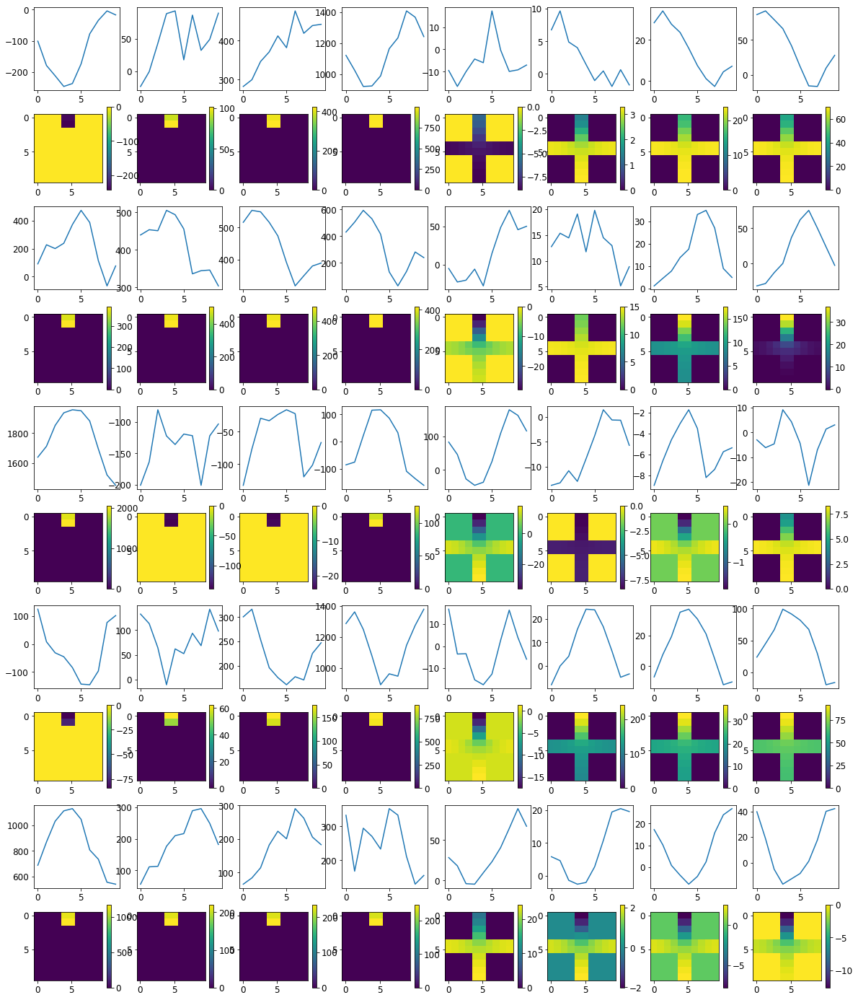


R0 generated:
[[11.53669   11.004159 ]
 [ 9.638645  11.509704 ]
 [ 9.495766  12.15296  ]
 [10.214135  11.31829  ]
 [11.900817  10.080245 ]
 [11.322173  10.735446 ]
 [11.819675  11.540406 ]
 [12.980576  11.22637  ]
 [12.269779  11.681636 ]
 [10.011376  12.014422 ]
 [12.960226  13.420942 ]
 [11.587555  13.283308 ]
 [13.482102  13.582001 ]
 [13.438893  14.853792 ]
 [13.952669  14.462261 ]
 [15.193784  15.255891 ]
 [14.840633  14.94784  ]
 [13.153246  15.007664 ]
 [14.109283  14.524323 ]
 [14.818803  14.286328 ]
 [ 5.990121   8.524888 ]
 [ 6.75307    8.462291 ]
 [ 6.557893   7.706405 ]
 [ 6.2190104  7.467398 ]
 [ 6.972031   7.8243704]
 [ 8.144077   8.456845 ]
 [ 7.476878   7.041275 ]
 [ 7.0640554  7.072566 ]
 [ 6.927546   7.7266383]
 [ 6.785987   7.283669 ]
 [18.756342  18.790977 ]
 [18.917728  18.809248 ]
 [19.080374  19.09782  ]
 [18.911982  19.218122 ]
 [18.822893  19.310371 ]
 [18.477026  19.39407  ]
 [18.76785   19.364712 ]
 [18.90608   19.387188 ]
 [19.081736  19.088442 ]
 [18.77203

/home/viluiz/anaconda3/envs/py3ml/lib/python3.7/site-packages/ipykernel_launcher.py:58: UserWarning: Data has no positive values, and therefore cannot be log-scaled.


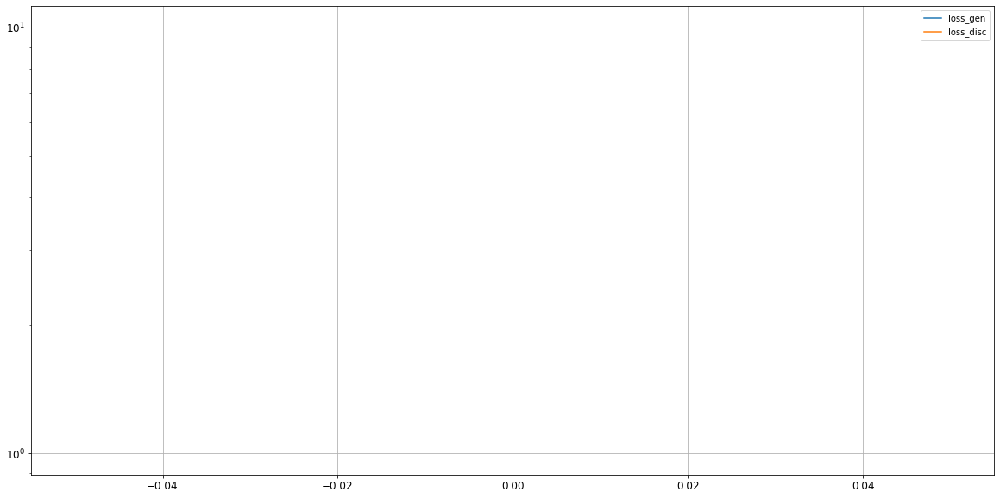

0: mean KL divergence (r,g) = 1.1015552487438531
0: mean JS divergence = 0.2712295075598871
0: mean 1-BC divergence = 0.2355322453973585

0: std KL divergence (r,g) = 0.7035360203410285
0: std JS divergence = 0.15834097085703006
0: std 1-BC divergence = 0.12571078128099333


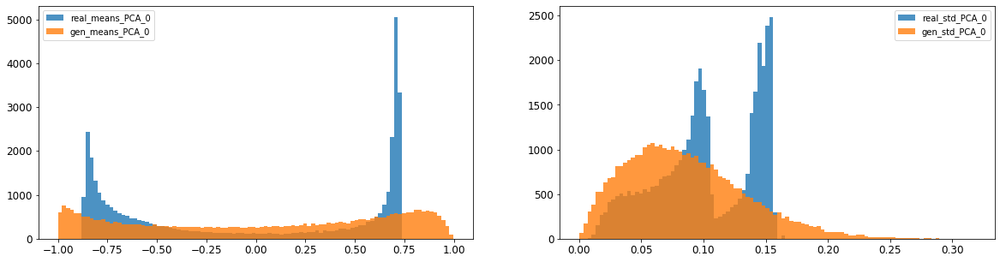

1: mean KL divergence (r,g) = 0.48701120041312523
1: mean JS divergence = 0.11156735479229006
1: mean 1-BC divergence = 0.08169984256341623

1: std KL divergence (r,g) = inf
1: std JS divergence = 0.1577886696066801
1: std 1-BC divergence = 0.12534830589152768


/home/viluiz/anaconda3/envs/py3ml/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


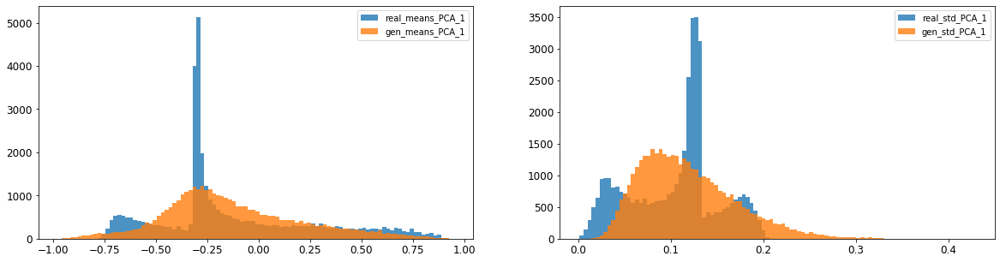

2: mean KL divergence (r,g) = 0.26288150465677784
2: mean JS divergence = 0.06462270055181632
2: mean 1-BC divergence = 0.046899606076015954

2: std KL divergence (r,g) = 1.760646143702846
2: std JS divergence = 0.4878477576610154
2: std 1-BC divergence = 0.443308903034084


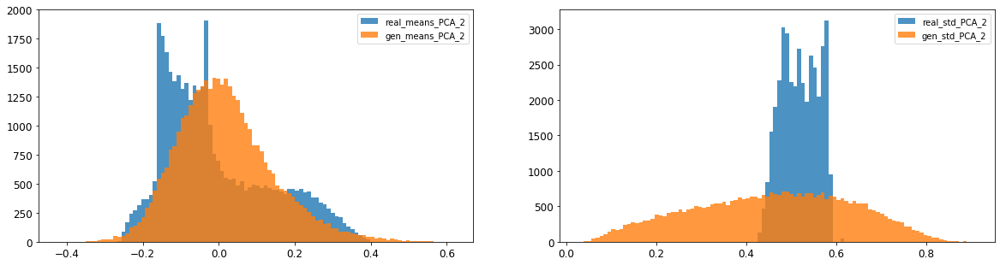

3: mean KL divergence (r,g) = 0.47621974478542545
3: mean JS divergence = 0.1022939768341906
3: mean 1-BC divergence = 0.07335538976546019

3: std KL divergence (r,g) = inf
3: std JS divergence = 0.3187315184653837
3: std 1-BC divergence = 0.28245897169062106


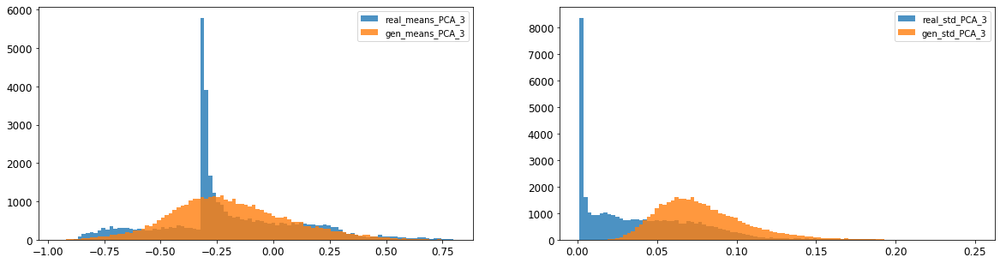

4: mean KL divergence (r,g) = 0.370317446567349
4: mean JS divergence = 0.10165308922925234
4: mean 1-BC divergence = 0.08728519317607775

4: std KL divergence (r,g) = inf
4: std JS divergence = 0.15585628153343856
4: std 1-BC divergence = 0.11665895050998454


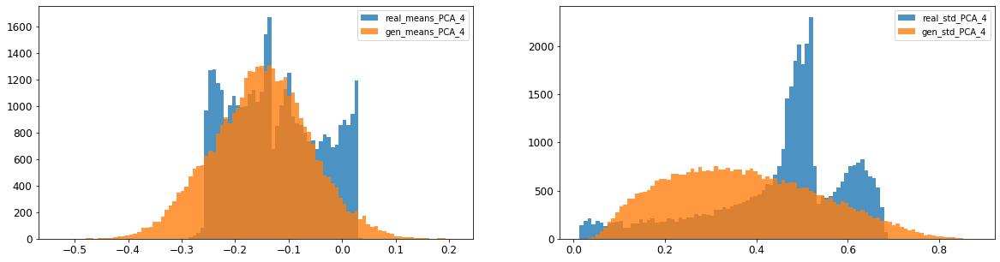

5: mean KL divergence (r,g) = 0.756138077553399
5: mean JS divergence = 0.19950006003818904
5: mean 1-BC divergence = 0.1680528365512236

5: std KL divergence (r,g) = 1.6572706283611234
5: std JS divergence = 0.3454380066582687
5: std 1-BC divergence = 0.26244280726705715


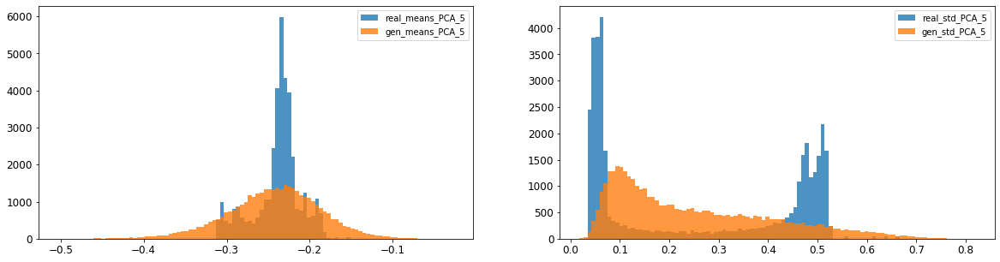

6: mean KL divergence (r,g) = 0.4963976030069141
6: mean JS divergence = 0.13440442776924513
6: mean 1-BC divergence = 0.10804415705513615

6: std KL divergence (r,g) = inf
6: std JS divergence = 0.2093044794453806
6: std 1-BC divergence = 0.16529061989752758


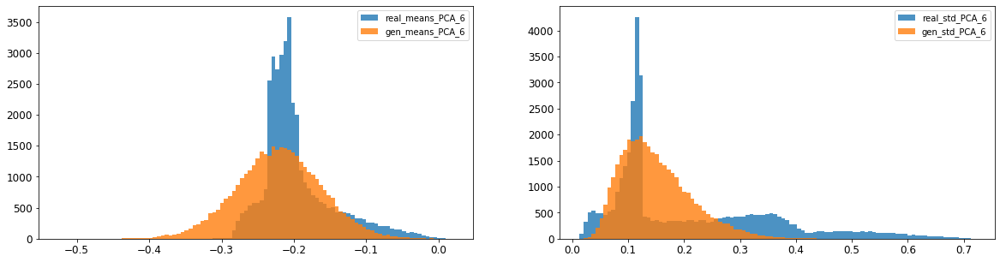

7: mean KL divergence (r,g) = 0.8505289832575857
7: mean JS divergence = 0.20997248224261628
7: mean 1-BC divergence = 0.16652406381239804

7: std KL divergence (r,g) = inf
7: std JS divergence = 0.3767216276701526
7: std 1-BC divergence = 0.28636916638926957


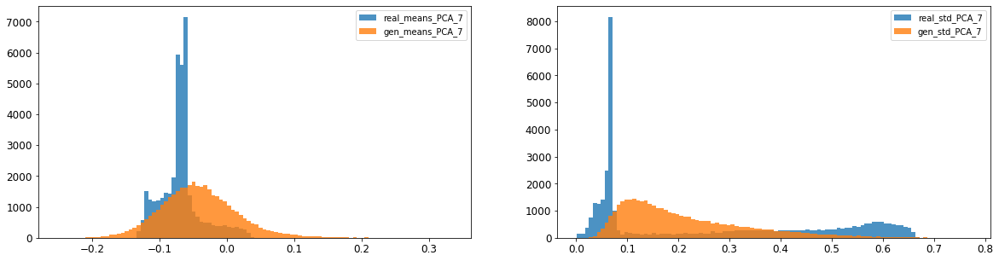

8: mean KL divergence (r,g) = 0.7206769779884059
8: mean JS divergence = 0.17211261271571593
8: mean 1-BC divergence = 0.12427735763674819

8: std KL divergence (r,g) = inf
8: std JS divergence = 0.2661446667149387
8: std 1-BC divergence = 0.21214297317737663


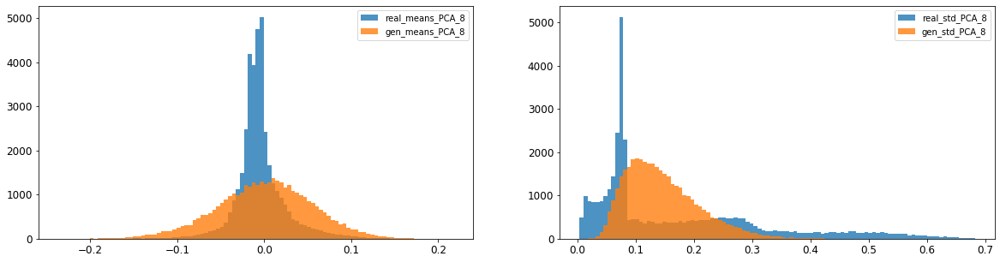

9: mean KL divergence (r,g) = inf
9: mean JS divergence = 0.08078417276866984
9: mean 1-BC divergence = 0.05807351351094381

9: std KL divergence (r,g) = inf
9: std JS divergence = 0.1582620713135221
9: std 1-BC divergence = 0.11816832838966185


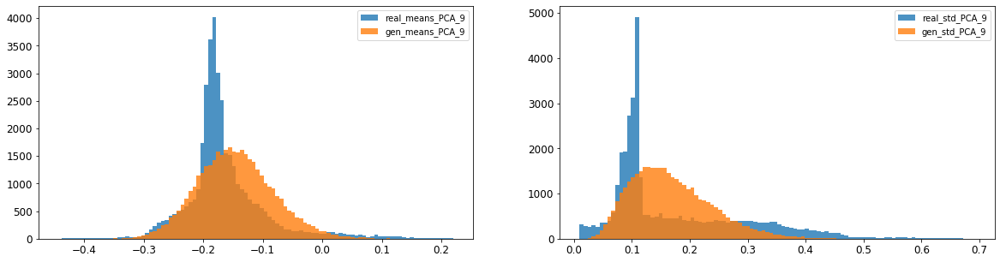

10: mean KL divergence (r,g) = 0.4598928365710775
10: mean JS divergence = 0.11928948519443641
10: mean 1-BC divergence = 0.08620744454687723

10: std KL divergence (r,g) = inf
10: std JS divergence = 0.31913649052255155
10: std 1-BC divergence = 0.24468790248284167


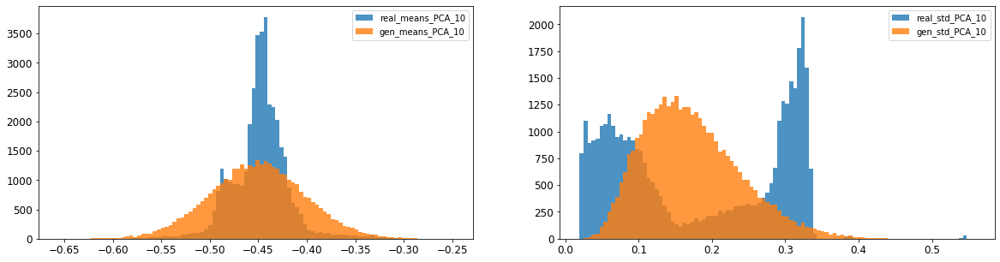

11: mean KL divergence (r,g) = 0.5566346459330035
11: mean JS divergence = 0.13070208611838352
11: mean 1-BC divergence = 0.09521194721250481

11: std KL divergence (r,g) = inf
11: std JS divergence = 0.5507254645542135
11: std 1-BC divergence = 0.45782498963807994


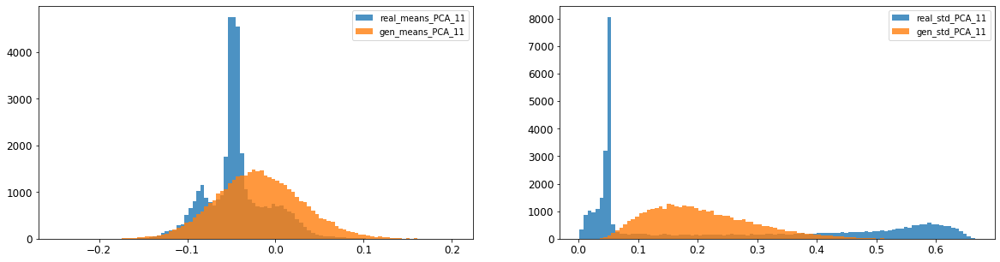

12: mean KL divergence (r,g) = inf
12: mean JS divergence = 0.1541757180403625
12: mean 1-BC divergence = 0.11047381434939174

12: std KL divergence (r,g) = inf
12: std JS divergence = 0.25765603224217104
12: std 1-BC divergence = 0.19783580506605136


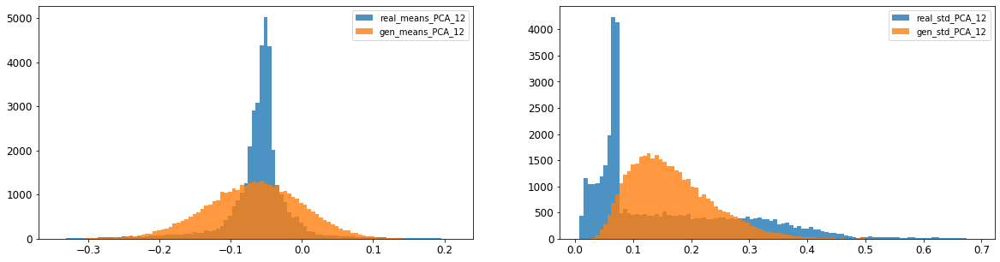

13: mean KL divergence (r,g) = inf
13: mean JS divergence = 0.2166416847137414
13: mean 1-BC divergence = 0.15867477609875225

13: std KL divergence (r,g) = inf
13: std JS divergence = 0.31045976056135616
13: std 1-BC divergence = 0.2541700274758142


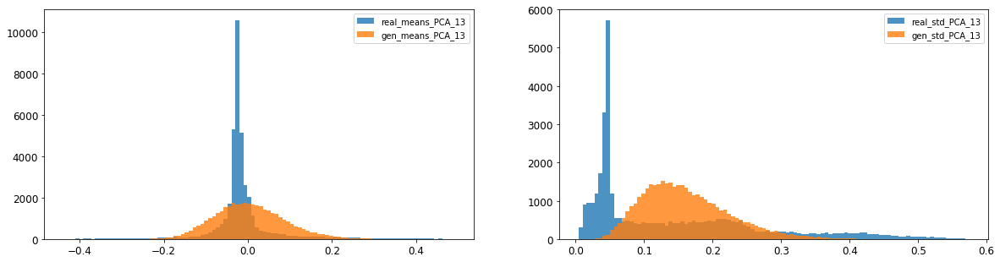

14: mean KL divergence (r,g) = inf
14: mean JS divergence = 0.21233996828041882
14: mean 1-BC divergence = 0.15623022767958517

14: std KL divergence (r,g) = inf
14: std JS divergence = 0.29444079956535035
14: std 1-BC divergence = 0.23506416124578233


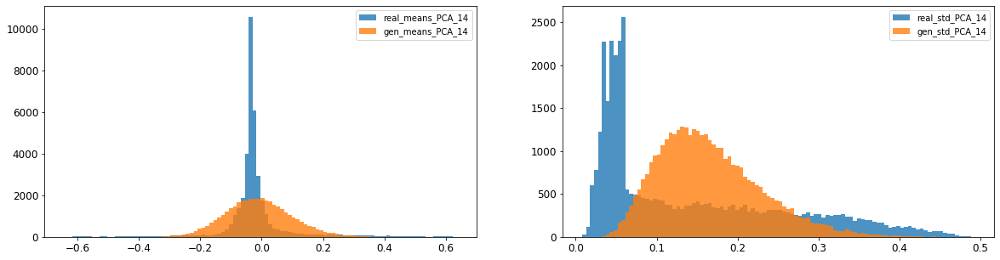

15: mean KL divergence (r,g) = 1.986971725336435
15: mean JS divergence = 0.5215745602041364
15: mean 1-BC divergence = 0.4770176823669311

15: std KL divergence (r,g) = 12.648357582009666
15: std JS divergence = 0.9989025572448216
15: std 1-BC divergence = 0.987519485592517


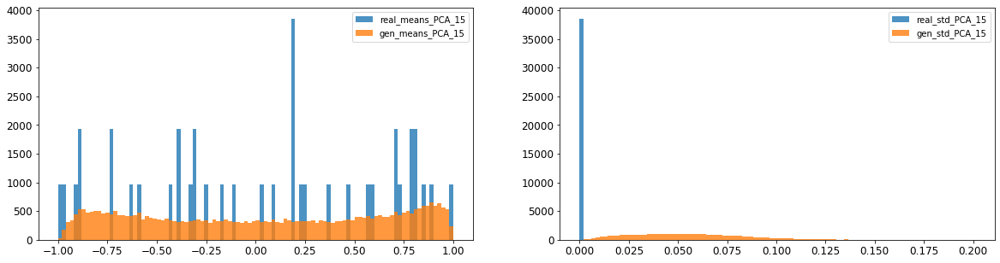

16: mean KL divergence (r,g) = 1.8078362890683422
16: mean JS divergence = 0.47902334619929504
16: mean 1-BC divergence = 0.43995585566626616

16: std KL divergence (r,g) = 12.425965160673218
16: std JS divergence = 0.9987398554133264
16: std 1-BC divergence = 0.9865195037237267


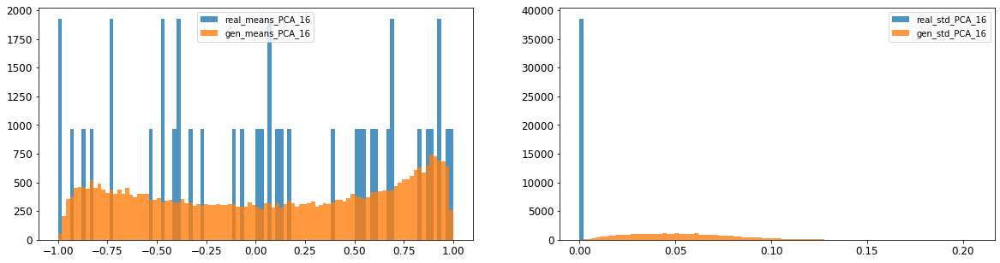

/home/viluiz/anaconda3/envs/py3ml/lib/python3.7/site-packages/ipykernel_launcher.py:164: UserWarning: Data has no positive values, and therefore cannot be log-scaled.




--------------------------------------------------------

Compose KL divergence (r,g) = inf
Compose JS divergence = 0.22160479747402226
Compose 1-BC divergence = 0.17613417029561873

Compose weighted KL divergence (r,g) = inf
Compose weighted JS divergence = 0.20172132440768284
Compose weighted 1-BC divergence = 0.16767853511080577

Multivariate KL divergence = 345.5006948912915


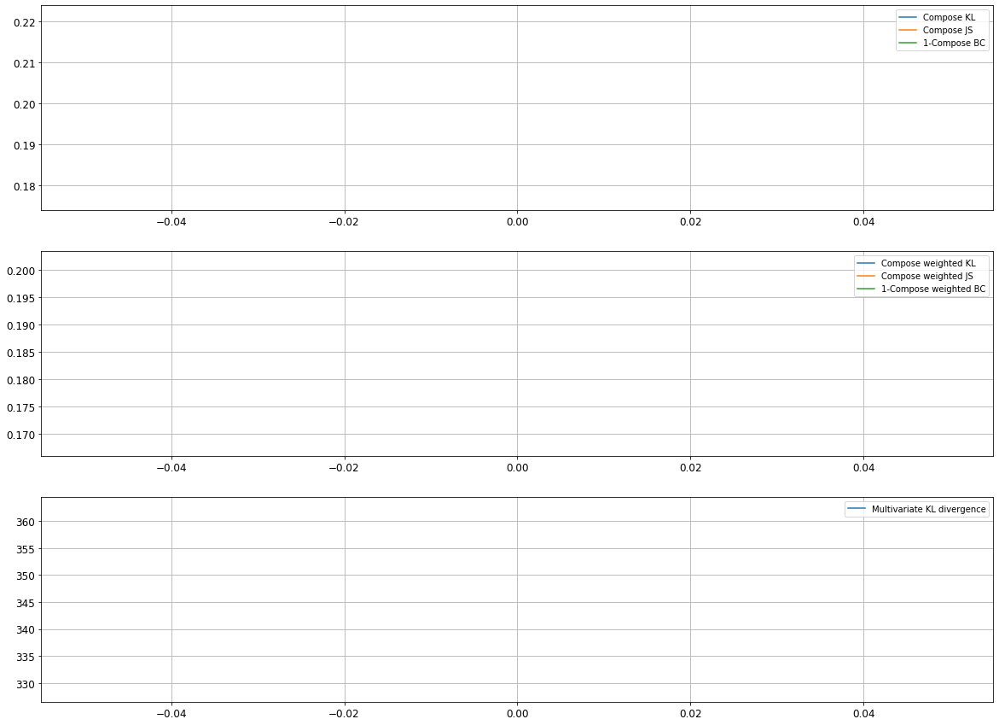

Epoch 2/10000
discriminator loss: -2.094468 - generator loss: 0.819571 - 118s
Epoch 3/10000
discriminator loss: -1.840280 - generator loss: 1.016805 - 121s
Epoch 4/10000
discriminator loss: -1.610392 - generator loss: 0.915425 - 121s
Epoch 5/10000
discriminator loss: -1.410856 - generator loss: 0.806583 - 124s
Epoch 6/10000
discriminator loss: -1.262806 - generator loss: 0.791698 - 125s
Epoch 7/10000
discriminator loss: -1.159755 - generator loss: 0.791255 - 124s
Epoch 8/10000
discriminator loss: -1.076223 - generator loss: 0.801911 - 122s
Epoch 9/10000
discriminator loss: -1.004678 - generator loss: 0.804663 - 121s
Epoch 10/10000
discriminator loss: -0.941713 - generator loss: 0.798343 - 121s
Epoch 11/10000
discriminator loss: -0.884181 - generator loss: 0.854279 - 119s
Epoch 12/10000
discriminator loss: -0.831310 - generator loss: 0.903500 - 117s
Epoch 13/10000
discriminator loss: -0.781006 - generator loss: 0.946240 - 117s
Epoch 14/10000
discriminator loss: -0.735996 - generator los

discriminator loss: -0.266962 - generator loss: 18.159197 - 118s
Epoch 106/10000
discriminator loss: -0.267403 - generator loss: 18.318073 - 118s
Epoch 107/10000
discriminator loss: -0.262703 - generator loss: 18.451790 - 118s
Epoch 108/10000
discriminator loss: -0.264245 - generator loss: 18.659071 - 118s
Epoch 109/10000
discriminator loss: -0.263977 - generator loss: 18.823692 - 119s
Epoch 110/10000
discriminator loss: -0.262194 - generator loss: 18.974140 - 118s
Epoch 111/10000
discriminator loss: -0.262220 - generator loss: 19.101002 - 119s
Epoch 112/10000
discriminator loss: -0.260822 - generator loss: 19.350210 - 118s
Epoch 113/10000
discriminator loss: -0.259959 - generator loss: 19.552608 - 118s
Epoch 114/10000
discriminator loss: -0.259062 - generator loss: 19.729036 - 119s
Epoch 115/10000
discriminator loss: -0.256398 - generator loss: 19.901245 - 119s
Epoch 116/10000
discriminator loss: -0.258521 - generator loss: 20.014034 - 119s
Epoch 117/10000
discriminator loss: -0.25527

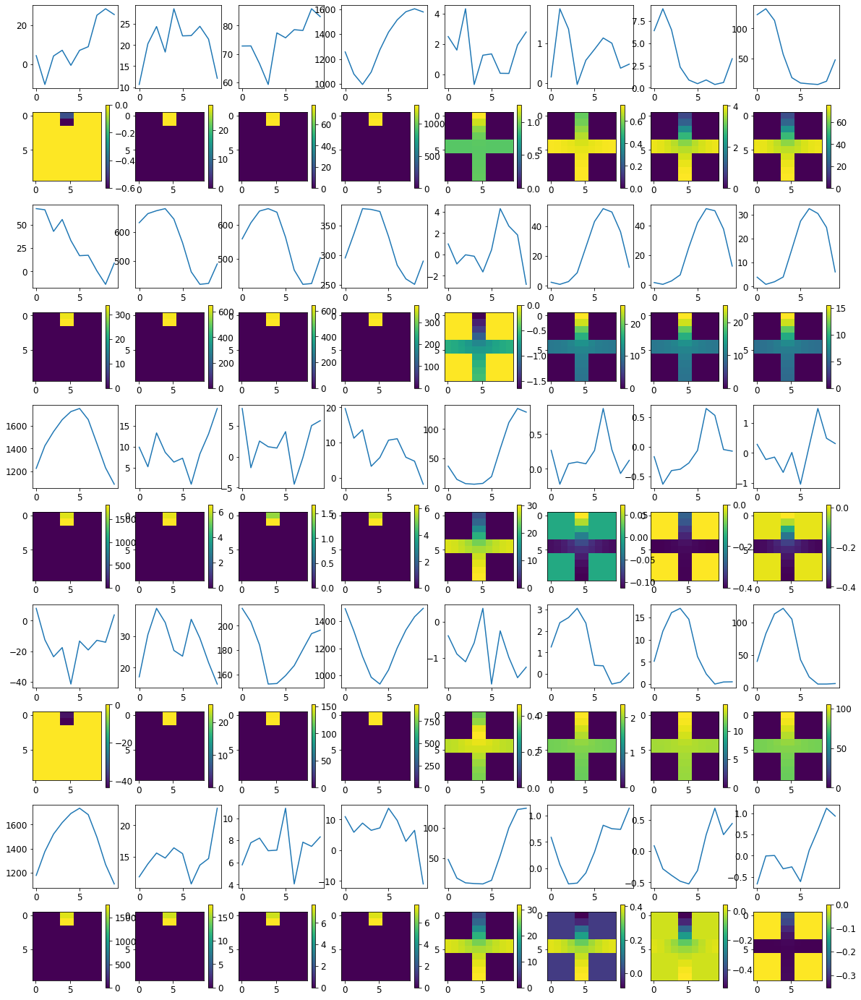


R0 generated:
[[18.664242  10.016539 ]
 [18.745895   9.900601 ]
 [18.788805   9.745983 ]
 [18.852808   9.769544 ]
 [18.725452   9.734185 ]
 [18.712545  10.088701 ]
 [18.673044  10.331842 ]
 [18.748352  10.237713 ]
 [18.748266  10.529225 ]
 [18.769182  10.372651 ]
 [18.109512  18.04476  ]
 [18.351694  17.740847 ]
 [18.312258  17.842052 ]
 [18.4672    17.858578 ]
 [18.500309  17.771732 ]
 [18.46994   17.919329 ]
 [18.414888  18.016607 ]
 [18.505217  18.065115 ]
 [18.121517  17.809536 ]
 [18.28823   17.716164 ]
 [ 3.9671493  1.2341584]
 [ 4.118584   1.2868317]
 [ 4.3330846  1.246109 ]
 [ 4.0947595  1.1313032]
 [ 4.323742   1.1952602]
 [ 4.045297   1.0624219]
 [ 4.262576   1.3362292]
 [ 4.06323    1.1327826]
 [ 4.2121935  1.4024999]
 [ 4.076204   1.383303 ]
 [17.887121   9.046916 ]
 [18.084679   8.527656 ]
 [18.203438   8.99908  ]
 [18.153004   9.131654 ]
 [18.191883   9.067718 ]
 [18.240261   9.16802  ]
 [18.143612   9.04427  ]
 [18.220837   9.176643 ]
 [18.370413   9.12604  ]
 [18.15888

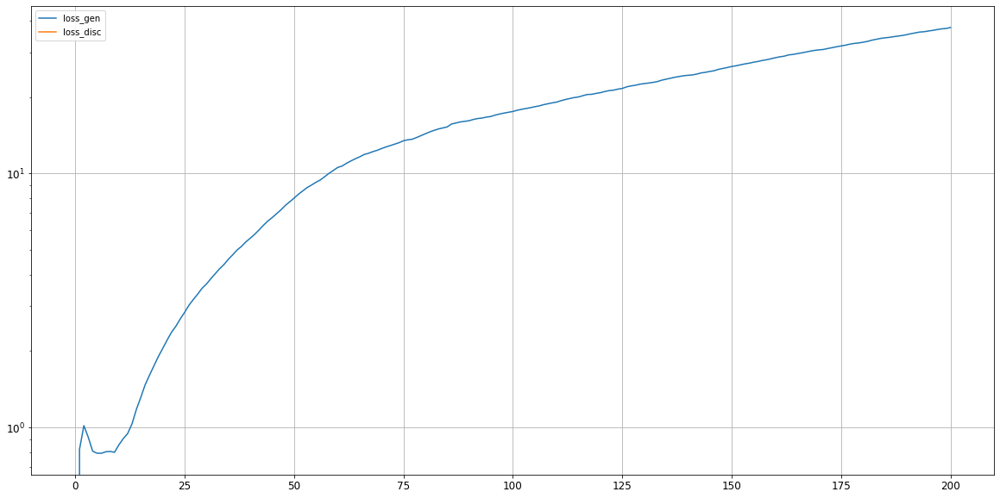

0: mean KL divergence (r,g) = 0.1473395978834426
0: mean JS divergence = 0.03329019227957679
0: mean 1-BC divergence = 0.024753722112994203

0: std KL divergence (r,g) = 0.16584042772873764
0: std JS divergence = 0.04874719351076056
0: std 1-BC divergence = 0.04333122669557932


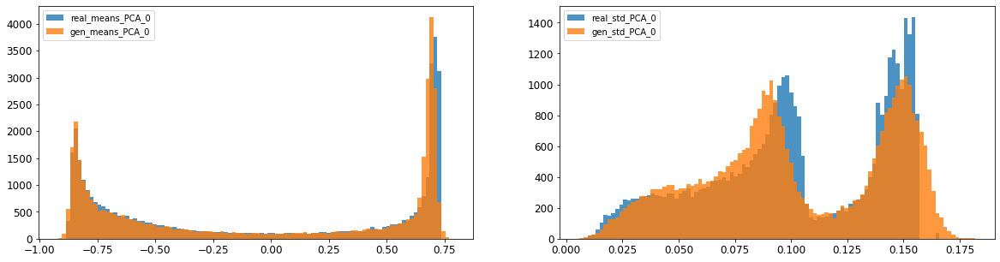

1: mean KL divergence (r,g) = 0.0725207858074386
1: mean JS divergence = 0.016951122086665875
1: mean 1-BC divergence = 0.012026731649835143

1: std KL divergence (r,g) = inf
1: std JS divergence = 0.03574847782898658
1: std 1-BC divergence = 0.026212392123982853


/home/viluiz/anaconda3/envs/py3ml/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


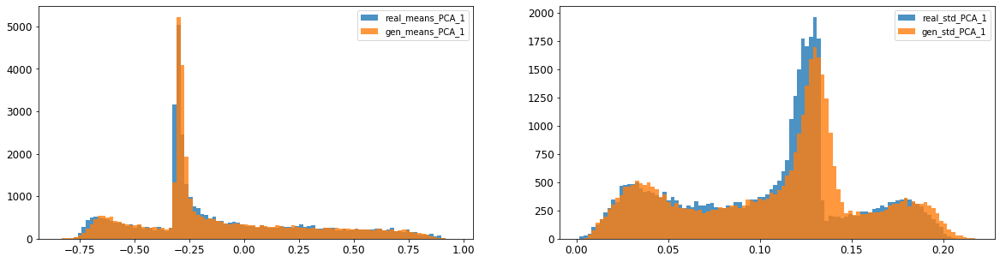

2: mean KL divergence (r,g) = 0.026279353669128848
2: mean JS divergence = 0.006806002070635758
2: mean 1-BC divergence = 0.005270930942907315

2: std KL divergence (r,g) = 0.07718732072379868
2: std JS divergence = 0.023904780996593718
2: std 1-BC divergence = 0.021792717686478835


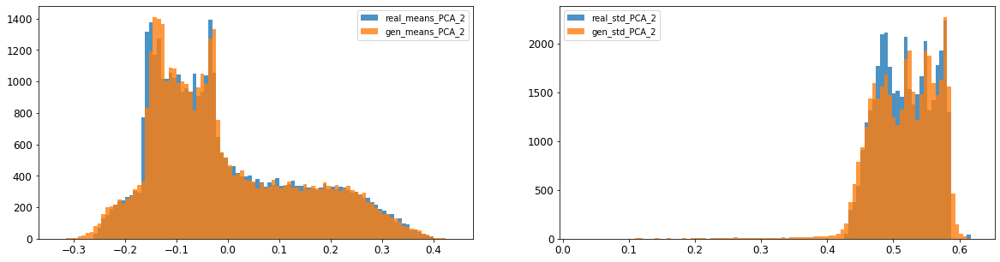

3: mean KL divergence (r,g) = 0.8355000018558202
3: mean JS divergence = 0.13752625531896975
3: mean 1-BC divergence = 0.10526981071461061

3: std KL divergence (r,g) = inf
3: std JS divergence = 0.14935066940013053
3: std 1-BC divergence = 0.12605583338704918


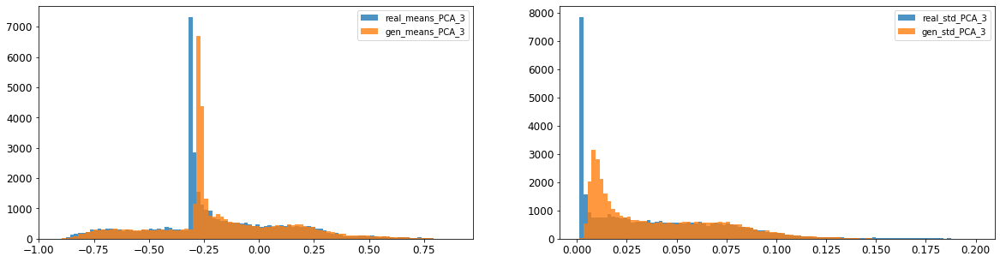

4: mean KL divergence (r,g) = 0.09064698715189315
4: mean JS divergence = 0.025963967025923254
4: mean 1-BC divergence = 0.02214517850599329

4: std KL divergence (r,g) = 0.03056191253073336
4: std JS divergence = 0.007624883234274476
4: std 1-BC divergence = 0.005550709704991497


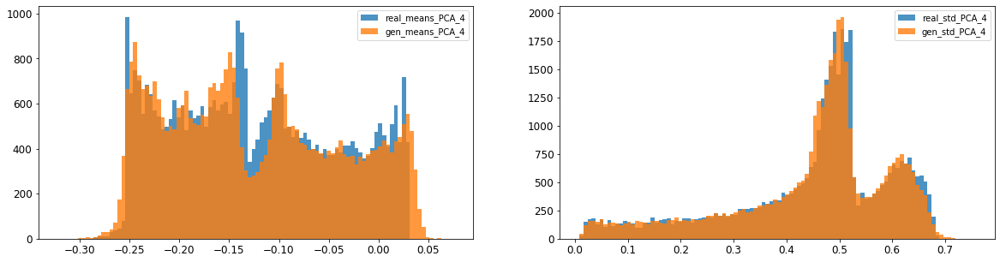

5: mean KL divergence (r,g) = inf
5: mean JS divergence = 0.024387321929935576
5: mean 1-BC divergence = 0.017511897650732577

5: std KL divergence (r,g) = inf
5: std JS divergence = 0.037599525436775
5: std 1-BC divergence = 0.03186687451113801


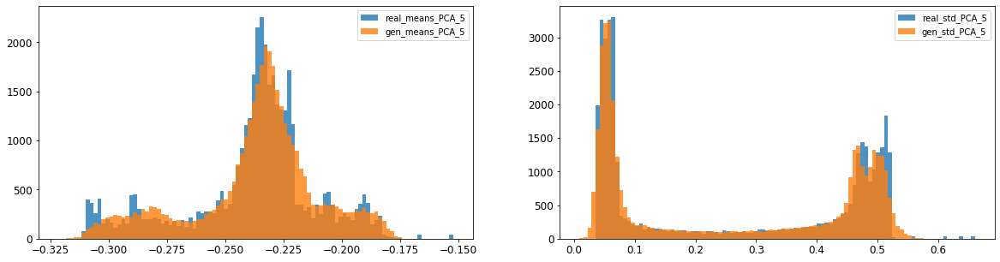

6: mean KL divergence (r,g) = inf
6: mean JS divergence = 0.006744355559481315
6: mean 1-BC divergence = 0.004814503282999483

6: std KL divergence (r,g) = inf
6: std JS divergence = 0.00940771959884509
6: std 1-BC divergence = 0.006656083134535473


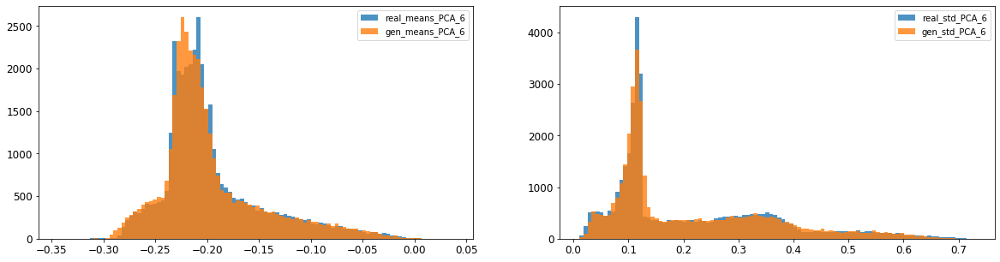

7: mean KL divergence (r,g) = inf
7: mean JS divergence = 0.039243358919241286
7: mean 1-BC divergence = 0.03350878436723048

7: std KL divergence (r,g) = inf
7: std JS divergence = 0.032526252585316745
7: std 1-BC divergence = 0.024072766055850403


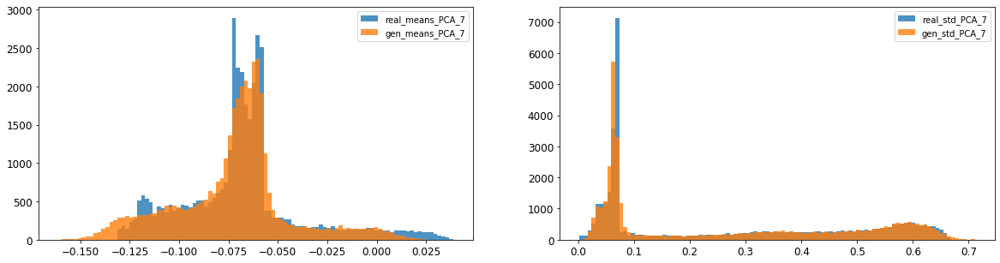

8: mean KL divergence (r,g) = inf
8: mean JS divergence = 0.051166631607565495
8: mean 1-BC divergence = 0.03611315463541653

8: std KL divergence (r,g) = 0.06931456768315677
8: std JS divergence = 0.016711558868151757
8: std 1-BC divergence = 0.01175734860435218


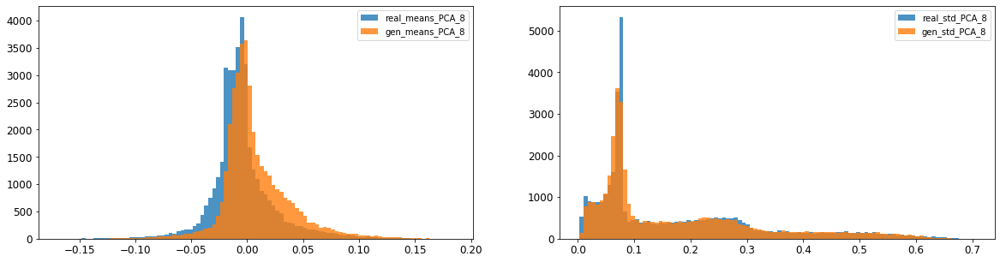

9: mean KL divergence (r,g) = 0.027589688324139907
9: mean JS divergence = 0.0071730369809731255
9: mean 1-BC divergence = 0.005080190230288939

9: std KL divergence (r,g) = 0.06945576742918616
9: std JS divergence = 0.017094945890306818
9: std 1-BC divergence = 0.011992767463346876


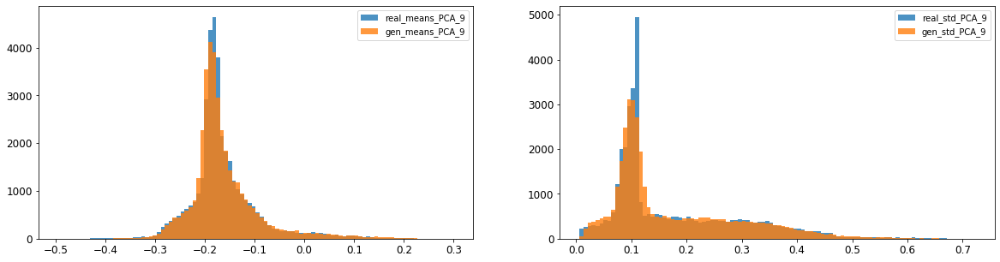

10: mean KL divergence (r,g) = 0.07262983804889284
10: mean JS divergence = 0.018243424986210934
10: mean 1-BC divergence = 0.012858662934748466

10: std KL divergence (r,g) = inf
10: std JS divergence = 0.020139595592089325
10: std 1-BC divergence = 0.016973897854536957


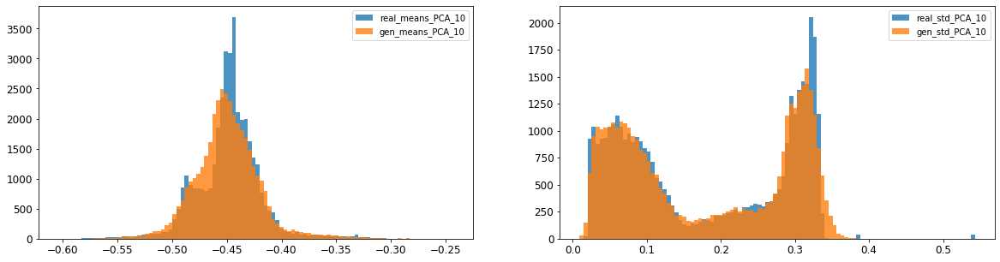

11: mean KL divergence (r,g) = 0.09918867782832534
11: mean JS divergence = 0.025355074591595687
11: mean 1-BC divergence = 0.018050269563039234

11: std KL divergence (r,g) = 0.06863103549076575
11: std JS divergence = 0.016265051025502866
11: std 1-BC divergence = 0.011831708119440787


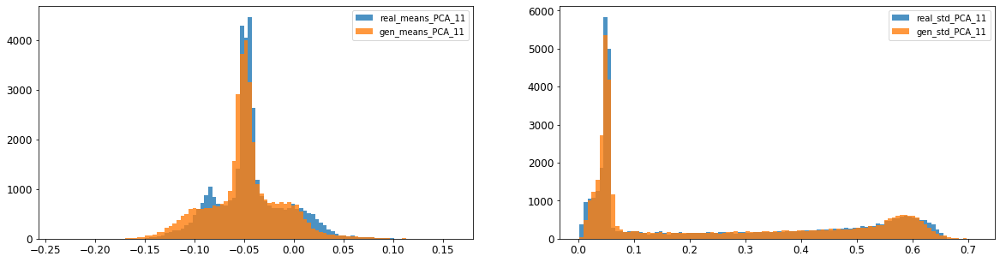

12: mean KL divergence (r,g) = 0.18477175305280466
12: mean JS divergence = 0.04644157471022733
12: mean 1-BC divergence = 0.03275003963211265

12: std KL divergence (r,g) = 0.10836189953827674
12: std JS divergence = 0.02488332981105512
12: std 1-BC divergence = 0.017480422903994763


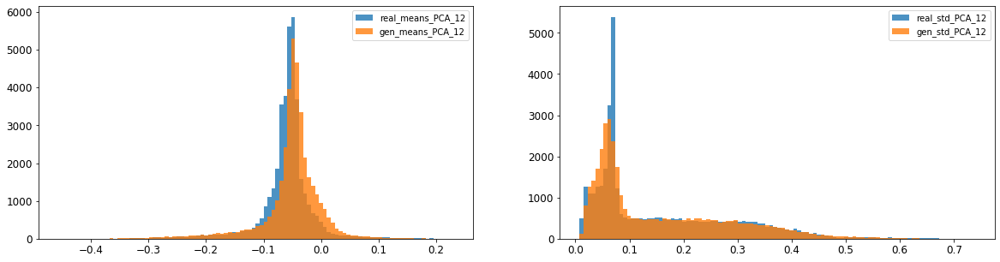

13: mean KL divergence (r,g) = 0.057614334193675065
13: mean JS divergence = 0.014804422169506797
13: mean 1-BC divergence = 0.01049962464512022

13: std KL divergence (r,g) = 0.08832648480903721
13: std JS divergence = 0.021607491502734857
13: std 1-BC divergence = 0.015174007060717032


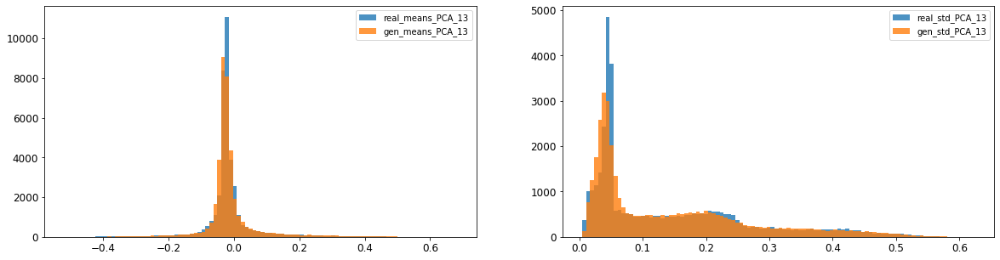

14: mean KL divergence (r,g) = 0.13547886073938065
14: mean JS divergence = 0.03523307455372442
14: mean 1-BC divergence = 0.02482871594093894

14: std KL divergence (r,g) = 0.03969882555788989
14: std JS divergence = 0.009994772028247252
14: std 1-BC divergence = 0.007150264568450582


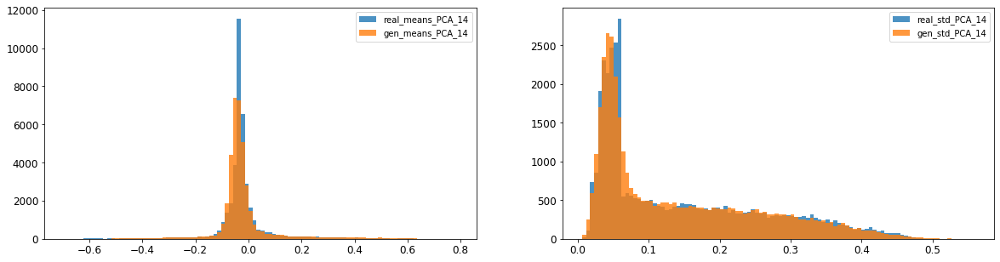

15: mean KL divergence (r,g) = 1.72500615414078
15: mean JS divergence = 0.4688858813148131
15: mean 1-BC divergence = 0.42886853921283297

15: std KL divergence (r,g) = 9.16723089227305
15: std JS divergence = 0.9907716893509448
15: std 1-BC divergence = 0.9582944107030182


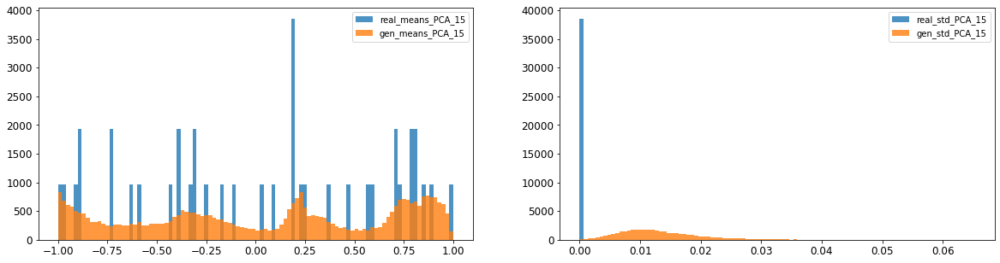

16: mean KL divergence (r,g) = 1.4190239799207724
16: mean JS divergence = 0.402241189578523
16: mean 1-BC divergence = 0.3706554572428292

16: std KL divergence (r,g) = 5.250326508036512
16: std JS divergence = 0.9118334536561885
16: std 1-BC divergence = 0.8379133982743103


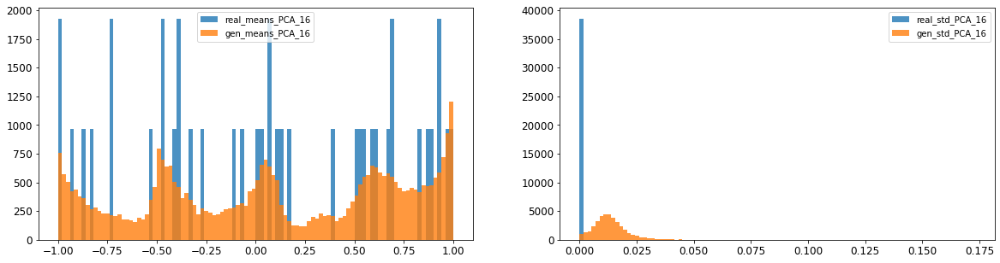



--------------------------------------------------------

Compose KL divergence (r,g) = inf
Compose JS divergence = 0.03203120207000013
Compose 1-BC divergence = 0.024779374556113565

Compose weighted KL divergence (r,g) = inf
Compose weighted JS divergence = 0.03885932195210356
Compose weighted 1-BC divergence = 0.031499830349480784

Multivariate KL divergence = 80.40526246905151


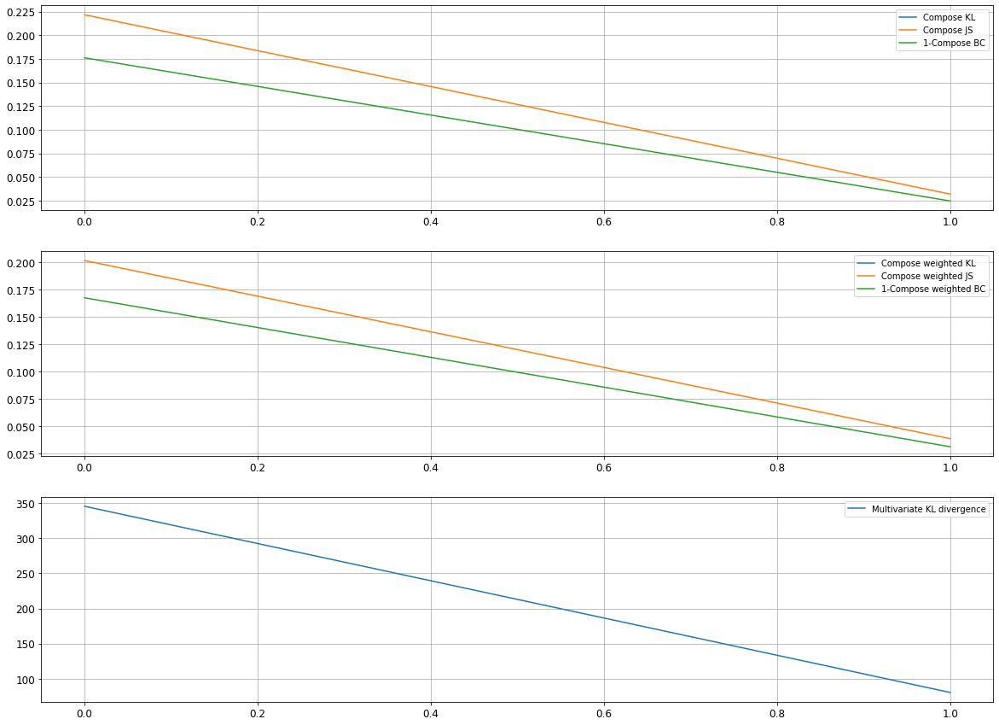

Epoch 202/10000
discriminator loss: -0.208398 - generator loss: 37.872093 - 117s
Epoch 203/10000
discriminator loss: -0.204412 - generator loss: 38.067043 - 118s
Epoch 204/10000
discriminator loss: -0.205141 - generator loss: 38.291218 - 117s
Epoch 205/10000
discriminator loss: -0.206961 - generator loss: 38.519032 - 117s
Epoch 206/10000
discriminator loss: -0.205792 - generator loss: 38.643871 - 117s
Epoch 207/10000
discriminator loss: -0.203762 - generator loss: 38.905704 - 117s
Epoch 208/10000
discriminator loss: -0.204187 - generator loss: 39.101597 - 118s
Epoch 209/10000
discriminator loss: -0.204489 - generator loss: 39.229874 - 117s
Epoch 210/10000
discriminator loss: -0.205343 - generator loss: 39.390633 - 117s
Epoch 211/10000
discriminator loss: -0.200563 - generator loss: 39.629955 - 117s
Epoch 212/10000
discriminator loss: -0.200275 - generator loss: 39.773651 - 117s
Epoch 213/10000
discriminator loss: -0.202295 - generator loss: 39.984146 - 117s
Epoch 214/10000
discriminato

discriminator loss: -0.182770 - generator loss: 60.057003 - 118s
Epoch 304/10000
discriminator loss: -0.179451 - generator loss: 60.346851 - 118s
Epoch 305/10000
discriminator loss: -0.181503 - generator loss: 60.542633 - 118s
Epoch 306/10000
discriminator loss: -0.182240 - generator loss: 60.747566 - 118s
Epoch 307/10000
discriminator loss: -0.179859 - generator loss: 60.871891 - 119s
Epoch 308/10000
discriminator loss: -0.180216 - generator loss: 61.108173 - 118s
Epoch 309/10000
discriminator loss: -0.181606 - generator loss: 61.180485 - 119s
Epoch 310/10000
discriminator loss: -0.181630 - generator loss: 61.324207 - 119s
Epoch 311/10000
discriminator loss: -0.178655 - generator loss: 61.593758 - 120s
Epoch 312/10000
discriminator loss: -0.179313 - generator loss: 61.757629 - 118s
Epoch 313/10000
discriminator loss: -0.180162 - generator loss: 61.986431 - 117s
Epoch 314/10000
discriminator loss: -0.179770 - generator loss: 62.151642 - 117s
Epoch 315/10000
discriminator loss: -0.17951

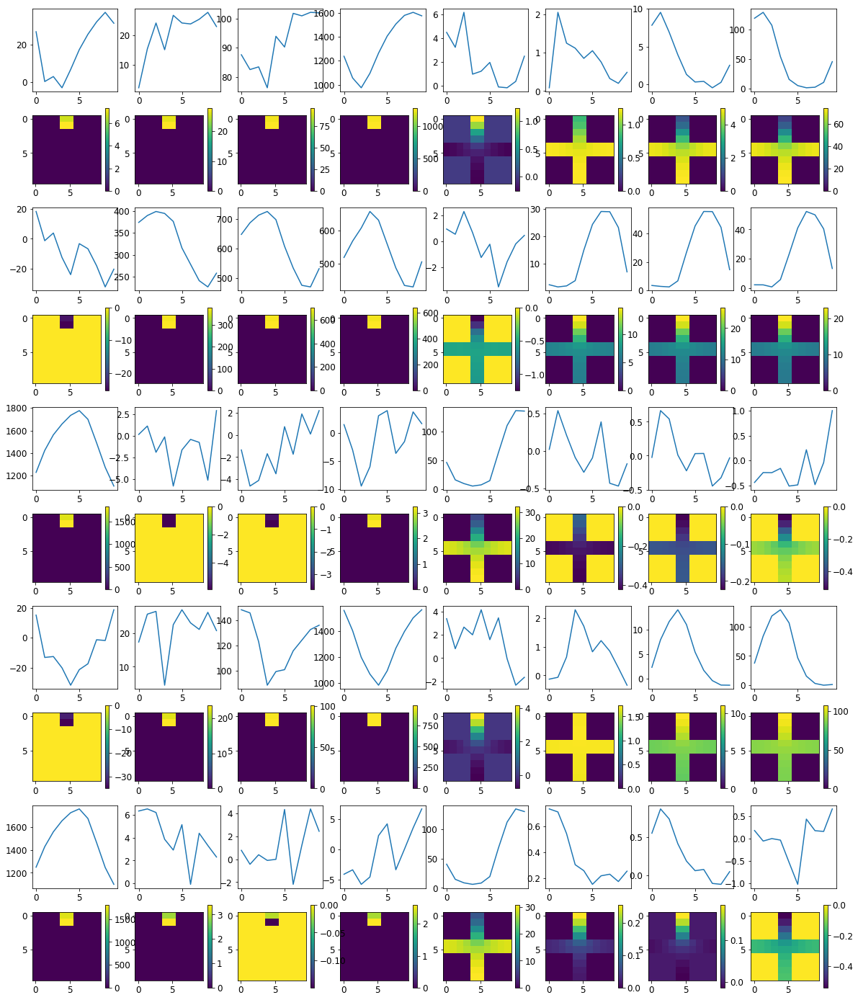


R0 generated:
[[18.113884  14.409203 ]
 [17.879692  14.496328 ]
 [17.712334  14.5603485]
 [17.807993  14.35243  ]
 [17.751192  14.8281555]
 [17.709028  14.468051 ]
 [17.62595   14.546415 ]
 [17.764101  14.050149 ]
 [17.993519  14.26913  ]
 [17.99019   14.169385 ]
 [14.447194  19.684864 ]
 [14.501133  19.656599 ]
 [14.589026  19.672949 ]
 [15.09027   19.660341 ]
 [14.688899  19.66414  ]
 [15.084222  19.657598 ]
 [14.734683  19.670408 ]
 [15.03568   19.655916 ]
 [14.607283  19.642862 ]
 [15.016881  19.623539 ]
 [ 3.5938077  1.0407888]
 [ 3.652416   1.0204059]
 [ 3.8203392  1.0194631]
 [ 3.8269916  1.0063128]
 [ 3.63846    0.9941721]
 [ 3.7097018  0.998834 ]
 [ 3.775411   1.0514042]
 [ 3.7565317  1.0238631]
 [ 3.6481636  1.108796 ]
 [ 3.5926383  1.0955824]
 [14.768109   6.18041  ]
 [14.409905   6.269985 ]
 [14.308865   6.1687512]
 [13.976868   5.9857225]
 [14.106581   6.057841 ]
 [14.201182   5.938447 ]
 [14.263812   6.0993023]
 [14.357753   5.866845 ]
 [14.2667465  5.6340756]
 [14.26992

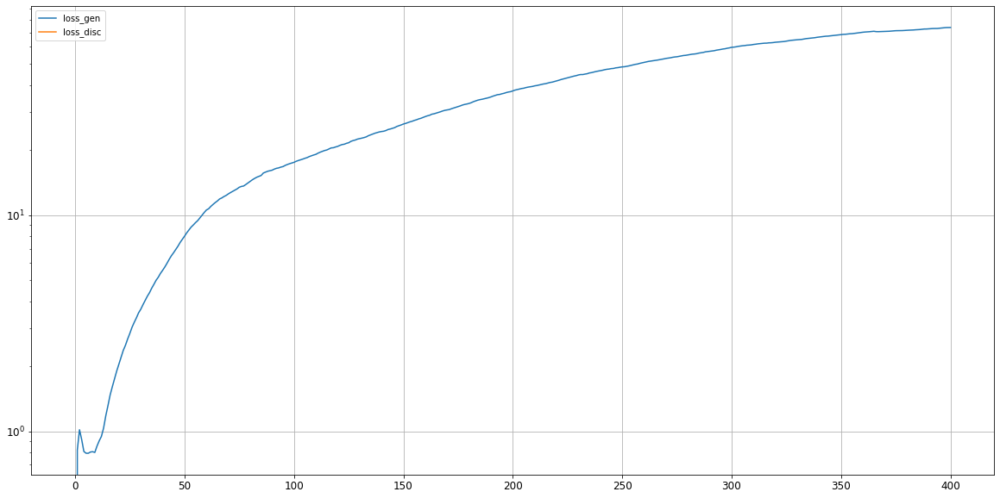

0: mean KL divergence (r,g) = 0.024308178785350652
0: mean JS divergence = 0.00713577387700765
0: mean 1-BC divergence = 0.005503032360768656

0: std KL divergence (r,g) = inf
0: std JS divergence = 0.029663095844603523
0: std 1-BC divergence = 0.024196857815347528


/home/viluiz/anaconda3/envs/py3ml/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


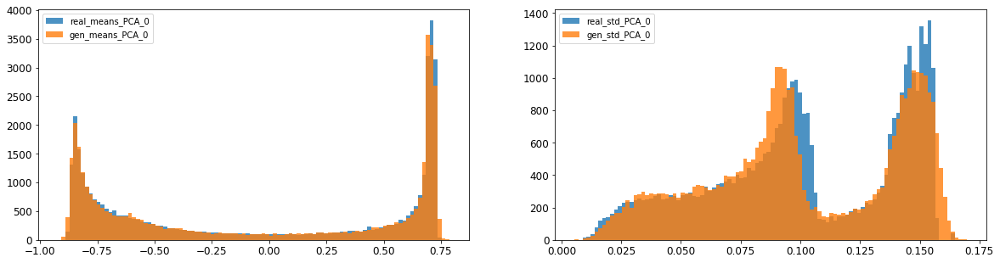

1: mean KL divergence (r,g) = 0.021499576026928226
1: mean JS divergence = 0.005540771526997255
1: mean 1-BC divergence = 0.00407007226010514

1: std KL divergence (r,g) = inf
1: std JS divergence = 0.008776325405973312
1: std 1-BC divergence = 0.006543806305662758


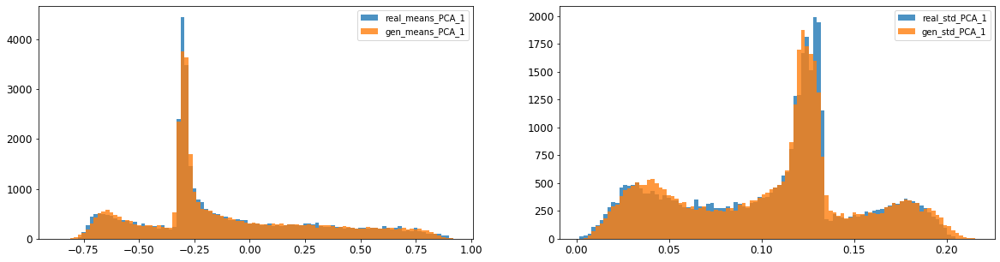

2: mean KL divergence (r,g) = inf
2: mean JS divergence = 0.004325504768864891
2: mean 1-BC divergence = 0.0030526544062240424

2: std KL divergence (r,g) = inf
2: std JS divergence = 0.022671464359292397
2: std 1-BC divergence = 0.017943273218867906


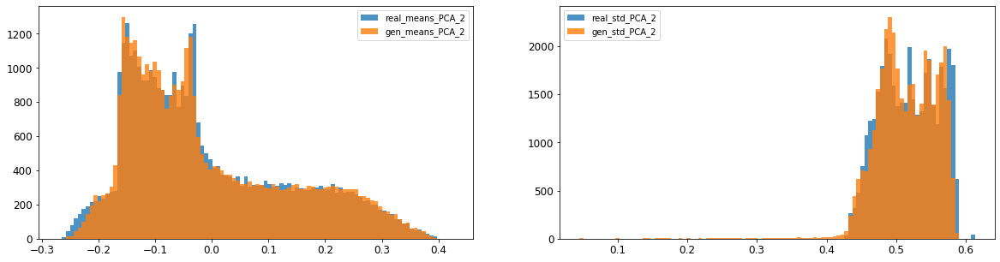

3: mean KL divergence (r,g) = 0.03720898448442426
3: mean JS divergence = 0.010038489808485575
3: mean 1-BC divergence = 0.007165078881269604

3: std KL divergence (r,g) = inf
3: std JS divergence = 0.12195386457032881
3: std 1-BC divergence = 0.09545748018981048


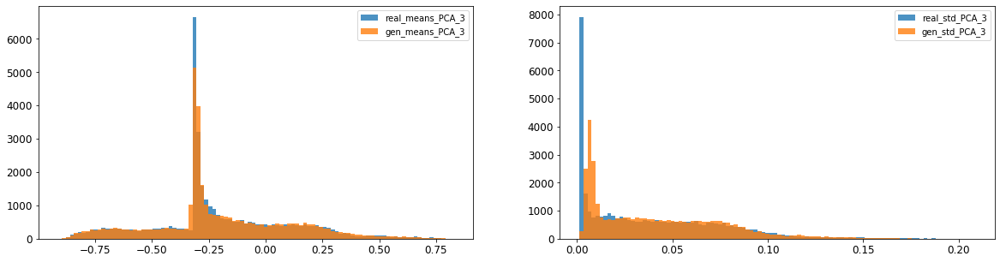

4: mean KL divergence (r,g) = 0.0523710644213541
4: mean JS divergence = 0.01177811339772357
4: mean 1-BC divergence = 0.008421234959936297

4: std KL divergence (r,g) = 0.03256395795245674
4: std JS divergence = 0.008132240682302824
4: std 1-BC divergence = 0.006046316668805396


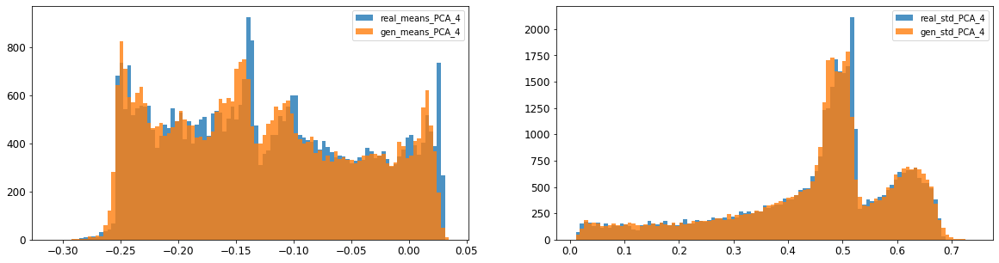

5: mean KL divergence (r,g) = inf
5: mean JS divergence = 0.09008112969029308
5: mean 1-BC divergence = 0.06453680025960806

5: std KL divergence (r,g) = inf
5: std JS divergence = 0.024554598827697678
5: std 1-BC divergence = 0.020261511336244098


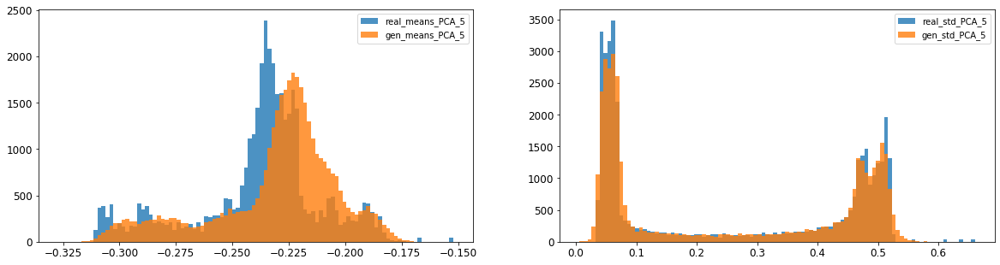

6: mean KL divergence (r,g) = inf
6: mean JS divergence = 0.012233505882879527
6: mean 1-BC divergence = 0.008592310476763454

6: std KL divergence (r,g) = 0.023430463866275765
6: std JS divergence = 0.005899742586957154
6: std 1-BC divergence = 0.004114247664685267


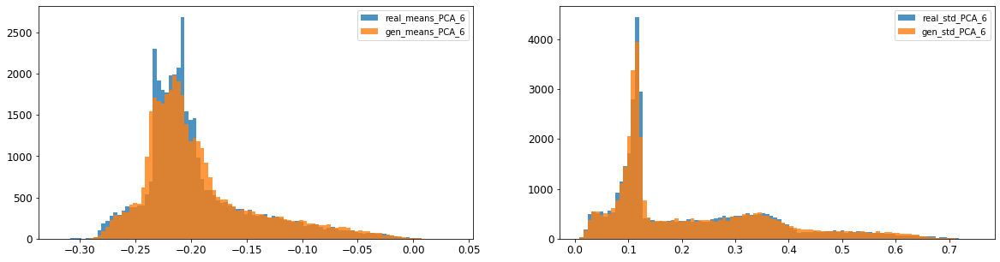

7: mean KL divergence (r,g) = 0.1863715646621155
7: mean JS divergence = 0.04594215087201875
7: mean 1-BC divergence = 0.034913958579113835

7: std KL divergence (r,g) = 0.0939122249757448
7: std JS divergence = 0.022342526005651245
7: std 1-BC divergence = 0.016511494127110837


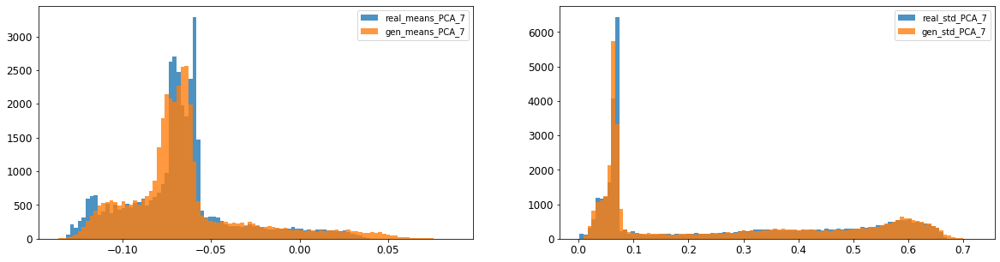

8: mean KL divergence (r,g) = inf
8: mean JS divergence = 0.006875446466061757
8: mean 1-BC divergence = 0.00481267556612841

8: std KL divergence (r,g) = inf
8: std JS divergence = 0.022592406261493232
8: std 1-BC divergence = 0.01607445521251638


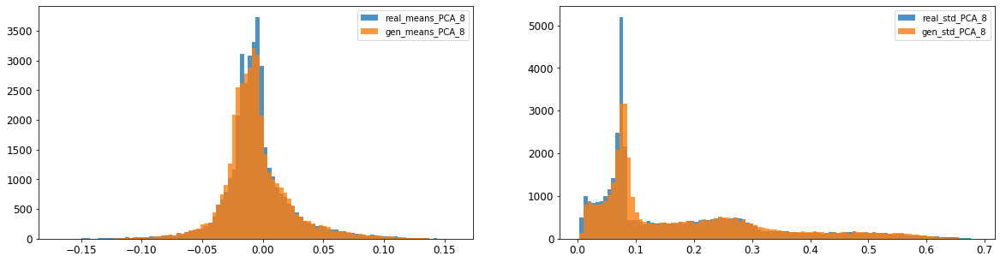

9: mean KL divergence (r,g) = inf
9: mean JS divergence = 0.007195492454440218
9: mean 1-BC divergence = 0.005080917447711331

9: std KL divergence (r,g) = inf
9: std JS divergence = 0.00800253998004019
9: std 1-BC divergence = 0.005595604751460592


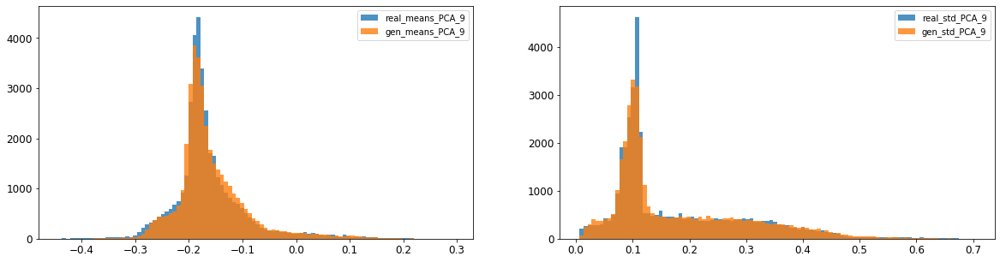

10: mean KL divergence (r,g) = 0.06064733581931873
10: mean JS divergence = 0.014738592033495878
10: mean 1-BC divergence = 0.010303306940453894

10: std KL divergence (r,g) = inf
10: std JS divergence = 0.013652497321994191
10: std 1-BC divergence = 0.011432289955981001


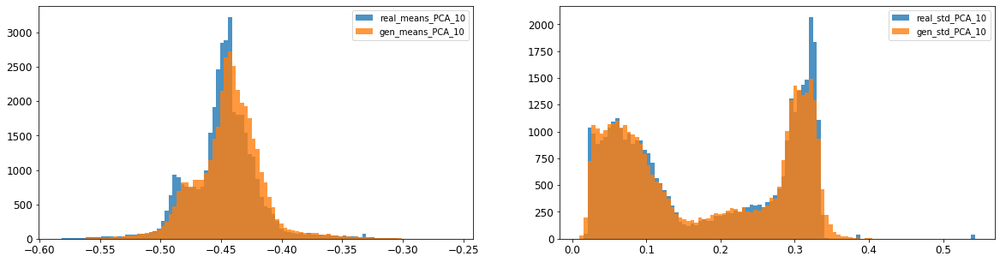

11: mean KL divergence (r,g) = 0.12066314088176087
11: mean JS divergence = 0.030038599159668326
11: mean 1-BC divergence = 0.021263923846833288

11: std KL divergence (r,g) = 0.057124065659559166
11: std JS divergence = 0.014504337945153163
11: std 1-BC divergence = 0.010561134004865913


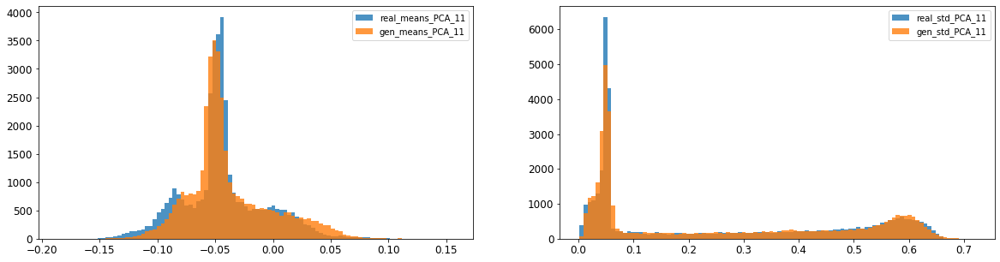

12: mean KL divergence (r,g) = 0.11985925092383956
12: mean JS divergence = 0.029709224091840725
12: mean 1-BC divergence = 0.02077881177055152

12: std KL divergence (r,g) = 0.07525012028236344
12: std JS divergence = 0.018535736017318363
12: std 1-BC divergence = 0.012950299729915571


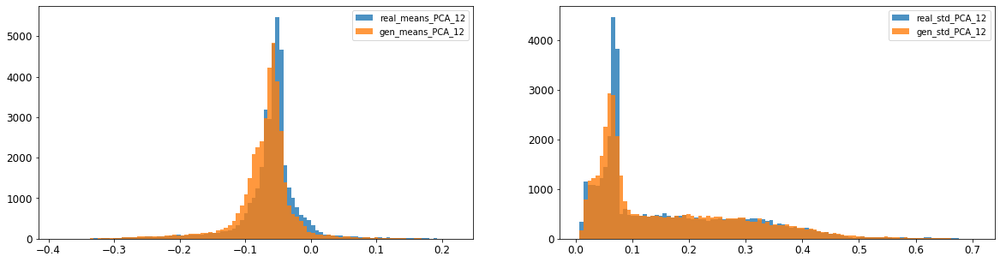

13: mean KL divergence (r,g) = inf
13: mean JS divergence = 0.04540780789475493
13: mean 1-BC divergence = 0.03193261118562918

13: std KL divergence (r,g) = 0.08034750156371703
13: std JS divergence = 0.019043947370142096
13: std 1-BC divergence = 0.013387766855181615


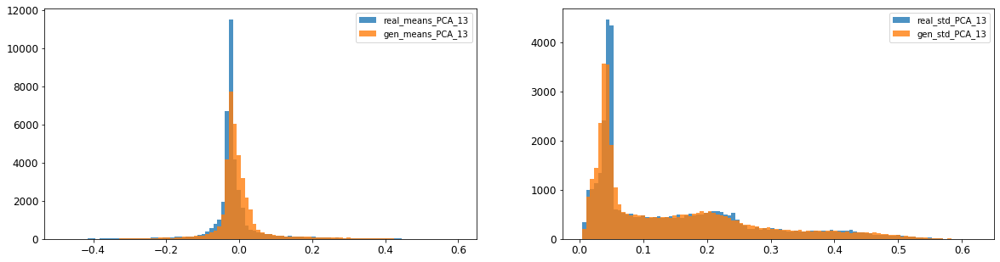

14: mean KL divergence (r,g) = 0.3572419173367919
14: mean JS divergence = 0.08734785839485076
14: mean 1-BC divergence = 0.06161037416069237

14: std KL divergence (r,g) = 0.04150836479760767
14: std JS divergence = 0.010337493159032679
14: std 1-BC divergence = 0.007447617353097513


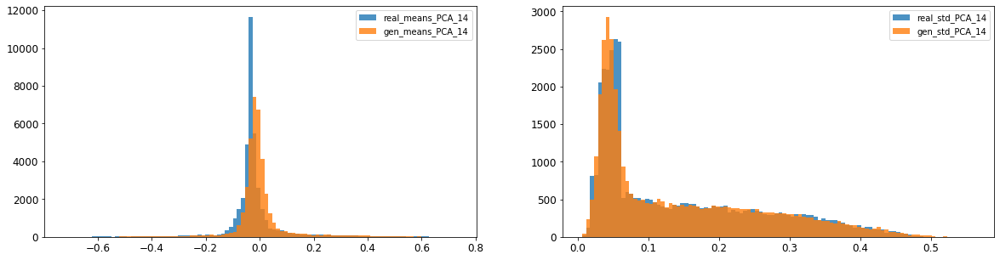

15: mean KL divergence (r,g) = 1.5747800722786007
15: mean JS divergence = 0.4337263003338766
15: mean 1-BC divergence = 0.3984590495376037

15: std KL divergence (r,g) = 8.35067703336898
15: std JS divergence = 0.9849963864525999
15: std 1-BC divergence = 0.9446525184172818


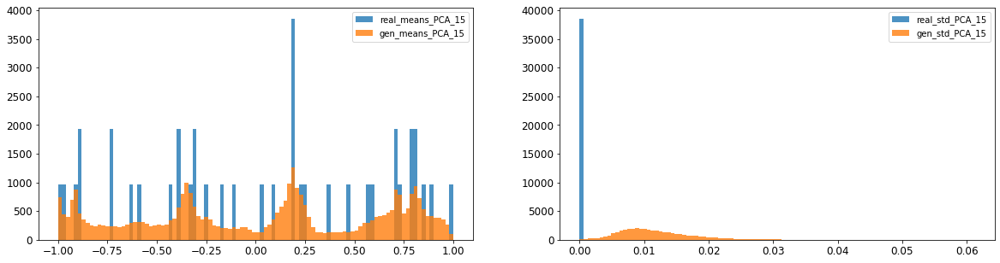

16: mean KL divergence (r,g) = 1.3745003756487115
16: mean JS divergence = 0.3830958555725916
16: mean 1-BC divergence = 0.3534188211320375

16: std KL divergence (r,g) = 6.1591786199783165
16: std JS divergence = 0.9467442216277029
16: std 1-BC divergence = 0.8817091252513288


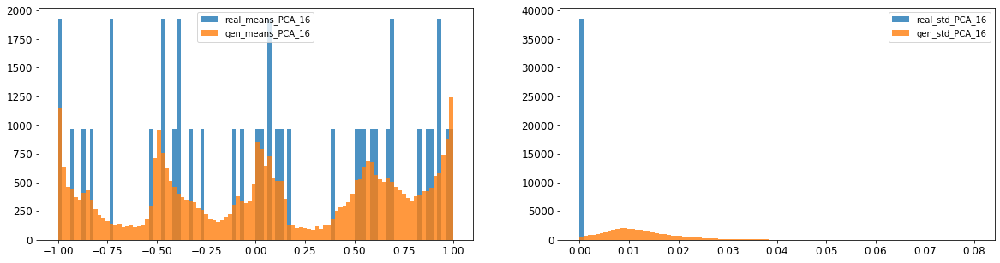



--------------------------------------------------------

Compose KL divergence (r,g) = inf
Compose JS divergence = 0.025301709221912123
Compose 1-BC divergence = 0.01868539727637808

Compose weighted KL divergence (r,g) = inf
Compose weighted JS divergence = 0.01844861427186551
Compose weighted 1-BC divergence = 0.014496536741966826

Multivariate KL divergence = 59.73148255764286


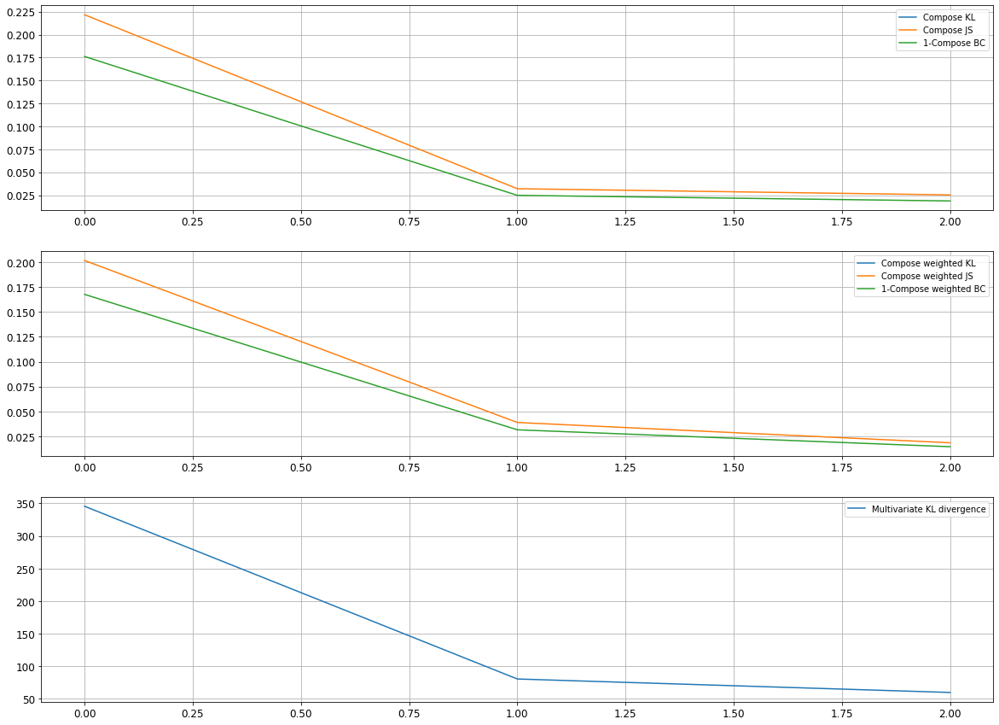

Epoch 402/10000
discriminator loss: -0.168891 - generator loss: 73.834457 - 91s
Epoch 403/10000
discriminator loss: -0.170311 - generator loss: 73.896973 - 111s
Epoch 404/10000
discriminator loss: -0.167782 - generator loss: 74.025291 - 118s
Epoch 405/10000
discriminator loss: -0.168005 - generator loss: 74.028900 - 118s
Epoch 406/10000
discriminator loss: -0.164601 - generator loss: 74.090187 - 118s
Epoch 407/10000
discriminator loss: -0.169688 - generator loss: 74.119720 - 118s
Epoch 408/10000
discriminator loss: -0.168617 - generator loss: 74.187569 - 118s
Epoch 409/10000
discriminator loss: -0.168773 - generator loss: 74.319901 - 118s
Epoch 410/10000
discriminator loss: -0.168742 - generator loss: 74.466034 - 117s
Epoch 411/10000
discriminator loss: -0.171397 - generator loss: 74.434830 - 118s
Epoch 412/10000
discriminator loss: -0.169342 - generator loss: 74.515358 - 118s
Epoch 413/10000
discriminator loss: -0.169224 - generator loss: 74.624084 - 118s
Epoch 414/10000
discriminator

discriminator loss: -0.161023 - generator loss: 82.705490 - 120s
Epoch 504/10000
discriminator loss: -0.160502 - generator loss: 82.697159 - 120s
Epoch 505/10000
discriminator loss: -0.159000 - generator loss: 82.805069 - 120s
Epoch 506/10000
discriminator loss: -0.158378 - generator loss: 82.969948 - 119s
Epoch 507/10000
discriminator loss: -0.160259 - generator loss: 83.049759 - 119s
Epoch 508/10000
discriminator loss: -0.160144 - generator loss: 83.223282 - 119s
Epoch 509/10000
discriminator loss: -0.157872 - generator loss: 83.306496 - 119s
Epoch 510/10000
discriminator loss: -0.160215 - generator loss: 83.264397 - 119s
Epoch 511/10000
discriminator loss: -0.159191 - generator loss: 83.326492 - 119s
Epoch 512/10000
discriminator loss: -0.161220 - generator loss: 83.355240 - 119s
Epoch 513/10000
discriminator loss: -0.159209 - generator loss: 83.454491 - 119s
Epoch 514/10000
discriminator loss: -0.158718 - generator loss: 83.574722 - 120s
Epoch 515/10000
discriminator loss: -0.15982

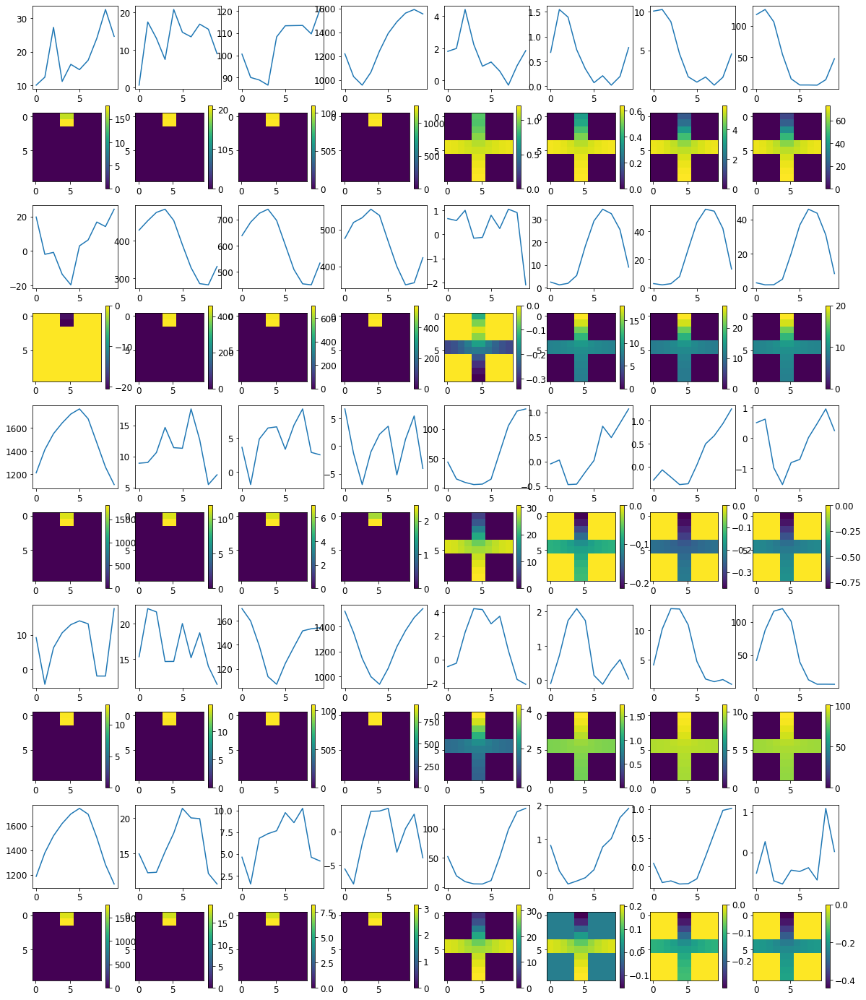


R0 generated:
[[17.700888   11.408789  ]
 [17.684713   11.387708  ]
 [17.44628    11.382763  ]
 [17.56568    10.970908  ]
 [17.46434    11.079831  ]
 [17.546278   11.301025  ]
 [17.648718   11.102423  ]
 [17.716192   11.115602  ]
 [17.806059   11.257859  ]
 [17.65912    11.125291  ]
 [13.761729   19.095106  ]
 [13.598033   19.005413  ]
 [13.717569   19.085403  ]
 [13.89315    19.036072  ]
 [14.070574   19.058777  ]
 [14.0397415  19.043802  ]
 [14.272162   19.121466  ]
 [14.230115   19.042072  ]
 [14.249586   19.074657  ]
 [14.105405   18.992384  ]
 [ 3.1674805   0.745037  ]
 [ 3.052347    0.6995177 ]
 [ 2.790898    0.70509917]
 [ 2.666281    0.6746939 ]
 [ 2.6262329   0.68216866]
 [ 2.6218865   0.64161277]
 [ 2.610542    0.67026293]
 [ 2.5955274   0.6404681 ]
 [ 2.6085944   0.71494955]
 [ 2.5457187   0.710164  ]
 [17.200287    0.49292055]
 [17.299126    0.5283644 ]
 [17.34882     0.4539781 ]
 [17.198431    0.44939607]
 [17.288322    0.42917114]
 [17.37491     0.4327584 ]
 [17.359697  

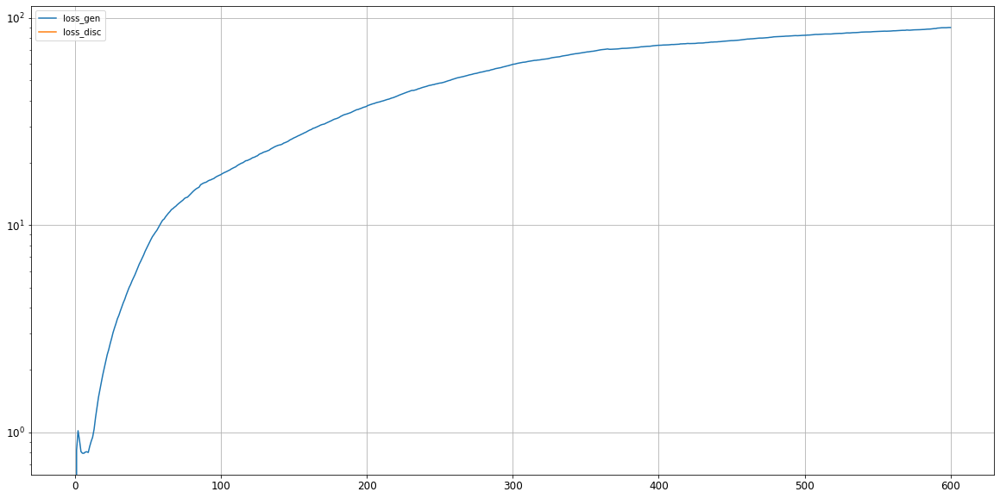

0: mean KL divergence (r,g) = 0.048976670331399255
0: mean JS divergence = 0.010968431106949728
0: mean 1-BC divergence = 0.00795204818852191

0: std KL divergence (r,g) = inf
0: std JS divergence = 0.033973493839917865
0: std 1-BC divergence = 0.02468230432380414


/home/viluiz/anaconda3/envs/py3ml/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


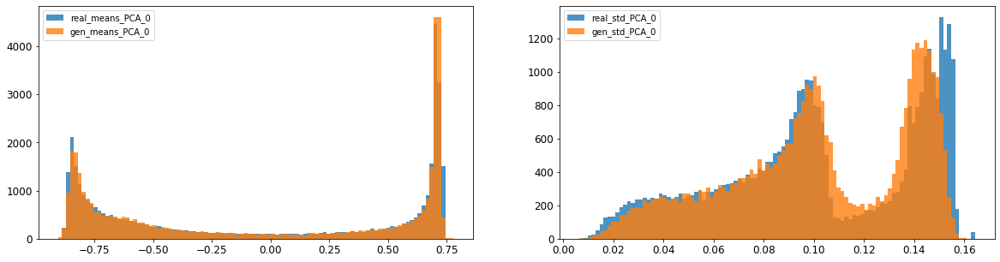

1: mean KL divergence (r,g) = inf
1: mean JS divergence = 0.04230334930178149
1: mean 1-BC divergence = 0.0310725577601898

1: std KL divergence (r,g) = inf
1: std JS divergence = 0.012455572403636032
1: std 1-BC divergence = 0.00984874919121026


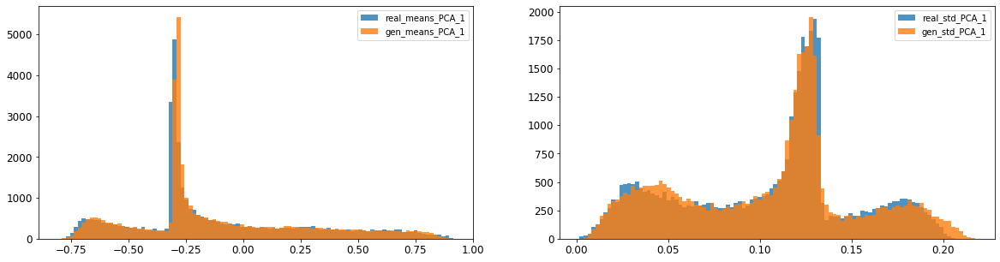

2: mean KL divergence (r,g) = 0.0712015102762428
2: mean JS divergence = 0.016712388249979594
2: mean 1-BC divergence = 0.012189596745302511

2: std KL divergence (r,g) = 0.044215165284993106
2: std JS divergence = 0.012103848401642421
2: std 1-BC divergence = 0.010243238097892737


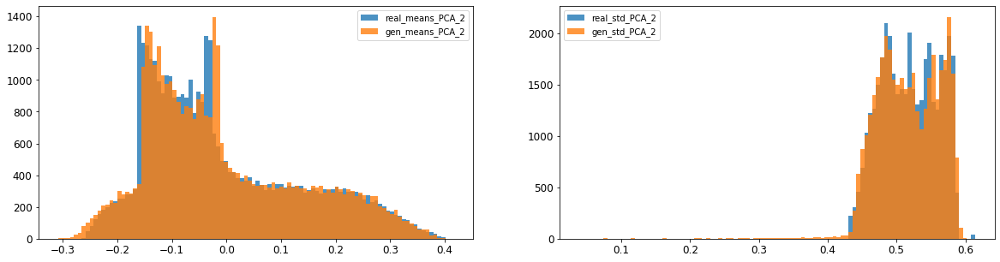

3: mean KL divergence (r,g) = 0.574117288774377
3: mean JS divergence = 0.08809682368236285
3: mean 1-BC divergence = 0.06756319913147901

3: std KL divergence (r,g) = inf
3: std JS divergence = 0.12190105214610569
3: std 1-BC divergence = 0.09939928918594743


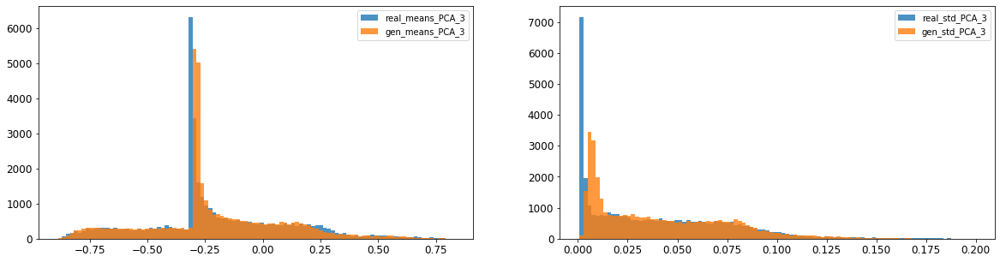

4: mean KL divergence (r,g) = 0.024763735745397805
4: mean JS divergence = 0.006759165808116386
4: mean 1-BC divergence = 0.0052980013782994995

4: std KL divergence (r,g) = 0.06592909336819637
4: std JS divergence = 0.015173801733287456
4: std 1-BC divergence = 0.010951440373846988


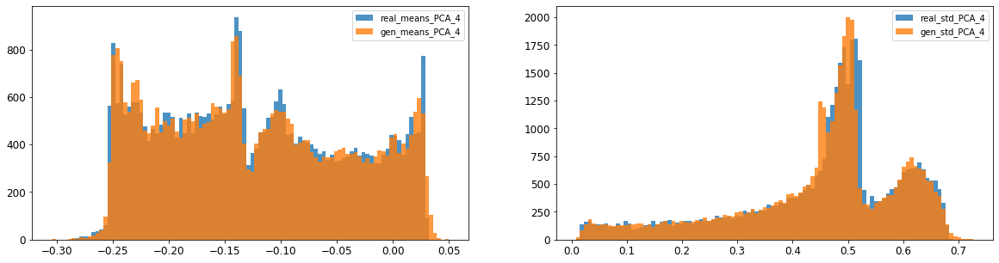

5: mean KL divergence (r,g) = inf
5: mean JS divergence = 0.02141635494030466
5: mean 1-BC divergence = 0.016224814297321144

5: std KL divergence (r,g) = inf
5: std JS divergence = 0.03635979969975667
5: std 1-BC divergence = 0.02906204218647912


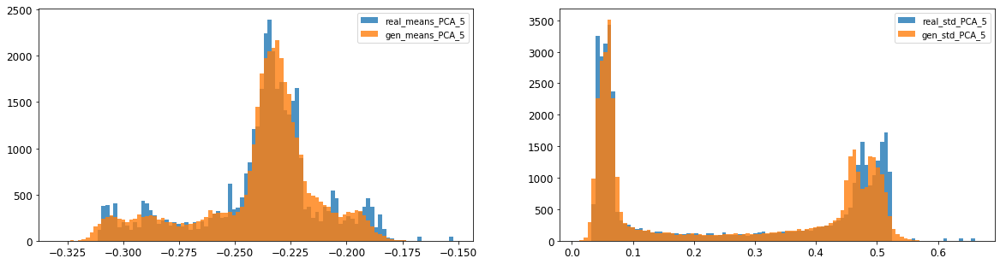

6: mean KL divergence (r,g) = 0.020567564519580025
6: mean JS divergence = 0.0051942268433625705
6: mean 1-BC divergence = 0.0036744987442010046

6: std KL divergence (r,g) = inf
6: std JS divergence = 0.018601077032036274
6: std 1-BC divergence = 0.013033325953165198


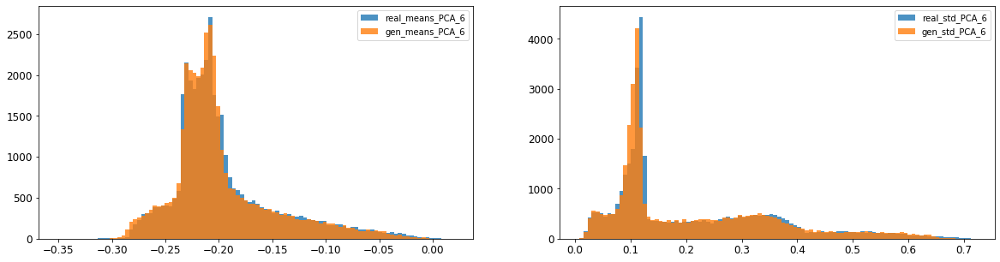

7: mean KL divergence (r,g) = 0.07782755983214824
7: mean JS divergence = 0.018260799081901403
7: mean 1-BC divergence = 0.012986120132829626

7: std KL divergence (r,g) = 0.17045221300054209
7: std JS divergence = 0.03920579288242503
7: std 1-BC divergence = 0.02788470334637494


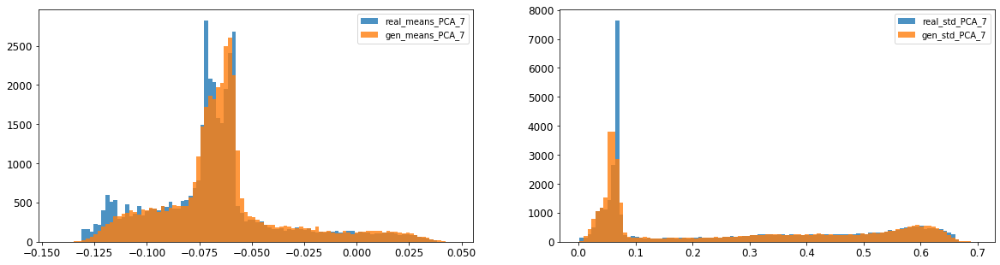

8: mean KL divergence (r,g) = inf
8: mean JS divergence = 0.006296103423562112
8: mean 1-BC divergence = 0.004396682979851851

8: std KL divergence (r,g) = inf
8: std JS divergence = 0.029473436404509425
8: std 1-BC divergence = 0.02069929865807918


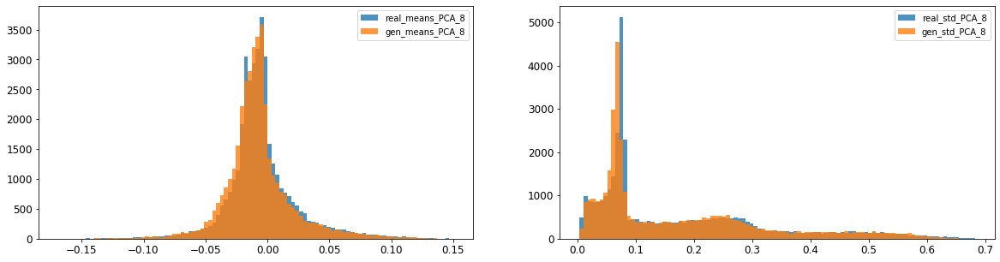

9: mean KL divergence (r,g) = inf
9: mean JS divergence = 0.005468722747836259
9: mean 1-BC divergence = 0.0038721763011931865

9: std KL divergence (r,g) = inf
9: std JS divergence = 0.007544938998057941
9: std 1-BC divergence = 0.005330605471941974


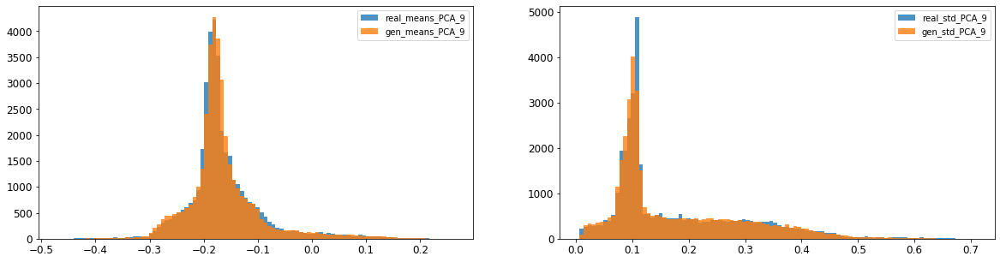

10: mean KL divergence (r,g) = inf
10: mean JS divergence = 0.014766189453888384
10: mean 1-BC divergence = 0.010334379814455952

10: std KL divergence (r,g) = inf
10: std JS divergence = 0.014362499419453527
10: std 1-BC divergence = 0.011334003384118274


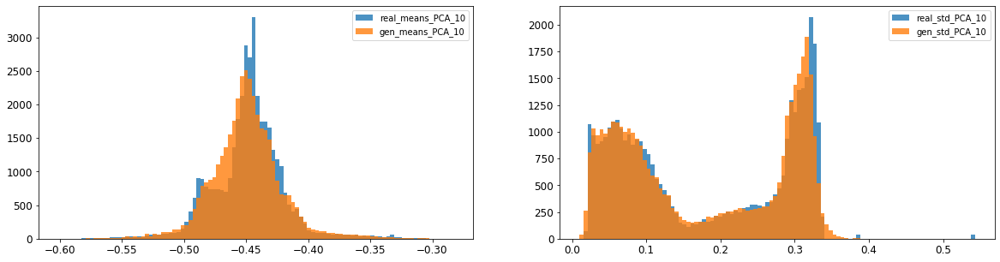

11: mean KL divergence (r,g) = 0.11010755241908551
11: mean JS divergence = 0.02833837675461783
11: mean 1-BC divergence = 0.02003024128949238

11: std KL divergence (r,g) = 0.05503256354254323
11: std JS divergence = 0.013851350308865655
11: std 1-BC divergence = 0.009956537899908136


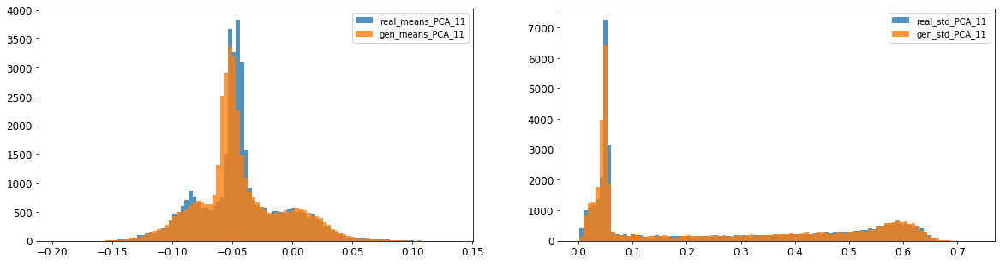

12: mean KL divergence (r,g) = 0.07920642983495395
12: mean JS divergence = 0.019361687640762744
12: mean 1-BC divergence = 0.0135507682575291

12: std KL divergence (r,g) = inf
12: std JS divergence = 0.02077676100750967
12: std 1-BC divergence = 0.014565158193790562


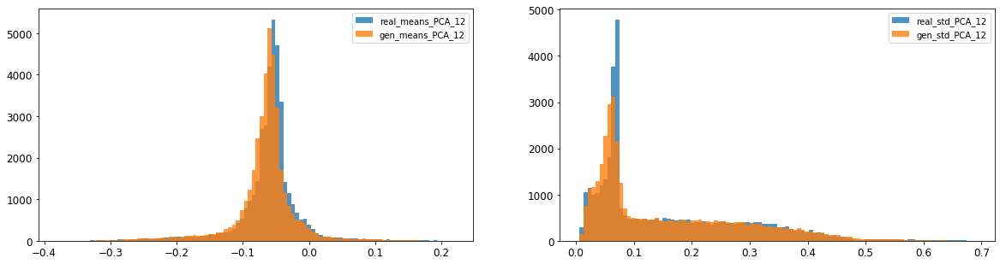

13: mean KL divergence (r,g) = 0.09678055086011138
13: mean JS divergence = 0.02489943091110805
13: mean 1-BC divergence = 0.017461069499428827

13: std KL divergence (r,g) = 0.07909626626009954
13: std JS divergence = 0.01856424192510259
13: std 1-BC divergence = 0.012984762515106496


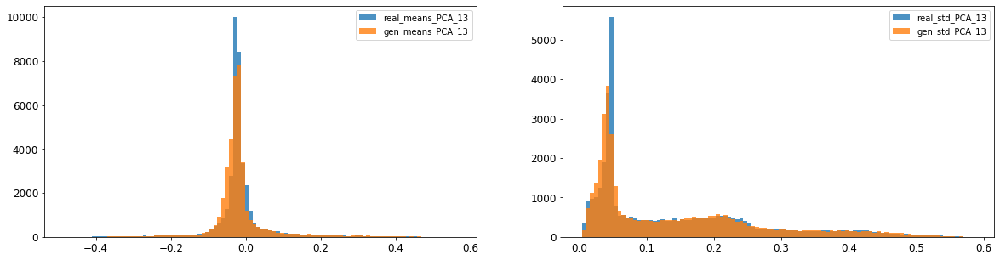

14: mean KL divergence (r,g) = 0.07626098302522501
14: mean JS divergence = 0.019472935587573396
14: mean 1-BC divergence = 0.013629739511475614

14: std KL divergence (r,g) = 0.0384947137097054
14: std JS divergence = 0.009751856732686758
14: std 1-BC divergence = 0.006941438903989239


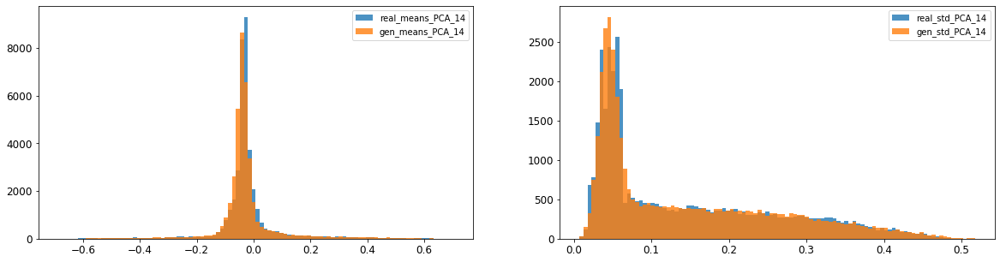

15: mean KL divergence (r,g) = 1.4507534315586983
15: mean JS divergence = 0.4094649791998064
15: mean 1-BC divergence = 0.3771122440408897

15: std KL divergence (r,g) = 7.296682143728251
15: std JS divergence = 0.9721927687295275
15: std 1-BC divergence = 0.9202483085137892


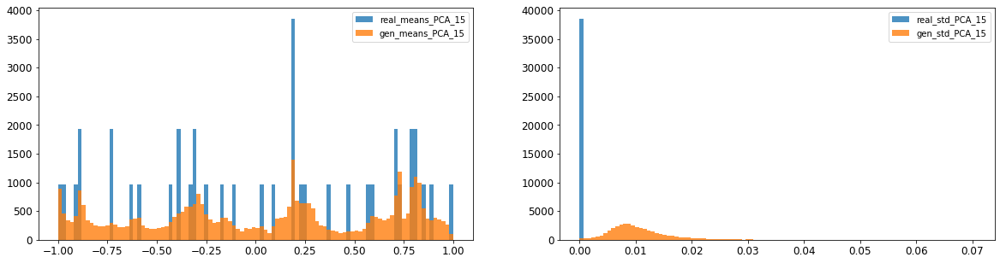

16: mean KL divergence (r,g) = 1.3320233229021314
16: mean JS divergence = 0.3737423495739276
16: mean 1-BC divergence = 0.34504957233037514

16: std KL divergence (r,g) = 5.699990350424988
16: std JS divergence = 0.9311663165506685
16: std 1-BC divergence = 0.8613033521507798


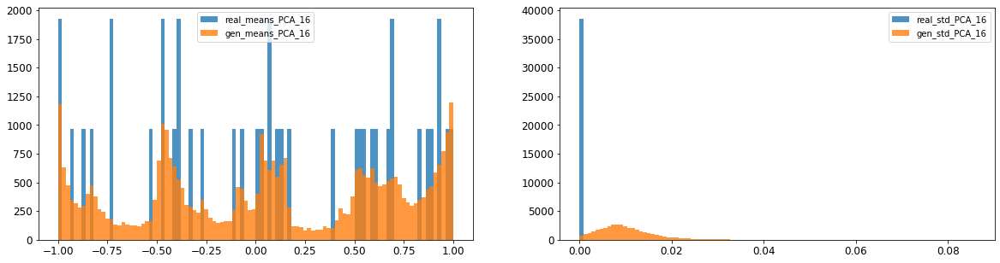



--------------------------------------------------------

Compose KL divergence (r,g) = inf
Compose JS divergence = 0.024413816948970015
Compose 1-BC divergence = 0.01823842639057438

Compose weighted KL divergence (r,g) = inf
Compose weighted JS divergence = 0.026314537989797986
Compose weighted 1-BC divergence = 0.01967372443544524

Multivariate KL divergence = 52.42050413664721


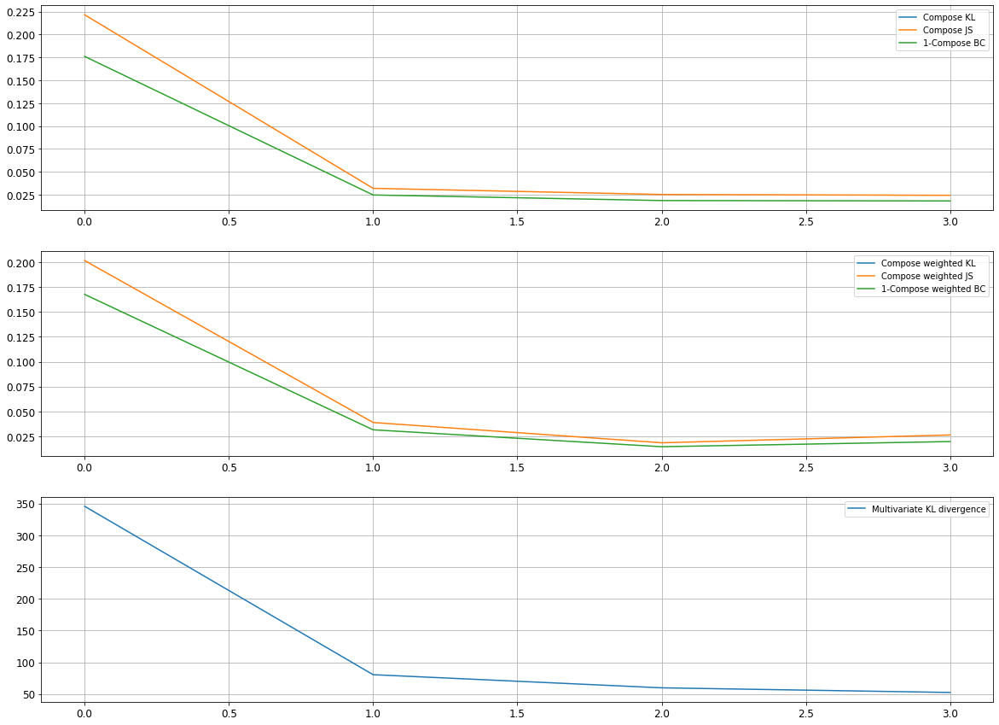

Epoch 602/10000
discriminator loss: -0.154774 - generator loss: 89.969788 - 100s
Epoch 603/10000
discriminator loss: -0.153203 - generator loss: 90.117111 - 92s
Epoch 604/10000
discriminator loss: -0.152749 - generator loss: 90.070778 - 92s
Epoch 605/10000
discriminator loss: -0.151007 - generator loss: 90.151093 - 92s
Epoch 606/10000
discriminator loss: -0.152346 - generator loss: 90.333893 - 101s
Epoch 607/10000
discriminator loss: -0.151946 - generator loss: 90.408554 - 118s
Epoch 608/10000
discriminator loss: -0.152673 - generator loss: 90.303520 - 116s
Epoch 609/10000
discriminator loss: -0.151921 - generator loss: 90.364182 - 117s
Epoch 610/10000
discriminator loss: -0.153326 - generator loss: 90.490807 - 117s
Epoch 611/10000
discriminator loss: -0.152304 - generator loss: 90.609909 - 118s
Epoch 612/10000
discriminator loss: -0.153588 - generator loss: 90.662514 - 117s
Epoch 613/10000
discriminator loss: -0.153550 - generator loss: 90.694038 - 118s
Epoch 614/10000
discriminator l

discriminator loss: -0.144757 - generator loss: 94.803780 - 119s
Epoch 704/10000
discriminator loss: -0.144241 - generator loss: 94.779114 - 119s
Epoch 705/10000
discriminator loss: -0.145899 - generator loss: 94.774628 - 118s
Epoch 706/10000
discriminator loss: -0.144597 - generator loss: 94.866852 - 118s
Epoch 707/10000
discriminator loss: -0.145256 - generator loss: 94.826347 - 118s
Epoch 708/10000
discriminator loss: -0.145371 - generator loss: 94.857071 - 119s
Epoch 709/10000
discriminator loss: -0.144604 - generator loss: 94.835258 - 118s
Epoch 710/10000
discriminator loss: -0.143619 - generator loss: 94.904678 - 119s
Epoch 711/10000
discriminator loss: -0.145457 - generator loss: 94.806313 - 119s
Epoch 712/10000
discriminator loss: -0.143122 - generator loss: 94.742973 - 119s
Epoch 713/10000
discriminator loss: -0.145173 - generator loss: 94.713951 - 119s
Epoch 714/10000
discriminator loss: -0.144027 - generator loss: 94.811577 - 119s
Epoch 715/10000
discriminator loss: -0.14409

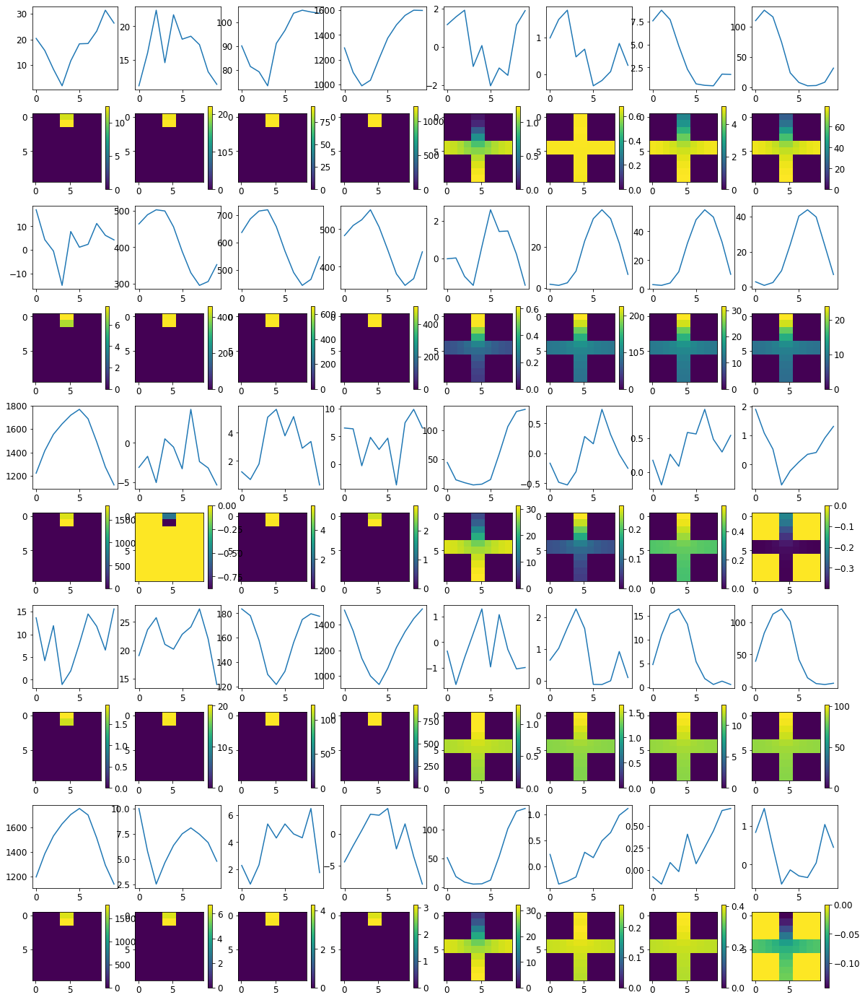


R0 generated:
[[17.932457   16.815968  ]
 [17.903809   16.969416  ]
 [17.751408   17.058302  ]
 [17.901302   16.95574   ]
 [17.717327   17.20455   ]
 [17.968124   17.196007  ]
 [17.902344   17.420532  ]
 [17.950525   17.231588  ]
 [17.903936   17.171011  ]
 [17.846735   17.218428  ]
 [12.659775   11.476086  ]
 [13.090604   11.856662  ]
 [12.950285   11.581139  ]
 [13.050709   11.508224  ]
 [12.948145   11.781368  ]
 [12.993936   11.986787  ]
 [12.987565   11.784737  ]
 [12.969415   11.742285  ]
 [13.019877   11.652812  ]
 [13.038017   11.762629  ]
 [ 3.427821    0.83769137]
 [ 3.3314936   0.82914543]
 [ 3.2982144   0.7825323 ]
 [ 3.12081     0.7851603 ]
 [ 3.140309    0.8459026 ]
 [ 3.2023096   0.7739519 ]
 [ 3.218206    0.8729061 ]
 [ 3.1768146   0.8487645 ]
 [ 3.338535    0.8592364 ]
 [ 3.2584605   0.85152143]
 [17.193298    0.45439732]
 [17.167583    0.41521403]
 [17.182316    0.3616963 ]
 [17.1003      0.37116298]
 [17.145866    0.3683874 ]
 [17.183846    0.39624688]
 [17.126472  

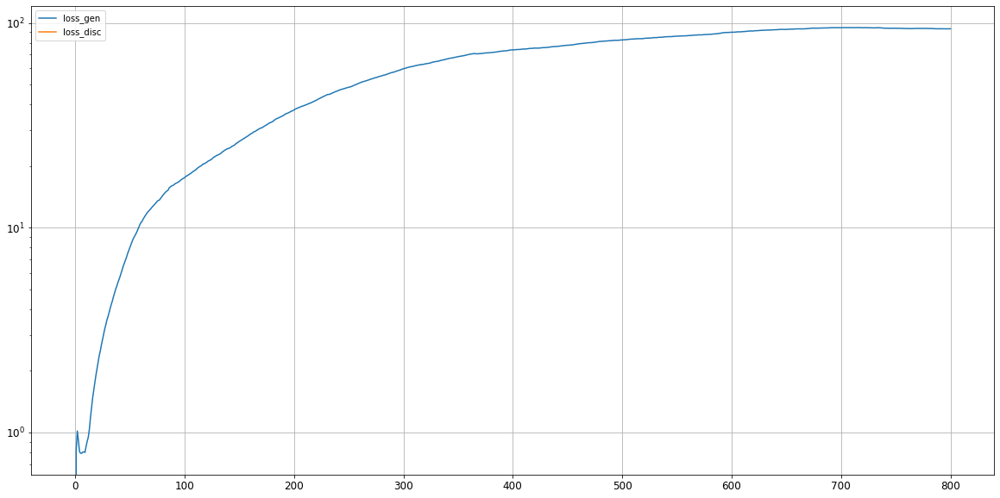

0: mean KL divergence (r,g) = 0.00944327073774666
0: mean JS divergence = 0.002783789040855764
0: mean 1-BC divergence = 0.0023803517326215218

0: std KL divergence (r,g) = inf
0: std JS divergence = 0.012901811871460282
0: std 1-BC divergence = 0.009988171826886272


/home/viluiz/anaconda3/envs/py3ml/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


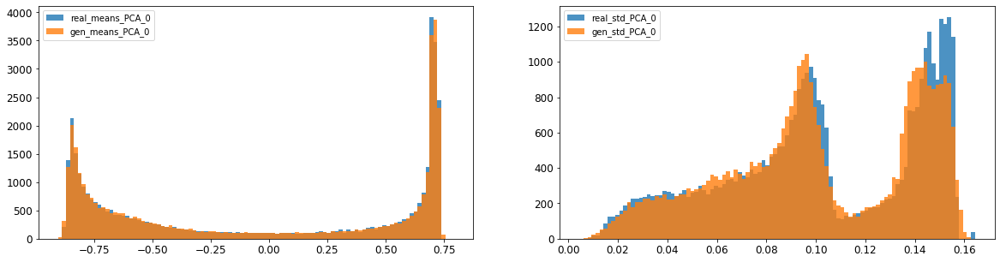

1: mean KL divergence (r,g) = 0.013481981879843636
1: mean JS divergence = 0.0032779970998209782
1: mean 1-BC divergence = 0.002321533173015089

1: std KL divergence (r,g) = 0.041202799566590426
1: std JS divergence = 0.010475658510473874
1: std 1-BC divergence = 0.007801050102490215


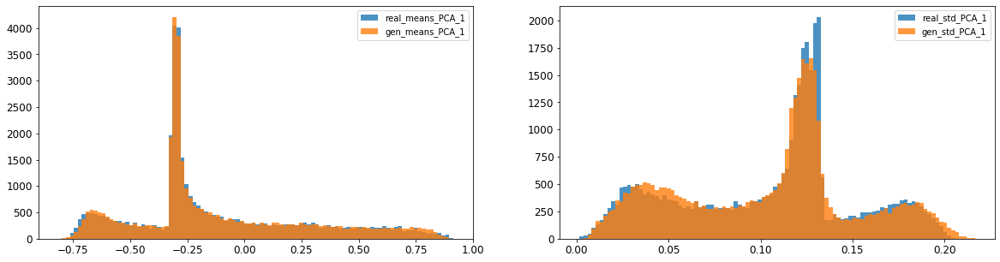

2: mean KL divergence (r,g) = 0.032493653980243134
2: mean JS divergence = 0.006965459069995355
2: mean 1-BC divergence = 0.004977145751205891

2: std KL divergence (r,g) = inf
2: std JS divergence = 0.011149690186284165
2: std 1-BC divergence = 0.009475065188908172


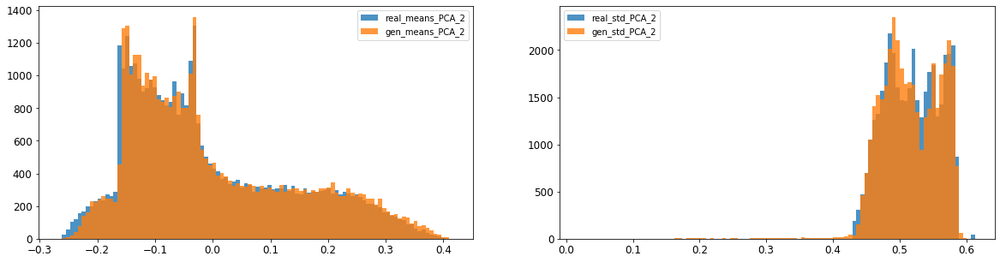

3: mean KL divergence (r,g) = 0.11963187888322813
3: mean JS divergence = 0.03524847504570163
3: mean 1-BC divergence = 0.026307400281171844

3: std KL divergence (r,g) = inf
3: std JS divergence = 0.10432239351594641
3: std 1-BC divergence = 0.07990407005198907


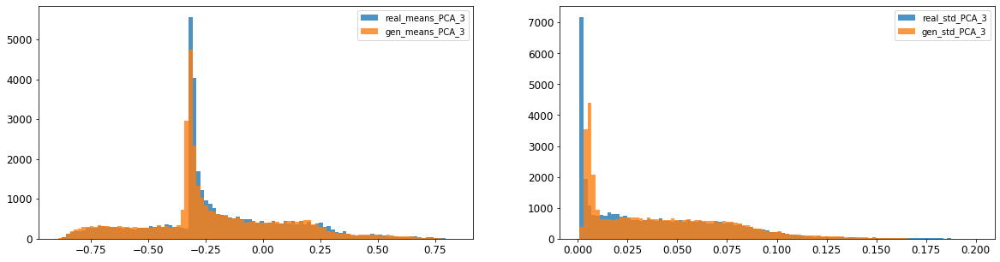

4: mean KL divergence (r,g) = 0.060226463555255384
4: mean JS divergence = 0.018782998533354373
4: mean 1-BC divergence = 0.017315145640974916

4: std KL divergence (r,g) = 0.02947812811514356
4: std JS divergence = 0.007062763947212494
4: std 1-BC divergence = 0.005083383370633632


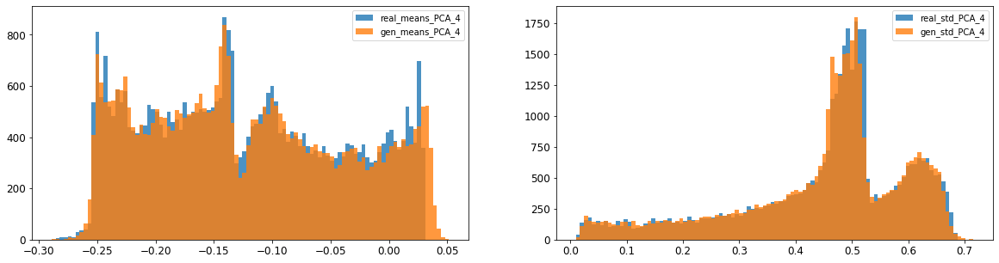

5: mean KL divergence (r,g) = inf
5: mean JS divergence = 0.0339235849520218
5: mean 1-BC divergence = 0.024854873283636114

5: std KL divergence (r,g) = inf
5: std JS divergence = 0.02083094828069841
5: std 1-BC divergence = 0.018586778770054102


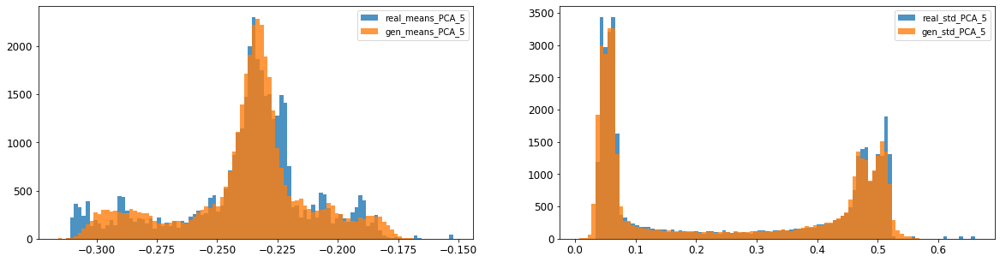

6: mean KL divergence (r,g) = inf
6: mean JS divergence = 0.006806773613996404
6: mean 1-BC divergence = 0.00480577958125461

6: std KL divergence (r,g) = inf
6: std JS divergence = 0.014945790847684194
6: std 1-BC divergence = 0.01055668647504171


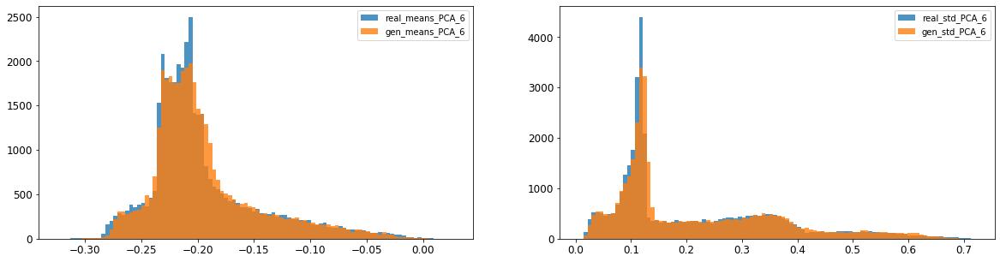

7: mean KL divergence (r,g) = 0.40788725414084653
7: mean JS divergence = 0.08447860771274882
7: mean 1-BC divergence = 0.06167053665389055

7: std KL divergence (r,g) = 0.11785456713461093
7: std JS divergence = 0.02827522892376344
7: std 1-BC divergence = 0.020223370351348913


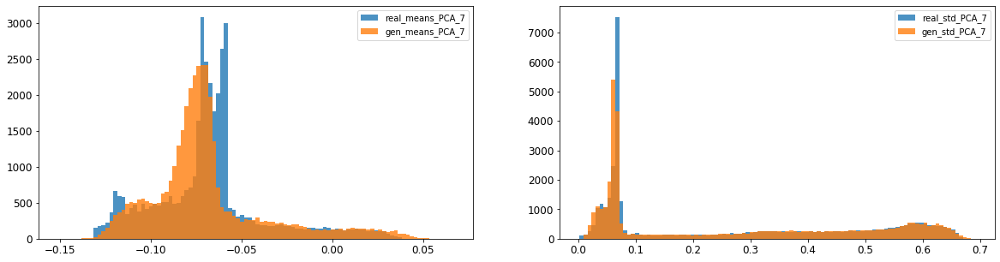

8: mean KL divergence (r,g) = inf
8: mean JS divergence = 0.006396270335874241
8: mean 1-BC divergence = 0.0044638667338159355

8: std KL divergence (r,g) = inf
8: std JS divergence = 0.008344613205990076
8: std 1-BC divergence = 0.0059834409091247265


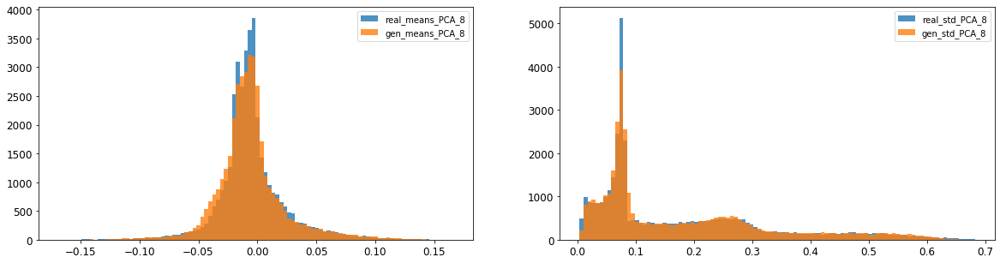

9: mean KL divergence (r,g) = inf
9: mean JS divergence = 0.004266478347451667
9: mean 1-BC divergence = 0.0030775096897547316

9: std KL divergence (r,g) = inf
9: std JS divergence = 0.009970126571009447
9: std 1-BC divergence = 0.006966371470058963


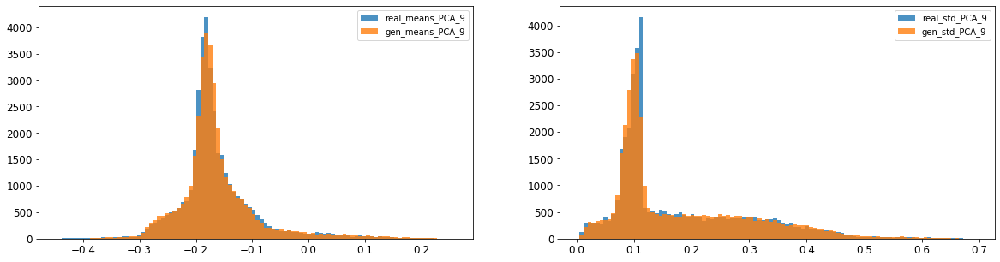

10: mean KL divergence (r,g) = inf
10: mean JS divergence = 0.007435629316466234
10: mean 1-BC divergence = 0.005239500691709975

10: std KL divergence (r,g) = inf
10: std JS divergence = 0.010213515990079948
10: std 1-BC divergence = 0.008215308709111802


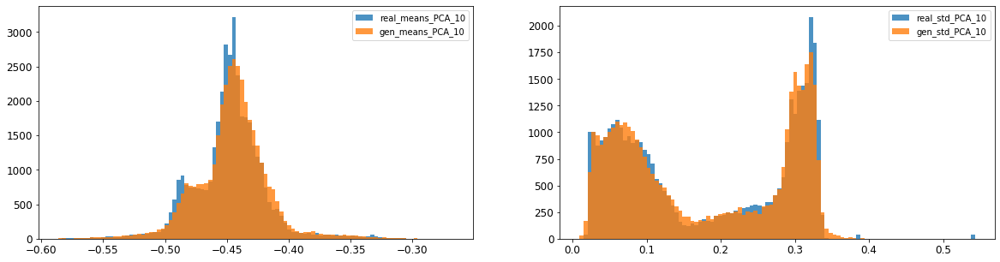

11: mean KL divergence (r,g) = 0.1751766740389066
11: mean JS divergence = 0.04442193029129553
11: mean 1-BC divergence = 0.0313899342382673

11: std KL divergence (r,g) = 0.06583775077977637
11: std JS divergence = 0.0161837439965029
11: std 1-BC divergence = 0.011535800908804239


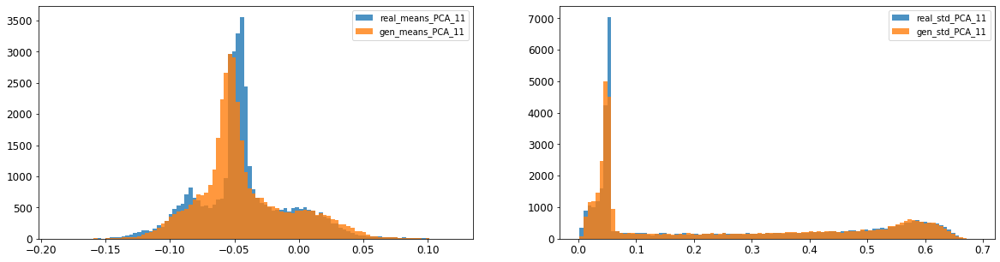

12: mean KL divergence (r,g) = 0.017955364107343257
12: mean JS divergence = 0.004524025872627234
12: mean 1-BC divergence = 0.003191624633465895

12: std KL divergence (r,g) = inf
12: std JS divergence = 0.014528721448479125
12: std 1-BC divergence = 0.010188622627364308


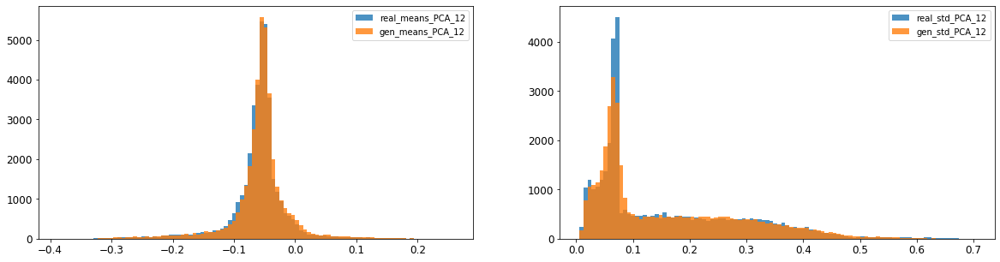

13: mean KL divergence (r,g) = 0.08429507794057492
13: mean JS divergence = 0.021352519628606723
13: mean 1-BC divergence = 0.01494035926216275

13: std KL divergence (r,g) = inf
13: std JS divergence = 0.009180994808973823
13: std 1-BC divergence = 0.006409144989616755


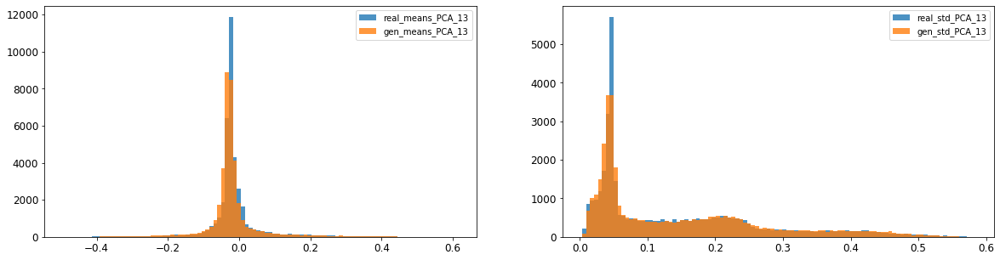

14: mean KL divergence (r,g) = 0.1671080507605256
14: mean JS divergence = 0.04345896351222041
14: mean 1-BC divergence = 0.030496762924204113

14: std KL divergence (r,g) = 0.03139644807332369
14: std JS divergence = 0.007850909224652682
14: std 1-BC divergence = 0.005545429691281911


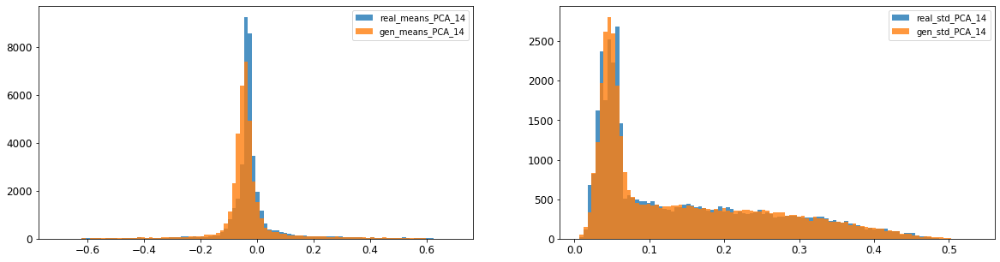

15: mean KL divergence (r,g) = 1.4871685504447738
15: mean JS divergence = 0.41274933283108023
15: mean 1-BC divergence = 0.37960573837409584

15: std KL divergence (r,g) = 6.648357582009665
15: std JS divergence = 0.959635041249713
15: std 1-BC divergence = 0.9001558847401364


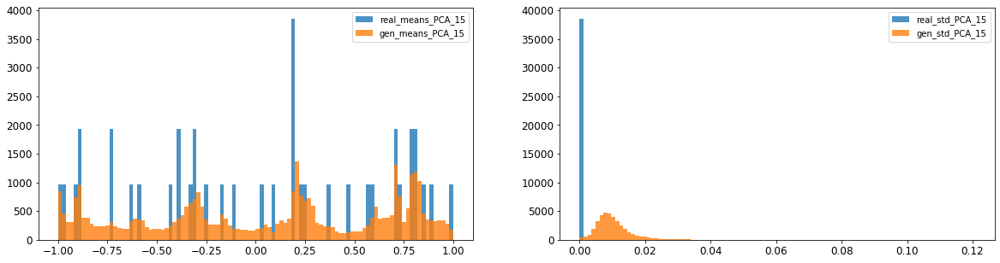

16: mean KL divergence (r,g) = 1.2284653779456831
16: mean JS divergence = 0.354095342259802
16: mean 1-BC divergence = 0.32848053302346447

16: std KL divergence (r,g) = 6.116976121493353
16: std JS divergence = 0.9454652356972845
16: std 1-BC divergence = 0.8799662560424215


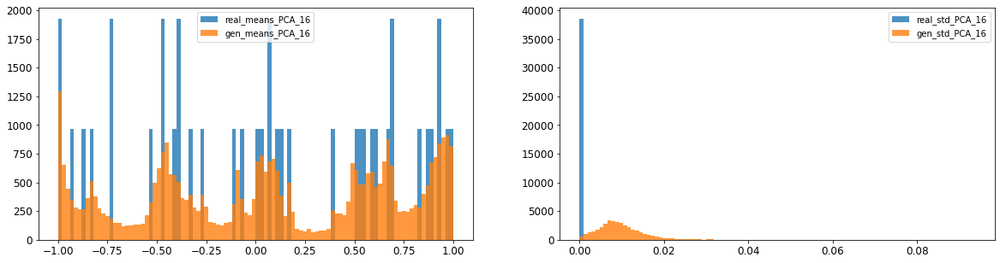



--------------------------------------------------------

Compose KL divergence (r,g) = inf
Compose JS divergence = 0.02034534712340828
Compose 1-BC divergence = 0.015129833990462305

Compose weighted KL divergence (r,g) = inf
Compose weighted JS divergence = 0.012144088398230531
Compose weighted 1-BC divergence = 0.009383194128385397

Multivariate KL divergence = 45.65216949077163


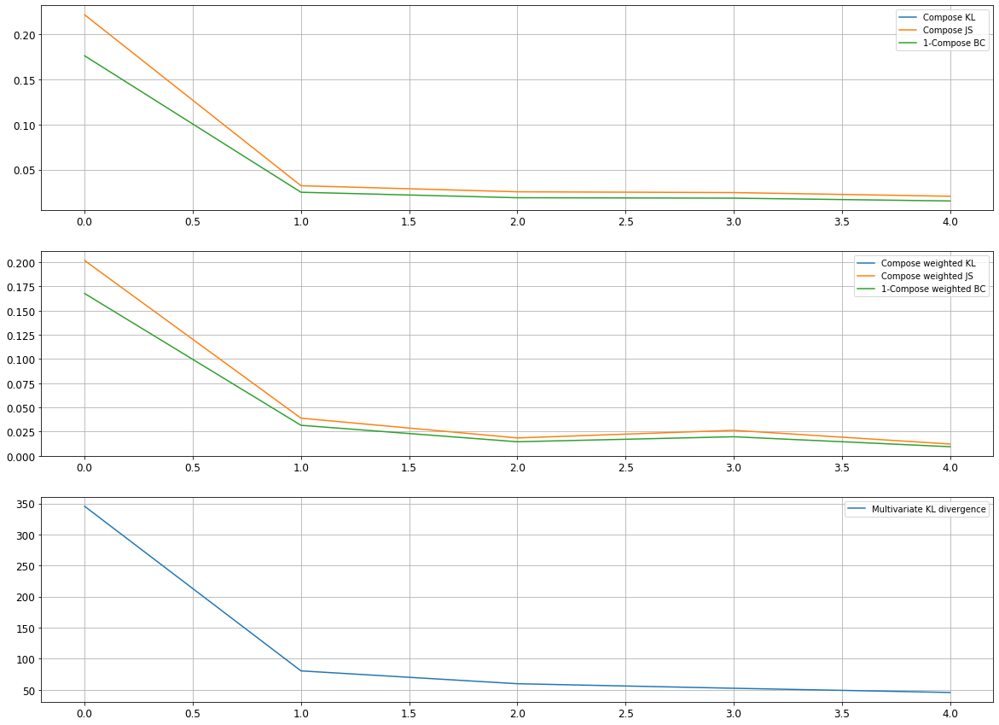

Epoch 802/10000
discriminator loss: -0.137051 - generator loss: 93.661819 - 118s
Epoch 803/10000
discriminator loss: -0.139024 - generator loss: 93.787994 - 119s
Epoch 804/10000
discriminator loss: -0.137750 - generator loss: 93.881302 - 119s
Epoch 805/10000
discriminator loss: -0.136608 - generator loss: 93.804680 - 106s
Epoch 806/10000
discriminator loss: -0.136742 - generator loss: 93.870934 - 92s
Epoch 807/10000
discriminator loss: -0.135829 - generator loss: 93.818413 - 91s
Epoch 808/10000
discriminator loss: -0.136313 - generator loss: 93.850487 - 92s
Epoch 809/10000
discriminator loss: -0.136053 - generator loss: 93.733421 - 114s
Epoch 810/10000
discriminator loss: -0.135465 - generator loss: 93.869469 - 118s
Epoch 811/10000
discriminator loss: -0.137041 - generator loss: 94.070290 - 119s
Epoch 812/10000
discriminator loss: -0.137390 - generator loss: 94.138039 - 117s
Epoch 813/10000
discriminator loss: -0.137185 - generator loss: 94.062347 - 118s
Epoch 814/10000
discriminator l

discriminator loss: -0.131001 - generator loss: 91.030533 - 147s
Epoch 904/10000
discriminator loss: -0.130823 - generator loss: 90.986359 - 148s
Epoch 905/10000
discriminator loss: -0.130095 - generator loss: 90.976151 - 147s
Epoch 906/10000
discriminator loss: -0.131142 - generator loss: 90.953407 - 149s
Epoch 907/10000
discriminator loss: -0.132280 - generator loss: 90.849052 - 147s
Epoch 908/10000
discriminator loss: -0.131525 - generator loss: 90.838951 - 147s
Epoch 909/10000
discriminator loss: -0.130987 - generator loss: 90.843956 - 149s
Epoch 910/10000
discriminator loss: -0.130829 - generator loss: 90.937988 - 150s
Epoch 911/10000
discriminator loss: -0.130118 - generator loss: 90.950584 - 147s
Epoch 912/10000
discriminator loss: -0.131056 - generator loss: 90.914124 - 148s
Epoch 913/10000
discriminator loss: -0.131394 - generator loss: 90.829453 - 149s
Epoch 914/10000
discriminator loss: -0.130705 - generator loss: 90.836426 - 149s
Epoch 915/10000
discriminator loss: -0.13162

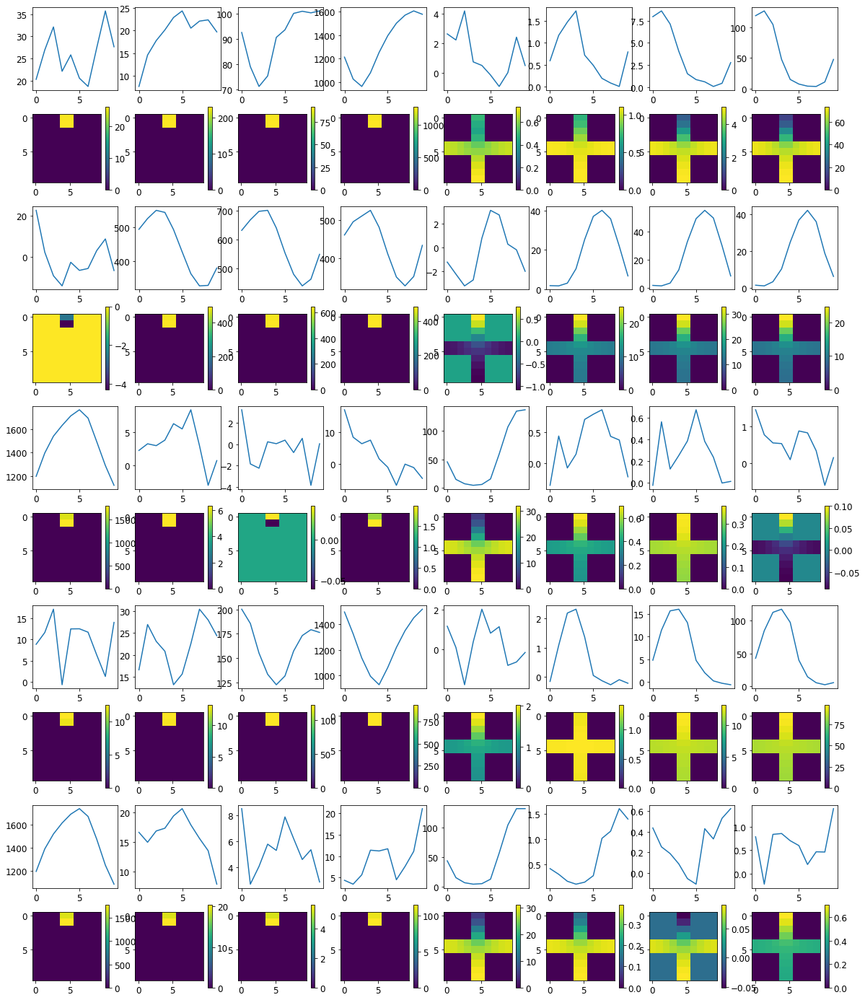


R0 generated:
[[18.12539    16.849913  ]
 [18.120136   17.03189   ]
 [17.950832   16.804607  ]
 [17.934511   16.714468  ]
 [17.85951    16.64311   ]
 [17.949703   16.70624   ]
 [18.013367   16.844997  ]
 [18.022234   16.943293  ]
 [18.085615   16.955603  ]
 [17.963255   16.775757  ]
 [10.872635   16.247284  ]
 [11.197449   16.509853  ]
 [11.646465   16.593784  ]
 [11.801811   16.582966  ]
 [11.617631   16.600317  ]
 [11.383027   16.643818  ]
 [11.2106495  16.516047  ]
 [11.155797   16.453838  ]
 [10.76704    16.408892  ]
 [10.622213   16.372145  ]
 [ 3.8162384   0.94110805]
 [ 3.9598114   0.97025037]
 [ 3.7902207   0.9407244 ]
 [ 3.8199565   0.9509287 ]
 [ 3.5566773   0.9646397 ]
 [ 3.8501492   0.9227077 ]
 [ 3.66552     0.956495  ]
 [ 3.9117305   0.9694054 ]
 [ 3.8603044   0.9986498 ]
 [ 3.9071102   1.0097765 ]
 [17.166609    0.79772323]
 [17.20304     0.7136632 ]
 [17.205883    0.6919724 ]
 [17.212406    0.7645185 ]
 [17.177118    0.824922  ]
 [17.199842    0.8807739 ]
 [17.1042    

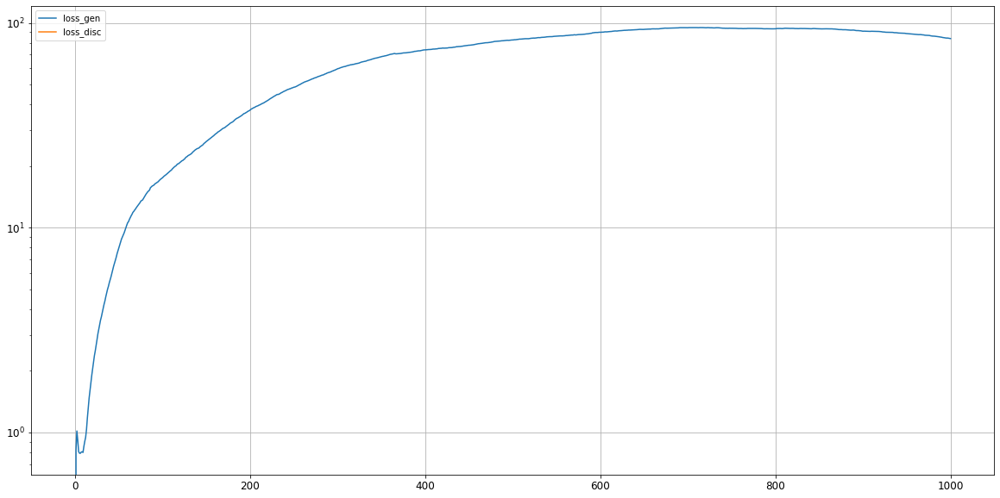

0: mean KL divergence (r,g) = 0.07153766957685842
0: mean JS divergence = 0.014968531648687567
0: mean 1-BC divergence = 0.010790037862014157

0: std KL divergence (r,g) = 0.06214443372743548
0: std JS divergence = 0.017733771332234565
0: std 1-BC divergence = 0.01435871403400002


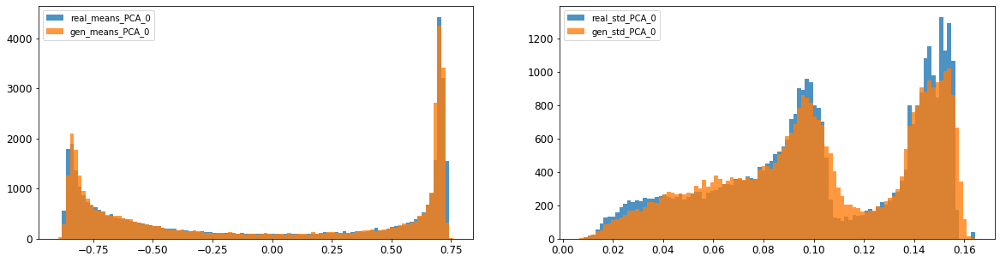

/home/viluiz/anaconda3/envs/py3ml/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


1: mean KL divergence (r,g) = inf
1: mean JS divergence = 0.005074676248145823
1: mean 1-BC divergence = 0.0036498941739827595

1: std KL divergence (r,g) = inf
1: std JS divergence = 0.01115691780378767
1: std 1-BC divergence = 0.008518589251180986


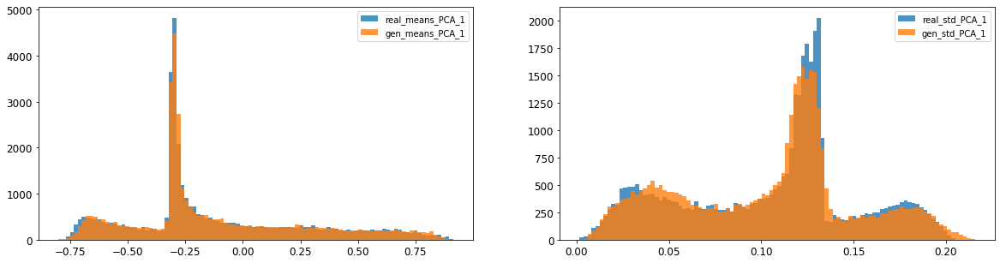

2: mean KL divergence (r,g) = 0.011906406785070194
2: mean JS divergence = 0.0028433315799709785
2: mean 1-BC divergence = 0.0019841879721856914

2: std KL divergence (r,g) = inf
2: std JS divergence = 0.014932890407950379
2: std 1-BC divergence = 0.01278763579812281


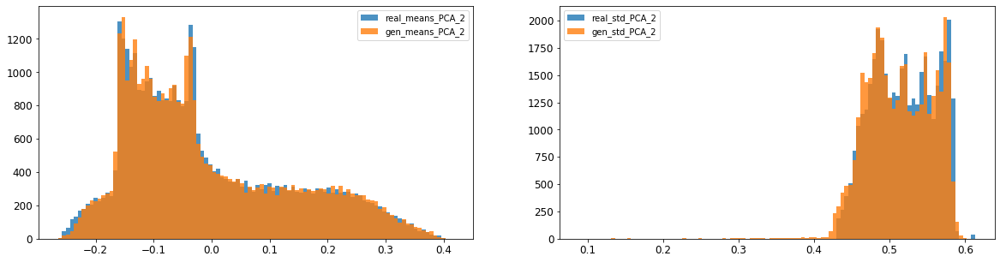

3: mean KL divergence (r,g) = 0.07727105150355552
3: mean JS divergence = 0.019253676868108957
3: mean 1-BC divergence = 0.013451721849099263

3: std KL divergence (r,g) = inf
3: std JS divergence = 0.13377109831307893
3: std 1-BC divergence = 0.11058884242898603


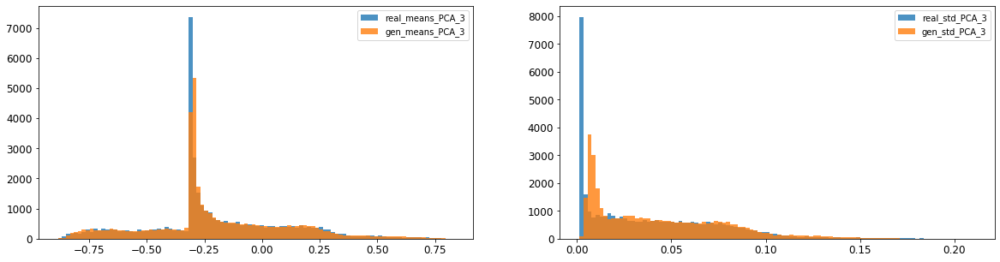

4: mean KL divergence (r,g) = 0.08034396026386886
4: mean JS divergence = 0.01712637768813044
4: mean 1-BC divergence = 0.012842950134687614

4: std KL divergence (r,g) = 0.016314812976765198
4: std JS divergence = 0.004173749166777647
4: std 1-BC divergence = 0.00305706896383684


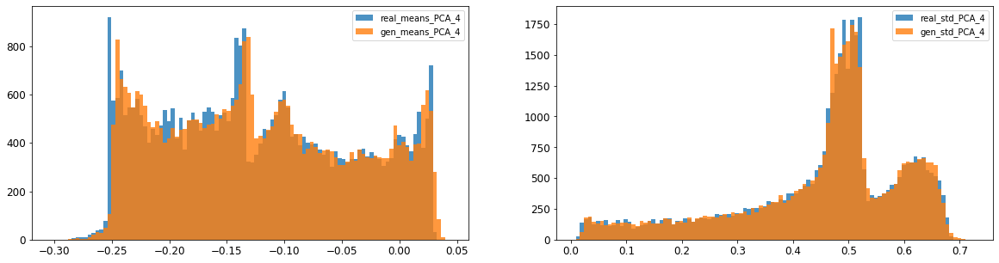

5: mean KL divergence (r,g) = inf
5: mean JS divergence = 0.020409737374742037
5: mean 1-BC divergence = 0.014920896418652685

5: std KL divergence (r,g) = inf
5: std JS divergence = 0.017545439156958838
5: std 1-BC divergence = 0.0150970056949985


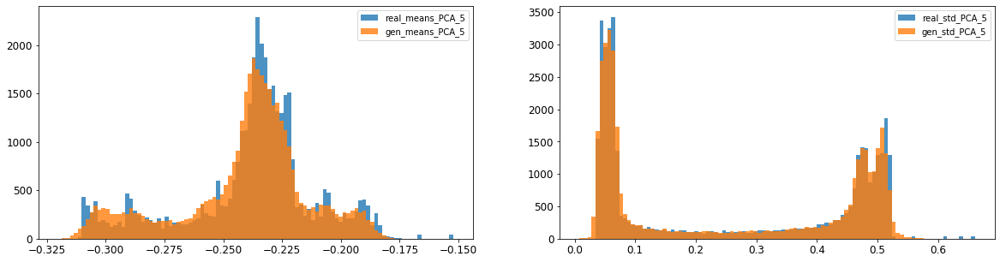

6: mean KL divergence (r,g) = inf
6: mean JS divergence = 0.014603714497658429
6: mean 1-BC divergence = 0.010310565847917674

6: std KL divergence (r,g) = inf
6: std JS divergence = 0.009460718873362868
6: std 1-BC divergence = 0.006610253252285037


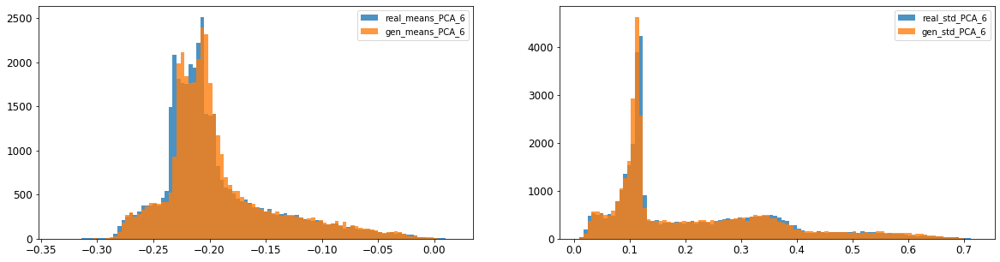

7: mean KL divergence (r,g) = 0.19114065841795974
7: mean JS divergence = 0.0422194350790929
7: mean 1-BC divergence = 0.031065306063742915

7: std KL divergence (r,g) = 0.06087952461931849
7: std JS divergence = 0.014671672917527637
7: std 1-BC divergence = 0.010637055976664311


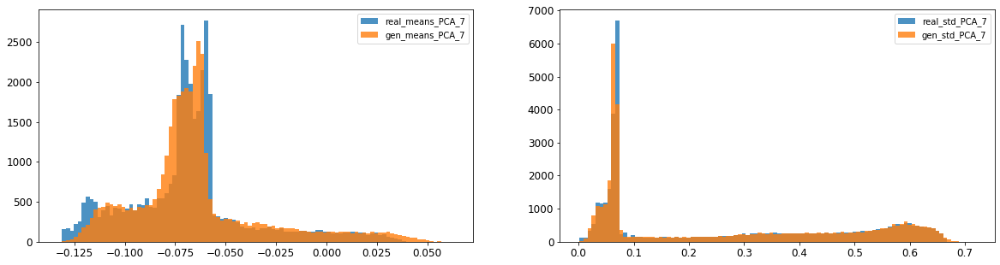

8: mean KL divergence (r,g) = inf
8: mean JS divergence = 0.005811349134158081
8: mean 1-BC divergence = 0.004078768723660753

8: std KL divergence (r,g) = inf
8: std JS divergence = 0.0053065378504899355
8: std 1-BC divergence = 0.0037743425790492946


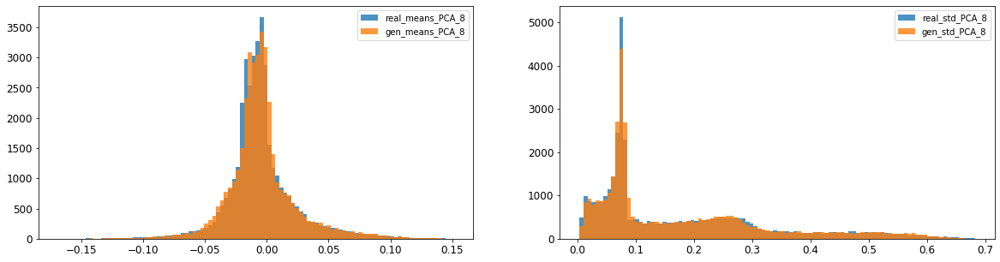

9: mean KL divergence (r,g) = inf
9: mean JS divergence = 0.002634125395580584
9: mean 1-BC divergence = 0.0019187806161108378

9: std KL divergence (r,g) = inf
9: std JS divergence = 0.010532616987331867
9: std 1-BC divergence = 0.007394684687747954


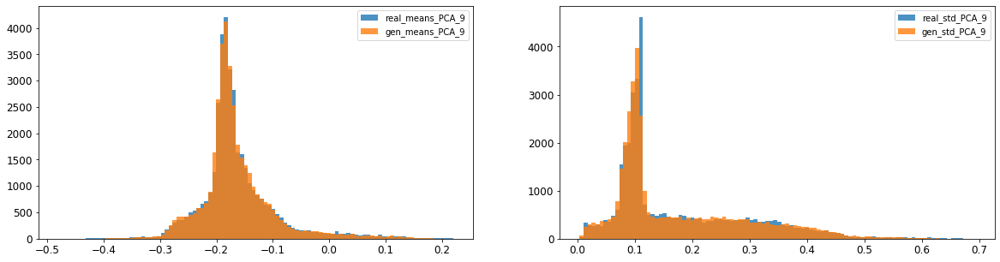

10: mean KL divergence (r,g) = inf
10: mean JS divergence = 0.026464879014792803
10: mean 1-BC divergence = 0.01847626899611443

10: std KL divergence (r,g) = inf
10: std JS divergence = 0.013389613442549714
10: std 1-BC divergence = 0.010293024931604555


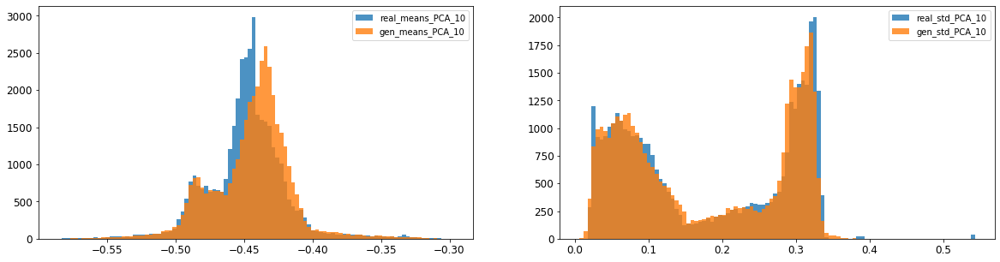

11: mean KL divergence (r,g) = 0.03476021079876078
11: mean JS divergence = 0.008280303324353066
11: mean 1-BC divergence = 0.005808461558969191

11: std KL divergence (r,g) = 0.06350438477886046
11: std JS divergence = 0.01590253978186434
11: std 1-BC divergence = 0.011256306349921474


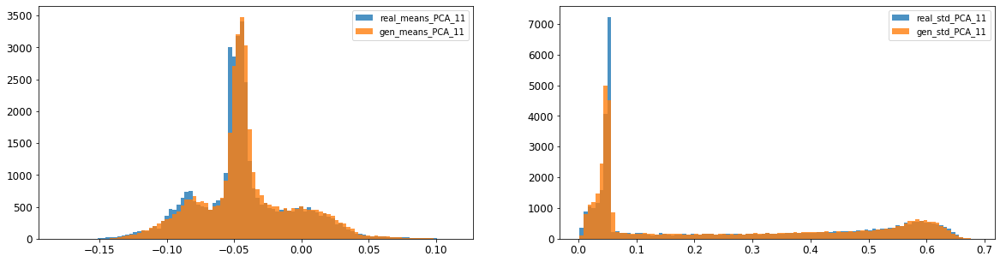

12: mean KL divergence (r,g) = inf
12: mean JS divergence = 0.017548467271476208
12: mean 1-BC divergence = 0.01228450079597454

12: std KL divergence (r,g) = inf
12: std JS divergence = 0.010154135811062642
12: std 1-BC divergence = 0.007105511817332988


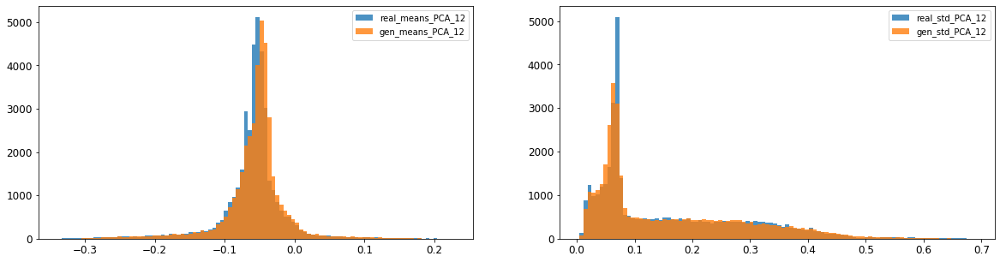

13: mean KL divergence (r,g) = inf
13: mean JS divergence = 0.0057406309389204
13: mean 1-BC divergence = 0.004075874125335721

13: std KL divergence (r,g) = inf
13: std JS divergence = 0.011565106171724397
13: std 1-BC divergence = 0.008106864013518678


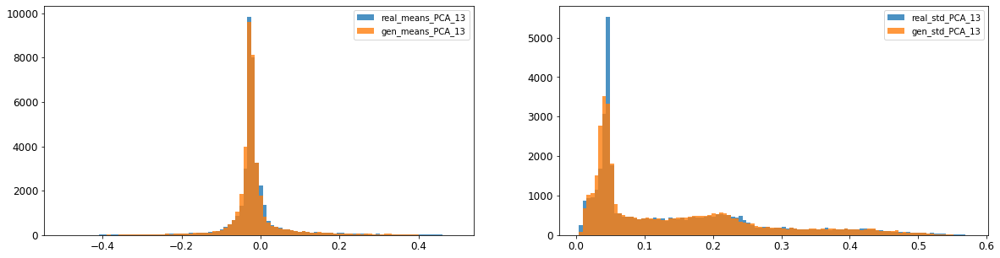

14: mean KL divergence (r,g) = inf
14: mean JS divergence = 0.010635254630843872
14: mean 1-BC divergence = 0.007453367299484093

14: std KL divergence (r,g) = 0.038602484847461635
14: std JS divergence = 0.00974058710619499
14: std 1-BC divergence = 0.006872705351572361


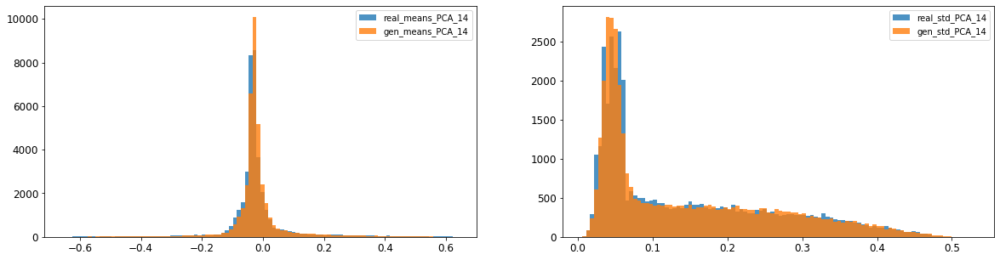

15: mean KL divergence (r,g) = 1.411335007974823
15: mean JS divergence = 0.40040642192674347
15: mean 1-BC divergence = 0.36928793170069163

15: std KL divergence (r,g) = 6.4324201828105165
15: std JS divergence = 0.9543612135192135
15: std 1-BC divergence = 0.8923970222032063


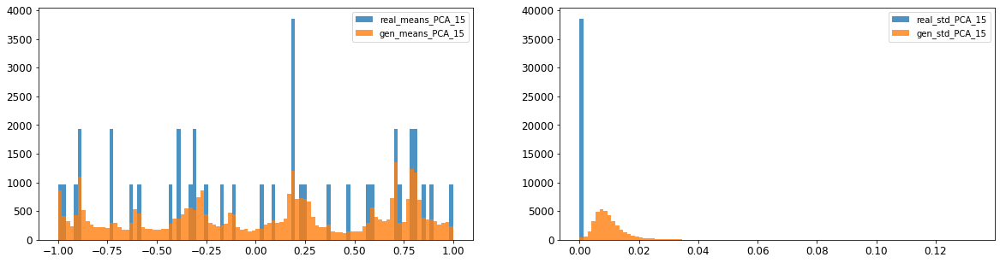

16: mean KL divergence (r,g) = 1.248615603811379
16: mean JS divergence = 0.3562285857526848
16: mean 1-BC divergence = 0.3299865865165006

16: std KL divergence (r,g) = 5.622295285423469
16: std JS divergence = 0.928138662181873
16: std 1-BC divergence = 0.8575179230086848


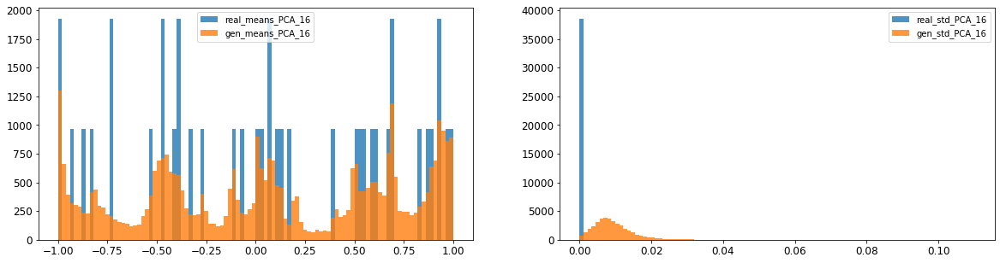



--------------------------------------------------------

Compose KL divergence (r,g) = inf
Compose JS divergence = 0.017121729527251953
Compose 1-BC divergence = 0.012985672918958469

Compose weighted KL divergence (r,g) = inf
Compose weighted JS divergence = 0.016824306163528455
Compose weighted 1-BC divergence = 0.013074652780789786

Multivariate KL divergence = 40.01385896282314


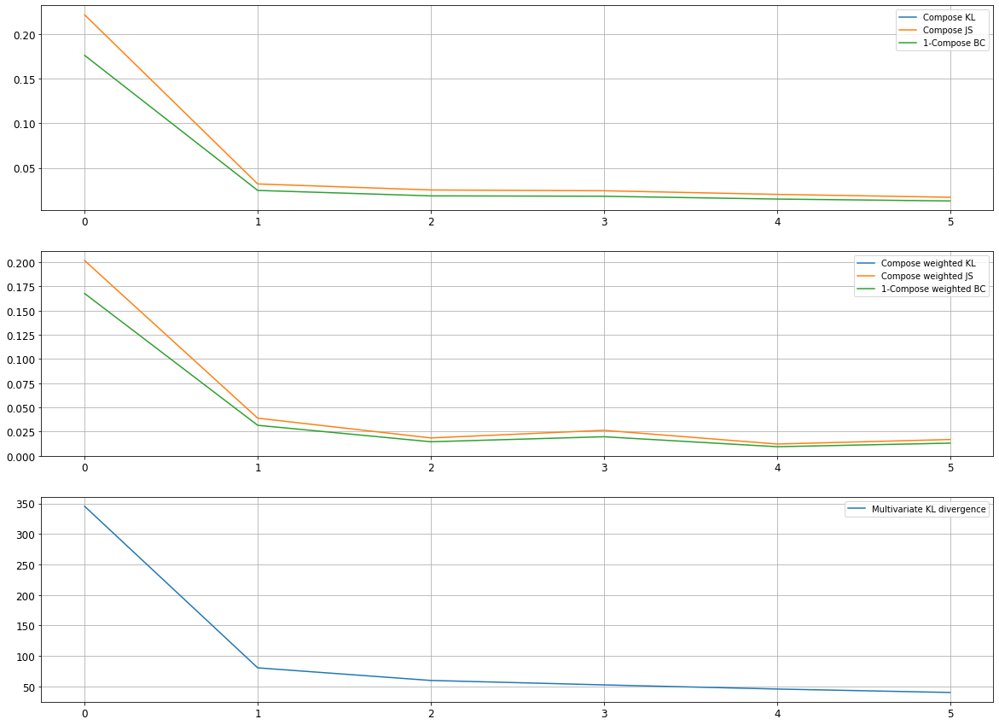

Epoch 1002/10000
discriminator loss: -0.122868 - generator loss: 83.658806 - 146s
Epoch 1003/10000
discriminator loss: -0.124169 - generator loss: 83.578842 - 147s
Epoch 1004/10000
discriminator loss: -0.124458 - generator loss: 83.479797 - 148s
Epoch 1005/10000
discriminator loss: -0.122887 - generator loss: 83.386620 - 146s
Epoch 1006/10000
discriminator loss: -0.124925 - generator loss: 83.189812 - 147s
Epoch 1007/10000
discriminator loss: -0.124635 - generator loss: 82.945541 - 147s
Epoch 1008/10000
discriminator loss: -0.121696 - generator loss: 82.970161 - 142s
Epoch 1009/10000
discriminator loss: -0.121663 - generator loss: 82.840271 - 118s
Epoch 1010/10000
discriminator loss: -0.123194 - generator loss: 82.731964 - 118s
Epoch 1011/10000
discriminator loss: -0.120251 - generator loss: 82.620392 - 118s
Epoch 1012/10000
discriminator loss: -0.121857 - generator loss: 82.518761 - 149s
Epoch 1013/10000
discriminator loss: -0.121111 - generator loss: 82.409798 - 149s
Epoch 1014/10000

discriminator loss: -0.109527 - generator loss: 71.540260 - 148s
Epoch 1103/10000
discriminator loss: -0.109696 - generator loss: 71.371338 - 147s
Epoch 1104/10000
discriminator loss: -0.107115 - generator loss: 71.181015 - 149s
Epoch 1105/10000
discriminator loss: -0.107533 - generator loss: 71.098434 - 148s
Epoch 1106/10000
discriminator loss: -0.107668 - generator loss: 71.019203 - 148s
Epoch 1107/10000
discriminator loss: -0.107377 - generator loss: 71.034668 - 148s
Epoch 1108/10000
discriminator loss: -0.107710 - generator loss: 70.950729 - 147s
Epoch 1109/10000
discriminator loss: -0.106656 - generator loss: 70.790588 - 148s
Epoch 1110/10000
discriminator loss: -0.107342 - generator loss: 70.602219 - 148s
Epoch 1111/10000
discriminator loss: -0.107778 - generator loss: 70.467613 - 146s
Epoch 1112/10000
discriminator loss: -0.105741 - generator loss: 70.291702 - 148s
Epoch 1113/10000
discriminator loss: -0.106341 - generator loss: 70.091423 - 148s
Epoch 1114/10000
discriminator lo

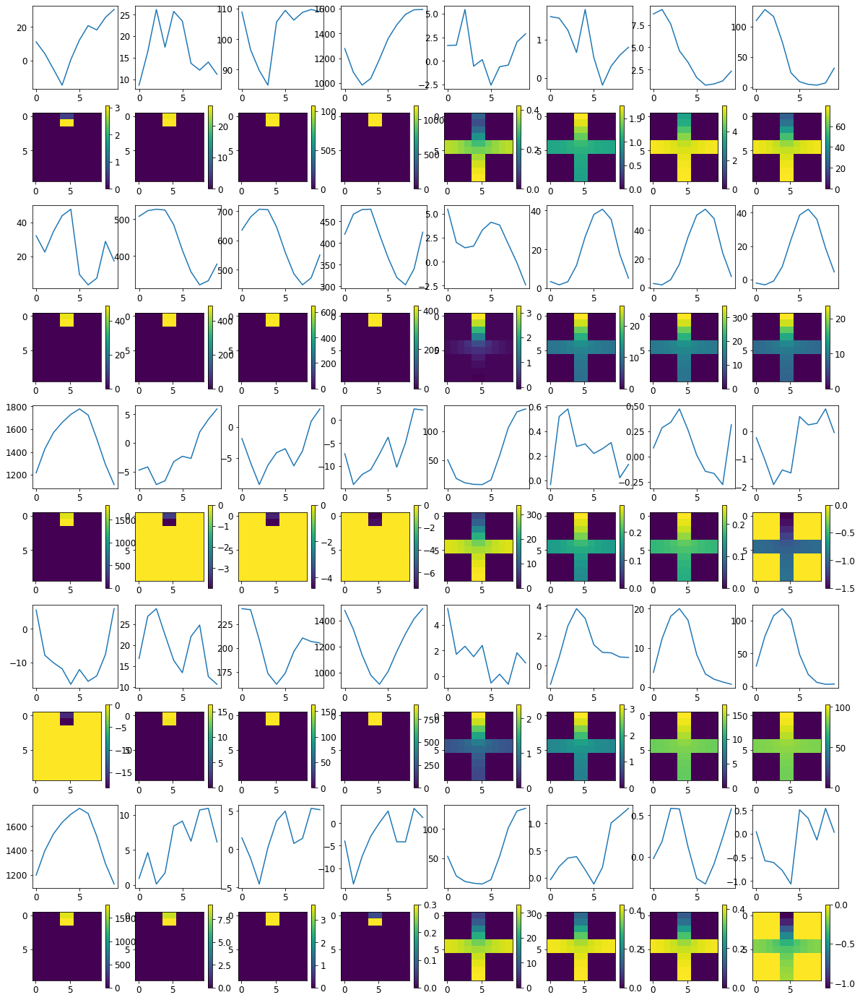


R0 generated:
[[16.439651   18.29581   ]
 [16.326532   18.475042  ]
 [16.030695   18.40582   ]
 [16.156183   18.382547  ]
 [16.09487    18.544987  ]
 [16.220364   18.480259  ]
 [16.20157    18.53609   ]
 [16.05847    18.517069  ]
 [16.280844   18.522762  ]
 [16.129826   18.447721  ]
 [ 6.928757   16.555046  ]
 [ 6.9958453  16.769753  ]
 [ 7.1624517  16.872936  ]
 [ 7.1186795  16.957943  ]
 [ 7.2662     16.916119  ]
 [ 7.301678   16.98926   ]
 [ 7.454052   16.880041  ]
 [ 7.52247    16.842455  ]
 [ 7.7484217  16.800512  ]
 [ 7.5654764  16.814575  ]
 [ 3.6323638   0.82528067]
 [ 3.7098737   0.8656803 ]
 [ 3.6482558   0.8848171 ]
 [ 3.5937328   0.84454864]
 [ 3.6695614   0.8448822 ]
 [ 3.8390536   0.81905836]
 [ 3.8728645   0.848284  ]
 [ 3.901296    0.77805054]
 [ 3.9036787   0.84410083]
 [ 3.8294094   0.8685445 ]
 [17.129263    1.1519386 ]
 [17.032318    0.91769475]
 [17.18821     1.0640645 ]
 [17.19655     1.0794969 ]
 [17.243233    1.1199822 ]
 [17.330793    1.0663818 ]
 [17.317684  

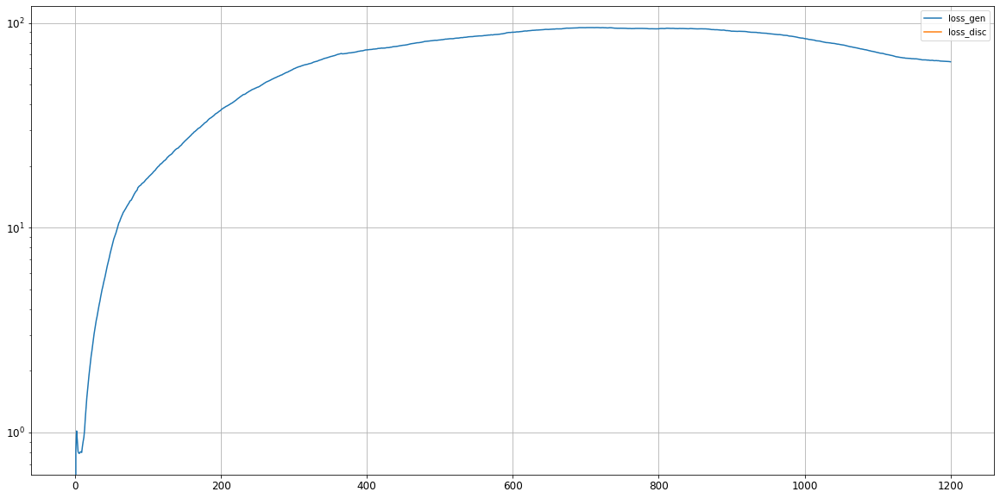

0: mean KL divergence (r,g) = 0.04319156831826115
0: mean JS divergence = 0.013175151566469907
0: mean 1-BC divergence = 0.010187779258836072

0: std KL divergence (r,g) = 0.07390934223717137
0: std JS divergence = 0.01843875793067247
0: std 1-BC divergence = 0.014337781999242183


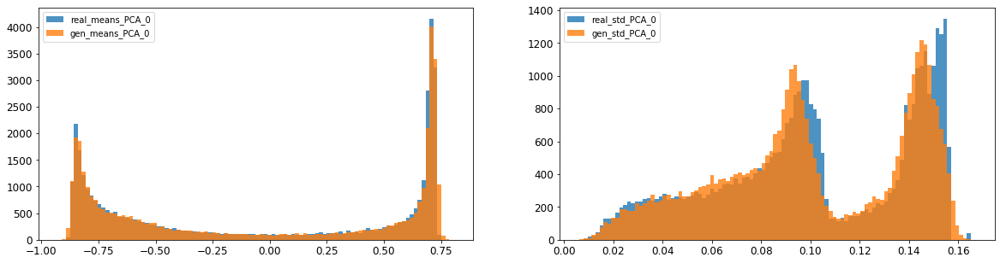

/home/viluiz/anaconda3/envs/py3ml/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


1: mean KL divergence (r,g) = inf
1: mean JS divergence = 0.011482487367385778
1: mean 1-BC divergence = 0.008186418690335873

1: std KL divergence (r,g) = inf
1: std JS divergence = 0.027006771785958936
1: std 1-BC divergence = 0.02269914704202891


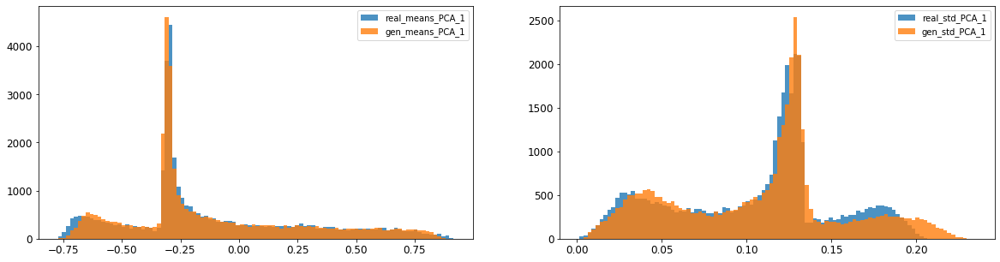

2: mean KL divergence (r,g) = 0.019444423048919836
2: mean JS divergence = 0.004473461747270443
2: mean 1-BC divergence = 0.0031407356260959585

2: std KL divergence (r,g) = 0.07123881906107207
2: std JS divergence = 0.018009945524990082
2: std 1-BC divergence = 0.014418008542161798


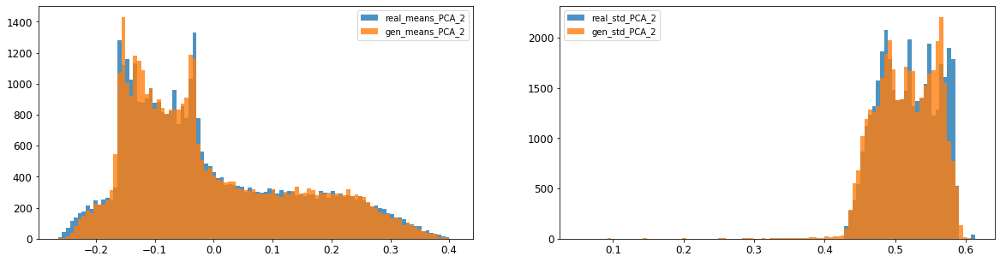

3: mean KL divergence (r,g) = 0.052223005712995166
3: mean JS divergence = 0.01282148973359222
3: mean 1-BC divergence = 0.009120035673956473

3: std KL divergence (r,g) = inf
3: std JS divergence = 0.11934734503839187
3: std 1-BC divergence = 0.09424184571543326


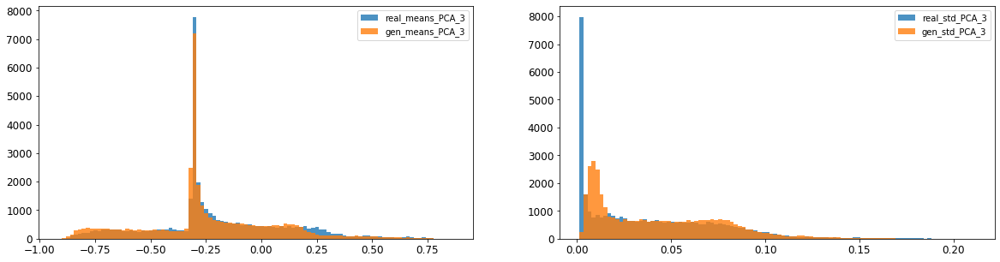

4: mean KL divergence (r,g) = 0.09106085087890858
4: mean JS divergence = 0.02618575253469692
4: mean 1-BC divergence = 0.020584738241656964

4: std KL divergence (r,g) = 0.06876533199320511
4: std JS divergence = 0.01666413923219671
4: std 1-BC divergence = 0.012017345331689189


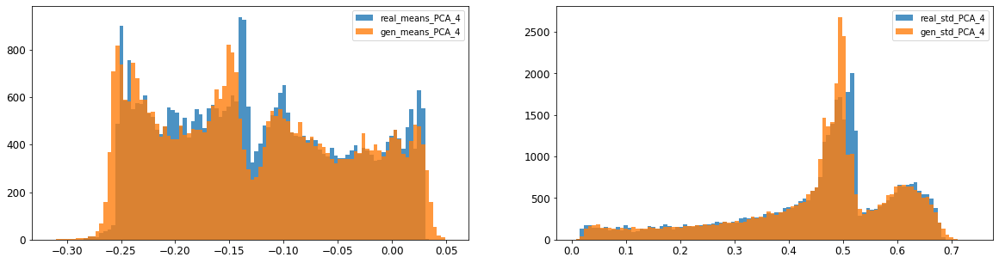

5: mean KL divergence (r,g) = inf
5: mean JS divergence = 0.045281911585960156
5: mean 1-BC divergence = 0.03255957010738686

5: std KL divergence (r,g) = inf
5: std JS divergence = 0.052692057603993356
5: std 1-BC divergence = 0.04199155691138834


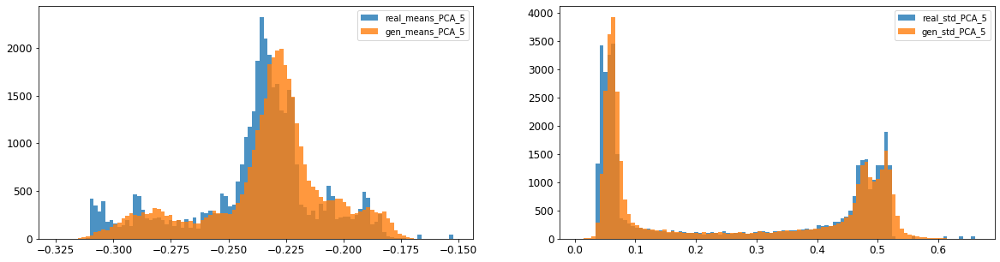

6: mean KL divergence (r,g) = 0.06511740300667022
6: mean JS divergence = 0.014950213806380694
6: mean 1-BC divergence = 0.01051351883495888

6: std KL divergence (r,g) = inf
6: std JS divergence = 0.013621899352146104
6: std 1-BC divergence = 0.009696693794509548


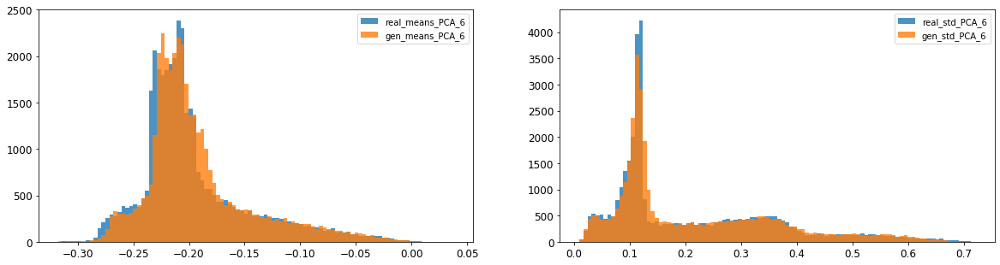

7: mean KL divergence (r,g) = 0.14380222561730815
7: mean JS divergence = 0.033428833073114686
7: mean 1-BC divergence = 0.024474250988114954

7: std KL divergence (r,g) = 0.11077746810687558
7: std JS divergence = 0.025405289889461412
7: std 1-BC divergence = 0.018591595289361273


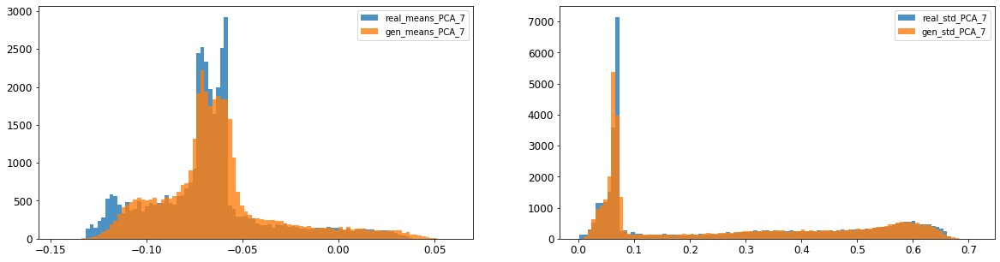

8: mean KL divergence (r,g) = inf
8: mean JS divergence = 0.04331536933483621
8: mean 1-BC divergence = 0.030460735240048664

8: std KL divergence (r,g) = inf
8: std JS divergence = 0.013004985415389136
8: std 1-BC divergence = 0.009223053863413933


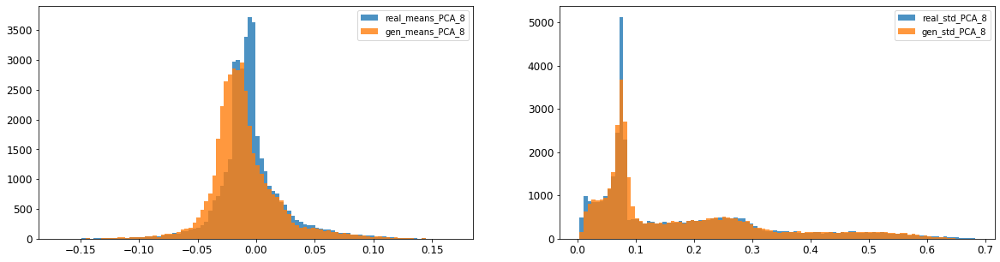

9: mean KL divergence (r,g) = inf
9: mean JS divergence = 0.004154070874376446
9: mean 1-BC divergence = 0.0029762252859736327

9: std KL divergence (r,g) = inf
9: std JS divergence = 0.012109701831730008
9: std 1-BC divergence = 0.008508179096251567


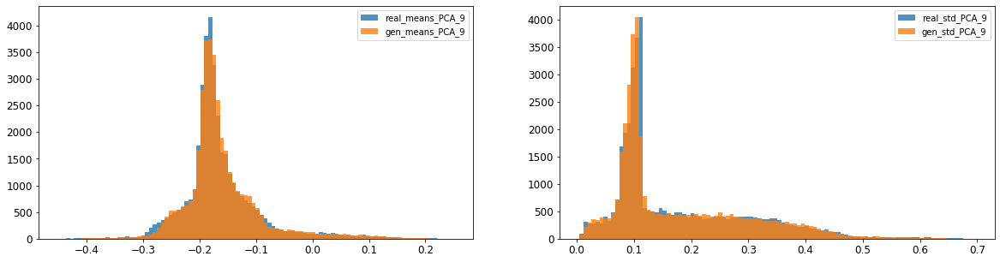

10: mean KL divergence (r,g) = inf
10: mean JS divergence = 0.0362918583082658
10: mean 1-BC divergence = 0.02540669103352322

10: std KL divergence (r,g) = inf
10: std JS divergence = 0.01769299557755889
10: std 1-BC divergence = 0.014020886565354274


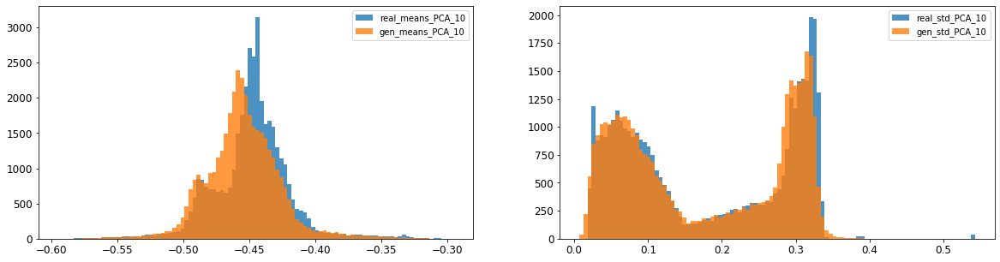

11: mean KL divergence (r,g) = inf
11: mean JS divergence = 0.01182805579954099
11: mean 1-BC divergence = 0.00832156456374944

11: std KL divergence (r,g) = 0.09755455932389688
11: std JS divergence = 0.022965378176777157
11: std 1-BC divergence = 0.016898658631815278


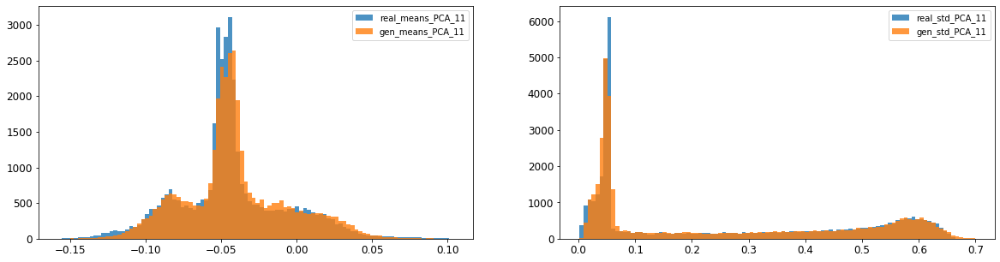

12: mean KL divergence (r,g) = inf
12: mean JS divergence = 0.011186721374927659
12: mean 1-BC divergence = 0.007925850272527457

12: std KL divergence (r,g) = inf
12: std JS divergence = 0.021928337096622286
12: std 1-BC divergence = 0.015413913247898314


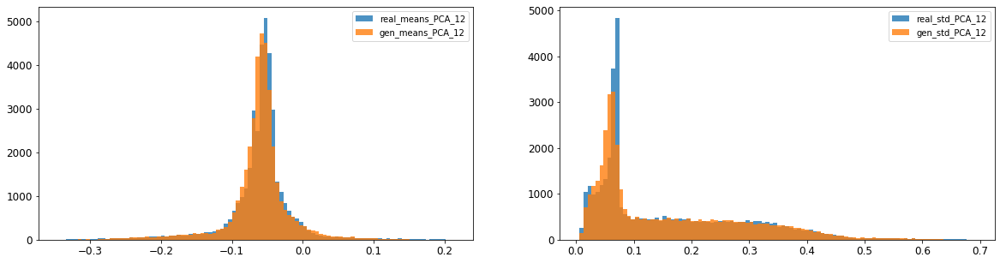

13: mean KL divergence (r,g) = 0.01920997426128724
13: mean JS divergence = 0.0047783671083101616
13: mean 1-BC divergence = 0.0033384061557951705

13: std KL divergence (r,g) = inf
13: std JS divergence = 0.02779381726420875
13: std 1-BC divergence = 0.01959079326209745


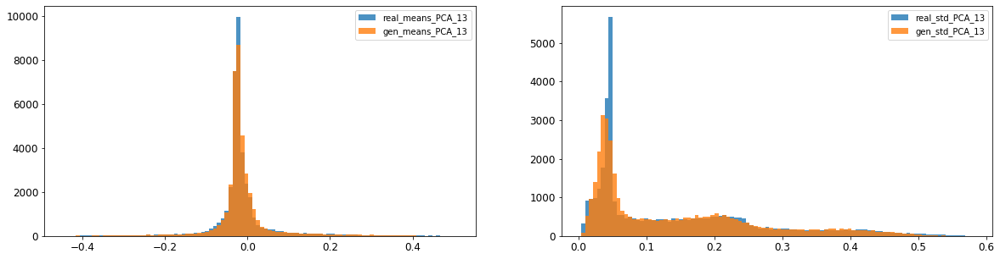

14: mean KL divergence (r,g) = inf
14: mean JS divergence = 0.05117294065411212
14: mean 1-BC divergence = 0.03625342644141416

14: std KL divergence (r,g) = 0.04210919821035318
14: std JS divergence = 0.010173258557773436
14: std 1-BC divergence = 0.007239019955929682


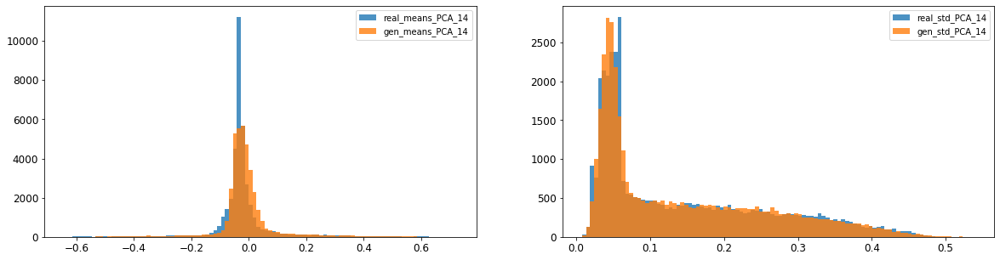

15: mean KL divergence (r,g) = 1.3682231005572771
15: mean JS divergence = 0.3898027001880223
15: mean 1-BC divergence = 0.359691755946946

15: std KL divergence (r,g) = 7.4585330231296485
15: std JS divergence = 0.9746850286367013
15: std 1-BC divergence = 0.9245986853201371


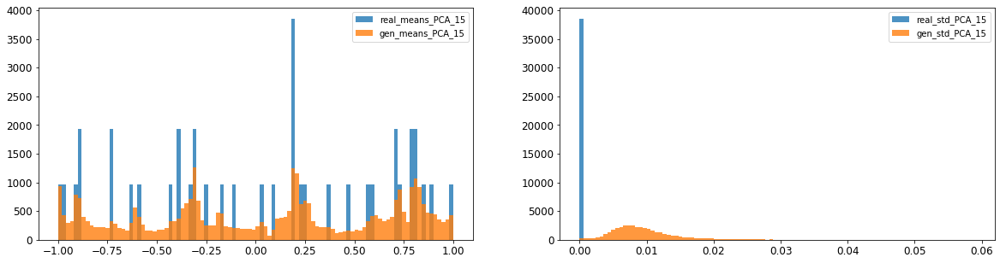

16: mean KL divergence (r,g) = 1.2050222917214841
16: mean JS divergence = 0.3452664150244134
16: mean 1-BC divergence = 0.3200847223123733

16: std KL divergence (r,g) = 7.028748938481618
16: std JS divergence = 0.967540219244537
16: std 1-BC divergence = 0.9124879477221948


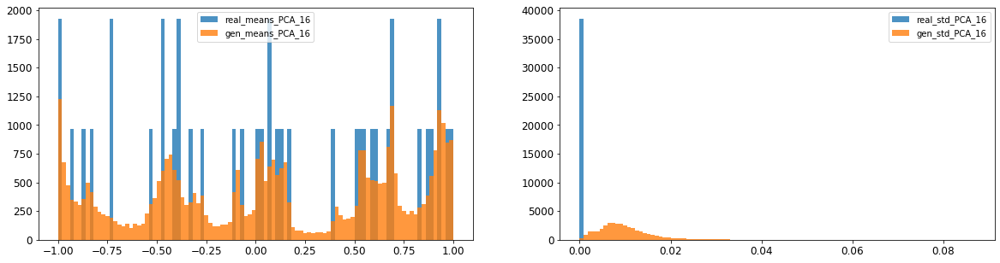



--------------------------------------------------------

Compose KL divergence (r,g) = inf
Compose JS divergence = 0.02471271217157036
Compose 1-BC divergence = 0.018411280855431755

Compose weighted KL divergence (r,g) = inf
Compose weighted JS divergence = 0.019660760737152904
Compose weighted 1-BC divergence = 0.015303450457129109

Multivariate KL divergence = 60.96086508142591


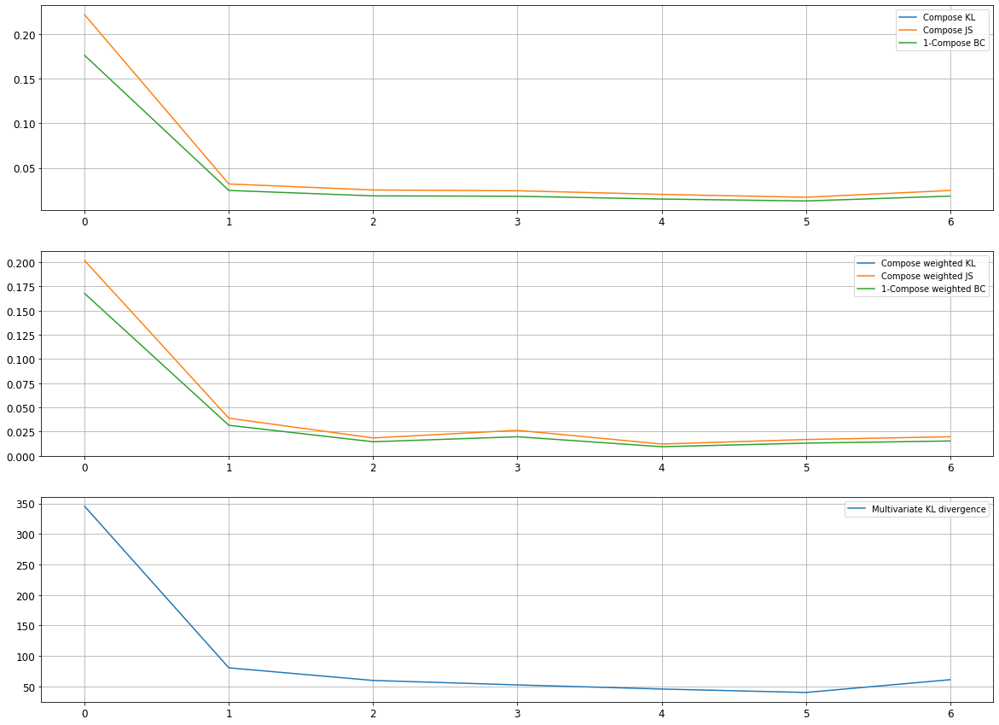

Epoch 1202/10000
discriminator loss: -0.060999 - generator loss: 64.511871 - 145s
Epoch 1203/10000
discriminator loss: -0.060728 - generator loss: 64.361740 - 148s
Epoch 1204/10000
discriminator loss: -0.060672 - generator loss: 64.253189 - 149s
Epoch 1205/10000
discriminator loss: -0.060590 - generator loss: 64.261261 - 147s
Epoch 1206/10000
discriminator loss: -0.059728 - generator loss: 64.178352 - 148s
Epoch 1207/10000
discriminator loss: -0.058999 - generator loss: 64.123482 - 148s
Epoch 1208/10000
discriminator loss: -0.060789 - generator loss: 63.988335 - 148s
Epoch 1209/10000
discriminator loss: -0.057965 - generator loss: 63.884220 - 148s
Epoch 1210/10000
discriminator loss: -0.059749 - generator loss: 63.900883 - 148s
Epoch 1211/10000
discriminator loss: -0.056365 - generator loss: 63.769402 - 123s
Epoch 1212/10000
discriminator loss: -0.061109 - generator loss: 63.721668 - 119s
Epoch 1213/10000
discriminator loss: -0.057820 - generator loss: 63.605652 - 120s
Epoch 1214/10000

discriminator loss: -0.045929 - generator loss: 54.515320 - 148s
Epoch 1303/10000
discriminator loss: -0.045020 - generator loss: 54.468044 - 147s
Epoch 1304/10000
discriminator loss: -0.043967 - generator loss: 54.390995 - 147s
Epoch 1305/10000
discriminator loss: -0.044984 - generator loss: 54.384907 - 147s
Epoch 1306/10000
discriminator loss: -0.043460 - generator loss: 54.337231 - 148s
Epoch 1307/10000
discriminator loss: -0.043910 - generator loss: 54.137016 - 148s
Epoch 1308/10000
discriminator loss: -0.043849 - generator loss: 54.061600 - 148s
Epoch 1309/10000
discriminator loss: -0.044138 - generator loss: 53.941708 - 147s
Epoch 1310/10000
discriminator loss: -0.045905 - generator loss: 53.758801 - 148s
Epoch 1311/10000
discriminator loss: -0.044184 - generator loss: 53.628319 - 147s
Epoch 1312/10000
discriminator loss: -0.043774 - generator loss: 53.616573 - 146s
Epoch 1313/10000
discriminator loss: -0.042525 - generator loss: 53.480045 - 147s
Epoch 1314/10000
discriminator lo

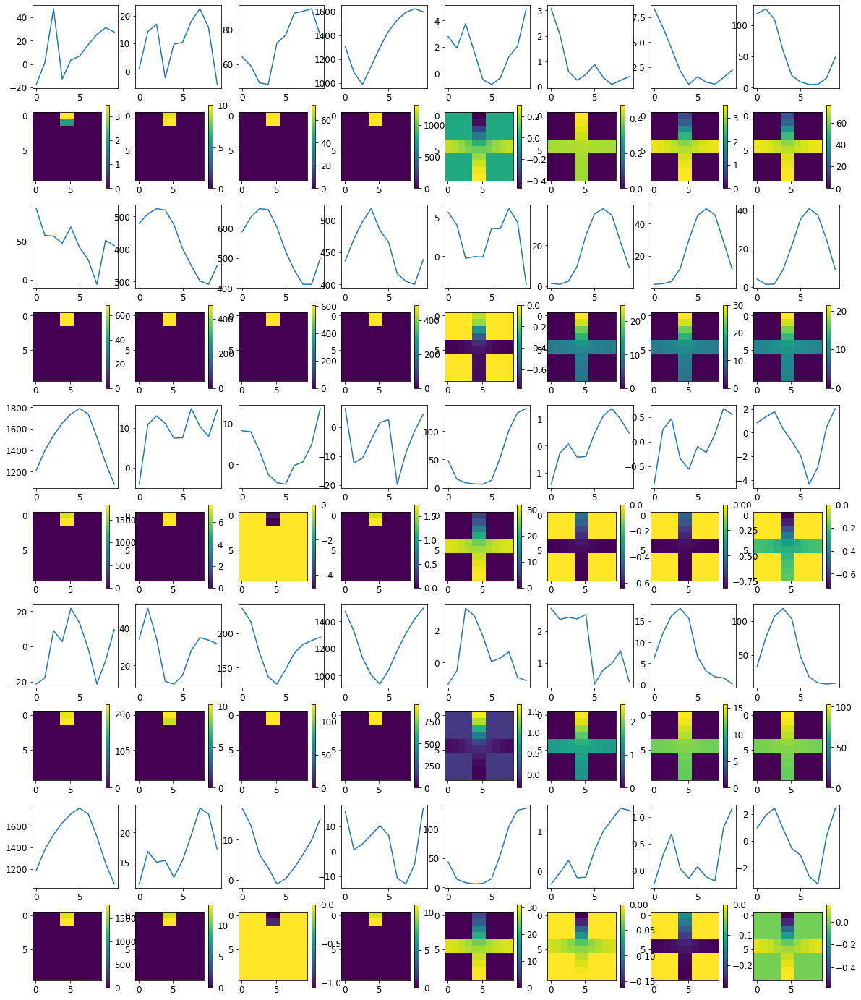


R0 generated:
[[15.163718   18.9295    ]
 [15.073805   18.92637   ]
 [14.921556   18.945728  ]
 [14.677874   18.963587  ]
 [14.681552   18.963627  ]
 [14.611272   18.967897  ]
 [14.868667   19.060528  ]
 [14.801409   19.10327   ]
 [14.972364   19.066921  ]
 [14.964693   19.051119  ]
 [ 7.344893   15.896295  ]
 [ 7.00647    15.632649  ]
 [ 7.0598993  15.744104  ]
 [ 7.0526686  15.944649  ]
 [ 6.9862523  16.018904  ]
 [ 6.9550285  15.946327  ]
 [ 7.1753345  16.096912  ]
 [ 7.261687   16.165892  ]
 [ 7.350509   16.114     ]
 [ 7.342816   16.198513  ]
 [ 2.9894748   0.91729826]
 [ 3.0160518   0.8746641 ]
 [ 2.9465725   0.8219097 ]
 [ 2.7911417   0.8879251 ]
 [ 2.7111914   0.74055356]
 [ 2.6178029   0.7631599 ]
 [ 2.69622     0.83610594]
 [ 2.8032515   0.715279  ]
 [ 2.865024    0.79116976]
 [ 2.8451943   0.84811145]
 [16.999834    1.215323  ]
 [17.02743     0.98993236]
 [16.97446     1.1368252 ]
 [16.892418    1.2656015 ]
 [17.009409    1.3496733 ]
 [17.092186    1.0204595 ]
 [17.10449   

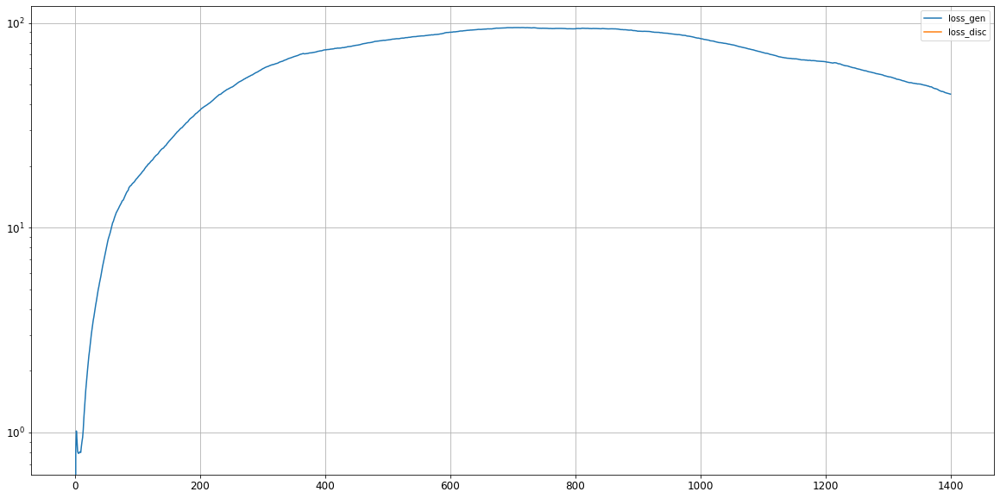

0: mean KL divergence (r,g) = 0.16359203768142294
0: mean JS divergence = 0.041075468650427105
0: mean 1-BC divergence = 0.0314436060832769

0: std KL divergence (r,g) = 0.2030122930555964
0: std JS divergence = 0.06261195128087135
0: std 1-BC divergence = 0.05653961452558043


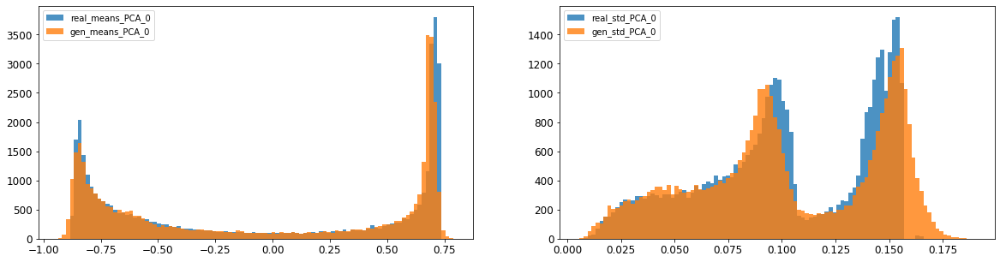

1: mean KL divergence (r,g) = 0.22049323956229316
1: mean JS divergence = 0.045770411671032754
1: mean 1-BC divergence = 0.033749251177142114

1: std KL divergence (r,g) = 0.07407719544982459
1: std JS divergence = 0.017395076064527788
1: std 1-BC divergence = 0.012236074353640491


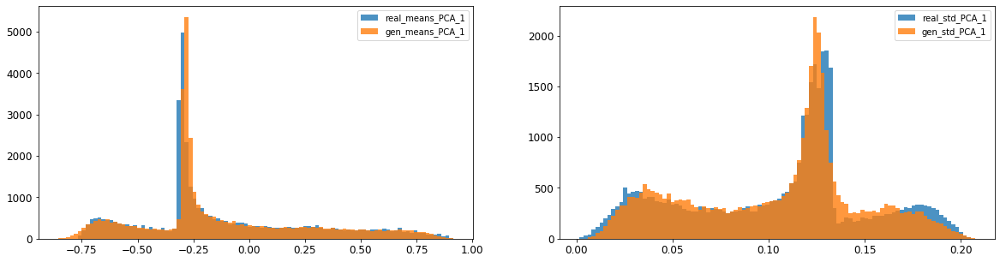

2: mean KL divergence (r,g) = 0.0176585546842573
2: mean JS divergence = 0.004612213701319739
2: mean 1-BC divergence = 0.003488475241840705

2: std KL divergence (r,g) = 0.08966395276917405
2: std JS divergence = 0.023257732652481582
2: std 1-BC divergence = 0.01820934930932483


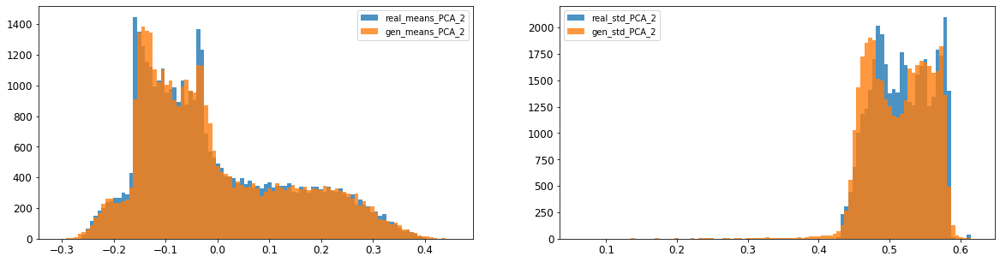

3: mean KL divergence (r,g) = 0.12440818532939497
3: mean JS divergence = 0.030583994872855763
3: mean 1-BC divergence = 0.021552868926271285

3: std KL divergence (r,g) = inf
3: std JS divergence = 0.11570684819349965
3: std 1-BC divergence = 0.0931792234729153


/home/viluiz/anaconda3/envs/py3ml/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


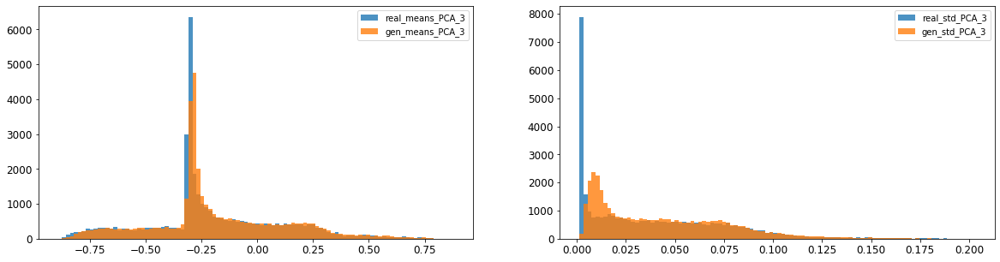

4: mean KL divergence (r,g) = 0.08968069174954153
4: mean JS divergence = 0.022457180317032775
4: mean 1-BC divergence = 0.016192697131882317

4: std KL divergence (r,g) = 0.08221959824120775
4: std JS divergence = 0.018918388312168348
4: std 1-BC divergence = 0.01399258750202037


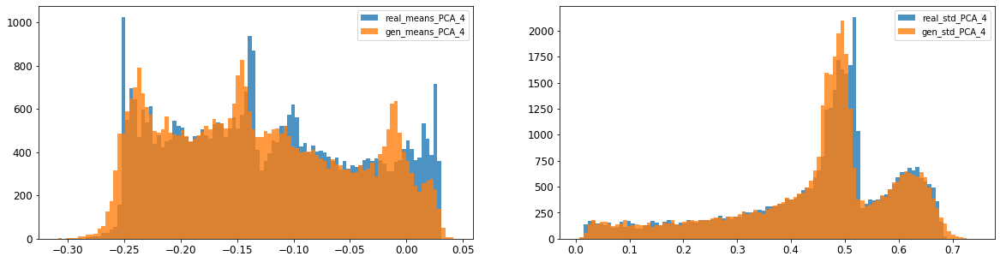

5: mean KL divergence (r,g) = inf
5: mean JS divergence = 0.07966281720123598
5: mean 1-BC divergence = 0.05785137642192906

5: std KL divergence (r,g) = inf
5: std JS divergence = 0.04571219417684283
5: std 1-BC divergence = 0.03481659079050825


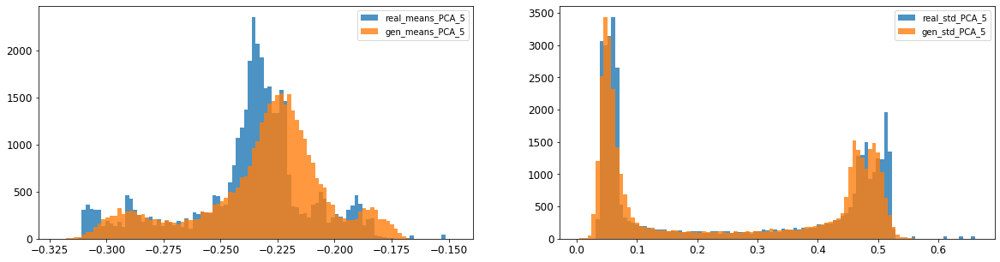

6: mean KL divergence (r,g) = inf
6: mean JS divergence = 0.010456796052775375
6: mean 1-BC divergence = 0.007407393946977092

6: std KL divergence (r,g) = 0.08529023244668445
6: std JS divergence = 0.021060447975684606
6: std 1-BC divergence = 0.014776434233168878


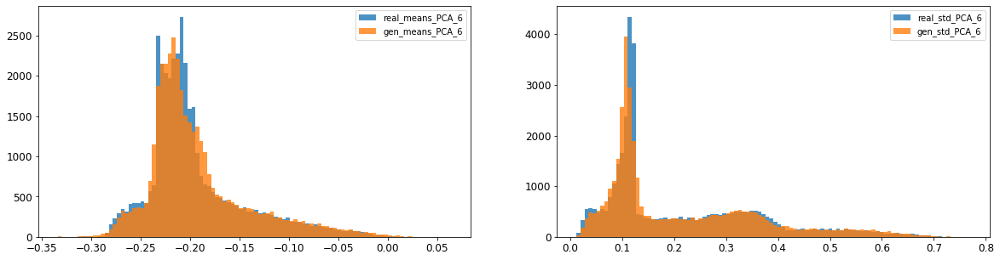

7: mean KL divergence (r,g) = inf
7: mean JS divergence = 0.04516195517994917
7: mean 1-BC divergence = 0.03677526150022692

7: std KL divergence (r,g) = 0.11424000032400078
7: std JS divergence = 0.027638829886656564
7: std 1-BC divergence = 0.020663858625227793


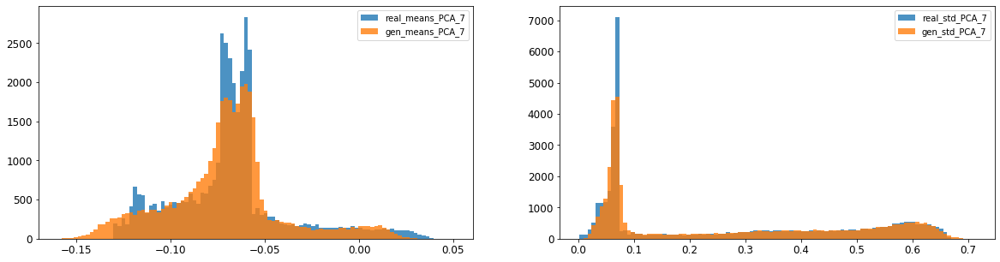

8: mean KL divergence (r,g) = inf
8: mean JS divergence = 0.017692750942996348
8: mean 1-BC divergence = 0.012368734515025626

8: std KL divergence (r,g) = 0.06130717921551406
8: std JS divergence = 0.01394522056085511
8: std 1-BC divergence = 0.009880085442771969


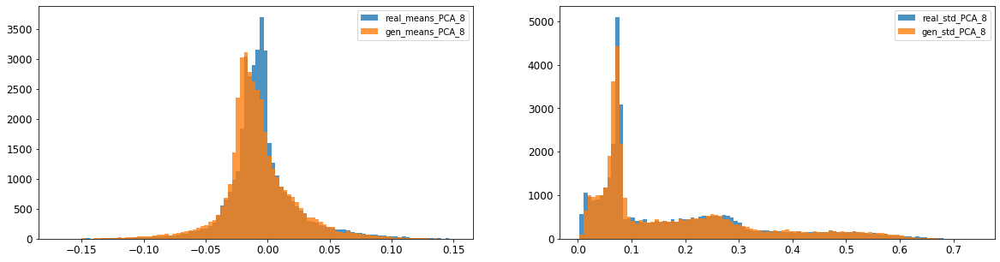

9: mean KL divergence (r,g) = 0.020421996263928568
9: mean JS divergence = 0.005121659524252899
9: mean 1-BC divergence = 0.0035968489192742537

9: std KL divergence (r,g) = inf
9: std JS divergence = 0.01778521427356845
9: std 1-BC divergence = 0.012458366890599093


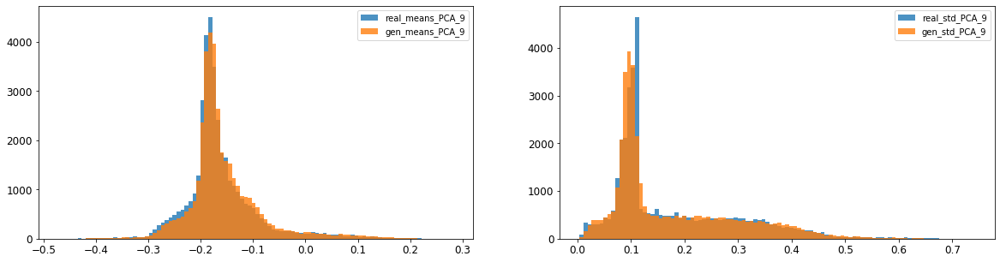

10: mean KL divergence (r,g) = inf
10: mean JS divergence = 0.013448244607069691
10: mean 1-BC divergence = 0.00941442789875424

10: std KL divergence (r,g) = inf
10: std JS divergence = 0.022534834034534844
10: std 1-BC divergence = 0.019056245037478603


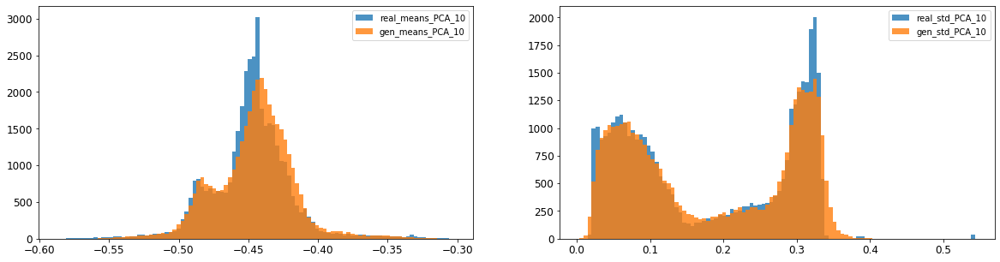

11: mean KL divergence (r,g) = 0.12834106467127301
11: mean JS divergence = 0.032626244875186595
11: mean 1-BC divergence = 0.023046928965853142

11: std KL divergence (r,g) = 0.1860680520664944
11: std JS divergence = 0.04514081334356667
11: std 1-BC divergence = 0.03388321231535385


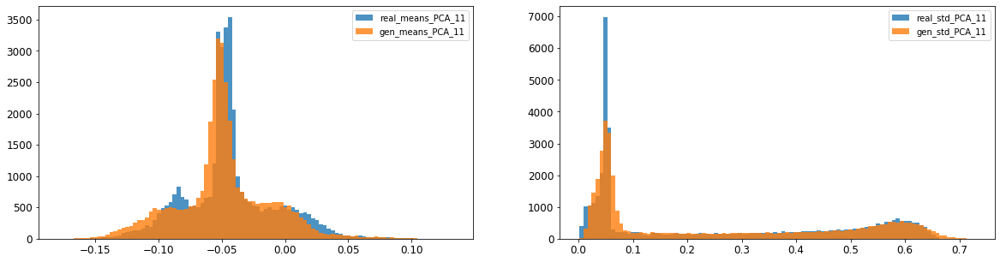

12: mean KL divergence (r,g) = inf
12: mean JS divergence = 0.009914699907965046
12: mean 1-BC divergence = 0.006969197709854269

12: std KL divergence (r,g) = inf
12: std JS divergence = 0.024735830695329586
12: std 1-BC divergence = 0.01736275890620742


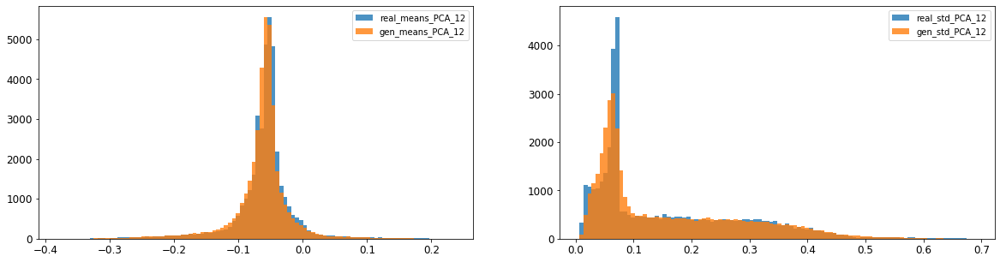

13: mean KL divergence (r,g) = inf
13: mean JS divergence = 0.02013946172242729
13: mean 1-BC divergence = 0.014086854532520676

13: std KL divergence (r,g) = 0.13399541228549194
13: std JS divergence = 0.031004980343636225
13: std 1-BC divergence = 0.021960173666334737


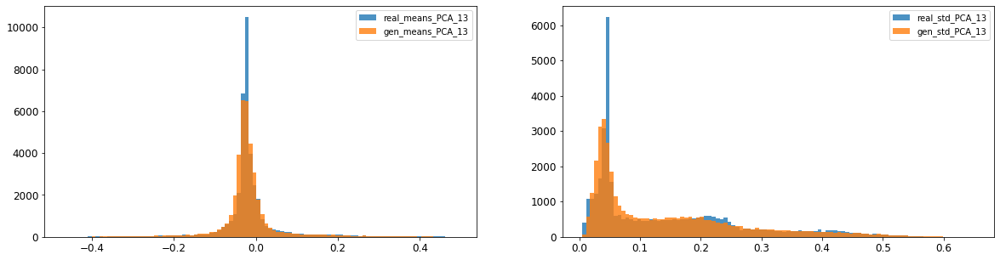

14: mean KL divergence (r,g) = inf
14: mean JS divergence = 0.027005284471564323
14: mean 1-BC divergence = 0.01900725518308677

14: std KL divergence (r,g) = 0.04776171842944164
14: std JS divergence = 0.012376496364651091
14: std 1-BC divergence = 0.00911812035556836


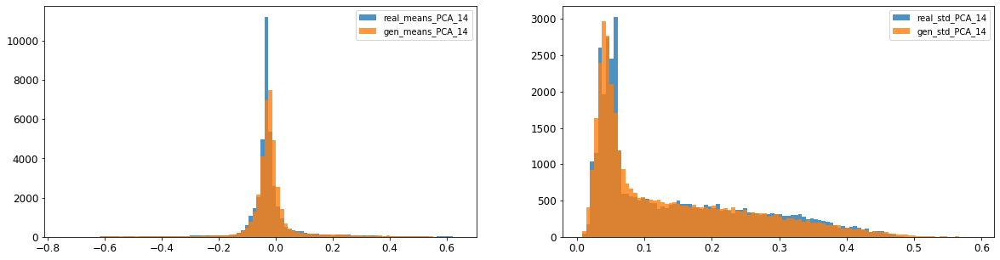

15: mean KL divergence (r,g) = 1.4425807677295759
15: mean JS divergence = 0.4047909363900921
15: mean 1-BC divergence = 0.3721479314999111

15: std KL divergence (r,g) = 6.553839983225376
15: std JS divergence = 0.9574024378651833
15: std 1-BC divergence = 0.8968311025963496


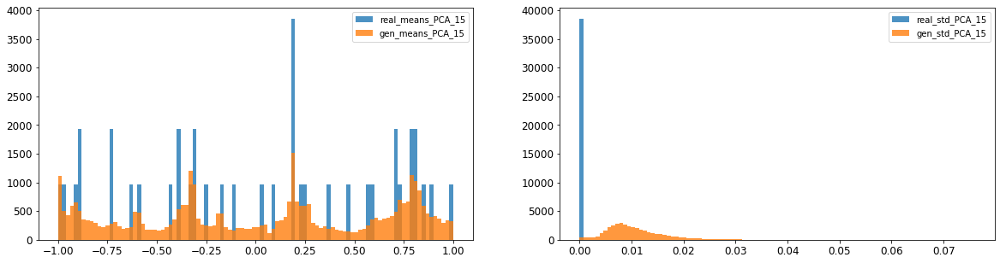

16: mean KL divergence (r,g) = 1.3786025051677262
16: mean JS divergence = 0.384730302791045
16: mean 1-BC divergence = 0.3542272697086968

16: std KL divergence (r,g) = 6.208180520452314
16: std JS divergence = 0.9481935804378288
16: std 1-BC divergence = 0.8837010690970049


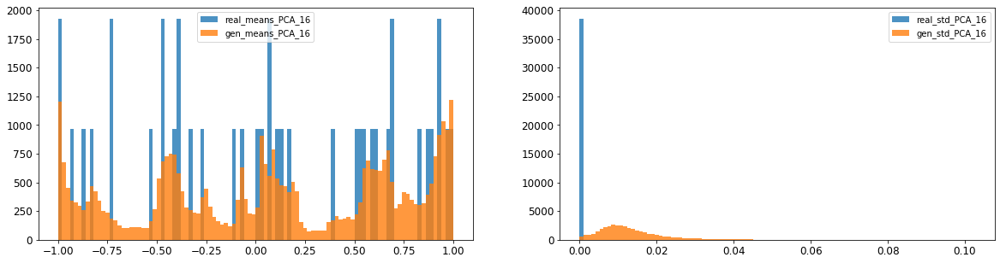



--------------------------------------------------------

Compose KL divergence (r,g) = inf
Compose JS divergence = 0.030185134728565523
Compose 1-BC divergence = 0.022836129119353843

Compose weighted KL divergence (r,g) = inf
Compose weighted JS divergence = 0.04311033707309875
Compose weighted 1-BC divergence = 0.035164237198866743

Multivariate KL divergence = 82.00037416301845


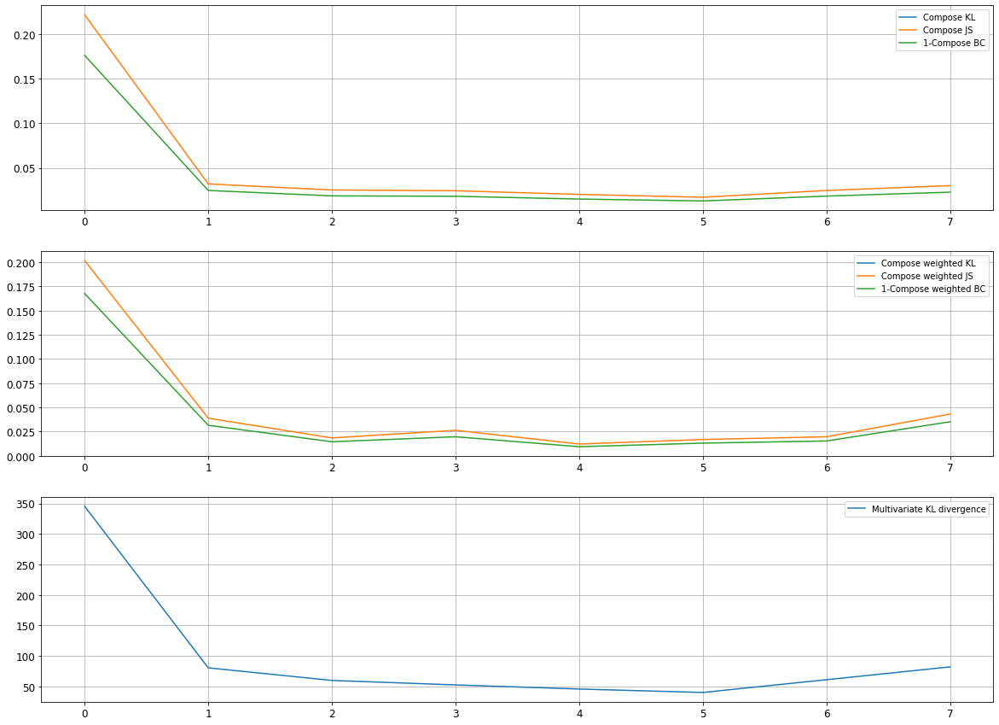

Epoch 1402/10000
discriminator loss: -0.020344 - generator loss: 44.777447 - 148s
Epoch 1403/10000
discriminator loss: -0.021707 - generator loss: 44.616352 - 148s
Epoch 1404/10000
discriminator loss: -0.019934 - generator loss: 44.417408 - 149s
Epoch 1405/10000
discriminator loss: -0.021398 - generator loss: 44.430428 - 149s
Epoch 1406/10000
discriminator loss: -0.022393 - generator loss: 44.369106 - 149s
Epoch 1407/10000
discriminator loss: -0.020016 - generator loss: 44.277706 - 152s
Epoch 1408/10000
discriminator loss: -0.018693 - generator loss: 44.330273 - 149s
Epoch 1409/10000
discriminator loss: -0.017141 - generator loss: 44.190784 - 149s
Epoch 1410/10000
discriminator loss: -0.017450 - generator loss: 44.098545 - 150s
Epoch 1411/10000
discriminator loss: -0.018167 - generator loss: 43.985954 - 150s
Epoch 1412/10000
discriminator loss: -0.015638 - generator loss: 43.781033 - 130s
Epoch 1413/10000
discriminator loss: -0.015222 - generator loss: 43.654053 - 119s
Epoch 1414/10000

discriminator loss: 0.121161 - generator loss: 17.787878 - 150s
Epoch 1504/10000
discriminator loss: 0.119790 - generator loss: 17.545031 - 150s
Epoch 1505/10000
discriminator loss: 0.116864 - generator loss: 17.266823 - 149s
Epoch 1506/10000
discriminator loss: 0.114031 - generator loss: 16.993994 - 149s
Epoch 1507/10000
discriminator loss: 0.112636 - generator loss: 16.738642 - 149s
Epoch 1508/10000
discriminator loss: 0.110375 - generator loss: 16.436176 - 149s
Epoch 1509/10000
discriminator loss: 0.108111 - generator loss: 16.126186 - 149s
Epoch 1510/10000
discriminator loss: 0.105705 - generator loss: 15.796787 - 148s
Epoch 1511/10000
discriminator loss: 0.103637 - generator loss: 15.503811 - 148s
Epoch 1512/10000
discriminator loss: 0.102522 - generator loss: 15.290132 - 148s
Epoch 1513/10000
discriminator loss: 0.100291 - generator loss: 15.029206 - 147s
Epoch 1514/10000
discriminator loss: 0.098890 - generator loss: 14.711891 - 148s
Epoch 1515/10000
discriminator loss: 0.097476

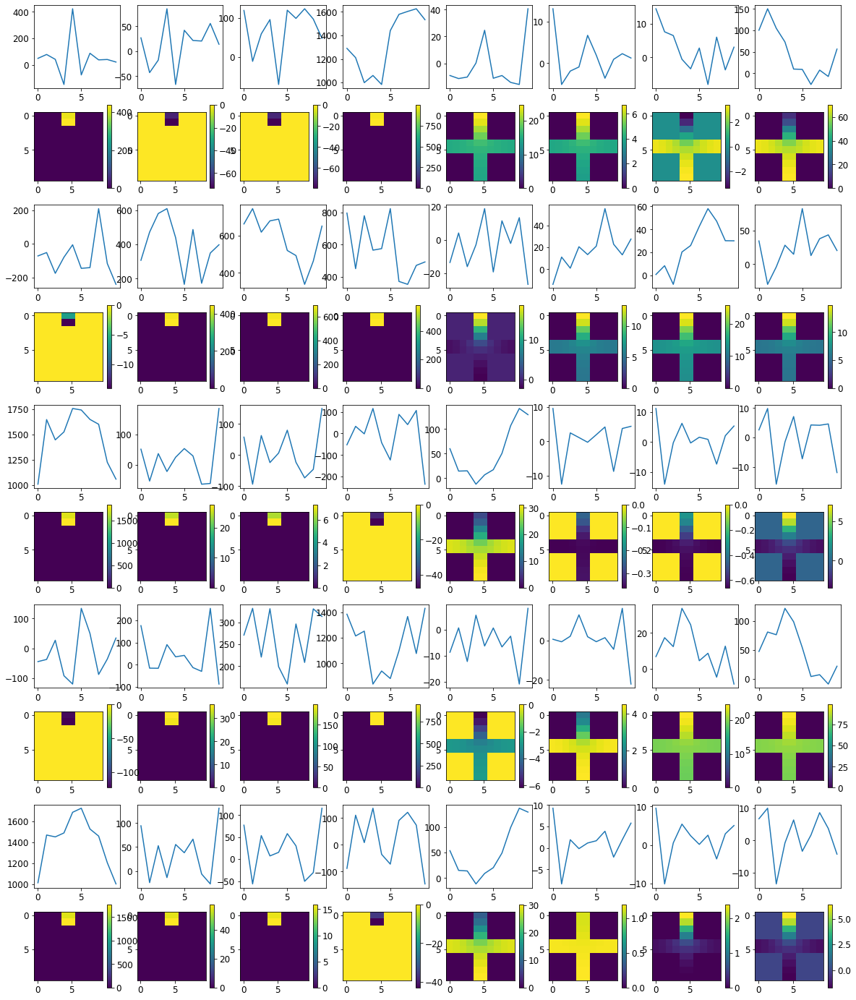


R0 generated:
[[13.033174   18.53847   ]
 [14.503889   19.301794  ]
 [11.488384   18.64394   ]
 [ 8.922056   19.147772  ]
 [12.181815   19.153526  ]
 [13.008576   18.878263  ]
 [11.294687   19.00644   ]
 [14.421259   19.41687   ]
 [ 9.3242445  16.562704  ]
 [12.339152   19.546131  ]
 [11.491001   17.511417  ]
 [10.743486   15.617605  ]
 [14.184725   15.867076  ]
 [10.747098   15.595923  ]
 [11.19647    16.69877   ]
 [10.728077   15.936837  ]
 [13.6534195  17.836548  ]
 [10.722552   15.540884  ]
 [12.078741   16.051939  ]
 [10.940117   16.907877  ]
 [ 2.6855521   1.3435822 ]
 [ 3.5079732   1.003869  ]
 [ 3.7774618   0.76774883]
 [ 3.082463    1.1782488 ]
 [ 3.6760352   0.6739353 ]
 [ 2.7934268   1.6723014 ]
 [ 5.335801    0.9066817 ]
 [ 3.0119345   1.2131311 ]
 [ 3.6644905   0.6031654 ]
 [ 3.4912865   0.91150045]
 [17.02878     1.0101299 ]
 [18.002409    1.631981  ]
 [17.28024     0.64514464]
 [14.409539    0.70144314]
 [17.131847    0.70659834]
 [17.040115    1.01152   ]
 [16.891119  

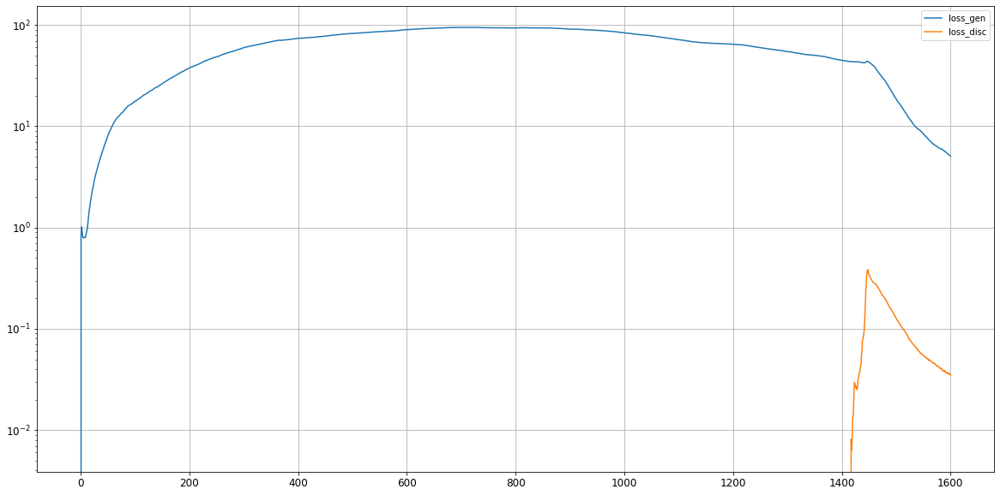

0: mean KL divergence (r,g) = 0.18182953144731018
0: mean JS divergence = 0.048820977951982265
0: mean 1-BC divergence = 0.03967653953185657

0: std KL divergence (r,g) = inf
0: std JS divergence = 0.3304183500142277
0: std 1-BC divergence = 0.29786851377714707


/home/viluiz/anaconda3/envs/py3ml/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


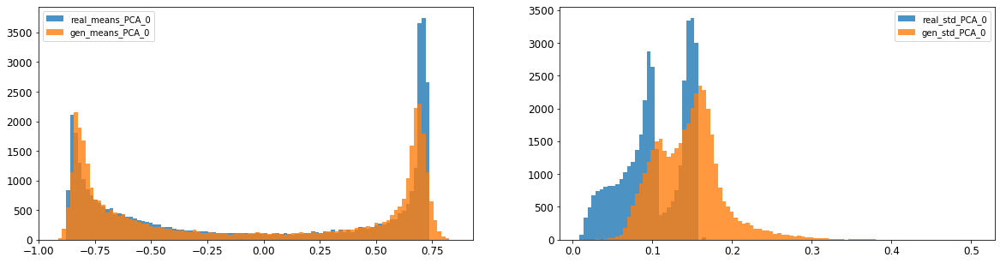

1: mean KL divergence (r,g) = 0.3110521288740365
1: mean JS divergence = 0.06378652927555786
1: mean 1-BC divergence = 0.04629746112656319

1: std KL divergence (r,g) = inf
1: std JS divergence = 0.2286668572703872
1: std 1-BC divergence = 0.18963588557465183


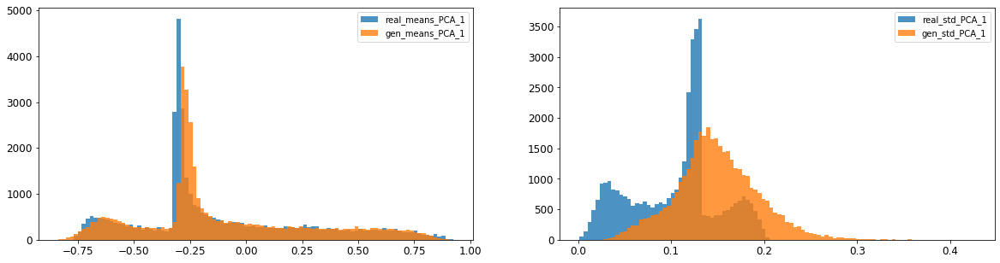

2: mean KL divergence (r,g) = inf
2: mean JS divergence = 0.017201289350754736
2: mean 1-BC divergence = 0.013078993959288243

2: std KL divergence (r,g) = 0.34004709036853936
2: std JS divergence = 0.10772988132418035
2: std 1-BC divergence = 0.09905473461693803


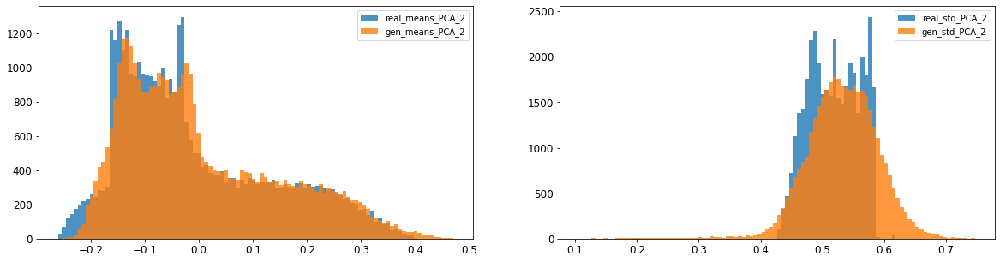

3: mean KL divergence (r,g) = 0.17809541523596076
3: mean JS divergence = 0.04221493274724632
3: mean 1-BC divergence = 0.030137467645733107

3: std KL divergence (r,g) = inf
3: std JS divergence = 0.4907064322446414
3: std 1-BC divergence = 0.431981903794016


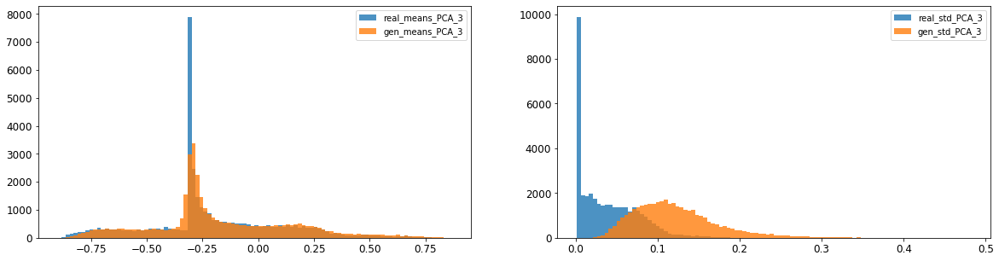

4: mean KL divergence (r,g) = 0.19868995582980062
4: mean JS divergence = 0.06054549571121273
4: mean 1-BC divergence = 0.05301597964174665

4: std KL divergence (r,g) = inf
4: std JS divergence = 0.05046964310076406
4: std 1-BC divergence = 0.04299455304851385


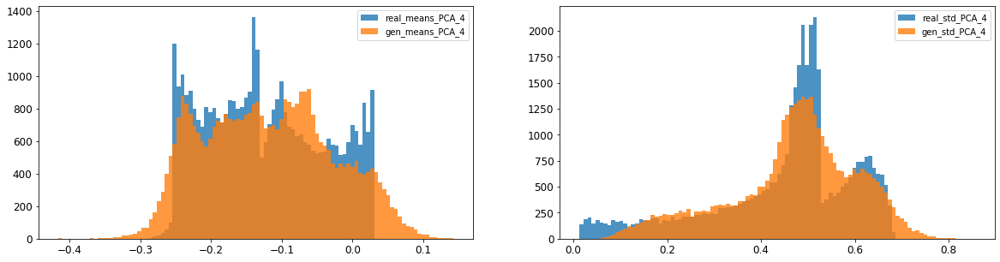

5: mean KL divergence (r,g) = 0.3808064204010116
5: mean JS divergence = 0.10023969804191181
5: mean 1-BC divergence = 0.07787141035672329

5: std KL divergence (r,g) = inf
5: std JS divergence = 0.32344060791612295
5: std 1-BC divergence = 0.2684162310526168


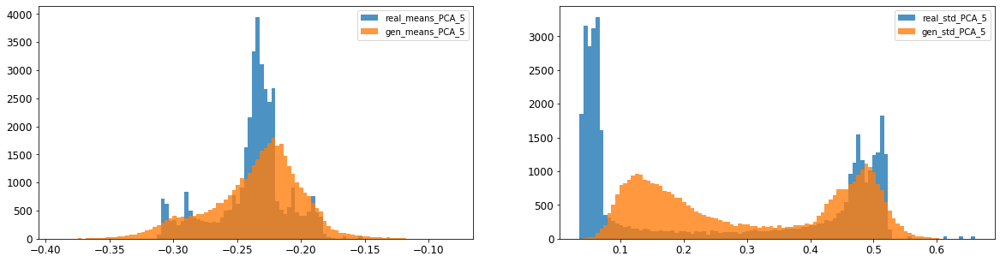

6: mean KL divergence (r,g) = 0.07432628724910965
6: mean JS divergence = 0.01944537422904819
6: mean 1-BC divergence = 0.013941942879943658

6: std KL divergence (r,g) = inf
6: std JS divergence = 0.15692844106014198
6: std 1-BC divergence = 0.1191004667010025


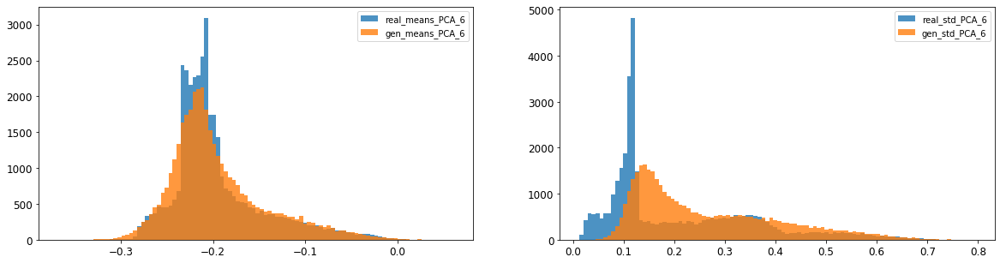

7: mean KL divergence (r,g) = 0.17735900678240504
7: mean JS divergence = 0.04929613408124767
7: mean 1-BC divergence = 0.04099260953129136

7: std KL divergence (r,g) = inf
7: std JS divergence = 0.20998459832279798
7: std 1-BC divergence = 0.16154540801005068


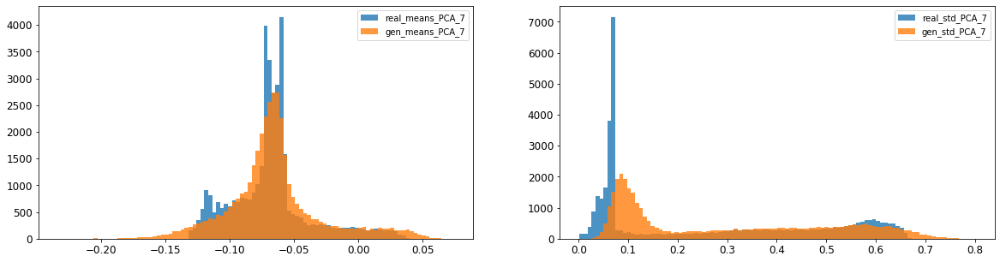

8: mean KL divergence (r,g) = 0.12213706564818742
8: mean JS divergence = 0.03070753461579217
8: mean 1-BC divergence = 0.021798817559402273

8: std KL divergence (r,g) = inf
8: std JS divergence = 0.1788444607017931
8: std 1-BC divergence = 0.13909594883165177


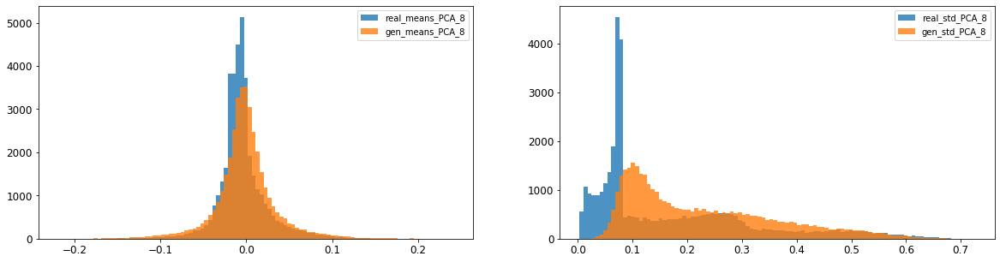

9: mean KL divergence (r,g) = inf
9: mean JS divergence = 0.010561045352526876
9: mean 1-BC divergence = 0.007766776261181052

9: std KL divergence (r,g) = inf
9: std JS divergence = 0.15324465031254403
9: std 1-BC divergence = 0.1148426980523799


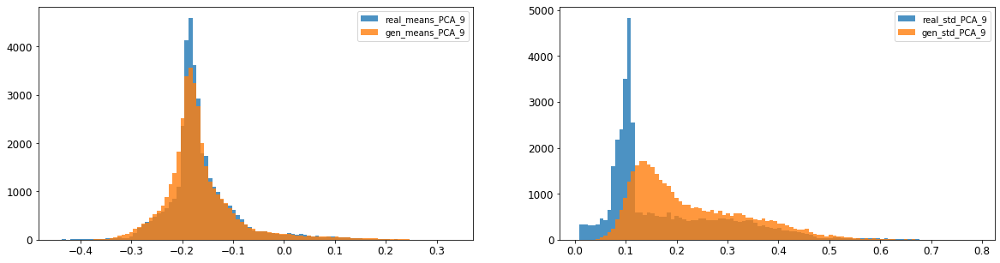

10: mean KL divergence (r,g) = 0.18528718669933267
10: mean JS divergence = 0.047794079214033794
10: mean 1-BC divergence = 0.03407702034653037

10: std KL divergence (r,g) = inf
10: std JS divergence = 0.3095763013903705
10: std 1-BC divergence = 0.25757164119901566


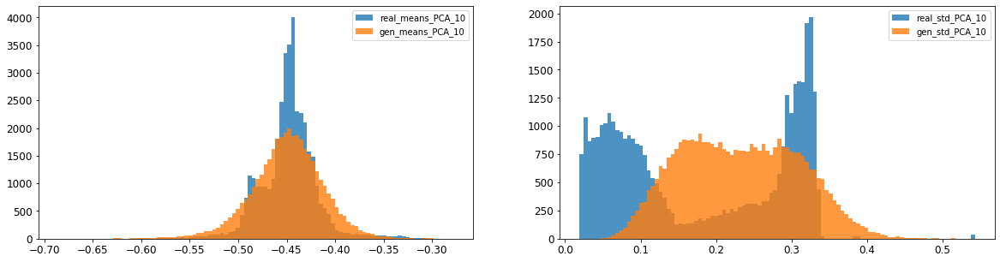

11: mean KL divergence (r,g) = 0.13136423755234136
11: mean JS divergence = 0.03451891134832062
11: mean 1-BC divergence = 0.024665416116456562

11: std KL divergence (r,g) = inf
11: std JS divergence = 0.2775530998964551
11: std 1-BC divergence = 0.21754433845958865


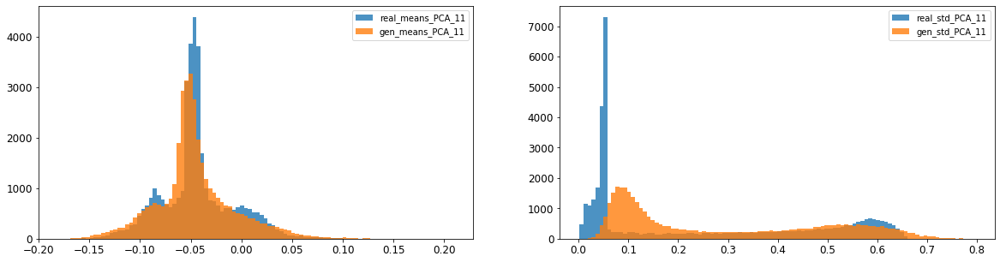

12: mean KL divergence (r,g) = 0.1318240971210697
12: mean JS divergence = 0.034203073197295195
12: mean 1-BC divergence = 0.02414462297843678

12: std KL divergence (r,g) = inf
12: std JS divergence = 0.2083327948892481
12: std 1-BC divergence = 0.16601912347441505


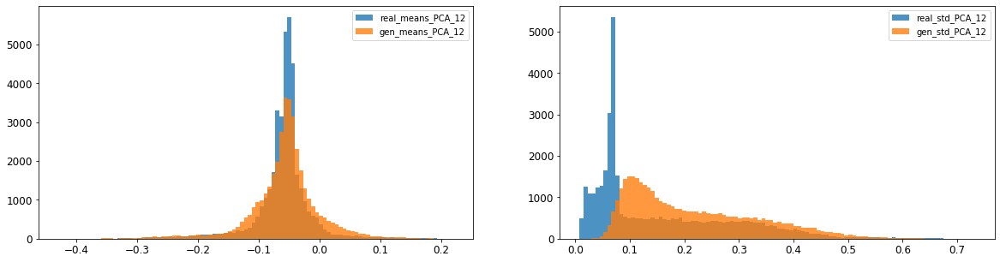

13: mean KL divergence (r,g) = inf
13: mean JS divergence = 0.031832629390345576
13: mean 1-BC divergence = 0.022306315615530203

13: std KL divergence (r,g) = inf
13: std JS divergence = 0.21734010866887837
13: std 1-BC divergence = 0.17386830777088003


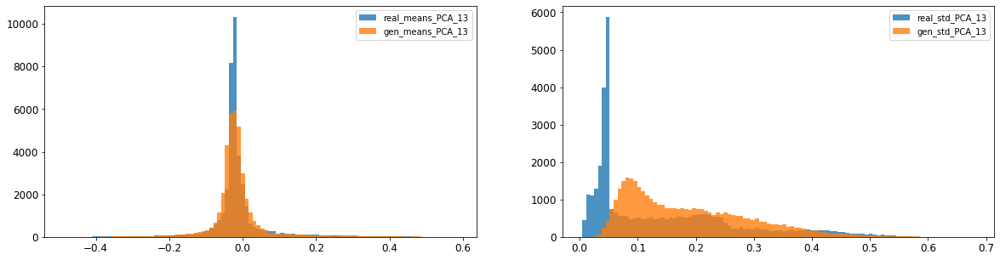

14: mean KL divergence (r,g) = inf
14: mean JS divergence = 0.02957053276500623
14: mean 1-BC divergence = 0.02090674627252742

14: std KL divergence (r,g) = inf
14: std JS divergence = 0.2205471707784647
14: std 1-BC divergence = 0.17968110110497326


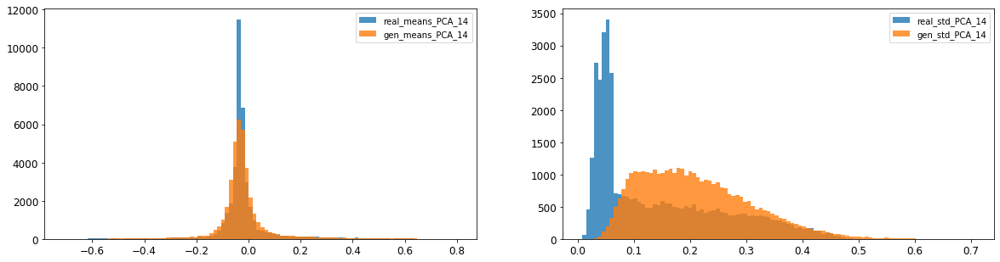

15: mean KL divergence (r,g) = 1.8500659779511077
15: mean JS divergence = 0.4697836244044701
15: mean 1-BC divergence = 0.43140409008951364

15: std KL divergence (r,g) = 6.567984165545646
15: std JS divergence = 0.9577438761331055
15: std 1-BC divergence = 0.8973355990054585


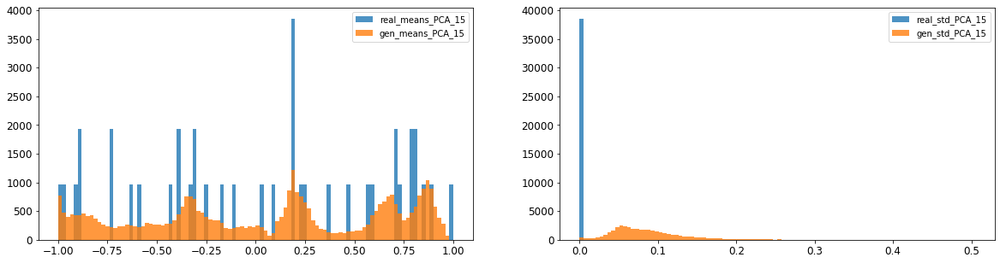

16: mean KL divergence (r,g) = 1.6076553635281172
16: mean JS divergence = 0.4404663889213901
16: mean 1-BC divergence = 0.403206412402216

16: std KL divergence (r,g) = 5.711719643007095
16: std JS divergence = 0.9316128294807271
16: std 1-BC divergence = 0.8618660183563248


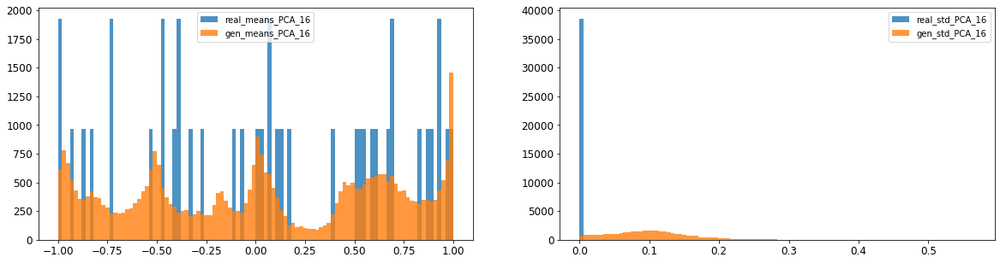



--------------------------------------------------------

Compose KL divergence (r,g) = inf
Compose JS divergence = 0.13615072117211
Compose 1-BC divergence = 0.11099663250970182

Compose weighted KL divergence (r,g) = inf
Compose weighted JS divergence = 0.16505682427942572
Compose weighted 1-BC divergence = 0.14325179666003496

Multivariate KL divergence = 269.15751178973574


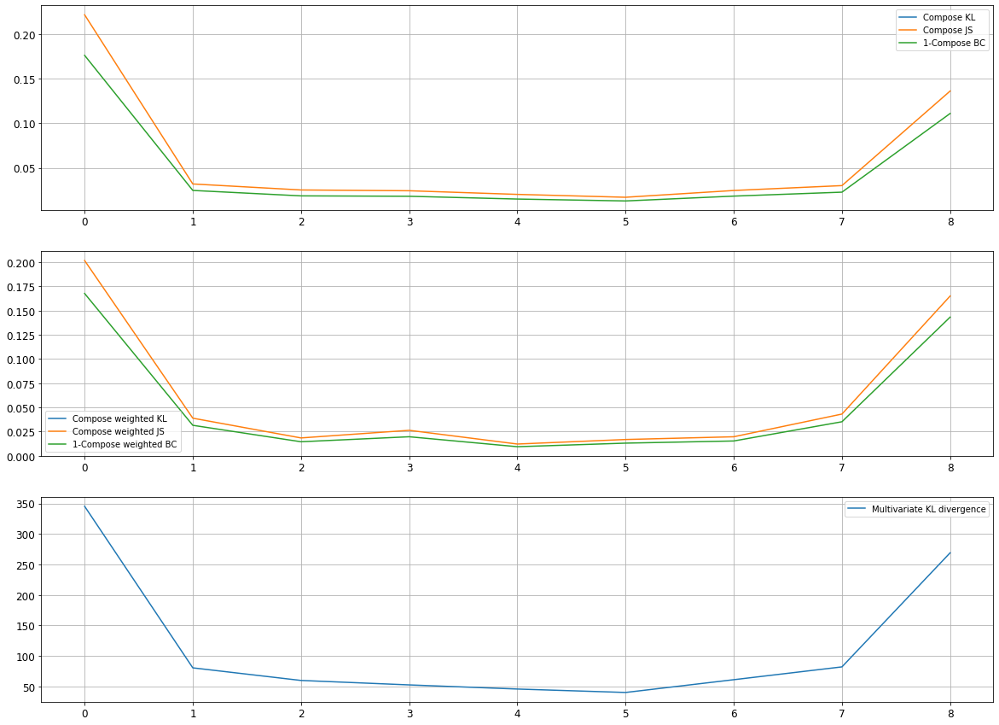

Epoch 1602/10000
discriminator loss: 0.034497 - generator loss: 5.028687 - 146s
Epoch 1603/10000
discriminator loss: 0.035111 - generator loss: 4.983867 - 147s
Epoch 1604/10000
discriminator loss: 0.034098 - generator loss: 4.900682 - 147s
Epoch 1605/10000
discriminator loss: 0.034384 - generator loss: 4.857429 - 148s
Epoch 1606/10000
discriminator loss: 0.034127 - generator loss: 4.787275 - 148s
Epoch 1607/10000
discriminator loss: 0.034286 - generator loss: 4.771263 - 148s
Epoch 1608/10000
discriminator loss: 0.033923 - generator loss: 4.794834 - 131s
Epoch 1609/10000
discriminator loss: 0.033102 - generator loss: 4.761458 - 119s
Epoch 1610/10000
discriminator loss: 0.033373 - generator loss: 4.728143 - 120s
Epoch 1611/10000
discriminator loss: 0.033191 - generator loss: 4.678017 - 142s
Epoch 1612/10000
discriminator loss: 0.033040 - generator loss: 4.600142 - 147s
Epoch 1613/10000
discriminator loss: 0.033931 - generator loss: 4.562444 - 148s
Epoch 1614/10000
discriminator loss: 0.0

discriminator loss: 0.034528 - generator loss: 2.724618 - 146s
Epoch 1706/10000
discriminator loss: 0.035253 - generator loss: 2.710865 - 145s
Epoch 1707/10000
discriminator loss: 0.034700 - generator loss: 2.739706 - 147s
Epoch 1708/10000
discriminator loss: 0.035314 - generator loss: 2.710035 - 147s
Epoch 1709/10000
discriminator loss: 0.034436 - generator loss: 2.699390 - 146s
Epoch 1710/10000
discriminator loss: 0.034968 - generator loss: 2.676516 - 148s
Epoch 1711/10000
discriminator loss: 0.035240 - generator loss: 2.634181 - 147s
Epoch 1712/10000
discriminator loss: 0.034991 - generator loss: 2.625228 - 147s
Epoch 1713/10000
discriminator loss: 0.034652 - generator loss: 2.615941 - 147s
Epoch 1714/10000
discriminator loss: 0.035463 - generator loss: 2.624416 - 146s
Epoch 1715/10000
discriminator loss: 0.035089 - generator loss: 2.622488 - 147s
Epoch 1716/10000
discriminator loss: 0.034529 - generator loss: 2.589869 - 148s
Epoch 1717/10000
discriminator loss: 0.034475 - generator

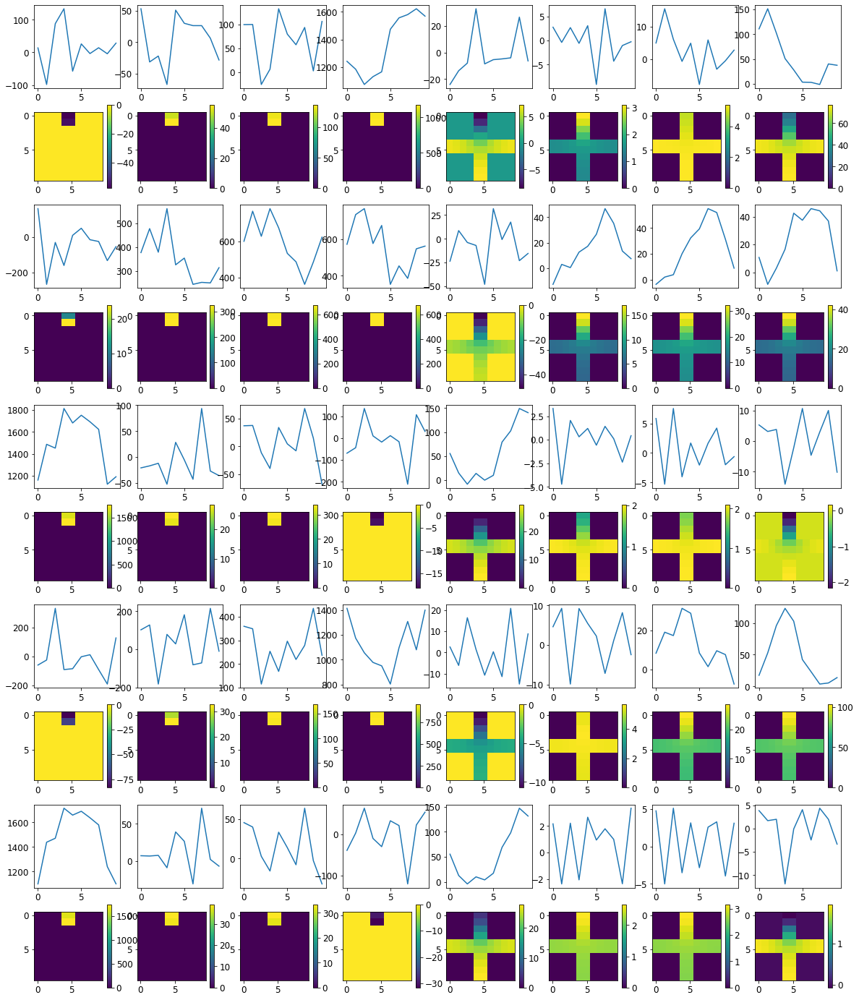


R0 generated:
[[13.598595   18.243359  ]
 [11.631965   17.53762   ]
 [11.742629   16.340761  ]
 [13.318469   18.84774   ]
 [13.762487   18.305792  ]
 [12.432918   17.717676  ]
 [11.580075   17.24352   ]
 [13.565092   17.490257  ]
 [14.120076   17.08885   ]
 [10.643062   18.043196  ]
 [13.977899   17.509611  ]
 [12.03634    16.973803  ]
 [11.383194   15.4513445 ]
 [12.217713   14.371602  ]
 [12.575739   15.6789465 ]
 [12.985409   17.530859  ]
 [12.558482   17.194584  ]
 [13.465658   18.078016  ]
 [ 9.928986   16.333431  ]
 [13.232836   17.072721  ]
 [ 3.1199083   0.8509074 ]
 [ 4.2564335   0.8857594 ]
 [ 2.997006    0.70887244]
 [ 3.1860573   1.0700274 ]
 [ 3.7292116   0.7125577 ]
 [ 5.477928    1.442594  ]
 [ 5.4385076   1.0129819 ]
 [ 3.3848128   1.0667176 ]
 [ 2.2008703   0.8315939 ]
 [ 3.749697    0.8626149 ]
 [16.494339    1.4635047 ]
 [15.079534    2.8622112 ]
 [16.715107    1.5088946 ]
 [16.633982    3.581517  ]
 [16.105194    3.0211055 ]
 [15.132879    2.3601632 ]
 [16.723457  

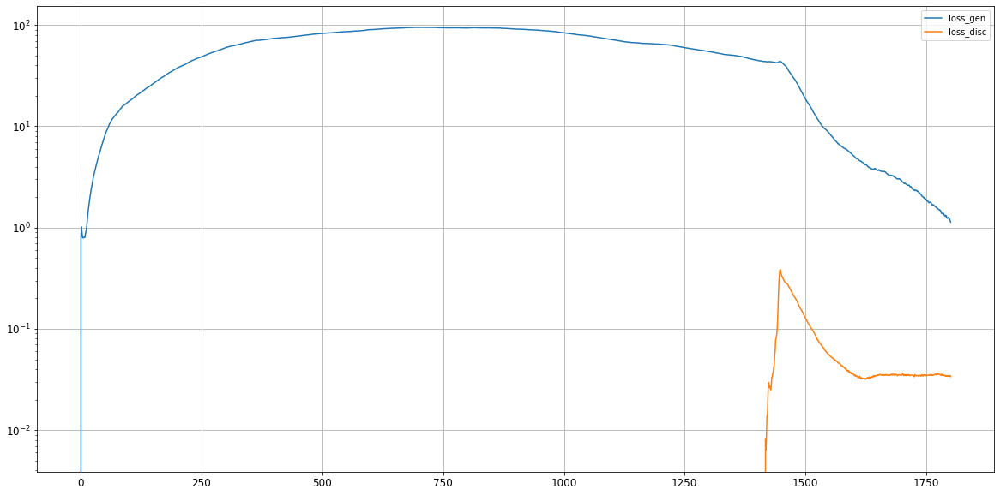

0: mean KL divergence (r,g) = 0.15175364848277628
0: mean JS divergence = 0.044506014349513234
0: mean 1-BC divergence = 0.03806974615055814

0: std KL divergence (r,g) = inf
0: std JS divergence = 0.32995566946396904
0: std 1-BC divergence = 0.2889575776901986


/home/viluiz/anaconda3/envs/py3ml/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


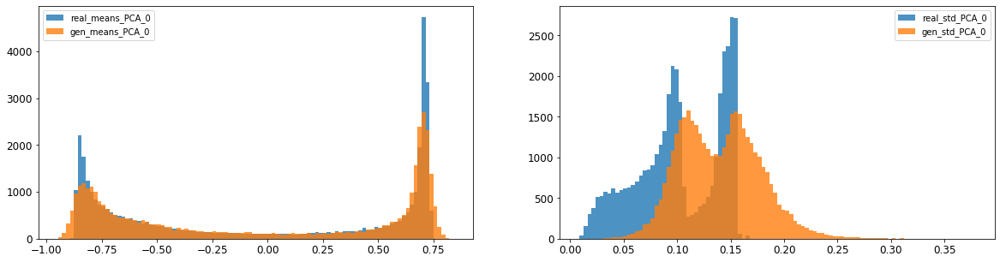

1: mean KL divergence (r,g) = 0.08878339382082695
1: mean JS divergence = 0.024309866104383217
1: mean 1-BC divergence = 0.018840667968583413

1: std KL divergence (r,g) = inf
1: std JS divergence = 0.21140234770485983
1: std 1-BC divergence = 0.17380300042269048


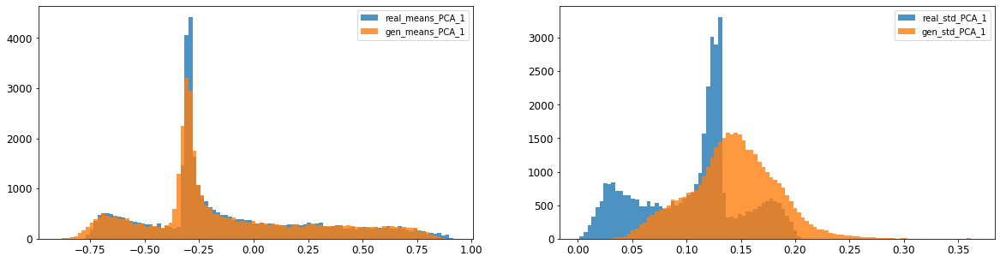

2: mean KL divergence (r,g) = 0.05929622197017821
2: mean JS divergence = 0.01600211926993623
2: mean 1-BC divergence = 0.012442560358824517

2: std KL divergence (r,g) = 0.4138016721279396
2: std JS divergence = 0.13021378734544342
2: std 1-BC divergence = 0.12116083893241547


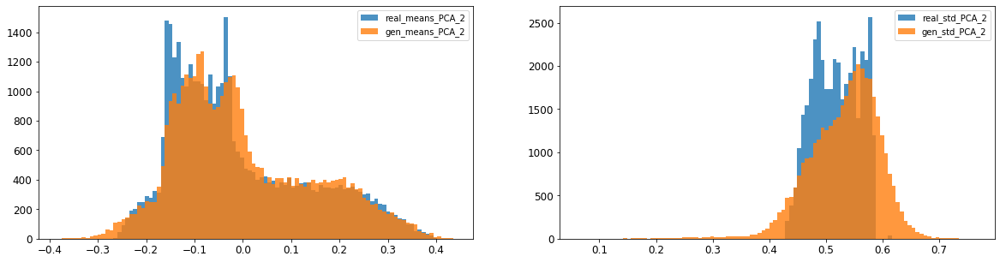

3: mean KL divergence (r,g) = 0.1684523214232737
3: mean JS divergence = 0.042380702909053034
3: mean 1-BC divergence = 0.030273189721441662

3: std KL divergence (r,g) = inf
3: std JS divergence = 0.47394567351842076
3: std 1-BC divergence = 0.42272284018714446


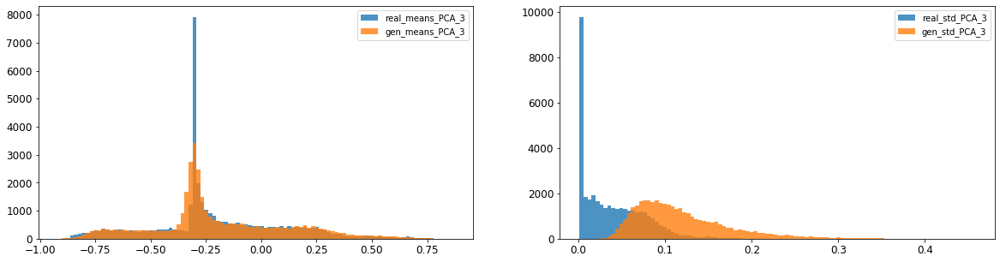

4: mean KL divergence (r,g) = 0.17665583047986194
4: mean JS divergence = 0.03965894754799078
4: mean 1-BC divergence = 0.029347941274587508

4: std KL divergence (r,g) = inf
4: std JS divergence = 0.0633588256014682
4: std 1-BC divergence = 0.054744400138125426


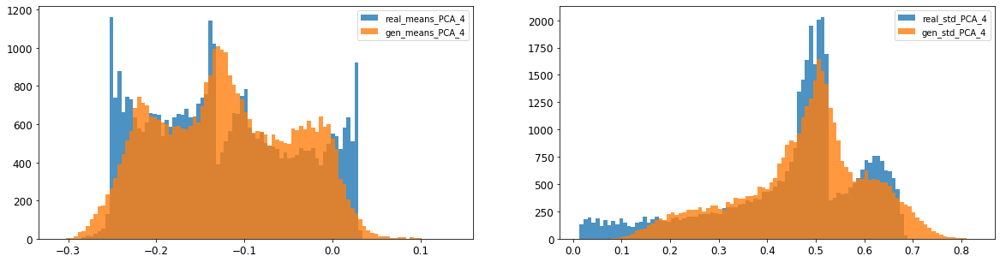

5: mean KL divergence (r,g) = 0.48585720474283256
5: mean JS divergence = 0.1250016104760528
5: mean 1-BC divergence = 0.09570140584698306

5: std KL divergence (r,g) = inf
5: std JS divergence = 0.3193017153156982
5: std 1-BC divergence = 0.262116365799377


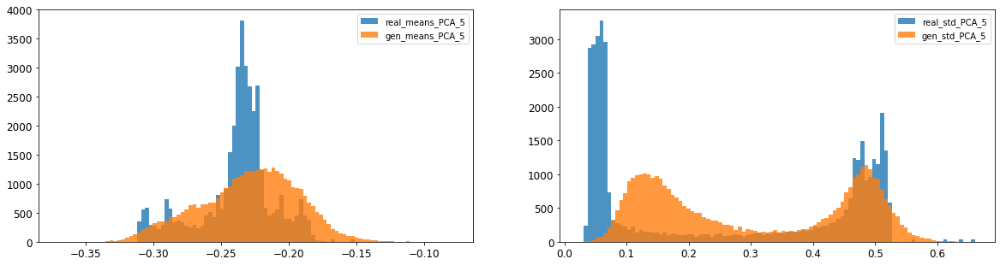

6: mean KL divergence (r,g) = 0.24674854701222
6: mean JS divergence = 0.05762347422281392
6: mean 1-BC divergence = 0.04142597347331767

6: std KL divergence (r,g) = inf
6: std JS divergence = 0.1466344480433146
6: std 1-BC divergence = 0.11069904865228208


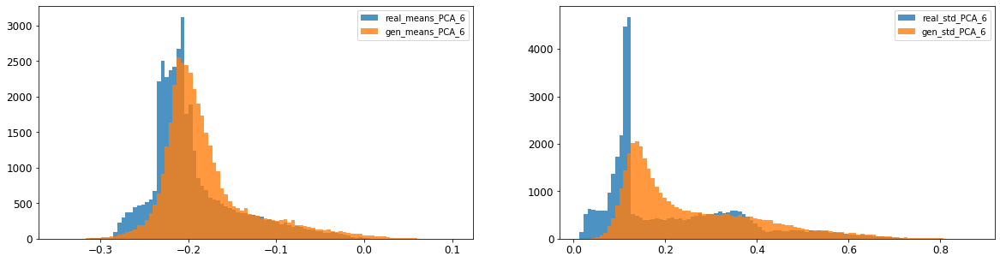

7: mean KL divergence (r,g) = 0.26479588487191535
7: mean JS divergence = 0.07465002365083626
7: mean 1-BC divergence = 0.06121062110029862

7: std KL divergence (r,g) = inf
7: std JS divergence = 0.24302347385628026
7: std 1-BC divergence = 0.19220751908805422


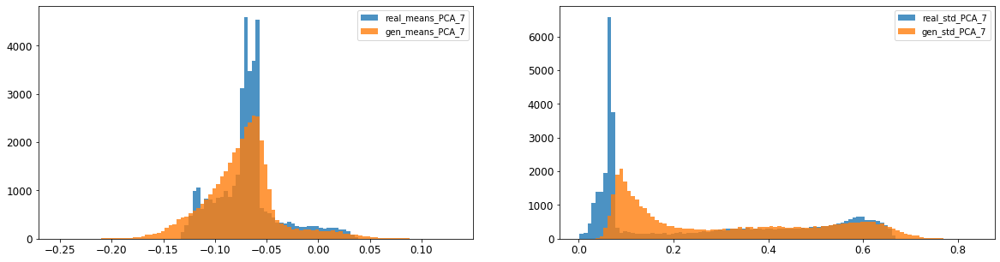

8: mean KL divergence (r,g) = inf
8: mean JS divergence = 0.05091067345936168
8: mean 1-BC divergence = 0.03595042128256698

8: std KL divergence (r,g) = inf
8: std JS divergence = 0.17185806246554894
8: std 1-BC divergence = 0.1354748861950802


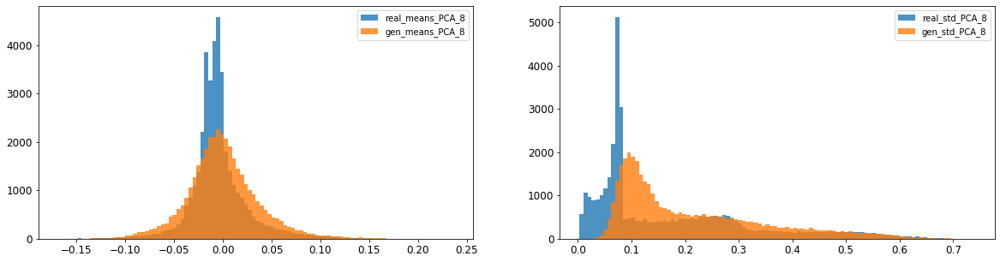

9: mean KL divergence (r,g) = inf
9: mean JS divergence = 0.005590298189196165
9: mean 1-BC divergence = 0.004047325850049632

9: std KL divergence (r,g) = inf
9: std JS divergence = 0.12435511357709567
9: std 1-BC divergence = 0.0915480809129311


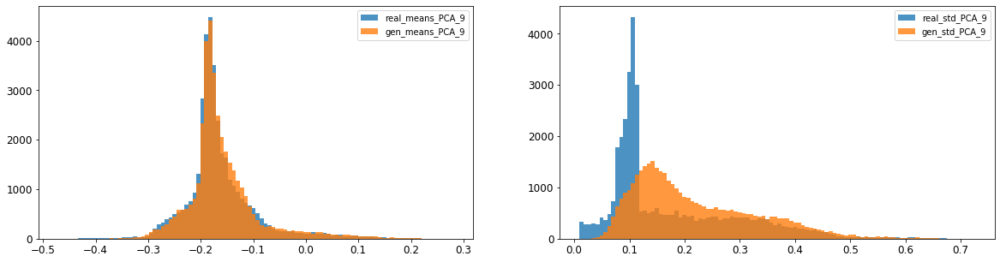

10: mean KL divergence (r,g) = 0.31311652887679353
10: mean JS divergence = 0.08204984534752882
10: mean 1-BC divergence = 0.05867513759294041

10: std KL divergence (r,g) = inf
10: std JS divergence = 0.27922871480484357
10: std 1-BC divergence = 0.22409441549100995


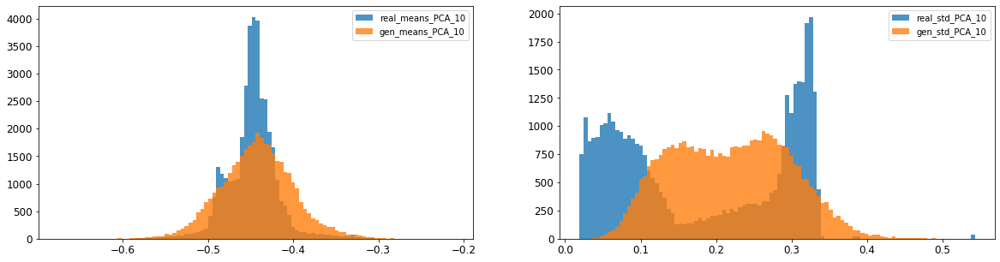

11: mean KL divergence (r,g) = 0.24141421436289126
11: mean JS divergence = 0.05984291001633214
11: mean 1-BC divergence = 0.04277194158066233

11: std KL divergence (r,g) = inf
11: std JS divergence = 0.2967949451491796
11: std 1-BC divergence = 0.23288305388909525


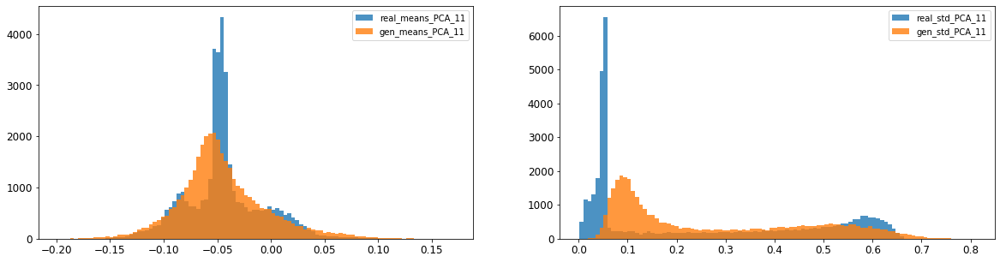

12: mean KL divergence (r,g) = 0.08726973377331985
12: mean JS divergence = 0.022611405807056027
12: mean 1-BC divergence = 0.01602458488577696

12: std KL divergence (r,g) = inf
12: std JS divergence = 0.17881437783201082
12: std 1-BC divergence = 0.14011217355289207


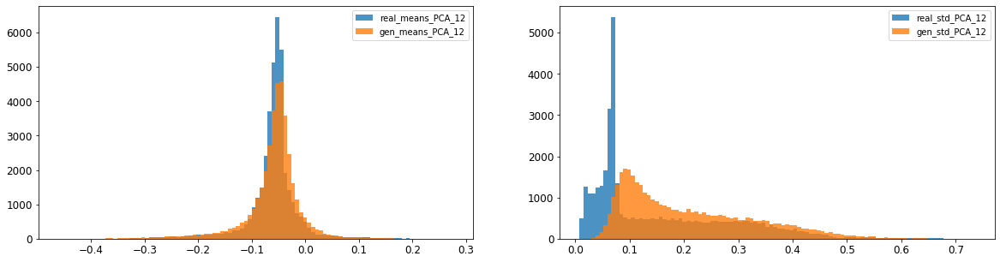

13: mean KL divergence (r,g) = 0.12034329099024502
13: mean JS divergence = 0.03080636130089854
13: mean 1-BC divergence = 0.021564854811002898

13: std KL divergence (r,g) = inf
13: std JS divergence = 0.18396753460745846
13: std 1-BC divergence = 0.14171639337716946


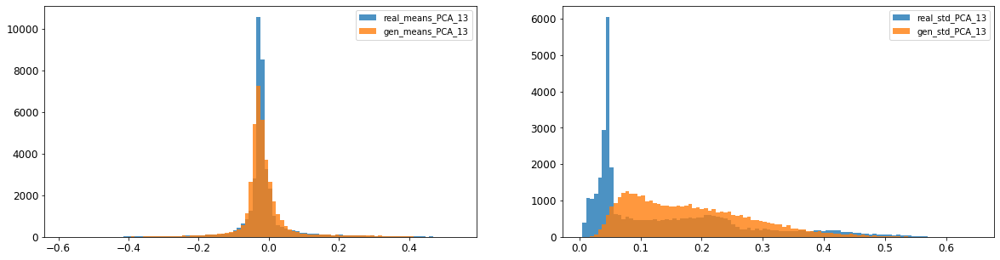

14: mean KL divergence (r,g) = 0.2045539787456949
14: mean JS divergence = 0.0500501516052658
14: mean 1-BC divergence = 0.0351483976281074

14: std KL divergence (r,g) = inf
14: std JS divergence = 0.19246206953212752
14: std 1-BC divergence = 0.1505431962312055


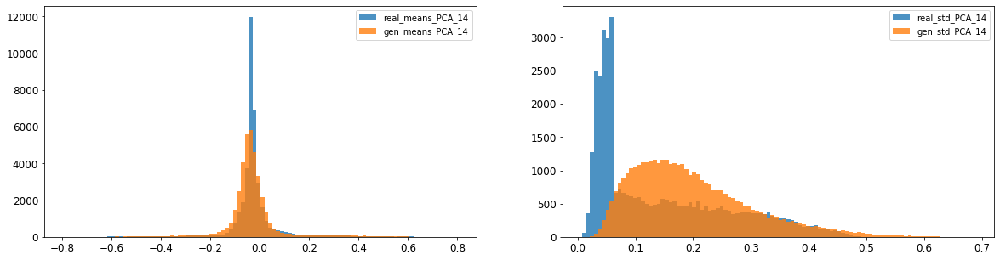

15: mean KL divergence (r,g) = inf
15: mean JS divergence = 0.4721110939960212
15: mean 1-BC divergence = 0.43373793407191186

15: std KL divergence (r,g) = 9.302582745167935
15: std JS divergence = 0.9914910229780973
15: std 1-BC divergence = 0.9602056167439031


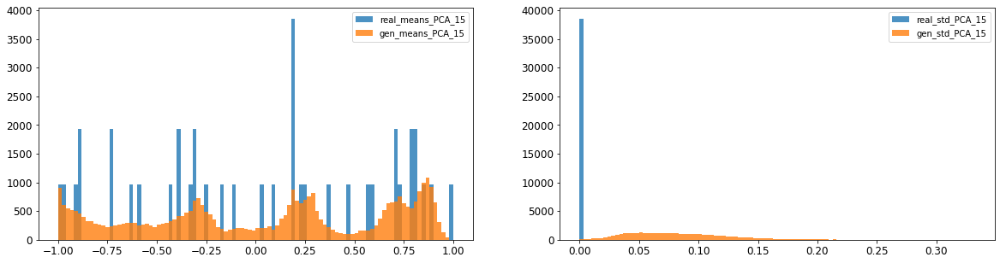

16: mean KL divergence (r,g) = 1.572418586210509
16: mean JS divergence = 0.4270259819786498
16: mean 1-BC divergence = 0.39100987030975376

16: std KL divergence (r,g) = 5.32793307771269
16: std JS divergence = 0.915496966952893
16: std 1-BC divergence = 0.8422148364386465


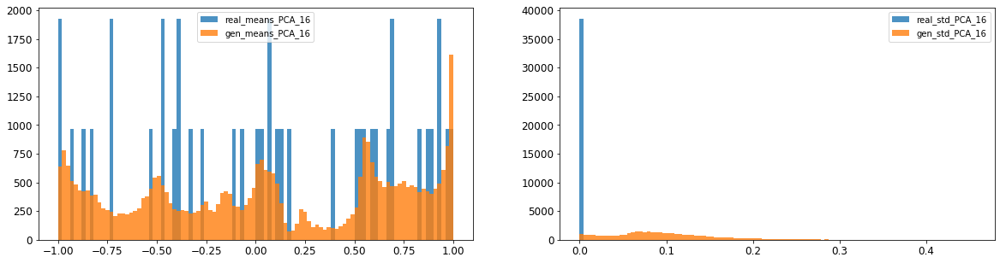



--------------------------------------------------------

Compose KL divergence (r,g) = inf
Compose JS divergence = 0.1357103721024646
Compose 1-BC divergence = 0.10947595200284588

Compose weighted KL divergence (r,g) = inf
Compose weighted JS divergence = 0.1590874513474556
Compose weighted 1-BC divergence = 0.1369449810358483

Multivariate KL divergence = 261.609983655155


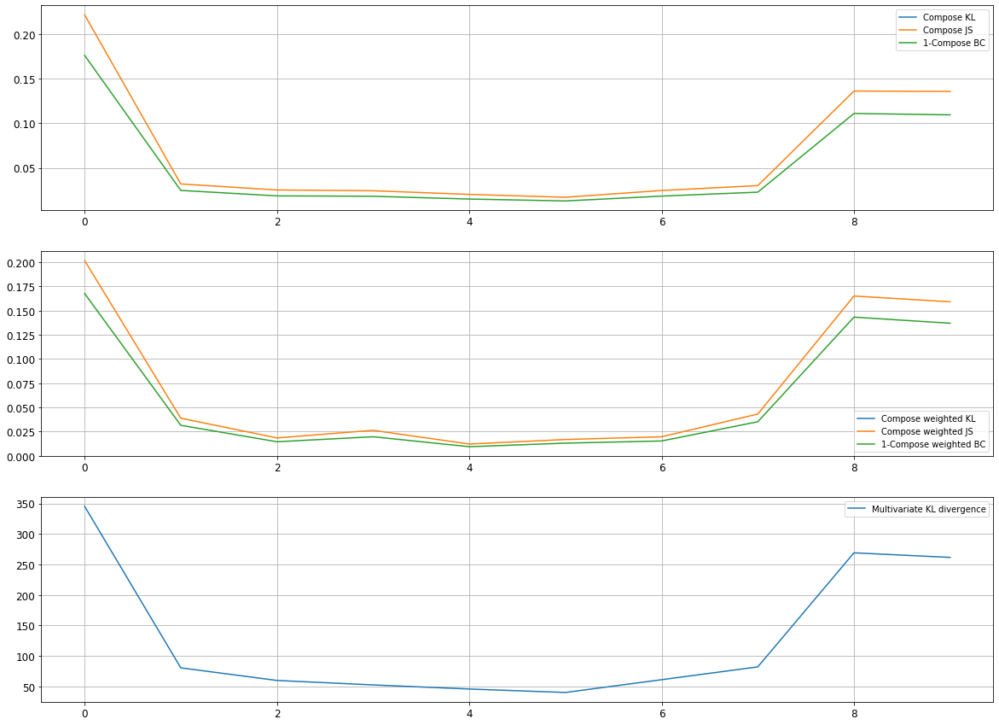

Epoch 1802/10000
discriminator loss: 0.033710 - generator loss: 1.094136 - 144s
Epoch 1803/10000
discriminator loss: 0.033507 - generator loss: 1.084710 - 147s
Epoch 1804/10000
discriminator loss: 0.033527 - generator loss: 1.035217 - 146s
Epoch 1805/10000
discriminator loss: 0.033480 - generator loss: 1.049082 - 148s
Epoch 1806/10000
discriminator loss: 0.033489 - generator loss: 1.041601 - 124s
Epoch 1807/10000
discriminator loss: 0.033584 - generator loss: 1.033845 - 118s
Epoch 1808/10000
discriminator loss: 0.033584 - generator loss: 1.053028 - 124s
Epoch 1809/10000
discriminator loss: 0.032918 - generator loss: 1.054611 - 147s
Epoch 1810/10000
discriminator loss: 0.032459 - generator loss: 1.021106 - 147s
Epoch 1811/10000
discriminator loss: 0.032706 - generator loss: 0.999432 - 146s
Epoch 1812/10000
discriminator loss: 0.032910 - generator loss: 0.983357 - 147s
Epoch 1813/10000
discriminator loss: 0.032850 - generator loss: 0.973793 - 147s
Epoch 1814/10000
discriminator loss: 0.0

discriminator loss: 0.025978 - generator loss: 0.646825 - 147s
Epoch 1906/10000
discriminator loss: 0.026586 - generator loss: 0.676071 - 147s
Epoch 1907/10000
discriminator loss: 0.026077 - generator loss: 0.704910 - 148s
Epoch 1908/10000
discriminator loss: 0.026434 - generator loss: 0.684114 - 148s
Epoch 1909/10000
discriminator loss: 0.026260 - generator loss: 0.690744 - 146s
Epoch 1910/10000
discriminator loss: 0.025738 - generator loss: 0.730448 - 146s
Epoch 1911/10000
discriminator loss: 0.025169 - generator loss: 0.762385 - 147s
Epoch 1912/10000
discriminator loss: 0.025480 - generator loss: 0.753155 - 147s
Epoch 1913/10000
discriminator loss: 0.025674 - generator loss: 0.777411 - 146s
Epoch 1914/10000
discriminator loss: 0.025160 - generator loss: 0.754823 - 146s
Epoch 1915/10000
discriminator loss: 0.025058 - generator loss: 0.764796 - 146s
Epoch 1916/10000
discriminator loss: 0.025991 - generator loss: 0.767317 - 146s
Epoch 1917/10000
discriminator loss: 0.025521 - generator

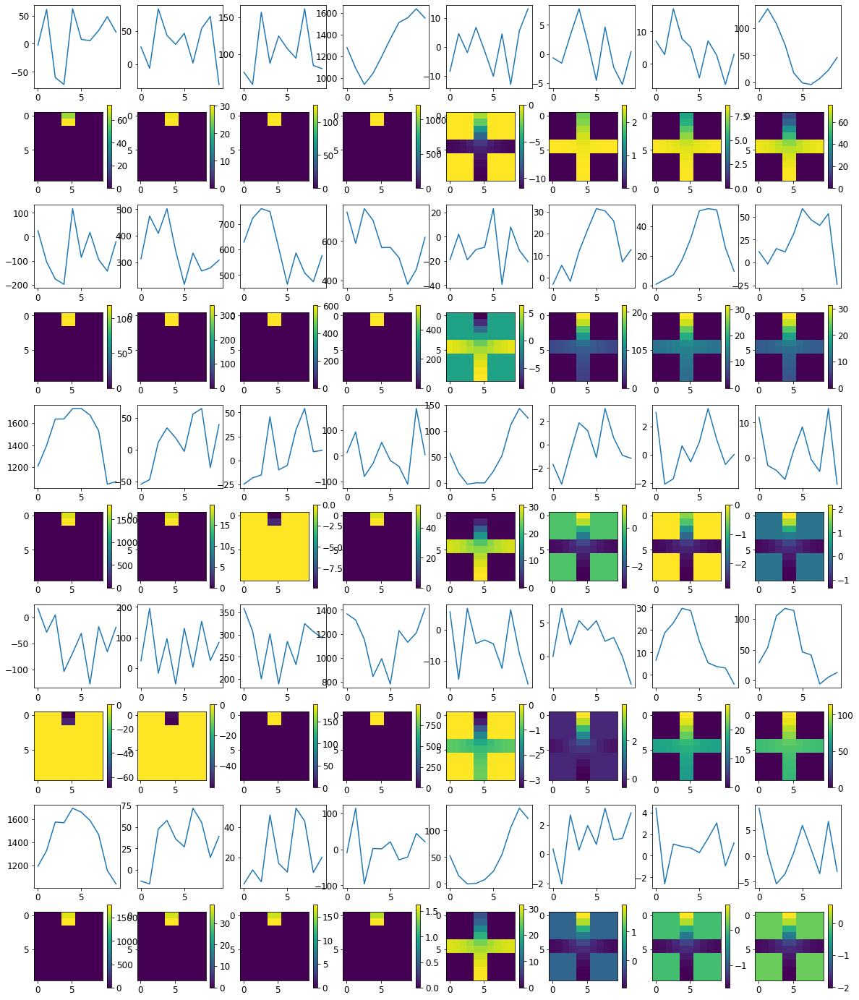


R0 generated:
[[13.41062    18.227232  ]
 [12.99135    17.313982  ]
 [14.172055   18.655602  ]
 [11.818797   17.955769  ]
 [13.867897   18.623142  ]
 [13.46195    17.443527  ]
 [14.22556    18.74332   ]
 [13.67345    18.112938  ]
 [13.875503   17.52237   ]
 [12.521849   18.026224  ]
 [12.576795   18.539282  ]
 [14.423565   18.251451  ]
 [12.847515   18.088226  ]
 [14.365833   18.637465  ]
 [13.509327   18.032738  ]
 [13.076615   17.360031  ]
 [14.441577   18.680452  ]
 [14.22794    18.553133  ]
 [13.105344   17.949612  ]
 [14.170175   19.213896  ]
 [ 4.0956783   0.904905  ]
 [ 4.0806856   1.0492013 ]
 [ 2.5948758   0.92266864]
 [ 3.204262    0.7113011 ]
 [ 4.5261865   0.8739446 ]
 [ 4.3071814   1.5669423 ]
 [ 3.6354663   0.90976804]
 [ 4.00023     1.3090088 ]
 [ 3.04021     1.1399004 ]
 [ 3.3544972   0.8707789 ]
 [12.55862     4.6183066 ]
 [11.190065    6.2501287 ]
 [ 9.733915    2.9755325 ]
 [14.393091    5.345649  ]
 [11.331441    4.413596  ]
 [12.527162    4.479076  ]
 [12.825287  

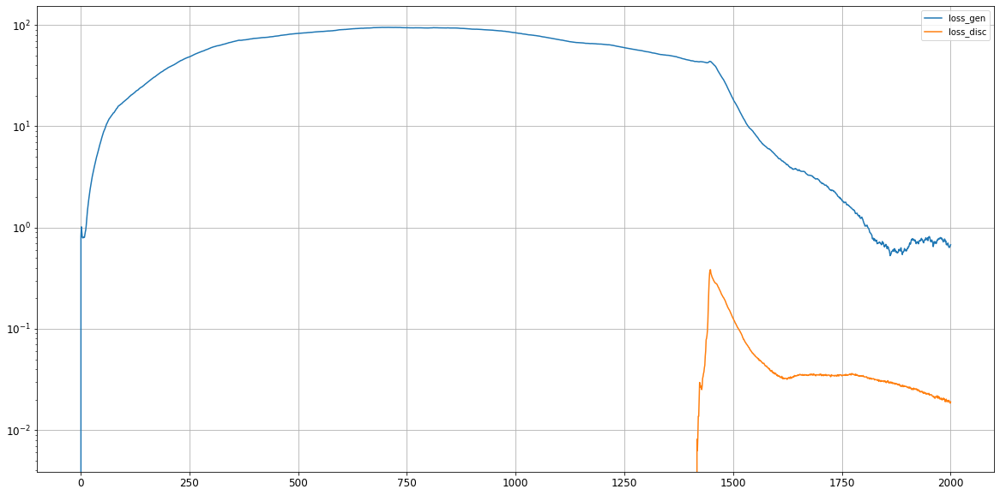

0: mean KL divergence (r,g) = 0.19397366060050972
0: mean JS divergence = 0.0522576936557668
0: mean 1-BC divergence = 0.04128527452286901

0: std KL divergence (r,g) = inf
0: std JS divergence = 0.293045979661946
0: std 1-BC divergence = 0.26376699721934305


/home/viluiz/anaconda3/envs/py3ml/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


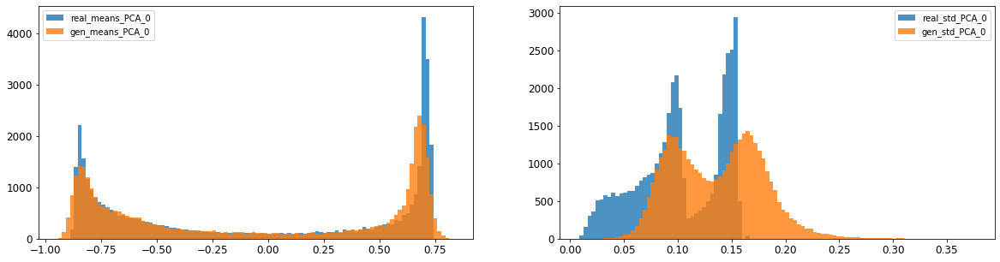

1: mean KL divergence (r,g) = 0.16996984594116216
1: mean JS divergence = 0.04014827728484506
1: mean 1-BC divergence = 0.028347601854686544

1: std KL divergence (r,g) = inf
1: std JS divergence = 0.15478100880773915
1: std 1-BC divergence = 0.13049839622836434


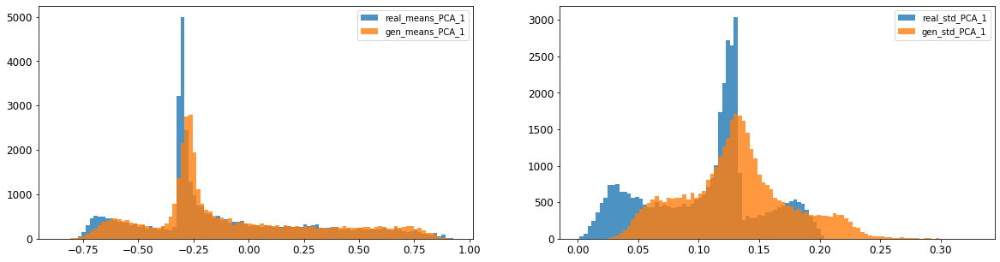

2: mean KL divergence (r,g) = inf
2: mean JS divergence = 0.02447730198715961
2: mean 1-BC divergence = 0.018624474823600967

2: std KL divergence (r,g) = 0.3240051519364143
2: std JS divergence = 0.10403177745566744
2: std 1-BC divergence = 0.09694583686729463


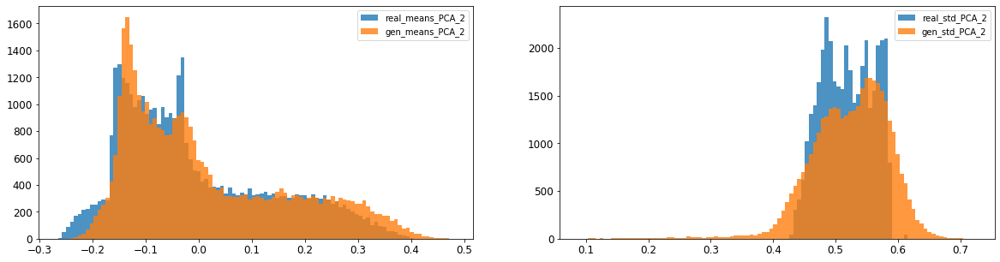

3: mean KL divergence (r,g) = 0.19396167776772275
3: mean JS divergence = 0.04574676057679933
3: mean 1-BC divergence = 0.03230448021191379

3: std KL divergence (r,g) = inf
3: std JS divergence = 0.3809003497280489
3: std 1-BC divergence = 0.34000851776138774


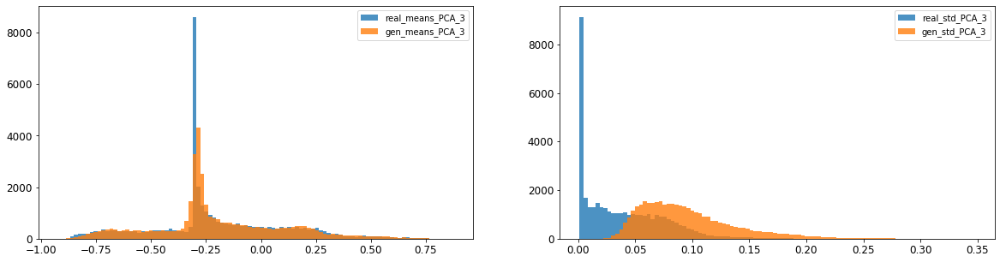

4: mean KL divergence (r,g) = 0.14506113496262713
4: mean JS divergence = 0.04187345508135361
4: mean 1-BC divergence = 0.035670054462217715

4: std KL divergence (r,g) = inf
4: std JS divergence = 0.04800940162279255
4: std 1-BC divergence = 0.04188360503075372


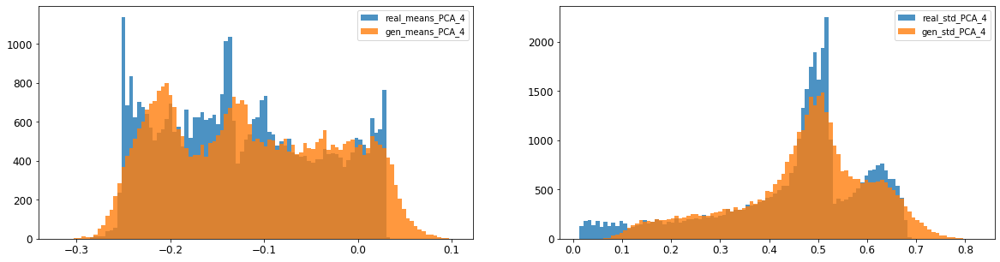

5: mean KL divergence (r,g) = 0.3923171145768384
5: mean JS divergence = 0.10595514766118494
5: mean 1-BC divergence = 0.08509879377286167

5: std KL divergence (r,g) = inf
5: std JS divergence = 0.23027611290472644
5: std 1-BC divergence = 0.18090108345675027


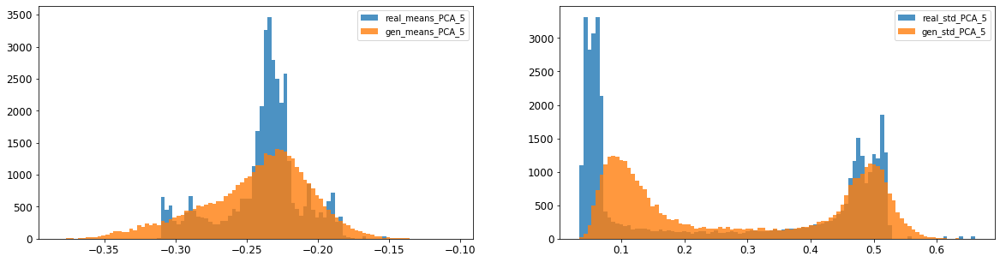

6: mean KL divergence (r,g) = 0.1988703777020496
6: mean JS divergence = 0.05291000909042272
6: mean 1-BC divergence = 0.038894478060587545

6: std KL divergence (r,g) = inf
6: std JS divergence = 0.06298925317508602
6: std 1-BC divergence = 0.04795075489071299


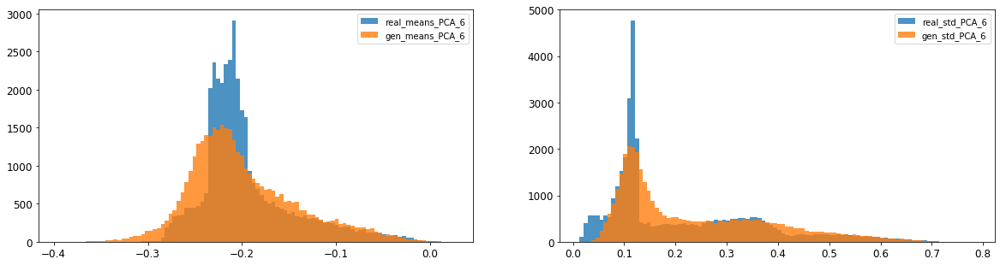

7: mean KL divergence (r,g) = 0.19930366846939512
7: mean JS divergence = 0.05315655661035085
7: mean 1-BC divergence = 0.04137420949804349

7: std KL divergence (r,g) = inf
7: std JS divergence = 0.21238824587485106
7: std 1-BC divergence = 0.163523933995939


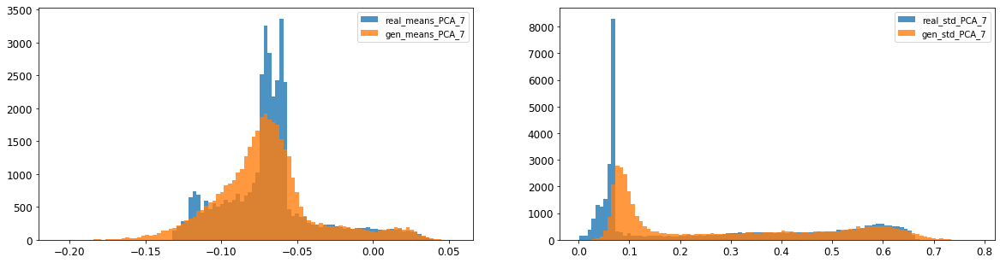

8: mean KL divergence (r,g) = inf
8: mean JS divergence = 0.02449365644623502
8: mean 1-BC divergence = 0.017368671611410202

8: std KL divergence (r,g) = inf
8: std JS divergence = 0.1409297487226186
8: std 1-BC divergence = 0.1093252281206909


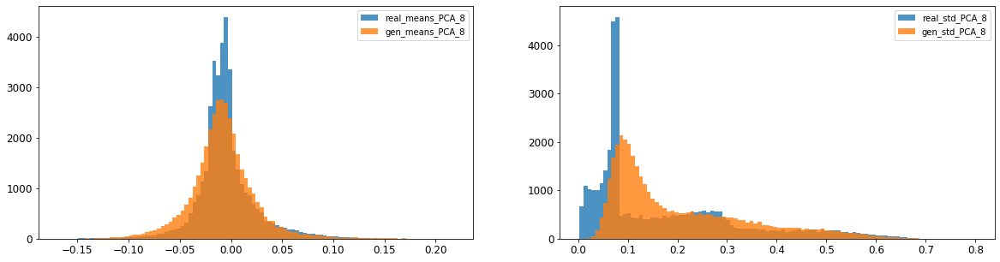

9: mean KL divergence (r,g) = inf
9: mean JS divergence = 0.04749012288194151
9: mean 1-BC divergence = 0.033397259542702895

9: std KL divergence (r,g) = inf
9: std JS divergence = 0.05890175126386393
9: std 1-BC divergence = 0.043672188633824494


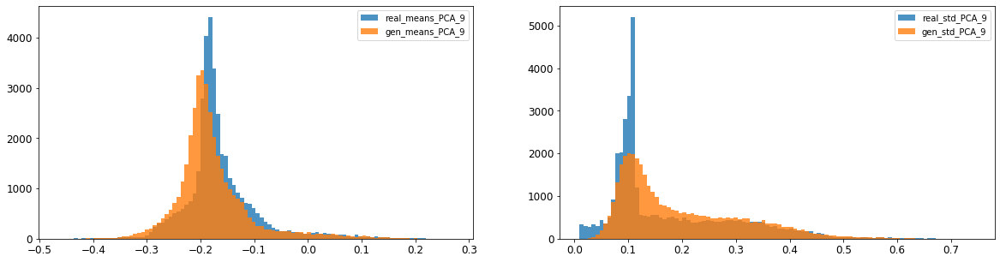

10: mean KL divergence (r,g) = 0.22648213725446975
10: mean JS divergence = 0.05895631117632915
10: mean 1-BC divergence = 0.04186974255752696

10: std KL divergence (r,g) = inf
10: std JS divergence = 0.26802906911199725
10: std 1-BC divergence = 0.2171660244798871


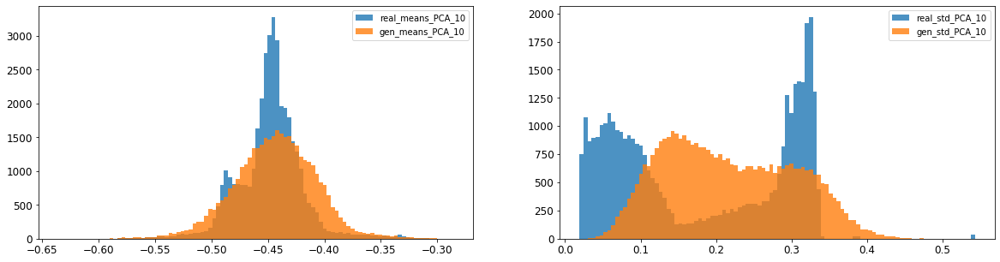

11: mean KL divergence (r,g) = 0.27109458136414105
11: mean JS divergence = 0.07090331999989691
11: mean 1-BC divergence = 0.05069989321363477

11: std KL divergence (r,g) = inf
11: std JS divergence = 0.20696517712967896
11: std 1-BC divergence = 0.15958537662762717


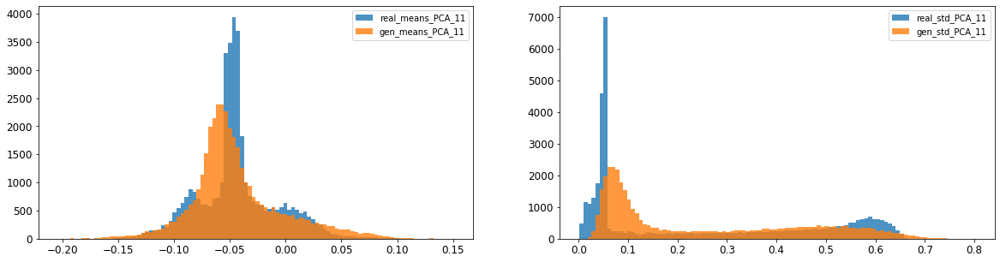

12: mean KL divergence (r,g) = inf
12: mean JS divergence = 0.026394457070331667
12: mean 1-BC divergence = 0.018790051146491904

12: std KL divergence (r,g) = inf
12: std JS divergence = 0.16053772946217315
12: std 1-BC divergence = 0.12595388756643477


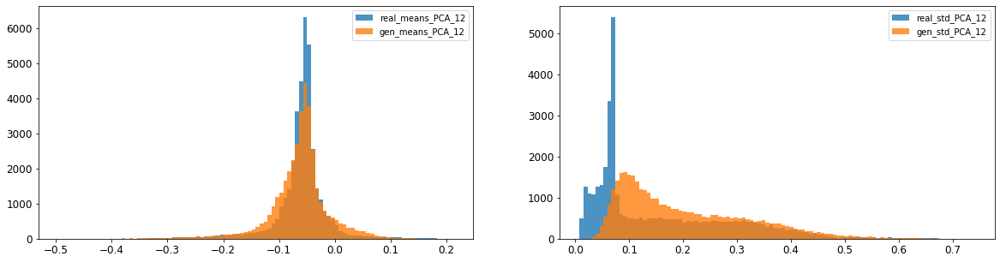

13: mean KL divergence (r,g) = 0.19701813589502928
13: mean JS divergence = 0.04645515380970845
13: mean 1-BC divergence = 0.032819746123699756

13: std KL divergence (r,g) = inf
13: std JS divergence = 0.21332954191062098
13: std 1-BC divergence = 0.16871023103173066


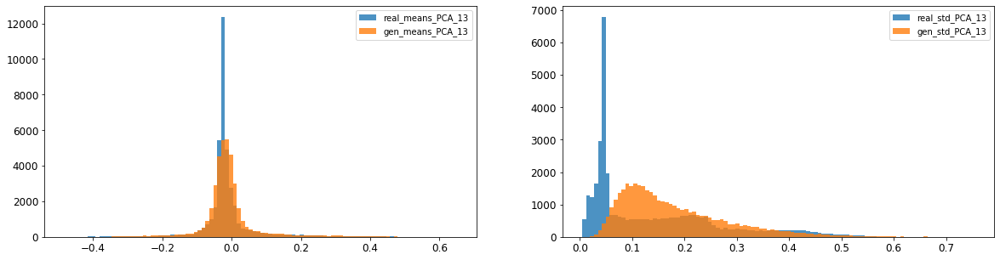

14: mean KL divergence (r,g) = inf
14: mean JS divergence = 0.1254973325628039
14: mean 1-BC divergence = 0.08920465981529746

14: std KL divergence (r,g) = inf
14: std JS divergence = 0.1982124537717374
14: std 1-BC divergence = 0.15546053544810468


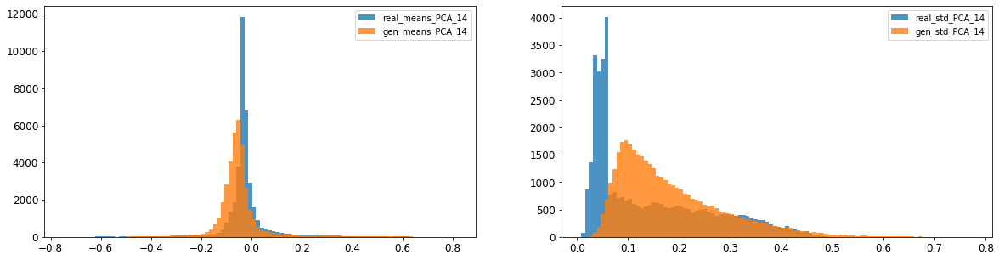

15: mean KL divergence (r,g) = inf
15: mean JS divergence = 0.4690114914914706
15: mean 1-BC divergence = 0.4314277264655437

15: std KL divergence (r,g) = 7.161857720174198
15: std JS divergence = 0.9699379981467384
15: std 1-BC divergence = 0.9164333484312475


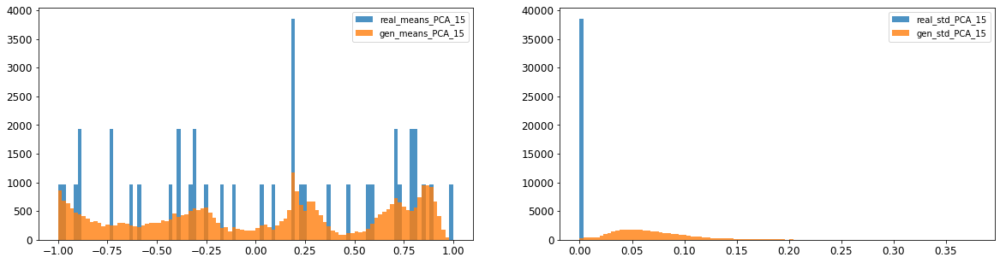

16: mean KL divergence (r,g) = 1.4574430306233026
16: mean JS divergence = 0.40546594913248035
16: mean 1-BC divergence = 0.3726823936504262

16: std KL divergence (r,g) = 6.043495523850805
16: std JS divergence = 0.9431686128632601
16: std 1-BC divergence = 0.8768701687328727


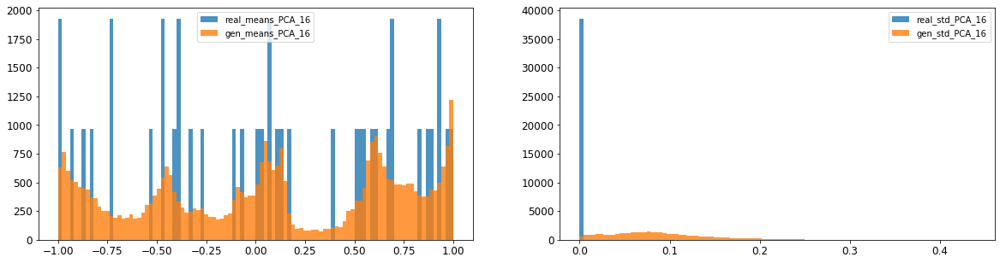



--------------------------------------------------------

Compose KL divergence (r,g) = inf
Compose JS divergence = 0.11833477188328925
Compose 1-BC divergence = 0.09503673295254633

Compose weighted KL divergence (r,g) = inf
Compose weighted JS divergence = 0.14130321618409183
Compose weighted 1-BC divergence = 0.12261606818687165

Multivariate KL divergence = 243.0115768219425


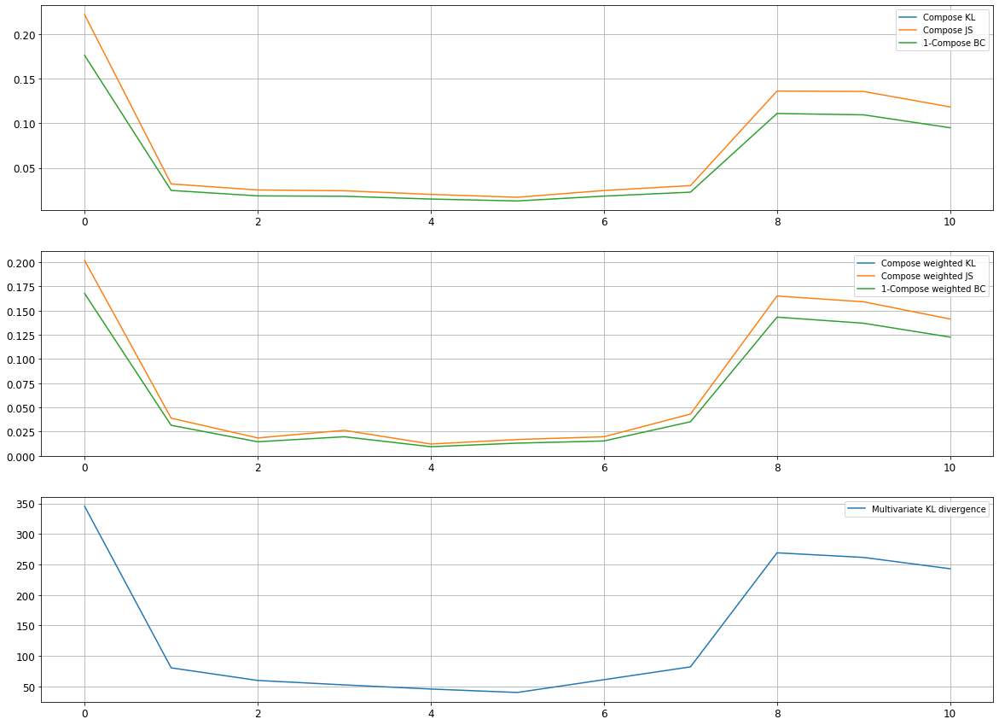

Epoch 2002/10000
discriminator loss: 0.019184 - generator loss: 0.669939 - 146s
Epoch 2003/10000
discriminator loss: 0.019034 - generator loss: 0.702760 - 146s
Epoch 2004/10000
discriminator loss: 0.019173 - generator loss: 0.677678 - 120s
Epoch 2005/10000
discriminator loss: 0.018507 - generator loss: 0.615907 - 119s
Epoch 2006/10000
discriminator loss: 0.019299 - generator loss: 0.617670 - 131s
Epoch 2007/10000
discriminator loss: 0.019059 - generator loss: 0.636222 - 148s
Epoch 2008/10000
discriminator loss: 0.019220 - generator loss: 0.637237 - 148s
Epoch 2009/10000
discriminator loss: 0.019128 - generator loss: 0.655344 - 149s
Epoch 2010/10000
discriminator loss: 0.018787 - generator loss: 0.660358 - 147s
Epoch 2011/10000
discriminator loss: 0.018641 - generator loss: 0.665958 - 148s
Epoch 2012/10000
discriminator loss: 0.018881 - generator loss: 0.691985 - 148s
Epoch 2013/10000
discriminator loss: 0.019179 - generator loss: 0.689978 - 148s
Epoch 2014/10000
discriminator loss: 0.0

discriminator loss: 0.017112 - generator loss: 0.928605 - 119s
Epoch 2106/10000
discriminator loss: 0.017187 - generator loss: 0.944469 - 119s
Epoch 2107/10000
discriminator loss: 0.017256 - generator loss: 0.967107 - 119s
Epoch 2108/10000
discriminator loss: 0.017657 - generator loss: 0.965982 - 136s
Epoch 2109/10000
discriminator loss: 0.016945 - generator loss: 0.996796 - 147s
Epoch 2110/10000
discriminator loss: 0.017484 - generator loss: 0.951700 - 147s
Epoch 2111/10000
discriminator loss: 0.017504 - generator loss: 0.970069 - 147s
Epoch 2112/10000
discriminator loss: 0.017913 - generator loss: 0.985076 - 147s
Epoch 2113/10000
discriminator loss: 0.017302 - generator loss: 0.983191 - 147s
Epoch 2114/10000
discriminator loss: 0.016773 - generator loss: 1.020556 - 147s
Epoch 2115/10000
discriminator loss: 0.017827 - generator loss: 0.962130 - 147s
Epoch 2116/10000
discriminator loss: 0.017748 - generator loss: 0.961581 - 147s
Epoch 2117/10000
discriminator loss: 0.018141 - generator

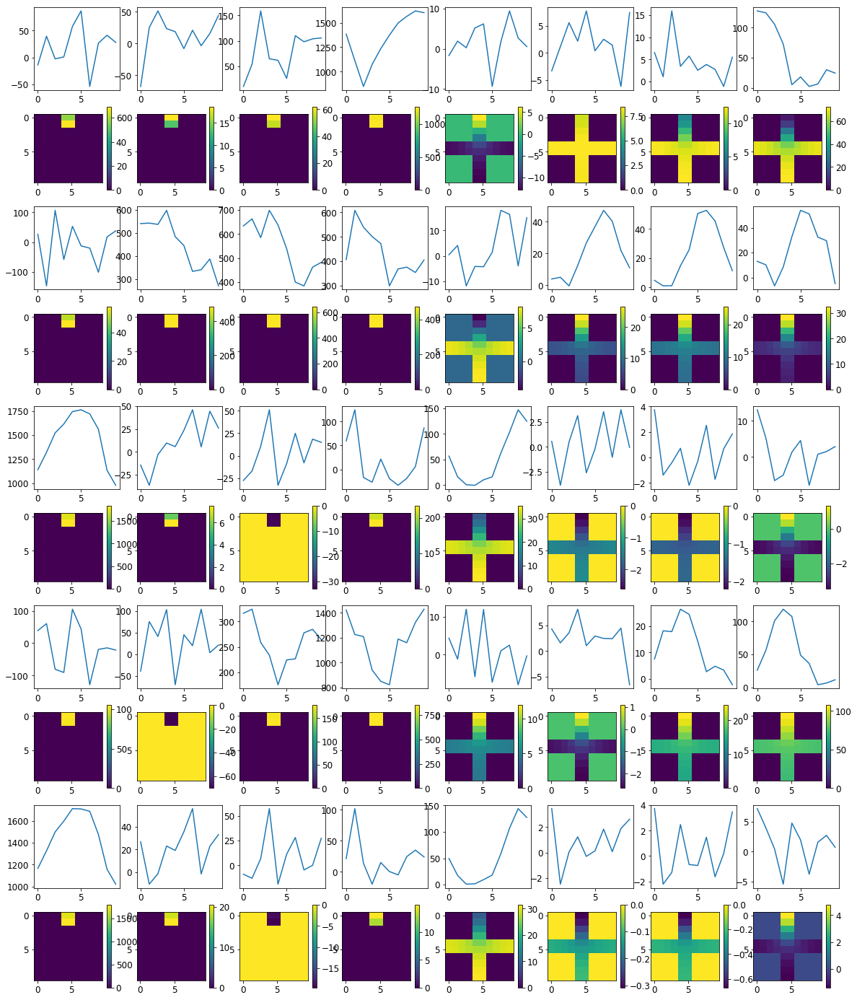


R0 generated:
[[12.5199585  18.172016  ]
 [14.685775   16.69102   ]
 [11.356928   18.344545  ]
 [12.872267   17.401358  ]
 [12.974516   17.797882  ]
 [13.004061   17.370178  ]
 [12.717956   18.493002  ]
 [12.630584   17.670832  ]
 [12.35169    17.597963  ]
 [13.686227   17.567602  ]
 [12.59657    16.548882  ]
 [15.409835   16.427805  ]
 [10.683061   17.562244  ]
 [11.669192   16.903807  ]
 [13.823146   15.126858  ]
 [13.236199   18.223766  ]
 [12.415845   17.755482  ]
 [10.811419   17.42837   ]
 [12.75234    17.552446  ]
 [13.007548   16.285946  ]
 [ 5.4064503   1.2241919 ]
 [ 3.785565    1.6154974 ]
 [ 2.700857    0.7454907 ]
 [ 3.667924    0.58592534]
 [ 4.3323755   0.89935213]
 [ 4.1245985   1.1234045 ]
 [ 4.2928176   0.9947698 ]
 [ 3.0972233   1.3620683 ]
 [ 3.7688417   1.233545  ]
 [ 4.133206    1.0733002 ]
 [16.947754    1.1034857 ]
 [16.93337     2.2851272 ]
 [16.30232     0.7931202 ]
 [16.504112    1.772921  ]
 [16.58233     1.1536348 ]
 [16.978441    0.99178314]
 [16.3871    

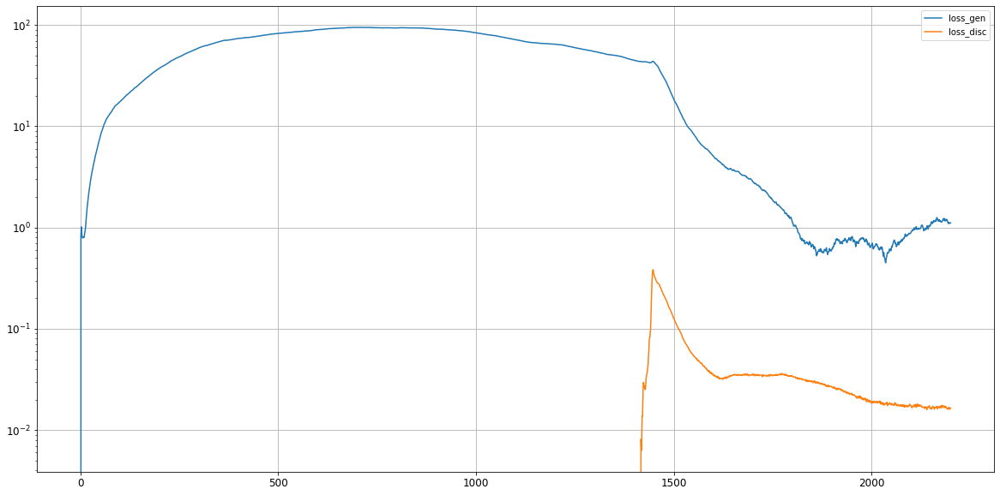

0: mean KL divergence (r,g) = 0.18192756144501948
0: mean JS divergence = 0.04795861936459532
0: mean 1-BC divergence = 0.038024269820823964

0: std KL divergence (r,g) = inf
0: std JS divergence = 0.22653299986825398
0: std 1-BC divergence = 0.20056930122988825


/home/viluiz/anaconda3/envs/py3ml/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


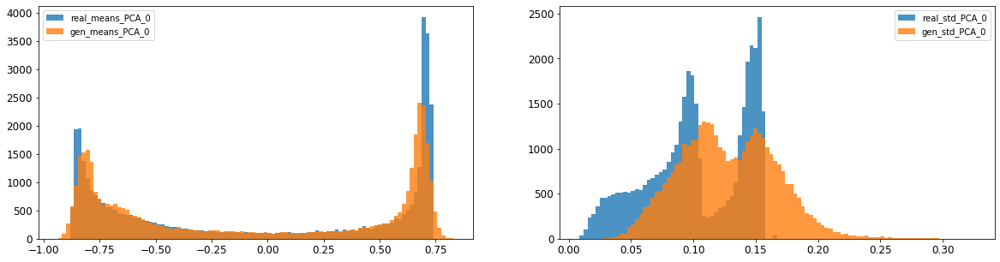

1: mean KL divergence (r,g) = inf
1: mean JS divergence = 0.032111018917643785
1: mean 1-BC divergence = 0.02313469123907219

1: std KL divergence (r,g) = inf
1: std JS divergence = 0.16684976051290654
1: std 1-BC divergence = 0.13316195757435068


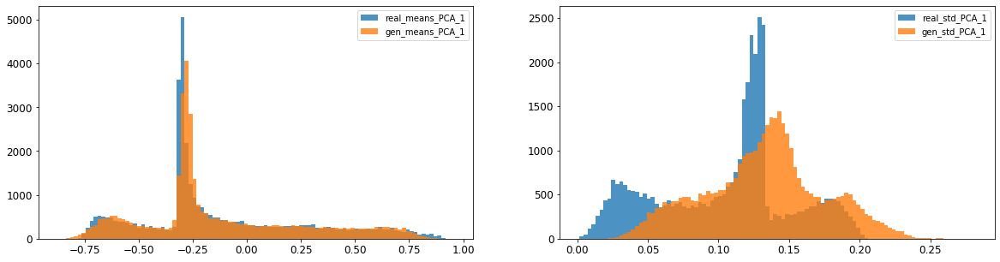

2: mean KL divergence (r,g) = inf
2: mean JS divergence = 0.020593911034458113
2: mean 1-BC divergence = 0.01614661571844589

2: std KL divergence (r,g) = 0.25401664110313765
2: std JS divergence = 0.081268849709297
2: std 1-BC divergence = 0.07614258156788145


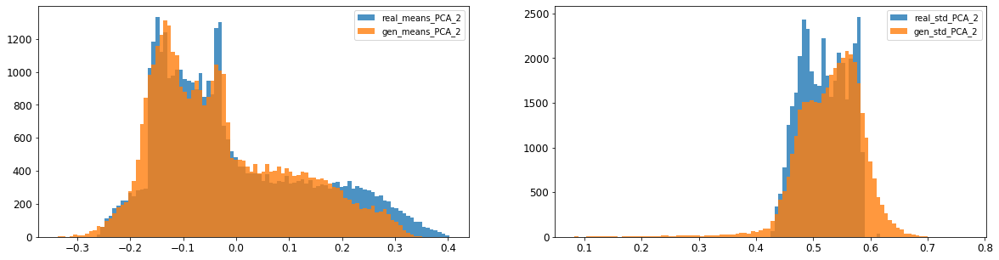

3: mean KL divergence (r,g) = 0.289047845435095
3: mean JS divergence = 0.059346645761215074
3: mean 1-BC divergence = 0.042807848913337554

3: std KL divergence (r,g) = inf
3: std JS divergence = 0.3052332498685034
3: std 1-BC divergence = 0.2682070612778048


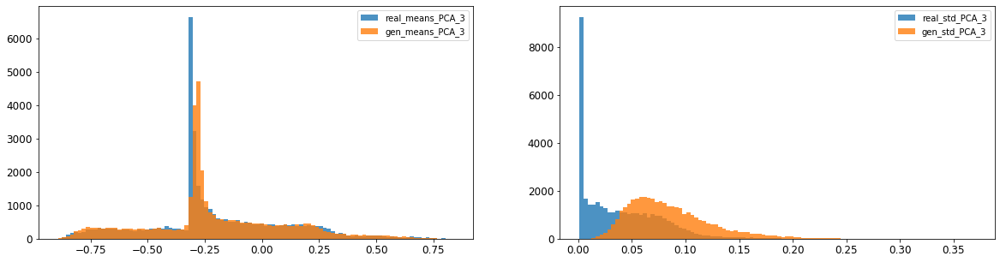

4: mean KL divergence (r,g) = 0.22417946186341495
4: mean JS divergence = 0.06773402565919584
4: mean 1-BC divergence = 0.05858377346253496

4: std KL divergence (r,g) = inf
4: std JS divergence = 0.04114452732522152
4: std 1-BC divergence = 0.03553593393862353


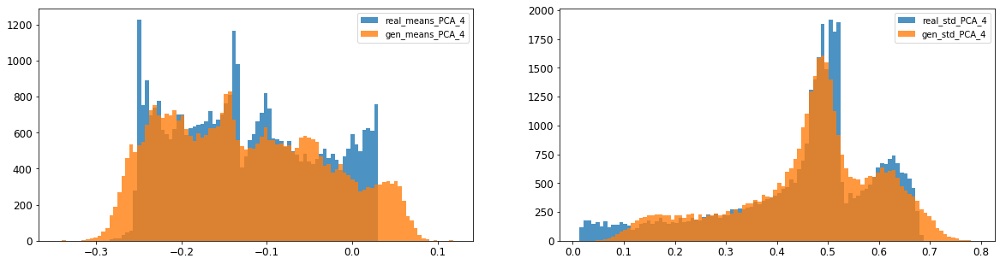

5: mean KL divergence (r,g) = 0.38383210079572033
5: mean JS divergence = 0.10015404131748917
5: mean 1-BC divergence = 0.07482622199735023

5: std KL divergence (r,g) = inf
5: std JS divergence = 0.23897994840323633
5: std 1-BC divergence = 0.1878621353436093


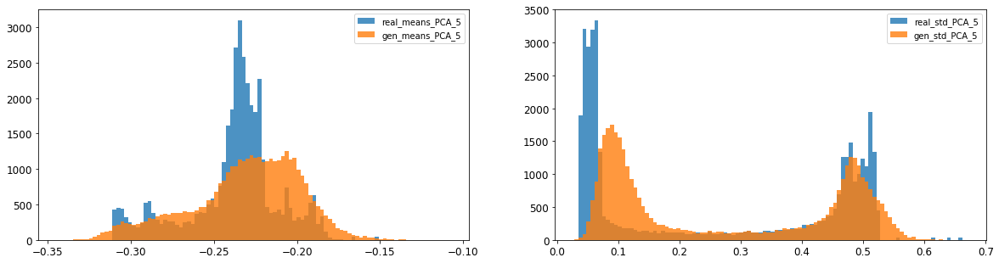

6: mean KL divergence (r,g) = 0.22061802224110583
6: mean JS divergence = 0.05321972190140027
6: mean 1-BC divergence = 0.037965707206379595

6: std KL divergence (r,g) = inf
6: std JS divergence = 0.11016797688660027
6: std 1-BC divergence = 0.0818173123063558


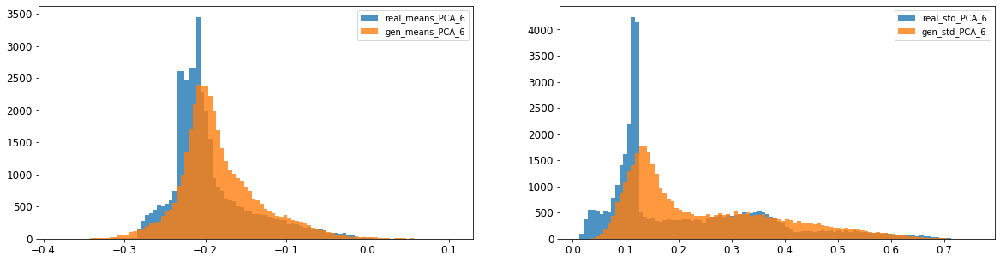

7: mean KL divergence (r,g) = 0.2927382940776686
7: mean JS divergence = 0.07688439467727604
7: mean 1-BC divergence = 0.059564226895168604

7: std KL divergence (r,g) = inf
7: std JS divergence = 0.136095890306609
7: std 1-BC divergence = 0.10650771983921858


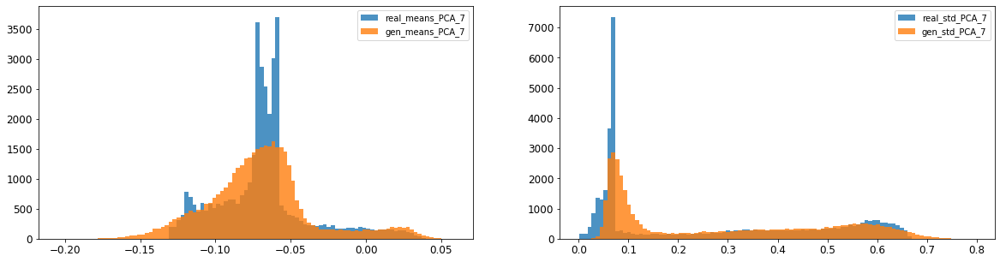

8: mean KL divergence (r,g) = inf
8: mean JS divergence = 0.024585449534122464
8: mean 1-BC divergence = 0.01723715560146688

8: std KL divergence (r,g) = inf
8: std JS divergence = 0.1504755635400369
8: std 1-BC divergence = 0.11713620438416639


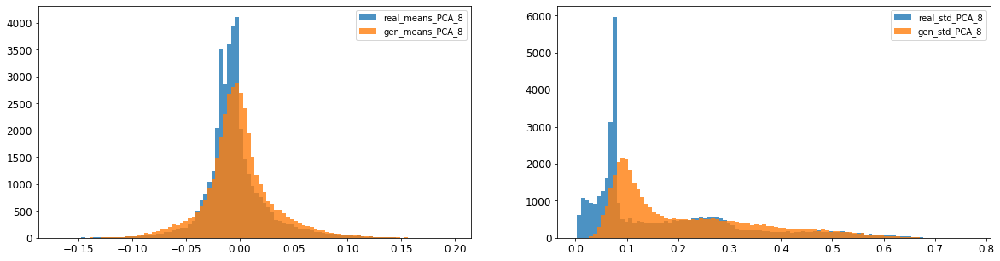

9: mean KL divergence (r,g) = inf
9: mean JS divergence = 0.03202895686037299
9: mean 1-BC divergence = 0.022622728424114613

9: std KL divergence (r,g) = inf
9: std JS divergence = 0.05856447959486004
9: std 1-BC divergence = 0.043389437016952526


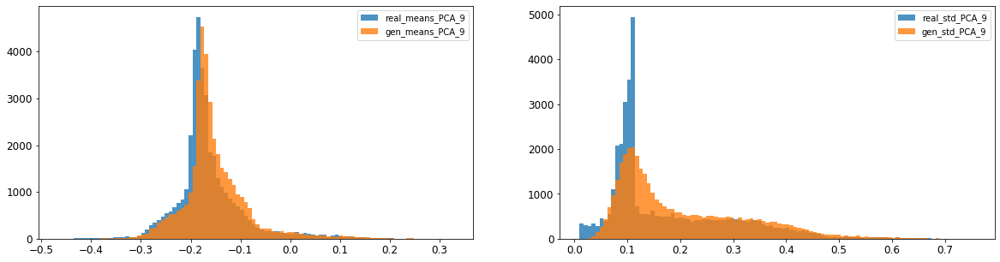

10: mean KL divergence (r,g) = inf
10: mean JS divergence = 0.05075846619323256
10: mean 1-BC divergence = 0.036006521126906166

10: std KL divergence (r,g) = inf
10: std JS divergence = 0.2520965406901648
10: std 1-BC divergence = 0.2013829429497881


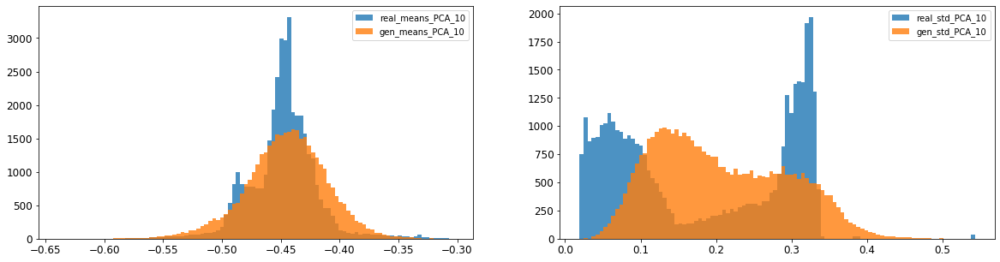

11: mean KL divergence (r,g) = 0.10279256764807516
11: mean JS divergence = 0.027349133228261664
11: mean 1-BC divergence = 0.01982309911491631

11: std KL divergence (r,g) = 0.9651889817841272
11: std JS divergence = 0.19507654498069446
11: std 1-BC divergence = 0.14781240198266066


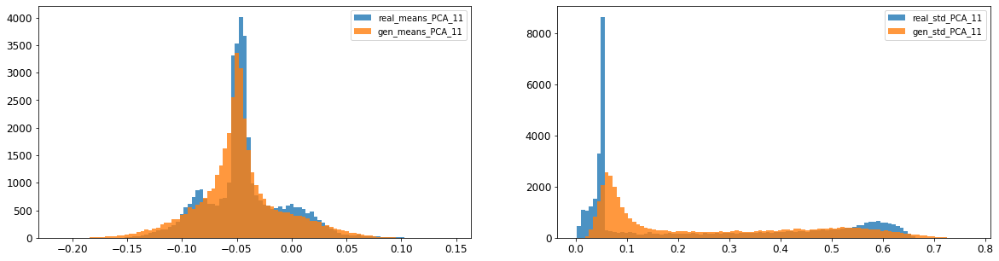

12: mean KL divergence (r,g) = inf
12: mean JS divergence = 0.05198678676119951
12: mean 1-BC divergence = 0.036719317320912825

12: std KL divergence (r,g) = inf
12: std JS divergence = 0.1465986774339911
12: std 1-BC divergence = 0.1158267801613192


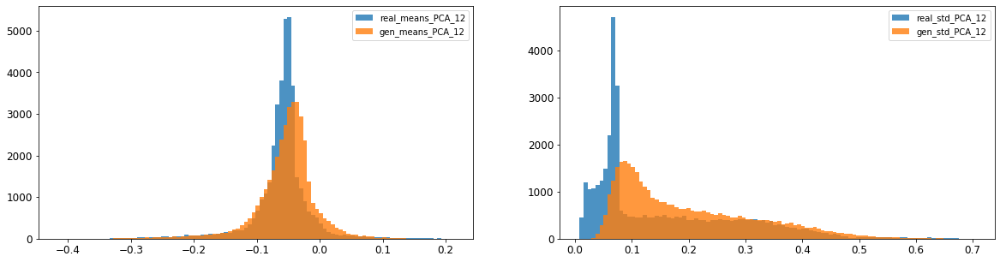

13: mean KL divergence (r,g) = 0.16071979267626077
13: mean JS divergence = 0.041512192371414305
13: mean 1-BC divergence = 0.02928611226986655

13: std KL divergence (r,g) = inf
13: std JS divergence = 0.18863062010202192
13: std 1-BC divergence = 0.1446240443552943


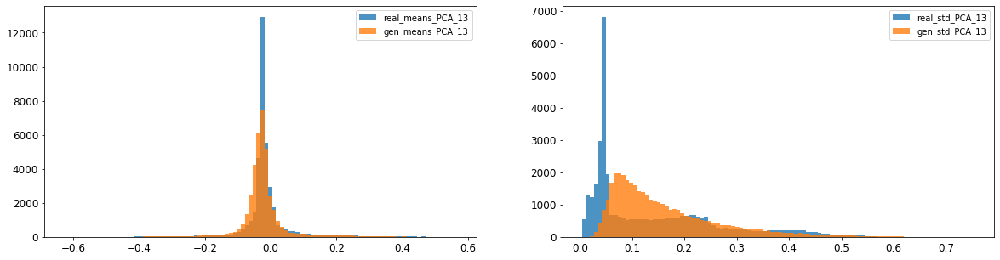

14: mean KL divergence (r,g) = 0.23310830657251355
14: mean JS divergence = 0.05809900146667357
14: mean 1-BC divergence = 0.04099376668315913

14: std KL divergence (r,g) = inf
14: std JS divergence = 0.17709627453718943
14: std 1-BC divergence = 0.1375297478795351


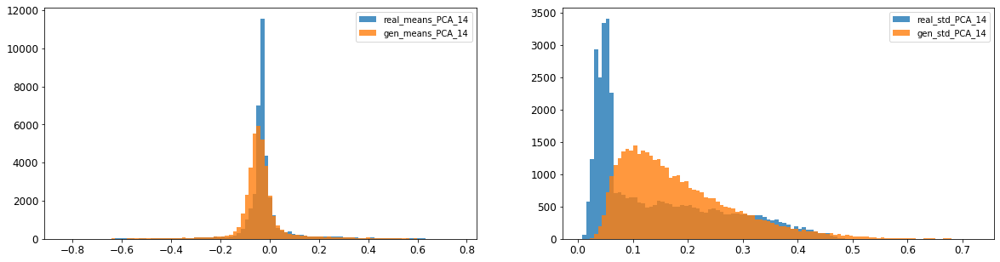

15: mean KL divergence (r,g) = inf
15: mean JS divergence = 0.45721040406895563
15: mean 1-BC divergence = 0.42120894776473106

15: std KL divergence (r,g) = 6.807055328028723
15: std JS divergence = 0.9631344290363515
15: std 1-BC divergence = 0.9054990700952861


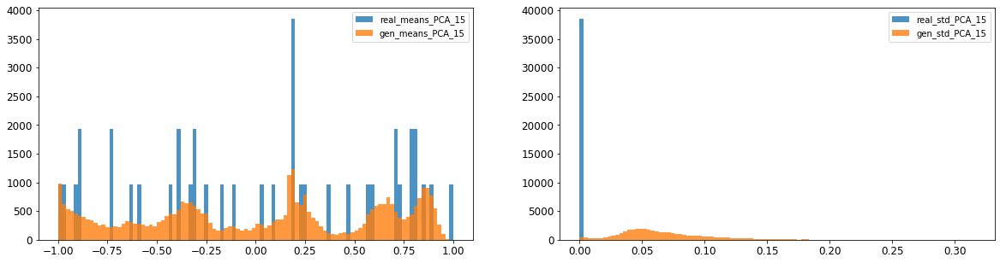

16: mean KL divergence (r,g) = 1.4691177202801566
16: mean JS divergence = 0.4079473992741476
16: mean 1-BC divergence = 0.3751496376440794

16: std KL divergence (r,g) = 6.567984165545646
16: std JS divergence = 0.9577438761331056
16: std 1-BC divergence = 0.8973355990054585


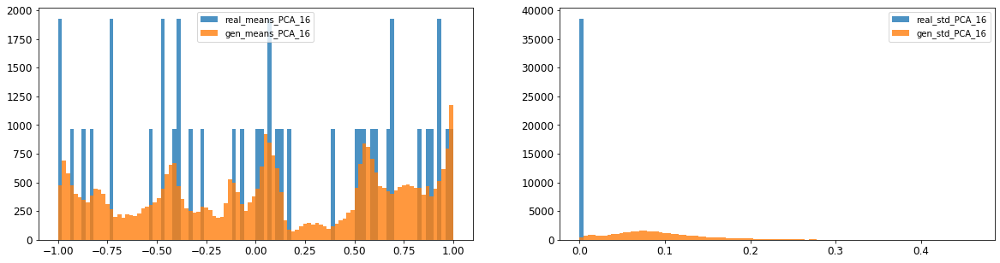



--------------------------------------------------------

Compose KL divergence (r,g) = inf
Compose JS divergence = 0.10730447562693793
Compose 1-BC divergence = 0.08504158725339694

Compose weighted KL divergence (r,g) = inf
Compose weighted JS divergence = 0.11957411333197447
Compose weighted 1-BC divergence = 0.10150488706833438

Multivariate KL divergence = 236.0474235141746


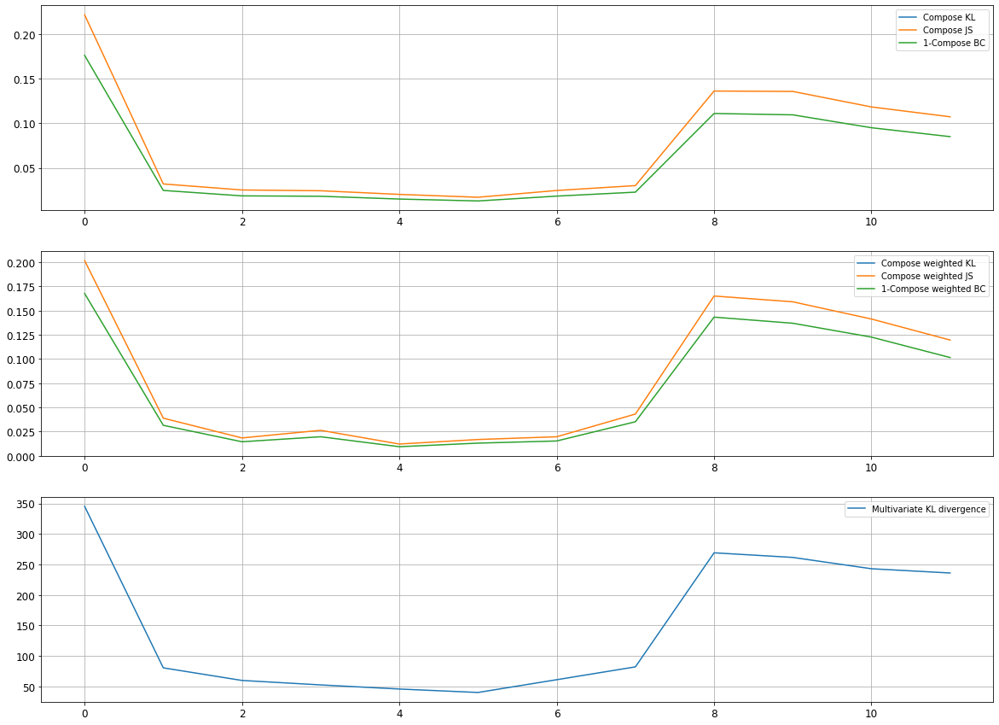

Epoch 2202/10000
discriminator loss: 0.016295 - generator loss: 1.085683 - 124s
Epoch 2203/10000
discriminator loss: 0.016225 - generator loss: 1.065019 - 118s
Epoch 2204/10000
discriminator loss: 0.015991 - generator loss: 1.075477 - 122s
Epoch 2205/10000
discriminator loss: 0.016735 - generator loss: 1.097549 - 144s
Epoch 2206/10000
discriminator loss: 0.016657 - generator loss: 1.103895 - 146s
Epoch 2207/10000
discriminator loss: 0.015897 - generator loss: 1.062291 - 146s
Epoch 2208/10000
discriminator loss: 0.016176 - generator loss: 1.076084 - 146s
Epoch 2209/10000
discriminator loss: 0.015782 - generator loss: 1.063834 - 145s
Epoch 2210/10000
discriminator loss: 0.015905 - generator loss: 1.047687 - 146s
Epoch 2211/10000
discriminator loss: 0.015981 - generator loss: 1.025818 - 147s
Epoch 2212/10000
discriminator loss: 0.016024 - generator loss: 1.030190 - 146s
Epoch 2213/10000
discriminator loss: 0.016040 - generator loss: 1.044510 - 146s
Epoch 2214/10000
discriminator loss: 0.0

discriminator loss: 0.014436 - generator loss: 1.027562 - 146s
Epoch 2306/10000
discriminator loss: 0.015106 - generator loss: 1.077778 - 146s
Epoch 2307/10000
discriminator loss: 0.014549 - generator loss: 1.046757 - 122s
Epoch 2308/10000
discriminator loss: 0.014931 - generator loss: 0.943423 - 120s
Epoch 2309/10000
discriminator loss: 0.014895 - generator loss: 0.946895 - 119s
Epoch 2310/10000
discriminator loss: 0.014464 - generator loss: 0.961609 - 119s
Epoch 2311/10000
discriminator loss: 0.015606 - generator loss: 1.000001 - 120s
Epoch 2312/10000
discriminator loss: 0.015262 - generator loss: 0.949147 - 119s
Epoch 2313/10000
discriminator loss: 0.015633 - generator loss: 0.940086 - 118s
Epoch 2314/10000
discriminator loss: 0.015465 - generator loss: 0.923236 - 118s
Epoch 2315/10000
discriminator loss: 0.015723 - generator loss: 0.935085 - 118s
Epoch 2316/10000
discriminator loss: 0.015217 - generator loss: 0.917775 - 135s
Epoch 2317/10000
discriminator loss: 0.015420 - generator

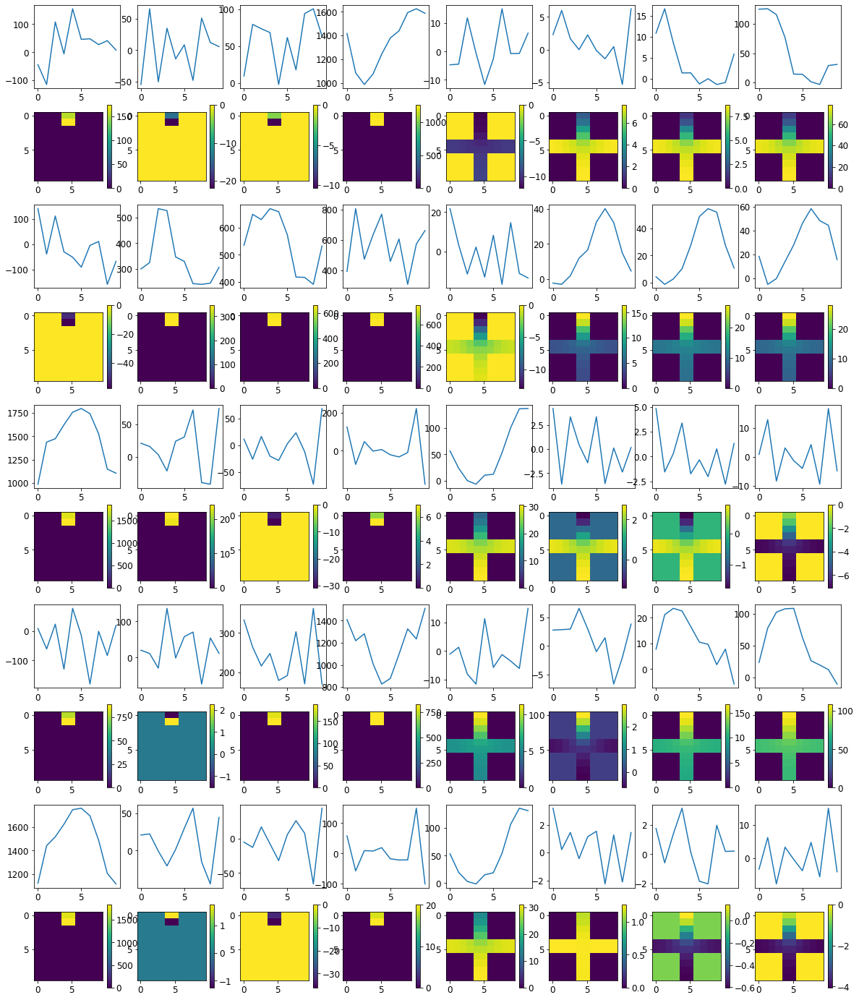


R0 generated:
[[13.536774   18.210968  ]
 [14.460623   17.685457  ]
 [10.693242   17.299461  ]
 [13.340713   17.33774   ]
 [14.112696   16.937136  ]
 [12.421581   17.852755  ]
 [13.297415   17.448135  ]
 [12.085723   18.159033  ]
 [11.424442   17.572632  ]
 [15.227856   17.707167  ]
 [12.798937   17.557856  ]
 [13.344454   16.623693  ]
 [11.557649   16.728794  ]
 [11.90768    15.851534  ]
 [13.09883    17.501856  ]
 [12.550381   17.808727  ]
 [13.309019   16.526295  ]
 [11.865793   17.391037  ]
 [13.6810465  15.701345  ]
 [10.424861   16.86746   ]
 [ 6.024886    1.57957   ]
 [ 4.808894    3.4335618 ]
 [ 5.663922    3.0701642 ]
 [ 4.6331453   2.7985265 ]
 [ 5.6045246   3.4046357 ]
 [ 6.8404      3.5562716 ]
 [ 4.6928015   3.5618114 ]
 [ 5.9245954   2.5296116 ]
 [ 4.310931    3.2968564 ]
 [ 5.3485994   2.9468772 ]
 [16.055641    0.9916677 ]
 [16.705914    0.5940853 ]
 [16.988768    1.2968541 ]
 [16.460691    1.2717469 ]
 [15.526279    0.43235373]
 [15.714586    0.8667118 ]
 [16.586758  

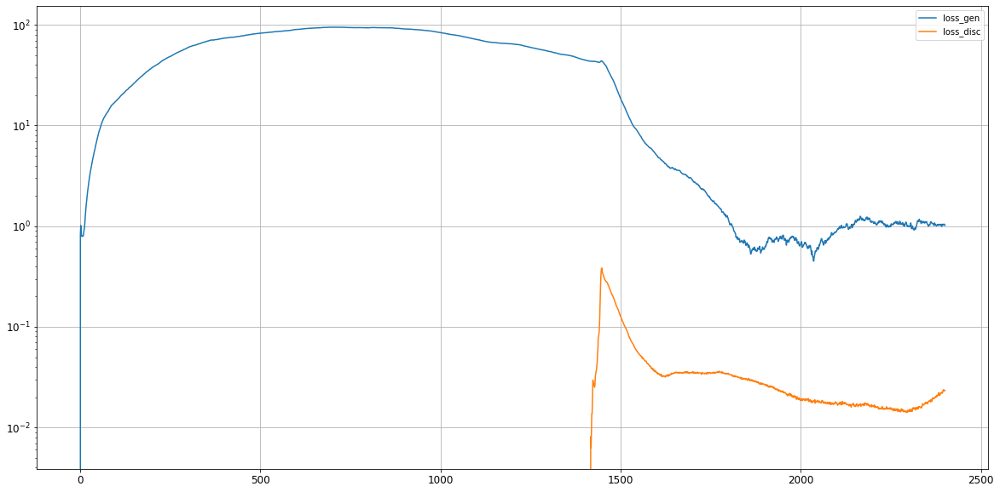

0: mean KL divergence (r,g) = 0.21641860992673914
0: mean JS divergence = 0.06534967106753817
0: mean 1-BC divergence = 0.05966903523156253

0: std KL divergence (r,g) = inf
0: std JS divergence = 0.2401880336117458
0: std 1-BC divergence = 0.2006707479638472


/home/viluiz/anaconda3/envs/py3ml/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


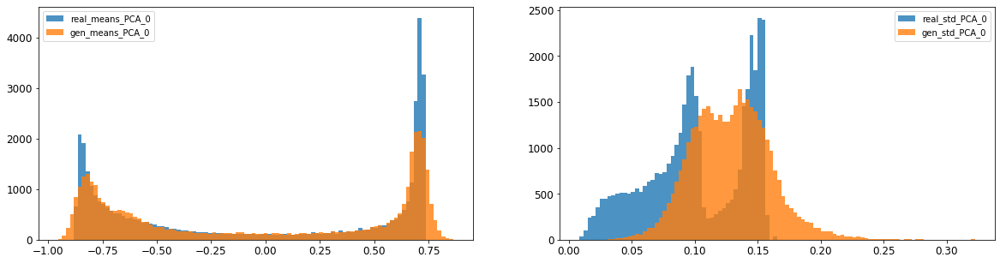

1: mean KL divergence (r,g) = 0.10415582245315921
1: mean JS divergence = 0.027528272273646057
1: mean 1-BC divergence = 0.021110420466568747

1: std KL divergence (r,g) = inf
1: std JS divergence = 0.21871598798602418
1: std 1-BC divergence = 0.18260855215556804


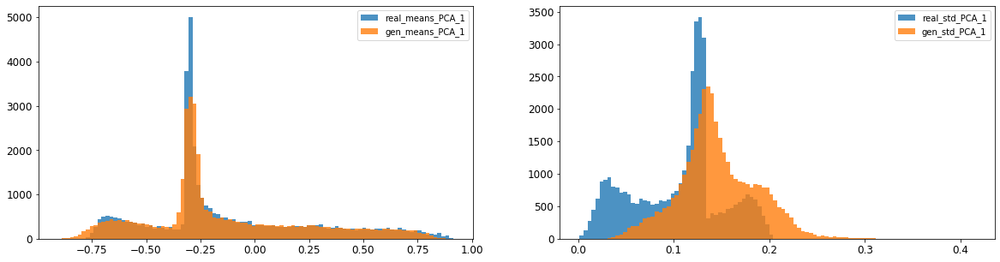

2: mean KL divergence (r,g) = inf
2: mean JS divergence = 0.05585050925189624
2: mean 1-BC divergence = 0.044078374686003174

2: std KL divergence (r,g) = 0.33995877096173166
2: std JS divergence = 0.10366728968339083
2: std 1-BC divergence = 0.09380723787426581


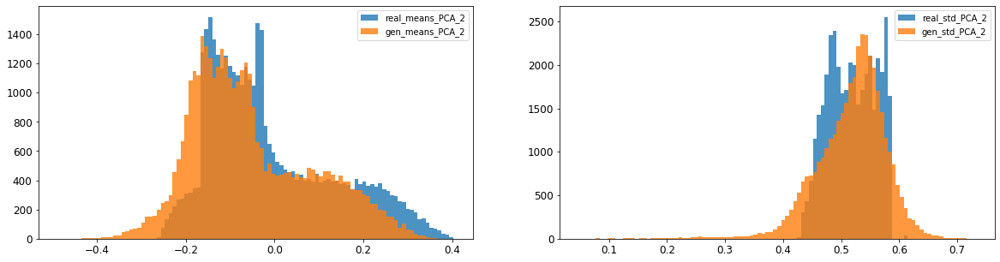

3: mean KL divergence (r,g) = 0.3359535182834222
3: mean JS divergence = 0.06893583629132219
3: mean 1-BC divergence = 0.04978217849250477

3: std KL divergence (r,g) = inf
3: std JS divergence = 0.3351894091532138
3: std 1-BC divergence = 0.29829471350182757


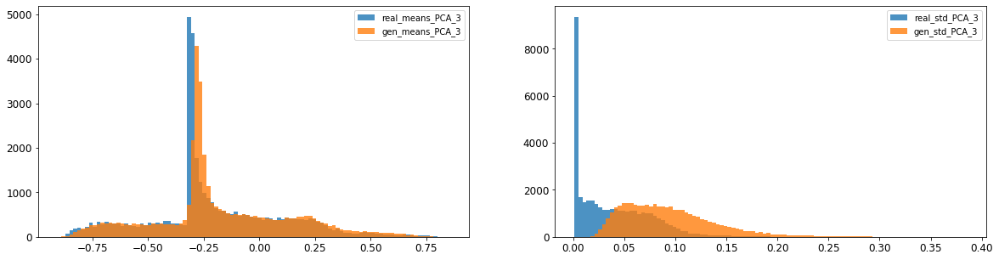

4: mean KL divergence (r,g) = 0.151519488505341
4: mean JS divergence = 0.04626998941007952
4: mean 1-BC divergence = 0.039998568754226915

4: std KL divergence (r,g) = inf
4: std JS divergence = 0.05411705784512292
4: std 1-BC divergence = 0.04875019110261092


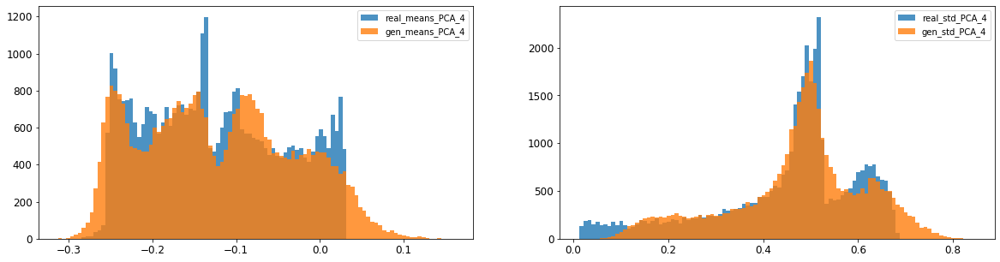

5: mean KL divergence (r,g) = 0.3382006811407677
5: mean JS divergence = 0.09021712507116529
5: mean 1-BC divergence = 0.06954467203680359

5: std KL divergence (r,g) = 1.2655610547670029
5: std JS divergence = 0.24097357097084054
5: std 1-BC divergence = 0.18723239664011482


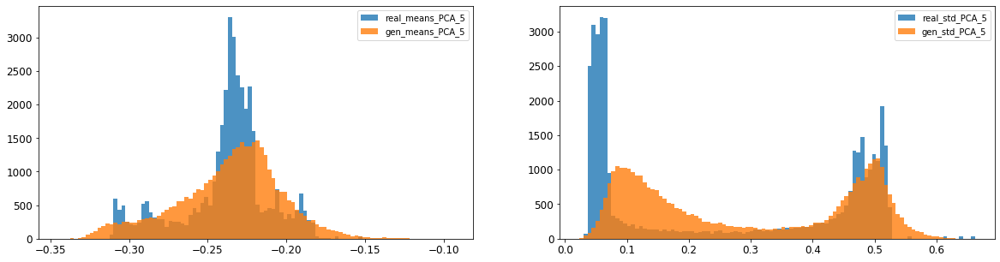

6: mean KL divergence (r,g) = 0.07772114642038311
6: mean JS divergence = 0.020844739396856174
6: mean 1-BC divergence = 0.01503618246860261

6: std KL divergence (r,g) = inf
6: std JS divergence = 0.11343316429586386
6: std 1-BC divergence = 0.08458078091451982


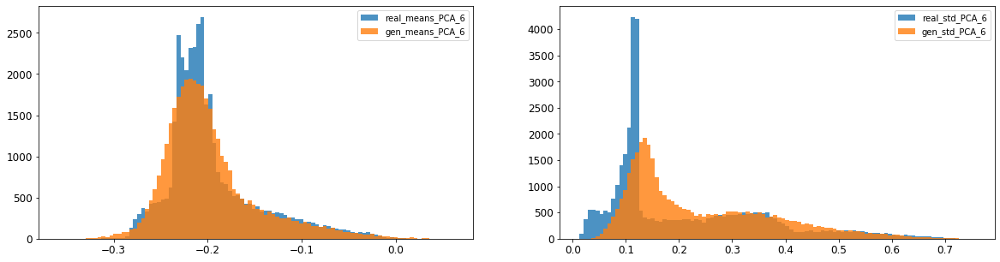

7: mean KL divergence (r,g) = 0.17347230901275307
7: mean JS divergence = 0.045828605326056364
7: mean 1-BC divergence = 0.03481242221635772

7: std KL divergence (r,g) = inf
7: std JS divergence = 0.22582208029201994
7: std 1-BC divergence = 0.17563999819248544


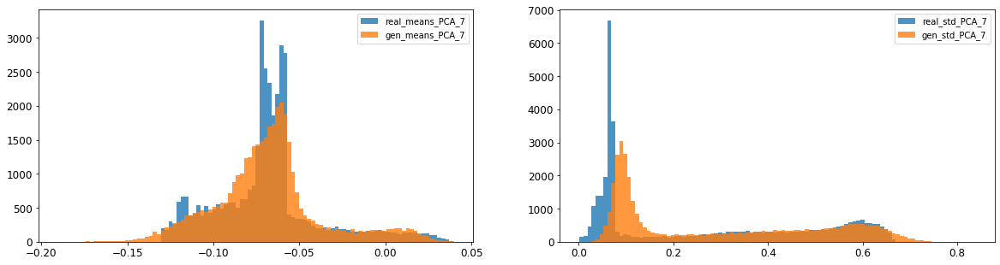

8: mean KL divergence (r,g) = inf
8: mean JS divergence = 0.029330887185829633
8: mean 1-BC divergence = 0.021026205993196156

8: std KL divergence (r,g) = inf
8: std JS divergence = 0.1738861634948378
8: std 1-BC divergence = 0.13616644258670518


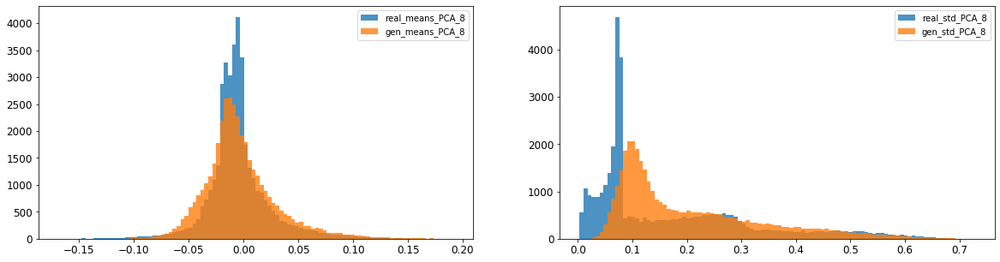

9: mean KL divergence (r,g) = inf
9: mean JS divergence = 0.01855417790868736
9: mean 1-BC divergence = 0.01321461643796129

9: std KL divergence (r,g) = inf
9: std JS divergence = 0.0669221302844146
9: std 1-BC divergence = 0.04949336525349679


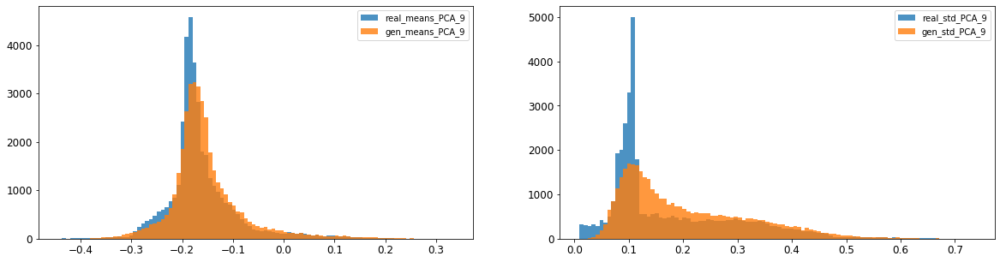

10: mean KL divergence (r,g) = inf
10: mean JS divergence = 0.07900642394639068
10: mean 1-BC divergence = 0.05729666954289836

10: std KL divergence (r,g) = inf
10: std JS divergence = 0.28260873971995626
10: std 1-BC divergence = 0.2237123677700248


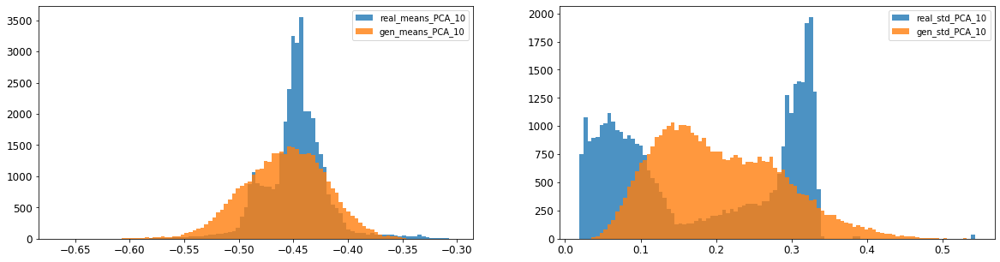

11: mean KL divergence (r,g) = inf
11: mean JS divergence = 0.028224851369118287
11: mean 1-BC divergence = 0.020817403653876743

11: std KL divergence (r,g) = inf
11: std JS divergence = 0.14529640690164425
11: std 1-BC divergence = 0.11088740725534729


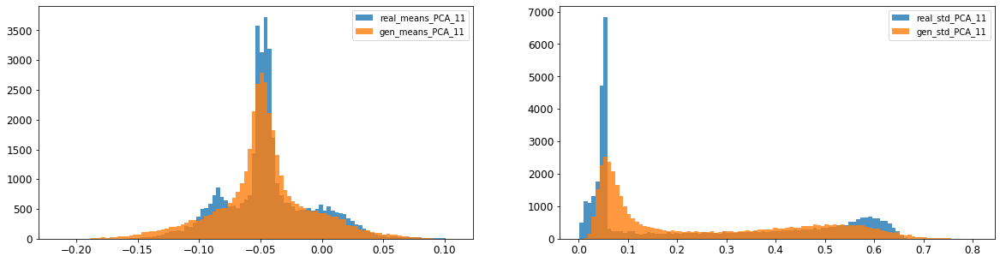

12: mean KL divergence (r,g) = inf
12: mean JS divergence = 0.050303536917118946
12: mean 1-BC divergence = 0.03585200620671769

12: std KL divergence (r,g) = inf
12: std JS divergence = 0.1909143354110383
12: std 1-BC divergence = 0.14979839218979873


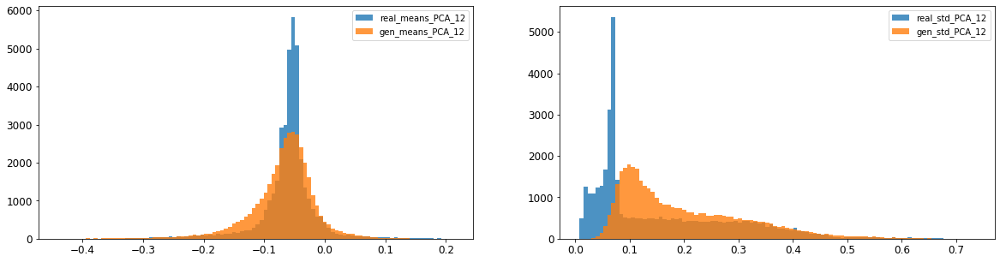

13: mean KL divergence (r,g) = inf
13: mean JS divergence = 0.03139716917634071
13: mean 1-BC divergence = 0.022025741188372083

13: std KL divergence (r,g) = inf
13: std JS divergence = 0.2074360074360377
13: std 1-BC divergence = 0.16339711677326463


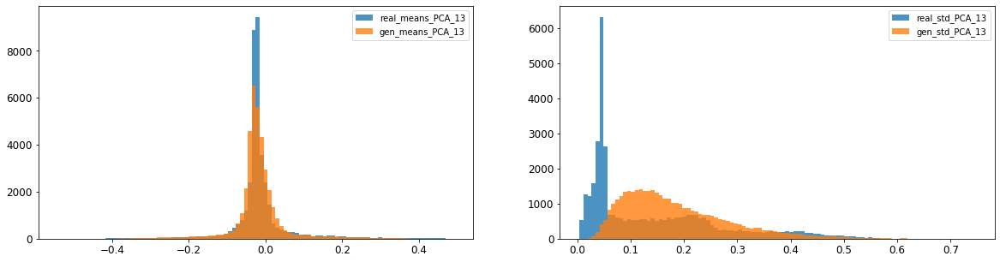

14: mean KL divergence (r,g) = 0.1079097308120682
14: mean JS divergence = 0.02657528418281248
14: mean 1-BC divergence = 0.018581983306775962

14: std KL divergence (r,g) = inf
14: std JS divergence = 0.2056148376372408
14: std 1-BC divergence = 0.1624273370789736


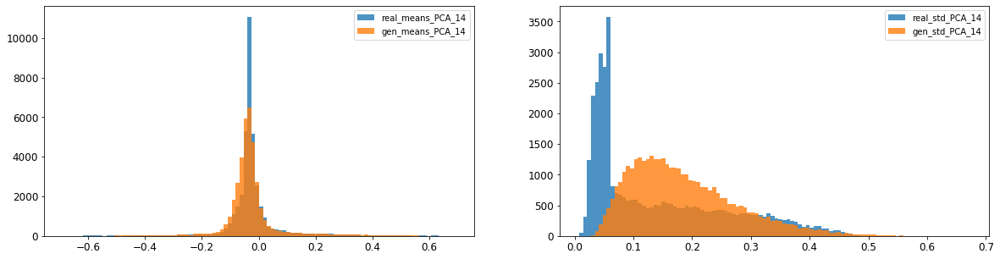

15: mean KL divergence (r,g) = inf
15: mean JS divergence = 0.4664307136306867
15: mean 1-BC divergence = 0.4294317903652256

15: std KL divergence (r,g) = 7.678731231053185
15: std JS divergence = 0.9777324904348095
15: std 1-BC divergence = 0.9301388411483495


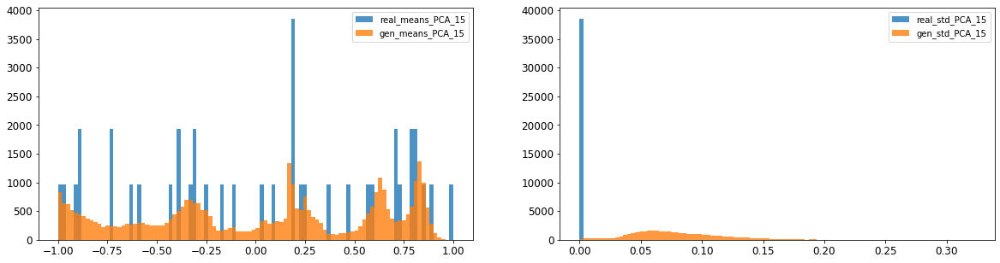

16: mean KL divergence (r,g) = 1.4725173743788356
16: mean JS divergence = 0.4047570201964535
16: mean 1-BC divergence = 0.37211969472644646

16: std KL divergence (r,g) = 5.688355649941585
16: std JS divergence = 0.9307206962523302
16: std 1-BC divergence = 0.860742959371937


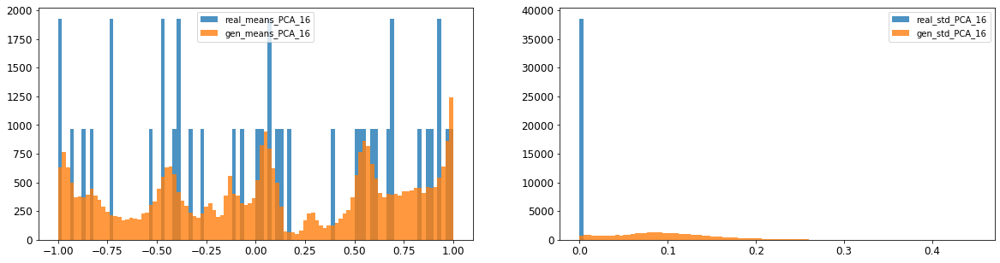



--------------------------------------------------------

Compose KL divergence (r,g) = inf
Compose JS divergence = 0.11630007644994166
Compose 1-BC divergence = 0.0930104509311761

Compose weighted KL divergence (r,g) = inf
Compose weighted JS divergence = 0.13658499858086373
Compose weighted 1-BC divergence = 0.11538057267452562

Multivariate KL divergence = 253.5528335236357


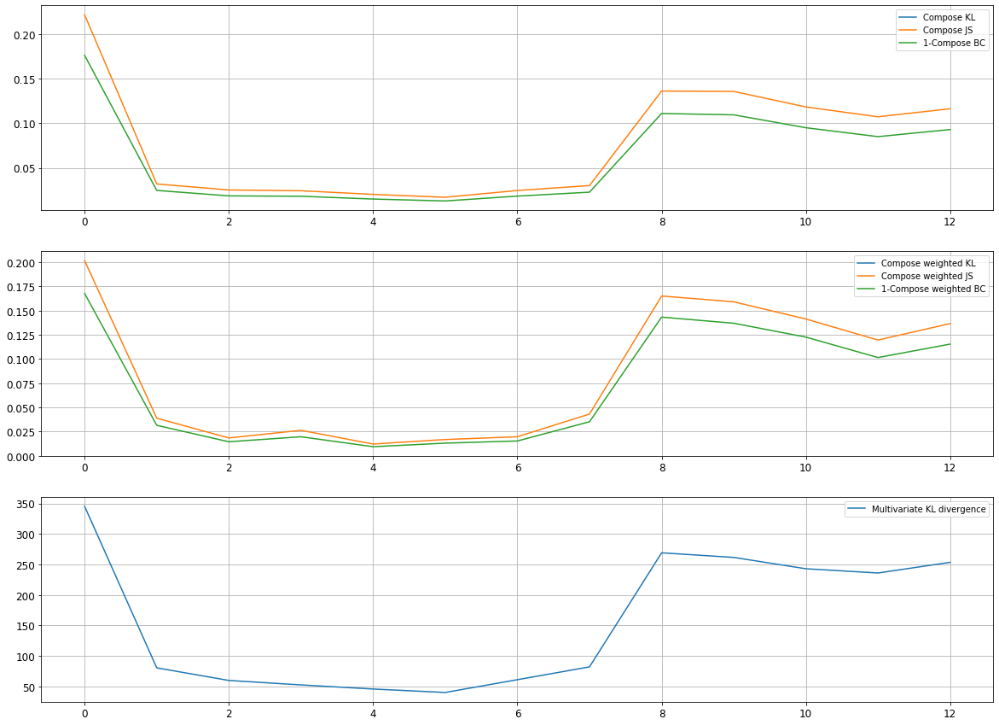

Epoch 2402/10000
discriminator loss: 0.023249 - generator loss: 1.014932 - 116s
Epoch 2403/10000
discriminator loss: 0.024205 - generator loss: 0.968399 - 137s
Epoch 2404/10000
discriminator loss: 0.023254 - generator loss: 1.003717 - 145s
Epoch 2405/10000
discriminator loss: 0.024186 - generator loss: 0.981394 - 147s
Epoch 2406/10000
discriminator loss: 0.023681 - generator loss: 0.976478 - 147s
Epoch 2407/10000
discriminator loss: 0.023402 - generator loss: 0.978632 - 148s
Epoch 2408/10000
discriminator loss: 0.024347 - generator loss: 0.977718 - 148s
Epoch 2409/10000
discriminator loss: 0.023929 - generator loss: 0.968254 - 147s
Epoch 2410/10000
discriminator loss: 0.024405 - generator loss: 0.971781 - 146s
Epoch 2411/10000
discriminator loss: 0.023713 - generator loss: 0.959386 - 147s
Epoch 2412/10000
discriminator loss: 0.024008 - generator loss: 0.967690 - 147s
Epoch 2413/10000
discriminator loss: 0.024294 - generator loss: 1.029440 - 145s
Epoch 2414/10000
discriminator loss: 0.0

discriminator loss: 0.023826 - generator loss: 0.354139 - 146s
Epoch 2506/10000
discriminator loss: 0.023261 - generator loss: 0.371022 - 146s
Epoch 2507/10000
discriminator loss: 0.024028 - generator loss: 0.380452 - 145s
Epoch 2508/10000
discriminator loss: 0.023696 - generator loss: 0.322686 - 146s
Epoch 2509/10000
discriminator loss: 0.023841 - generator loss: 0.263859 - 145s
Epoch 2510/10000
discriminator loss: 0.024094 - generator loss: 0.228379 - 146s
Epoch 2511/10000
discriminator loss: 0.023384 - generator loss: 0.205825 - 148s
Epoch 2512/10000
discriminator loss: 0.023608 - generator loss: 0.199623 - 146s
Epoch 2513/10000
discriminator loss: 0.023943 - generator loss: 0.140172 - 149s
Epoch 2514/10000
discriminator loss: 0.023709 - generator loss: 0.125737 - 124s
Epoch 2515/10000
discriminator loss: 0.024027 - generator loss: 0.115865 - 120s
Epoch 2516/10000
discriminator loss: 0.023457 - generator loss: 0.084957 - 120s
Epoch 2517/10000
discriminator loss: 0.023338 - generator

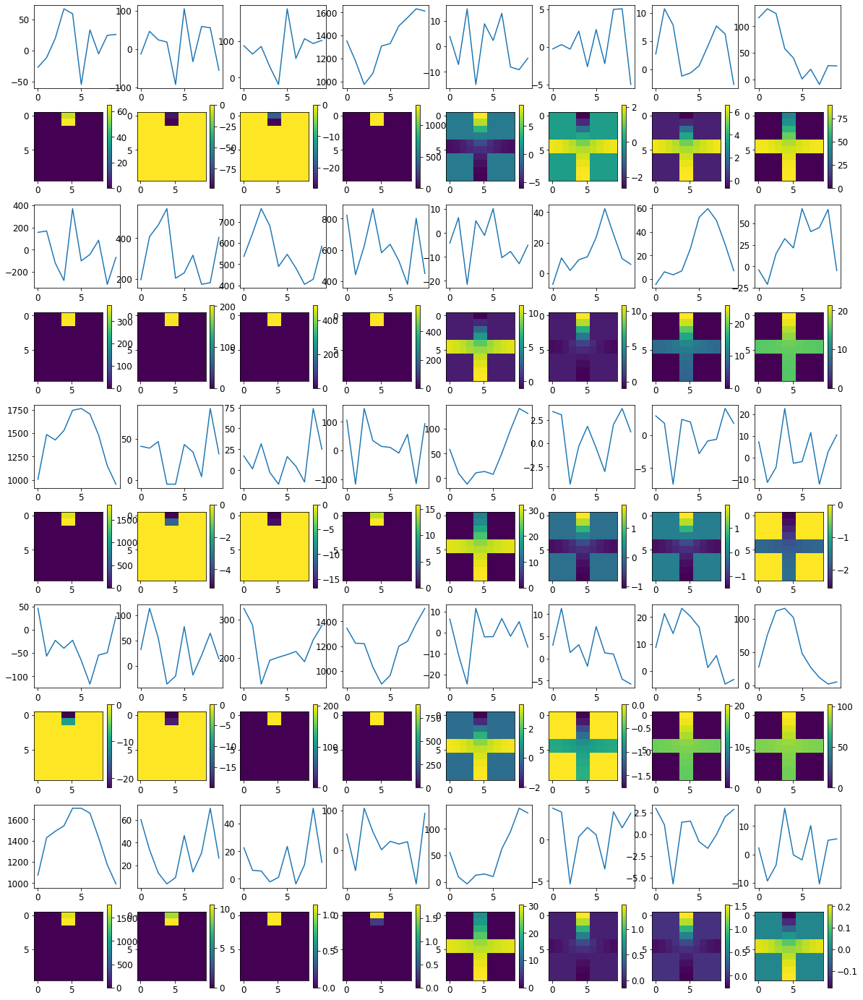


R0 generated:
[[13.69585    17.753752  ]
 [12.8324995  17.500662  ]
 [12.654448   15.064326  ]
 [11.555655   15.399974  ]
 [11.306318   16.278282  ]
 [13.344148   14.783511  ]
 [12.439728   16.241945  ]
 [11.30476    17.410185  ]
 [12.704361   14.779672  ]
 [12.042079   16.35468   ]
 [12.592908   18.739965  ]
 [15.202717   16.772049  ]
 [11.398784   17.881554  ]
 [11.831444   17.398592  ]
 [13.5233     15.362017  ]
 [12.202059   16.840319  ]
 [12.548481   16.740732  ]
 [13.121847   18.330162  ]
 [11.30572    15.22359   ]
 [13.424645   17.202084  ]
 [ 4.722995    1.1886594 ]
 [ 3.9310744   2.3338945 ]
 [ 3.2969654   0.90147054]
 [ 4.867263    2.1132329 ]
 [ 4.746124    1.4775895 ]
 [ 4.0971365   1.9408404 ]
 [ 4.187567    1.9857666 ]
 [ 5.3635345   2.3835287 ]
 [ 4.549751    2.68922   ]
 [ 4.4259377   1.9203851 ]
 [15.660186    1.31903   ]
 [17.109022    0.7351978 ]
 [16.718603    0.7199415 ]
 [16.574577    0.93540126]
 [16.32188     0.87807006]
 [16.401548    0.66724885]
 [17.367474  

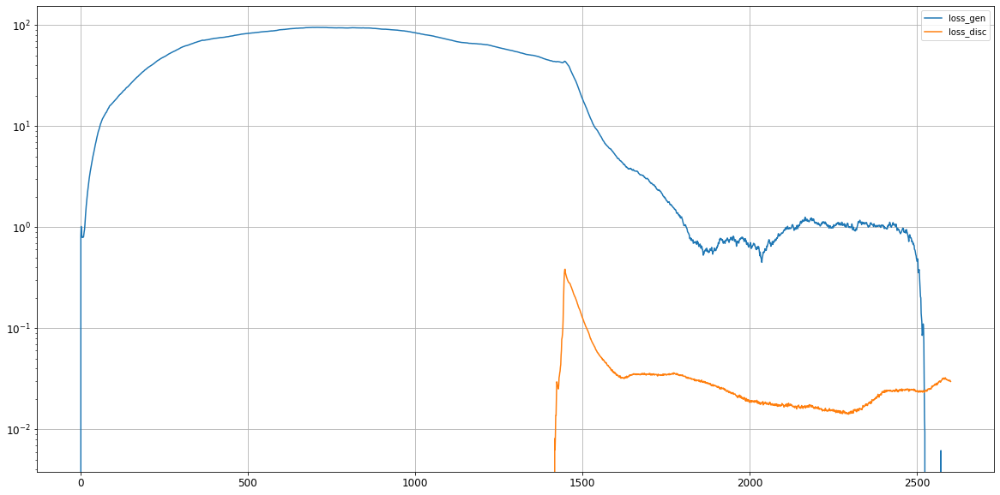

0: mean KL divergence (r,g) = 0.46014587740507995
0: mean JS divergence = 0.09984439385464791
0: mean 1-BC divergence = 0.07484722901705265

0: std KL divergence (r,g) = inf
0: std JS divergence = 0.2705402860794157
0: std 1-BC divergence = 0.2440257696422764


/home/viluiz/anaconda3/envs/py3ml/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


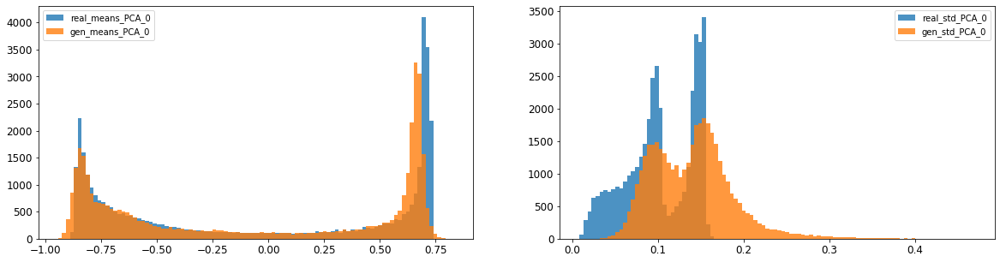

1: mean KL divergence (r,g) = inf
1: mean JS divergence = 0.05496998765095338
1: mean 1-BC divergence = 0.040082085799655665

1: std KL divergence (r,g) = inf
1: std JS divergence = 0.26956533834936536
1: std 1-BC divergence = 0.2278333765478019


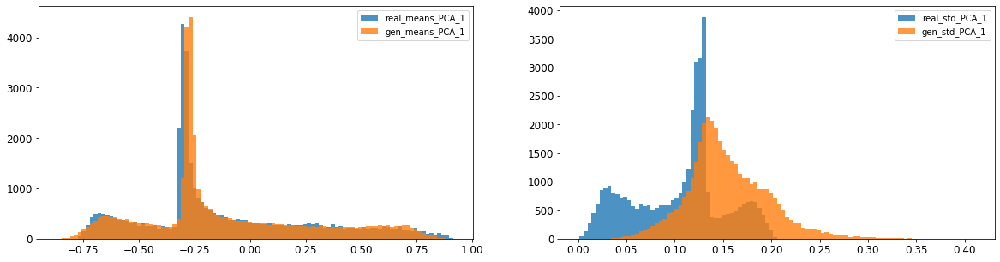

2: mean KL divergence (r,g) = 0.07369003322423046
2: mean JS divergence = 0.019970011366732772
2: mean 1-BC divergence = 0.014582698412590855

2: std KL divergence (r,g) = 0.3227447597431462
2: std JS divergence = 0.1015337037090332
2: std 1-BC divergence = 0.09288585820237394


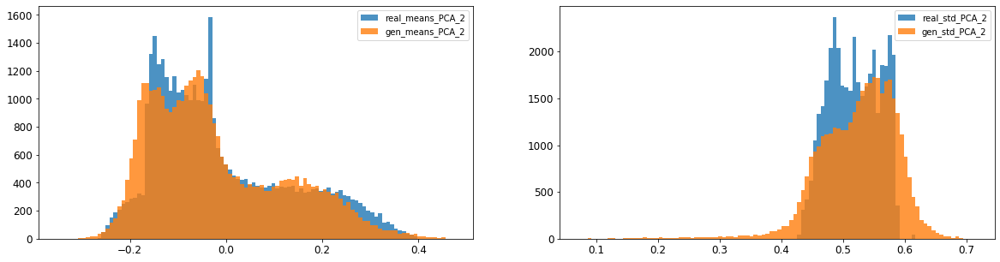

3: mean KL divergence (r,g) = 0.4653810582205456
3: mean JS divergence = 0.08835501787640467
3: mean 1-BC divergence = 0.06504859715034139

3: std KL divergence (r,g) = inf
3: std JS divergence = 0.36032169367311073
3: std 1-BC divergence = 0.3222689963262264


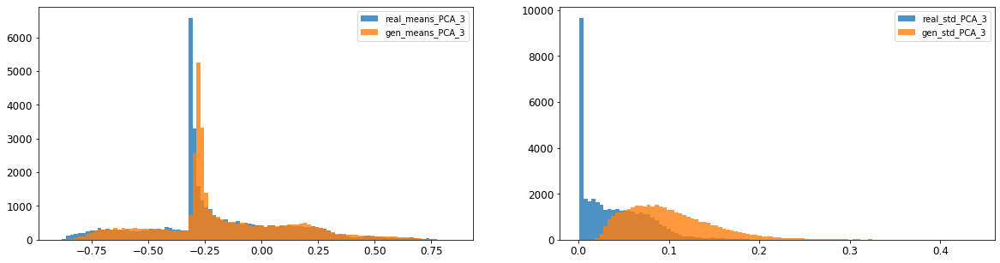

4: mean KL divergence (r,g) = 0.20708800420355455
4: mean JS divergence = 0.06283340222177453
4: mean 1-BC divergence = 0.0557682774038073

4: std KL divergence (r,g) = inf
4: std JS divergence = 0.042371114510938127
4: std 1-BC divergence = 0.03777501599923583


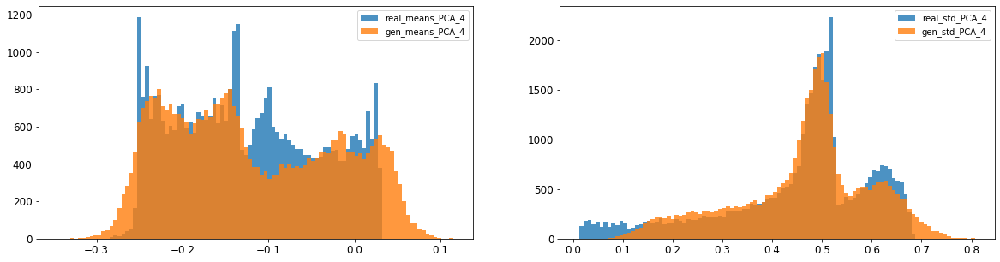

5: mean KL divergence (r,g) = 0.3748748390553512
5: mean JS divergence = 0.10222323989654455
5: mean 1-BC divergence = 0.08276335293718462

5: std KL divergence (r,g) = inf
5: std JS divergence = 0.2748991635668825
5: std 1-BC divergence = 0.21512948381159214


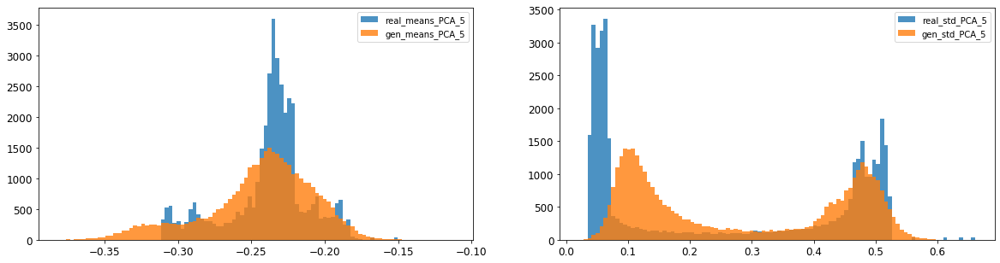

6: mean KL divergence (r,g) = 0.13803466640645704
6: mean JS divergence = 0.037302273994914203
6: mean 1-BC divergence = 0.028109871512662754

6: std KL divergence (r,g) = inf
6: std JS divergence = 0.14655048438984714
6: std 1-BC divergence = 0.11097088570334479


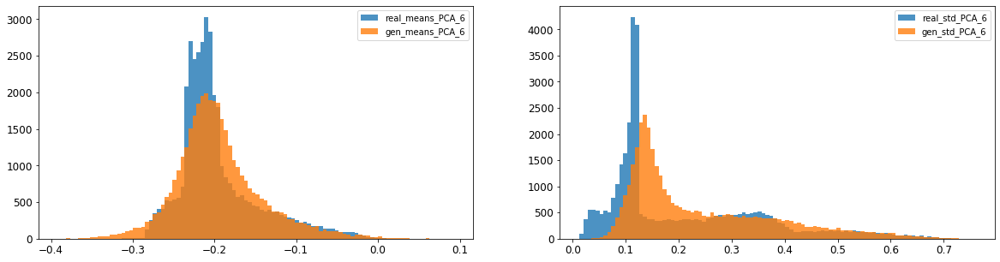

7: mean KL divergence (r,g) = 0.2786674881627206
7: mean JS divergence = 0.07083145604055303
7: mean 1-BC divergence = 0.0522609204987986

7: std KL divergence (r,g) = inf
7: std JS divergence = 0.19183004132858764
7: std 1-BC divergence = 0.14831462543787433


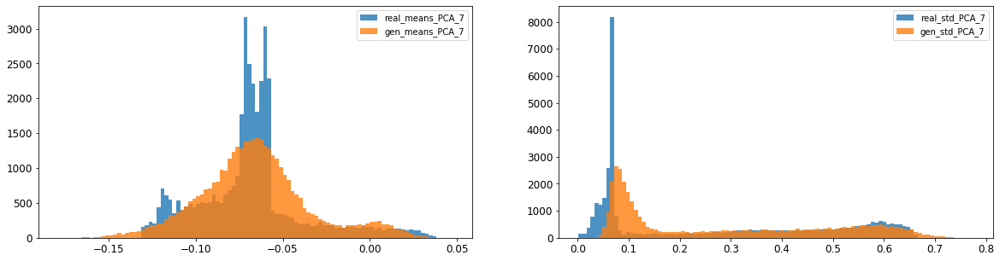

8: mean KL divergence (r,g) = inf
8: mean JS divergence = 0.03602400891347149
8: mean 1-BC divergence = 0.025205481644607564

8: std KL divergence (r,g) = inf
8: std JS divergence = 0.13091737820547955
8: std 1-BC divergence = 0.100352606254414


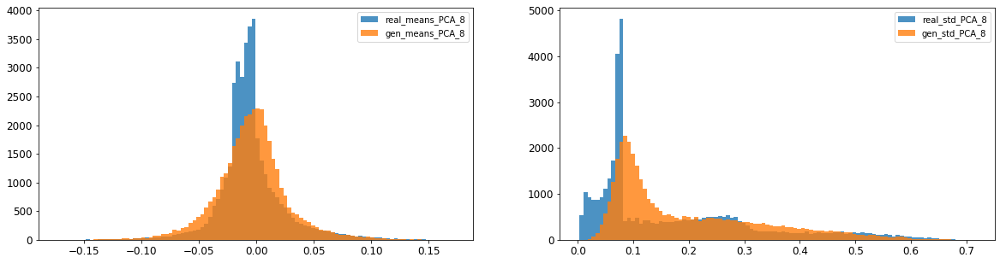

9: mean KL divergence (r,g) = inf
9: mean JS divergence = 0.014207185758072331
9: mean 1-BC divergence = 0.010347849301004963

9: std KL divergence (r,g) = inf
9: std JS divergence = 0.06928726478006973
9: std 1-BC divergence = 0.05059560829300458


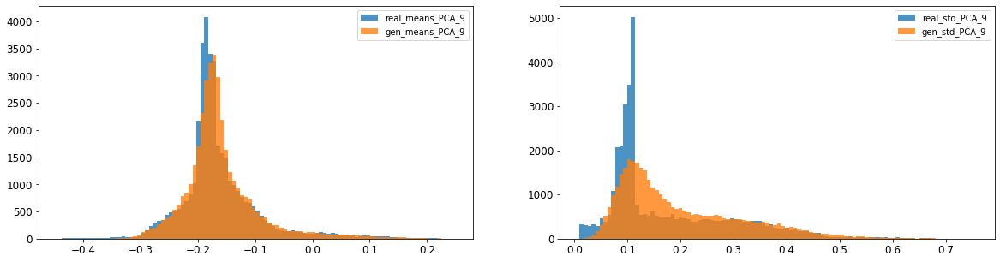

10: mean KL divergence (r,g) = inf
10: mean JS divergence = 0.09641010975173324
10: mean 1-BC divergence = 0.06935096249292882

10: std KL divergence (r,g) = inf
10: std JS divergence = 0.2959739306274292
10: std 1-BC divergence = 0.23823869744372195


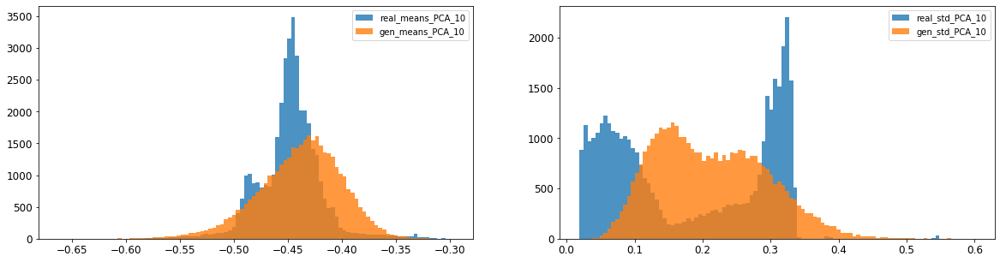

11: mean KL divergence (r,g) = 0.07239207414488967
11: mean JS divergence = 0.019005430611479787
11: mean 1-BC divergence = 0.013765036769381012

11: std KL divergence (r,g) = inf
11: std JS divergence = 0.16472514861333337
11: std 1-BC divergence = 0.12659656777757455


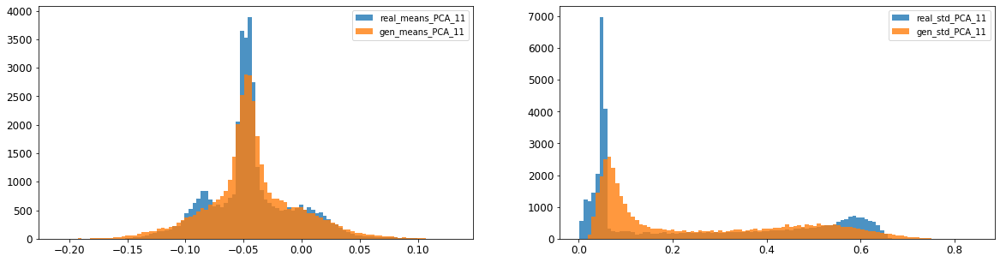

12: mean KL divergence (r,g) = 0.22657904133227796
12: mean JS divergence = 0.05792207705114638
12: mean 1-BC divergence = 0.04083913905096359

12: std KL divergence (r,g) = inf
12: std JS divergence = 0.1332923698304571
12: std 1-BC divergence = 0.10378205745983893


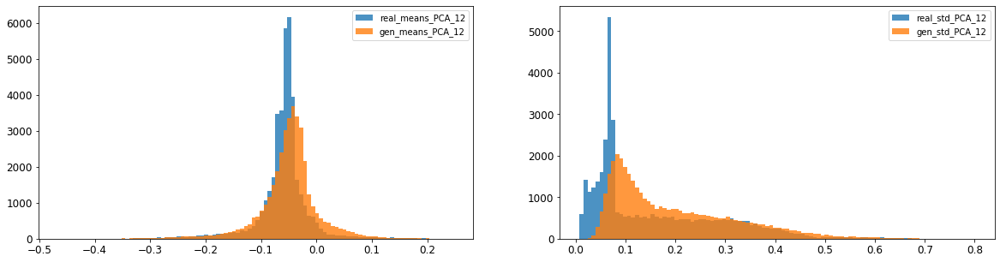

13: mean KL divergence (r,g) = 0.15566500667811253
13: mean JS divergence = 0.03968935163054098
13: mean 1-BC divergence = 0.027848328369636244

13: std KL divergence (r,g) = inf
13: std JS divergence = 0.20944788200598022
13: std 1-BC divergence = 0.16688513135660366


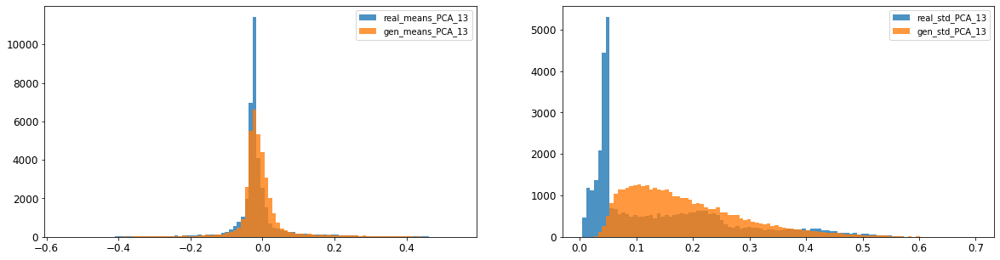

14: mean KL divergence (r,g) = 0.1190345291825342
14: mean JS divergence = 0.028618813940441145
14: mean 1-BC divergence = 0.020004624396655957

14: std KL divergence (r,g) = 0.8812880237994711
14: std JS divergence = 0.1496988138438824
14: std 1-BC divergence = 0.1132471170198609


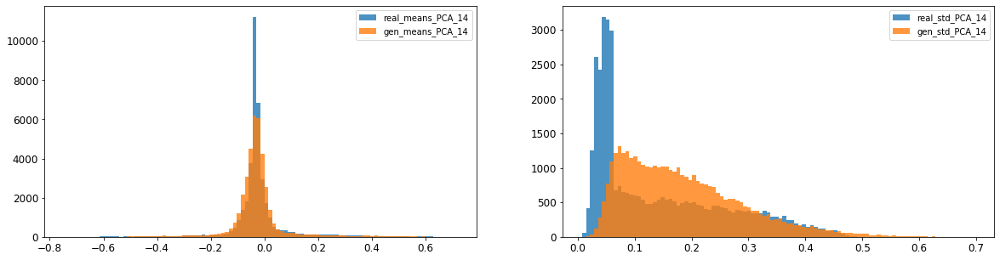

15: mean KL divergence (r,g) = inf
15: mean JS divergence = 0.4700131642208629
15: mean 1-BC divergence = 0.4323999742627719

15: std KL divergence (r,g) = 6.741466986401147
15: std JS divergence = 0.9617248472489168
15: std 1-BC divergence = 0.9033263510954337


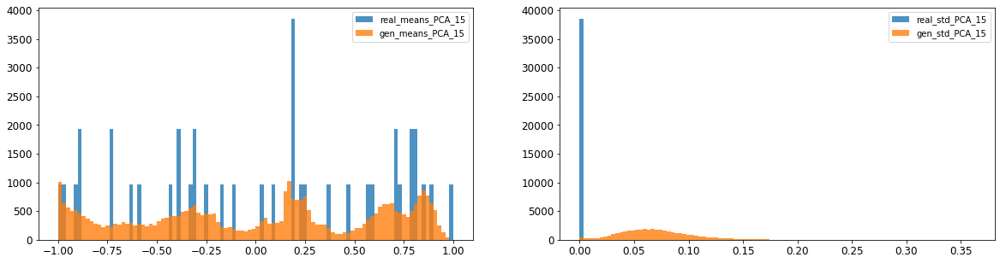

16: mean KL divergence (r,g) = 1.4547831727842353
16: mean JS divergence = 0.4014982782981844
16: mean 1-BC divergence = 0.36795892897804183

16: std KL divergence (r,g) = 5.213729354372941
16: std JS divergence = 0.9100549516901224
16: std 1-BC divergence = 0.835844462480115


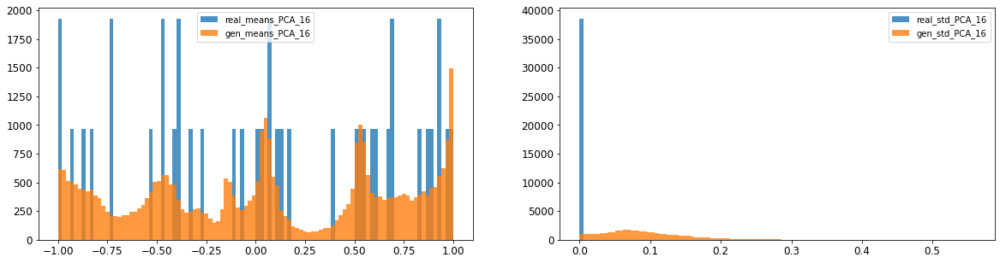



--------------------------------------------------------

Compose KL divergence (r,g) = inf
Compose JS divergence = 0.12130537913577408
Compose 1-BC divergence = 0.09732420840110056

Compose weighted KL divergence (r,g) = inf
Compose weighted JS divergence = 0.16274991047973006
Compose weighted 1-BC divergence = 0.13844681480382104

Multivariate KL divergence = 252.7124595102726


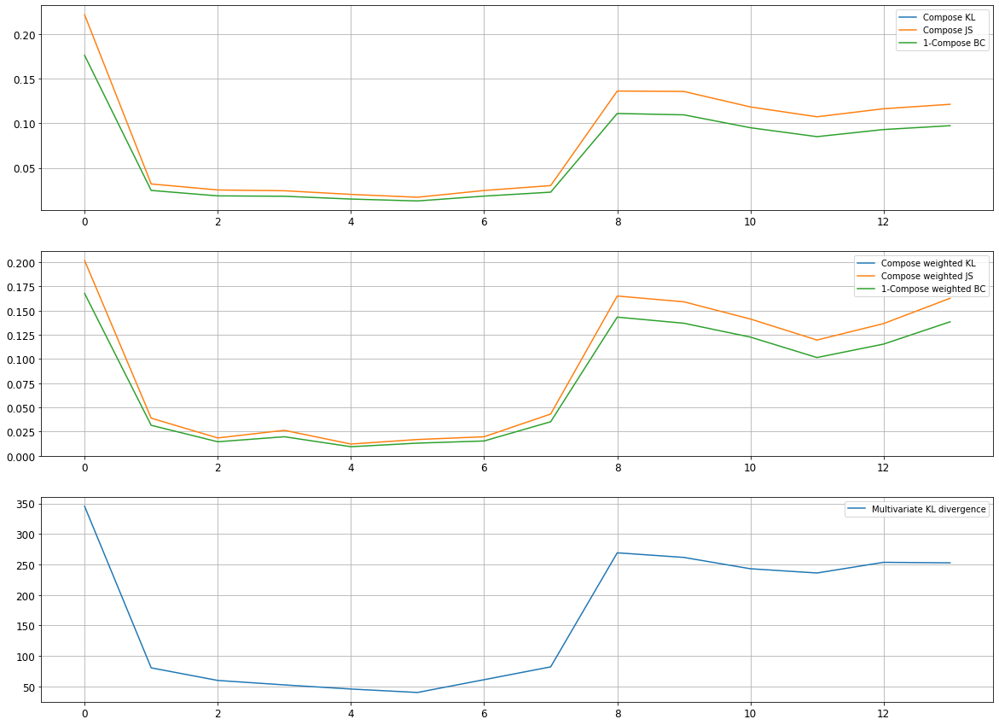

Epoch 2602/10000
discriminator loss: 0.029585 - generator loss: -0.226004 - 127s
Epoch 2603/10000
discriminator loss: 0.029838 - generator loss: -0.278180 - 118s
Epoch 2604/10000
discriminator loss: 0.029757 - generator loss: -0.286775 - 126s
Epoch 2605/10000
discriminator loss: 0.028718 - generator loss: -0.320012 - 148s
Epoch 2606/10000
discriminator loss: 0.028962 - generator loss: -0.311910 - 148s
Epoch 2607/10000
discriminator loss: 0.029198 - generator loss: -0.268858 - 149s
Epoch 2608/10000
discriminator loss: 0.028773 - generator loss: -0.302520 - 149s
Epoch 2609/10000
discriminator loss: 0.030081 - generator loss: -0.323028 - 150s
Epoch 2610/10000
discriminator loss: 0.029345 - generator loss: -0.361947 - 150s
Epoch 2611/10000
discriminator loss: 0.028830 - generator loss: -0.374688 - 150s
Epoch 2612/10000
discriminator loss: 0.028633 - generator loss: -0.383958 - 149s
Epoch 2613/10000
discriminator loss: 0.028212 - generator loss: -0.377214 - 147s
Epoch 2614/10000
discriminat

discriminator loss: 0.020652 - generator loss: -0.418012 - 147s
Epoch 2704/10000
discriminator loss: 0.020724 - generator loss: -0.386973 - 146s
Epoch 2705/10000
discriminator loss: 0.020610 - generator loss: -0.388617 - 146s
Epoch 2706/10000
discriminator loss: 0.020444 - generator loss: -0.420158 - 146s
Epoch 2707/10000
discriminator loss: 0.021349 - generator loss: -0.441502 - 145s
Epoch 2708/10000
discriminator loss: 0.020435 - generator loss: -0.424445 - 146s
Epoch 2709/10000
discriminator loss: 0.020398 - generator loss: -0.415278 - 148s
Epoch 2710/10000
discriminator loss: 0.020631 - generator loss: -0.417046 - 148s
Epoch 2711/10000
discriminator loss: 0.020682 - generator loss: -0.432089 - 148s
Epoch 2712/10000
discriminator loss: 0.020532 - generator loss: -0.486654 - 147s
Epoch 2713/10000
discriminator loss: 0.020057 - generator loss: -0.543793 - 148s
Epoch 2714/10000
discriminator loss: 0.019812 - generator loss: -0.491213 - 147s
Epoch 2715/10000
discriminator loss: 0.020222

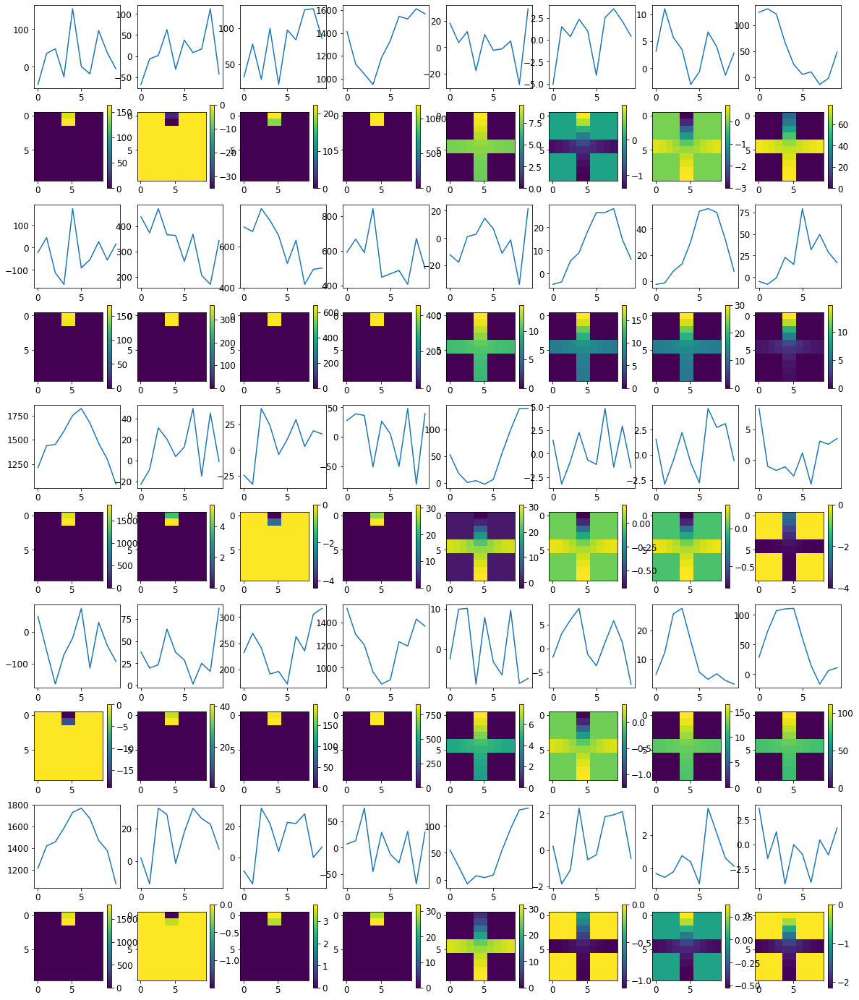


R0 generated:
[[14.195529  17.283564 ]
 [13.611581  16.191046 ]
 [13.097031  17.371008 ]
 [11.210078  16.57108  ]
 [14.0126095 18.17393  ]
 [12.225571  15.574834 ]
 [12.287148  16.716866 ]
 [13.106574  17.22051  ]
 [13.044171  16.203562 ]
 [12.452767  15.235394 ]
 [13.568001  17.479776 ]
 [12.74079   15.928757 ]
 [14.166484  18.519815 ]
 [14.087887  18.07498  ]
 [13.508775  16.66326  ]
 [13.172513  17.974125 ]
 [14.743958  18.258121 ]
 [12.9727745 18.207563 ]
 [14.103868  17.420704 ]
 [12.822565  17.102448 ]
 [ 4.444685   1.3392078]
 [ 3.7844436  2.0541844]
 [ 5.0135236  1.4015052]
 [ 3.7896638  2.3871946]
 [ 4.5182657  1.2548095]
 [ 4.2036476  1.249224 ]
 [ 4.4147563  2.199437 ]
 [ 5.2388773  3.2231002]
 [ 3.8434734  1.3466201]
 [ 3.8406506  1.3394607]
 [16.973206   0.7459933]
 [17.023994   0.5795824]
 [17.440826   0.9313796]
 [17.336536   1.0992804]
 [17.77301    0.8648342]
 [18.000927   0.5788407]
 [16.664507   0.8245354]
 [17.169174   0.7861037]
 [16.930983   1.1384602]
 [18.07649

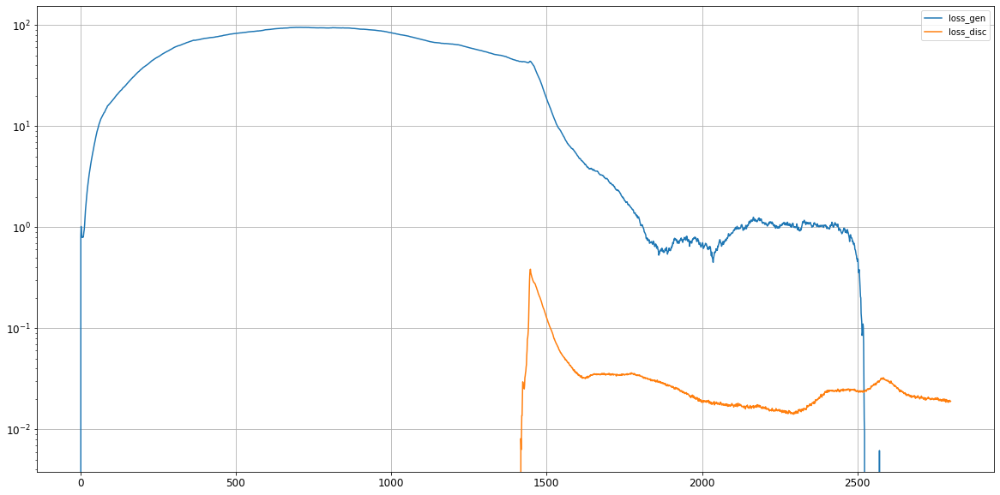

0: mean KL divergence (r,g) = 0.1378361293817399
0: mean JS divergence = 0.03679171876428717
0: mean 1-BC divergence = 0.02891494397169314

0: std KL divergence (r,g) = inf
0: std JS divergence = 0.2472919682089155
0: std 1-BC divergence = 0.21315586002401332


/home/viluiz/anaconda3/envs/py3ml/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


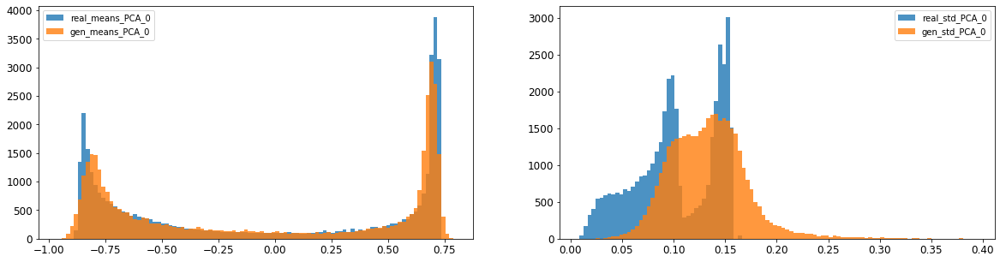

1: mean KL divergence (r,g) = 0.1443657485002946
1: mean JS divergence = 0.03480127217539422
1: mean 1-BC divergence = 0.025008417243902015

1: std KL divergence (r,g) = inf
1: std JS divergence = 0.16277605839449968
1: std 1-BC divergence = 0.1342834995131016


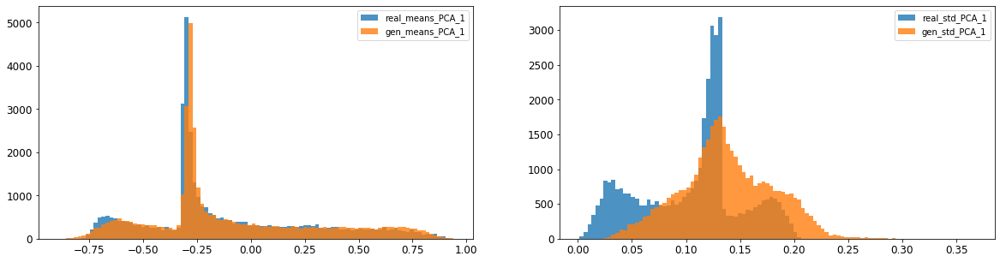

2: mean KL divergence (r,g) = 0.08473367905614766
2: mean JS divergence = 0.02192963644167229
2: mean 1-BC divergence = 0.01711157250457096

2: std KL divergence (r,g) = 0.33331233646318953
2: std JS divergence = 0.10382390223545498
2: std 1-BC divergence = 0.09594082117834601


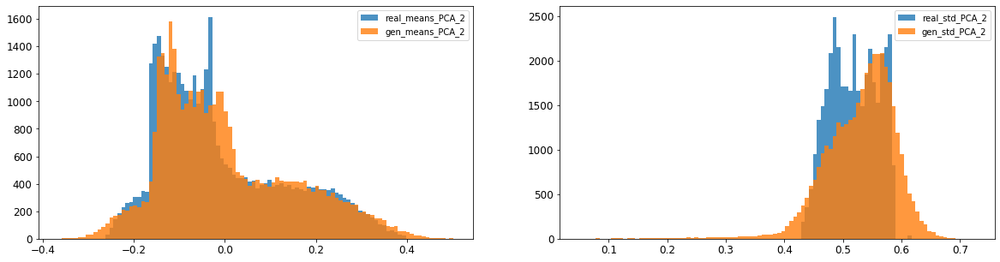

3: mean KL divergence (r,g) = 0.14190546168107648
3: mean JS divergence = 0.040902214013689146
3: mean 1-BC divergence = 0.03019821808677836

3: std KL divergence (r,g) = inf
3: std JS divergence = 0.27496035092205007
3: std 1-BC divergence = 0.24301854367301579


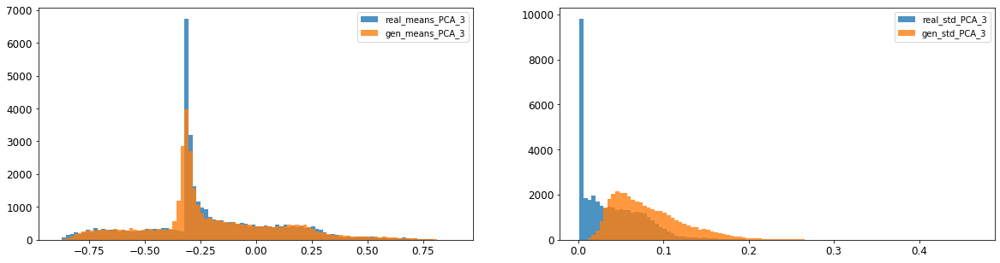

4: mean KL divergence (r,g) = 0.13336923059119812
4: mean JS divergence = 0.036962003675217577
4: mean 1-BC divergence = 0.02873776869876765

4: std KL divergence (r,g) = inf
4: std JS divergence = 0.03946975120197792
4: std 1-BC divergence = 0.03447859308338119


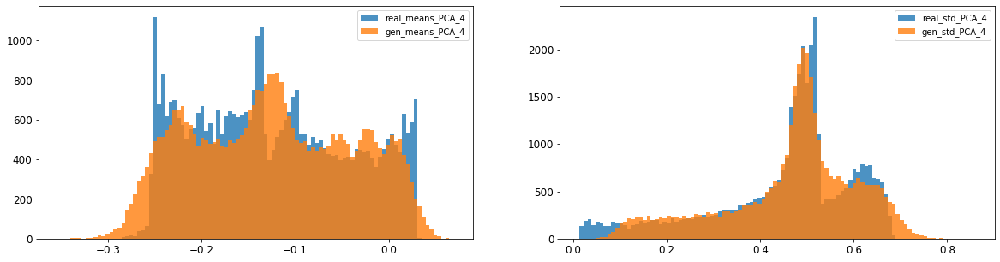

5: mean KL divergence (r,g) = 0.2388452102055796
5: mean JS divergence = 0.06591314922705221
5: mean 1-BC divergence = 0.053725559168690595

5: std KL divergence (r,g) = inf
5: std JS divergence = 0.24154802090182467
5: std 1-BC divergence = 0.1887974215682584


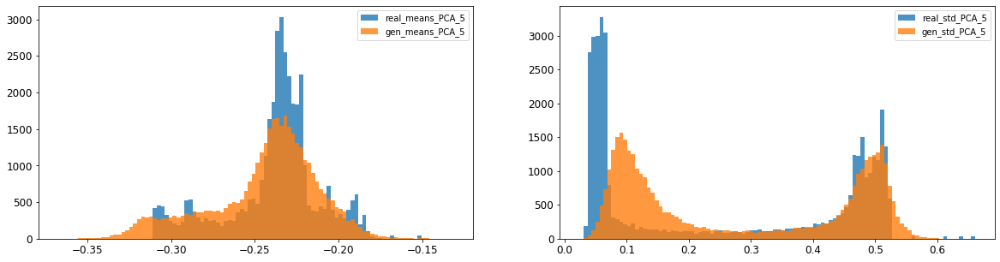

6: mean KL divergence (r,g) = 0.18060221021045372
6: mean JS divergence = 0.04448197136258007
6: mean 1-BC divergence = 0.03216376040028701

6: std KL divergence (r,g) = inf
6: std JS divergence = 0.07217866486672053
6: std 1-BC divergence = 0.05512494860659101


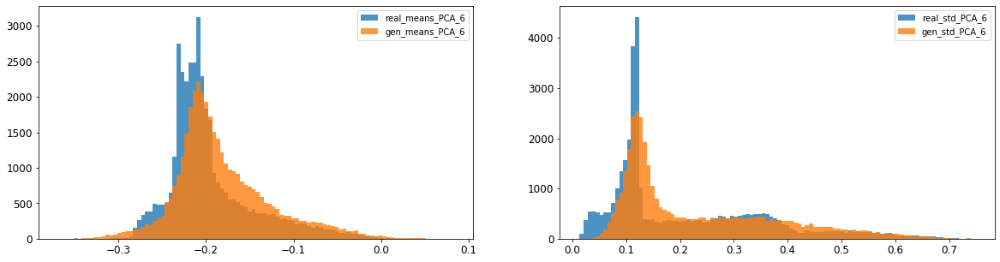

7: mean KL divergence (r,g) = 0.20329296382877485
7: mean JS divergence = 0.052309618061550475
7: mean 1-BC divergence = 0.04010460218859324

7: std KL divergence (r,g) = inf
7: std JS divergence = 0.1582520723443258
7: std 1-BC divergence = 0.12345857921873149


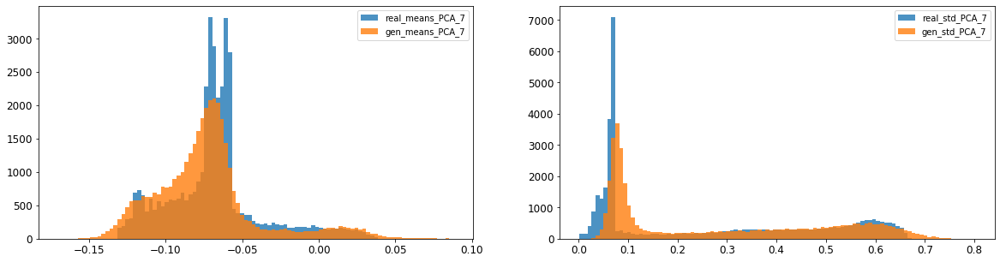

8: mean KL divergence (r,g) = inf
8: mean JS divergence = 0.0946139449725099
8: mean 1-BC divergence = 0.066942623447384

8: std KL divergence (r,g) = inf
8: std JS divergence = 0.08584289394016797
8: std 1-BC divergence = 0.06792407425858094


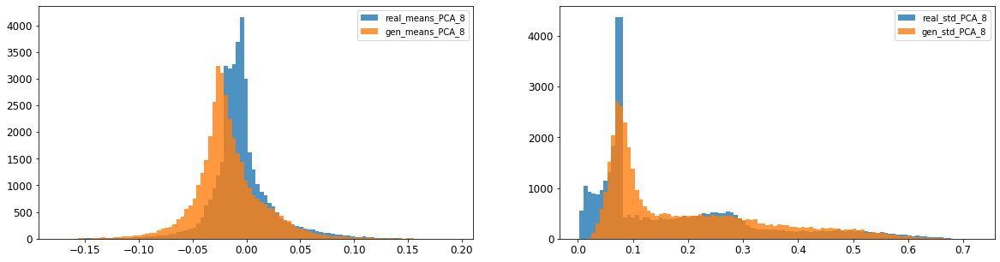

9: mean KL divergence (r,g) = inf
9: mean JS divergence = 0.0325825360268205
9: mean 1-BC divergence = 0.02296502497384223

9: std KL divergence (r,g) = inf
9: std JS divergence = 0.061807353275199886
9: std 1-BC divergence = 0.045563440949330736


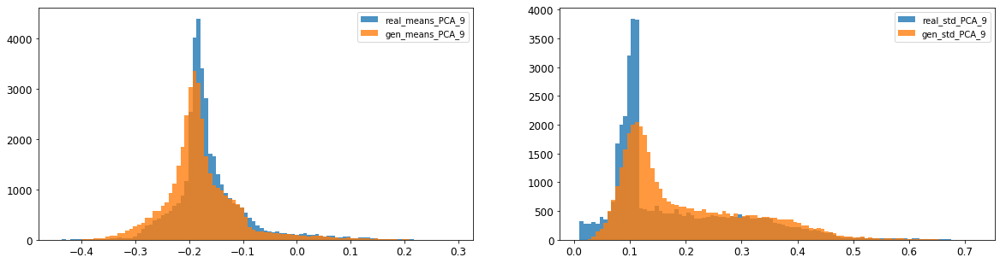

10: mean KL divergence (r,g) = 0.23353723010972274
10: mean JS divergence = 0.060496819067351354
10: mean 1-BC divergence = 0.04300578296664259

10: std KL divergence (r,g) = inf
10: std JS divergence = 0.22107945225953535
10: std 1-BC divergence = 0.17648439842553043


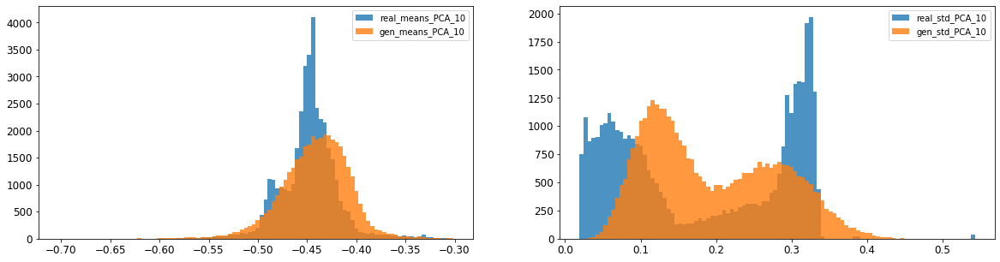

11: mean KL divergence (r,g) = 0.23484287276604635
11: mean JS divergence = 0.06158526784377713
11: mean 1-BC divergence = 0.04473083826164681

11: std KL divergence (r,g) = inf
11: std JS divergence = 0.16211733292875527
11: std 1-BC divergence = 0.12612307114626975


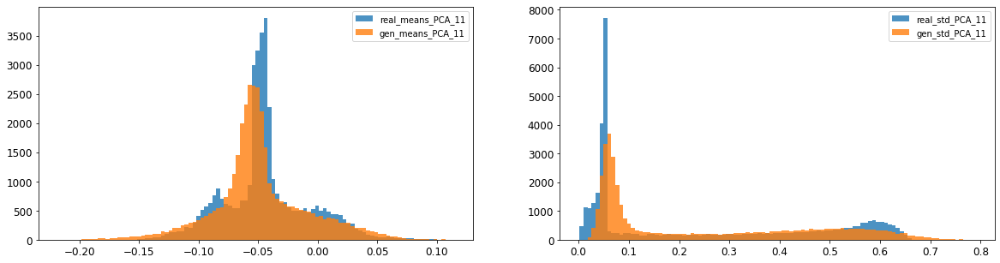

12: mean KL divergence (r,g) = 0.07443136859528957
12: mean JS divergence = 0.019052863659100354
12: mean 1-BC divergence = 0.013458965483510221

12: std KL divergence (r,g) = inf
12: std JS divergence = 0.1185204822305067
12: std 1-BC divergence = 0.09175026860301616


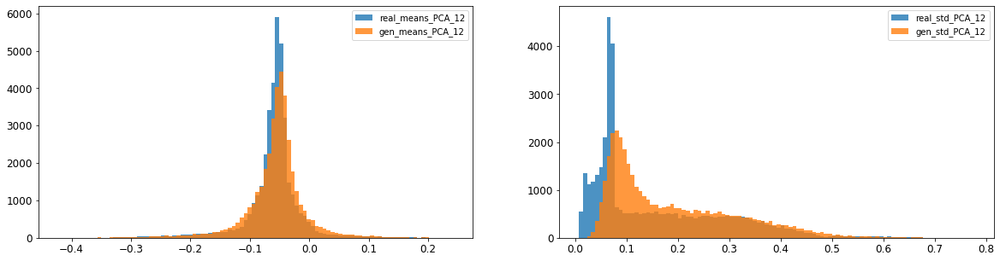

13: mean KL divergence (r,g) = 0.14010247916618893
13: mean JS divergence = 0.033884857038540134
13: mean 1-BC divergence = 0.023823420939831585

13: std KL divergence (r,g) = inf
13: std JS divergence = 0.16569587080374282
13: std 1-BC divergence = 0.12614696529105174


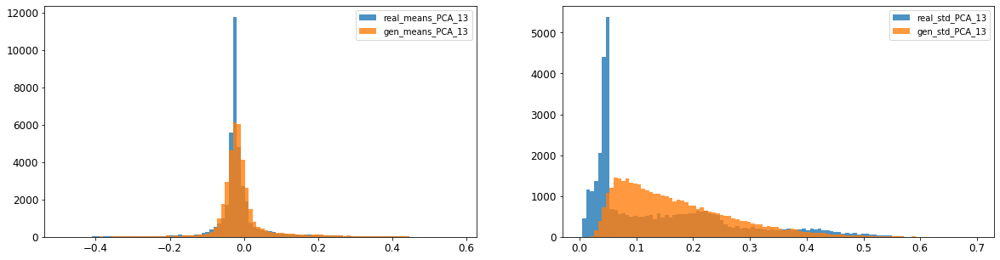

14: mean KL divergence (r,g) = inf
14: mean JS divergence = 0.10817091085114619
14: mean 1-BC divergence = 0.07702931617164843

14: std KL divergence (r,g) = inf
14: std JS divergence = 0.1845549637844022
14: std 1-BC divergence = 0.14490695526305974


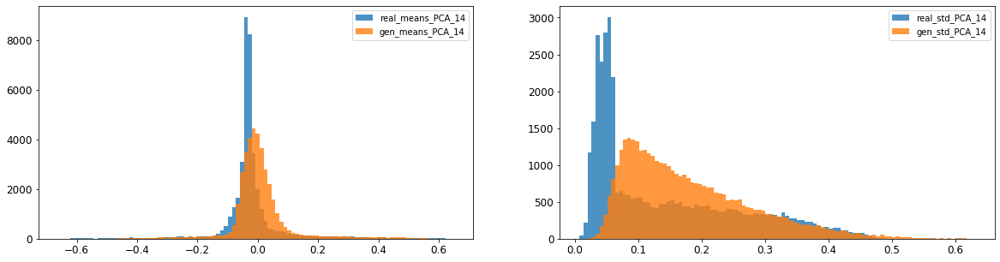

15: mean KL divergence (r,g) = 1.7706107694427229
15: mean JS divergence = 0.47236000283736035
15: mean 1-BC divergence = 0.43255285312792846

15: std KL divergence (r,g) = 7.3691339380765415
15: std JS divergence = 0.9733363089919027
15: std 1-BC divergence = 0.9222259309592139


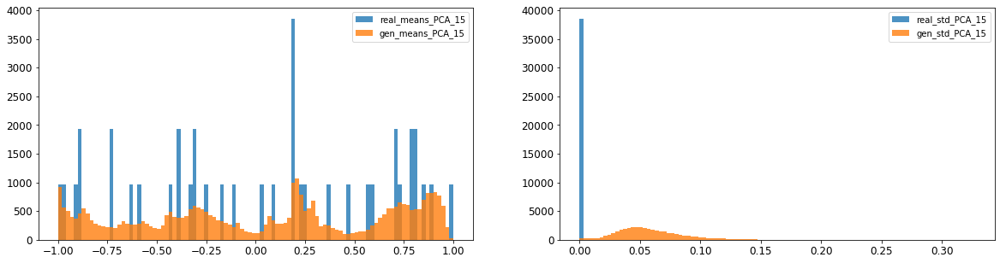

16: mean KL divergence (r,g) = 1.3571750545865058
16: mean JS divergence = 0.3804521410888124
16: mean 1-BC divergence = 0.3491902702443813

16: std KL divergence (r,g) = 4.9479178638685735
16: std JS divergence = 0.8961014845304998
16: std 1-BC divergence = 0.8200034614386127


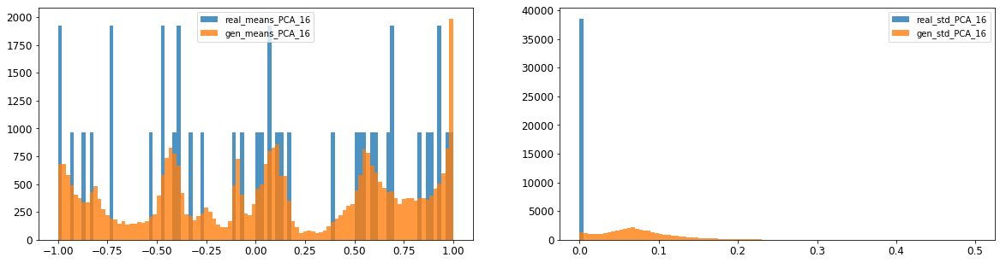



--------------------------------------------------------

Compose KL divergence (r,g) = inf
Compose JS divergence = 0.10147993071595893
Compose 1-BC divergence = 0.08050260851033564

Compose weighted KL divergence (r,g) = inf
Compose weighted JS divergence = 0.1205826371999009
Compose weighted 1-BC divergence = 0.10163211988551546

Multivariate KL divergence = 232.62585156579456


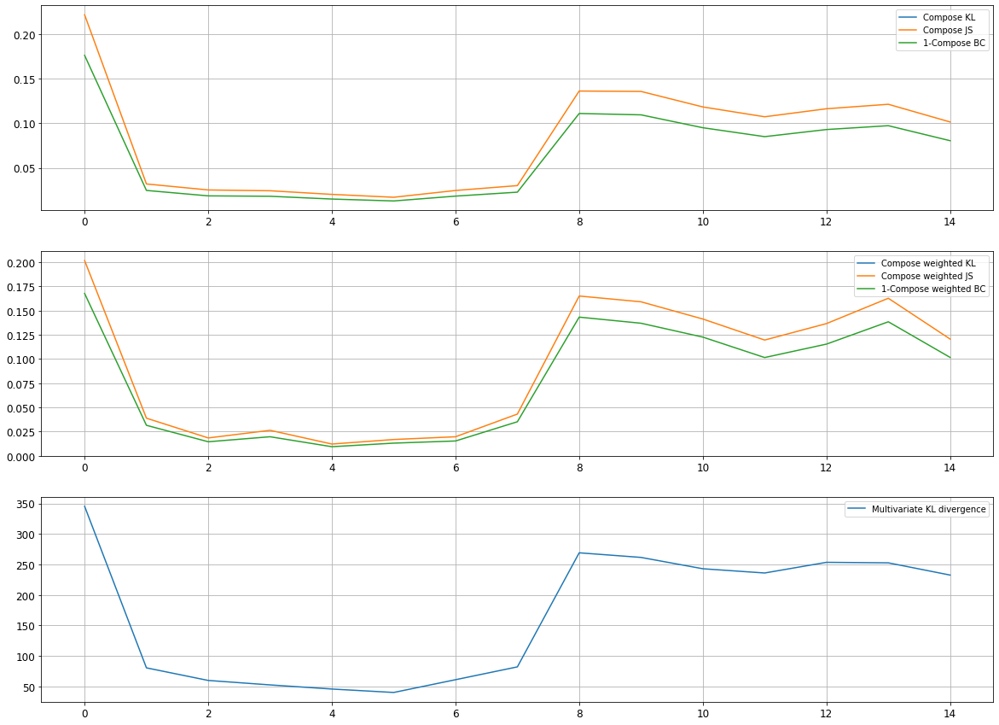

Epoch 2802/10000
discriminator loss: 0.018681 - generator loss: -0.361511 - 144s
Epoch 2803/10000
discriminator loss: 0.018676 - generator loss: -0.339529 - 146s
Epoch 2804/10000
discriminator loss: 0.019102 - generator loss: -0.331483 - 146s
Epoch 2805/10000
discriminator loss: 0.018640 - generator loss: -0.319028 - 148s
Epoch 2806/10000
discriminator loss: 0.018962 - generator loss: -0.307743 - 147s
Epoch 2807/10000
discriminator loss: 0.019042 - generator loss: -0.316744 - 146s
Epoch 2808/10000
discriminator loss: 0.018147 - generator loss: -0.348948 - 139s
Epoch 2809/10000
discriminator loss: 0.018241 - generator loss: -0.290224 - 119s
Epoch 2810/10000
discriminator loss: 0.018338 - generator loss: -0.259273 - 119s
Epoch 2811/10000
discriminator loss: 0.018510 - generator loss: -0.251619 - 144s
Epoch 2812/10000
discriminator loss: 0.018802 - generator loss: -0.256404 - 146s
Epoch 2813/10000
discriminator loss: 0.019106 - generator loss: -0.243765 - 146s
Epoch 2814/10000
discriminat

discriminator loss: 0.017376 - generator loss: 0.207601 - 148s
Epoch 2905/10000
discriminator loss: 0.017814 - generator loss: 0.202610 - 146s
Epoch 2906/10000
discriminator loss: 0.018139 - generator loss: 0.235653 - 147s
Epoch 2907/10000
discriminator loss: 0.017772 - generator loss: 0.200548 - 146s
Epoch 2908/10000
discriminator loss: 0.017340 - generator loss: 0.155127 - 145s
Epoch 2909/10000
discriminator loss: 0.018264 - generator loss: 0.216379 - 147s
Epoch 2910/10000
discriminator loss: 0.017433 - generator loss: 0.197375 - 147s
Epoch 2911/10000
discriminator loss: 0.017437 - generator loss: 0.143495 - 147s
Epoch 2912/10000
discriminator loss: 0.017166 - generator loss: 0.137805 - 147s
Epoch 2913/10000
discriminator loss: 0.016813 - generator loss: 0.138850 - 147s
Epoch 2914/10000
discriminator loss: 0.017846 - generator loss: 0.157443 - 146s
Epoch 2915/10000
discriminator loss: 0.016884 - generator loss: 0.145736 - 147s
Epoch 2916/10000
discriminator loss: 0.017506 - generator

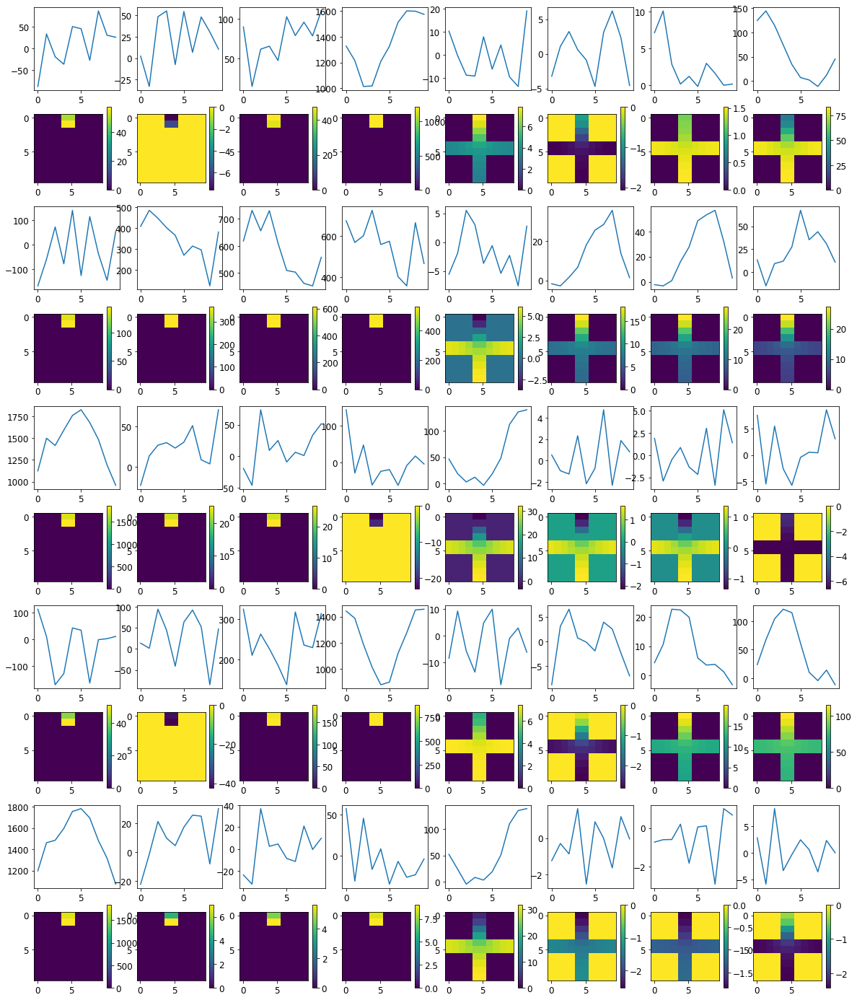


R0 generated:
[[12.602412   17.446026  ]
 [13.188644   15.001765  ]
 [12.422734   17.27954   ]
 [11.941064   16.6157    ]
 [13.206665   17.992949  ]
 [11.4415655  15.847854  ]
 [11.850288   16.536716  ]
 [13.306367   16.221739  ]
 [12.427336   16.291384  ]
 [11.881472   16.668242  ]
 [12.988864   16.041788  ]
 [13.220313   15.263324  ]
 [12.146771   17.895168  ]
 [11.891967   17.410578  ]
 [14.074028   16.595613  ]
 [12.337505   16.74101   ]
 [14.325744   18.131107  ]
 [10.935166   18.007359  ]
 [14.501114   16.583796  ]
 [11.788783   16.832747  ]
 [ 3.432401    0.66798353]
 [ 3.3679748   1.5130398 ]
 [ 4.9358153   0.6142058 ]
 [ 3.3931532   1.2605373 ]
 [ 3.3634422   0.63983023]
 [ 4.3458185   0.6156239 ]
 [ 2.9512289   1.1774417 ]
 [ 4.766926    1.5032128 ]
 [ 3.5539186   1.1754504 ]
 [ 2.9717033   0.8549903 ]
 [16.275845    0.63982964]
 [17.75716     0.49086455]
 [17.097538    0.84904206]
 [16.218443    0.6909689 ]
 [17.054796    0.66015947]
 [17.15335     0.6252544 ]
 [16.188334  

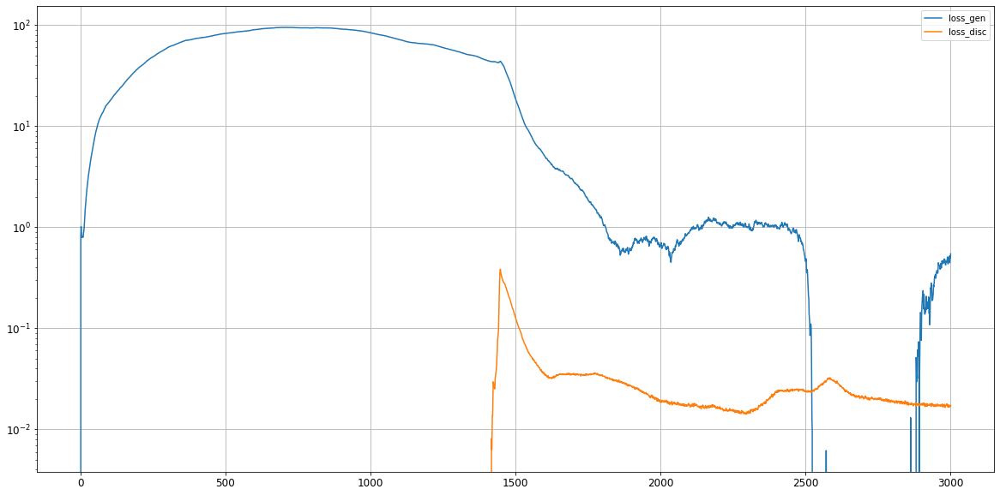

0: mean KL divergence (r,g) = 0.13724235966924628
0: mean JS divergence = 0.03802188574596461
0: mean 1-BC divergence = 0.032432019324810435

0: std KL divergence (r,g) = inf
0: std JS divergence = 0.22623843624294093
0: std 1-BC divergence = 0.192820197324308


/home/viluiz/anaconda3/envs/py3ml/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


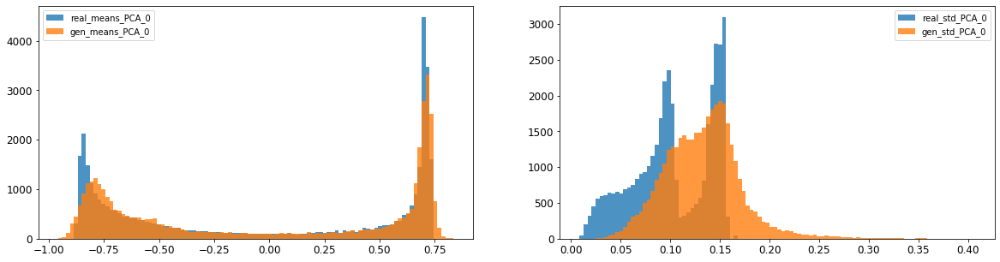

1: mean KL divergence (r,g) = 0.13444059247153775
1: mean JS divergence = 0.03241735857078186
1: mean 1-BC divergence = 0.02345369136391562

1: std KL divergence (r,g) = inf
1: std JS divergence = 0.20244426080059502
1: std 1-BC divergence = 0.1730401862462113


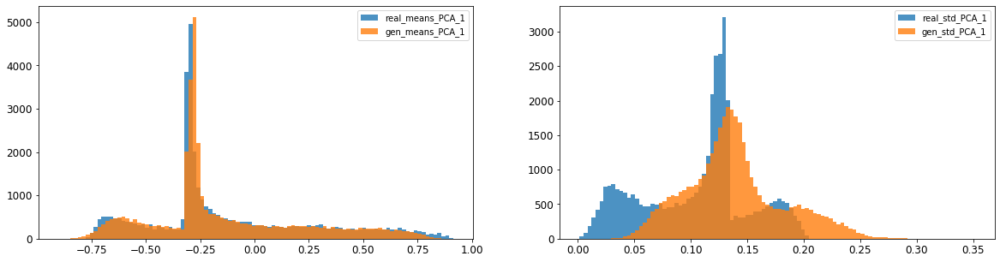

2: mean KL divergence (r,g) = inf
2: mean JS divergence = 0.03262409963161653
2: mean 1-BC divergence = 0.023513935077633663

2: std KL divergence (r,g) = 0.2853156877113548
2: std JS divergence = 0.08407643425471696
2: std 1-BC divergence = 0.07461788467593033


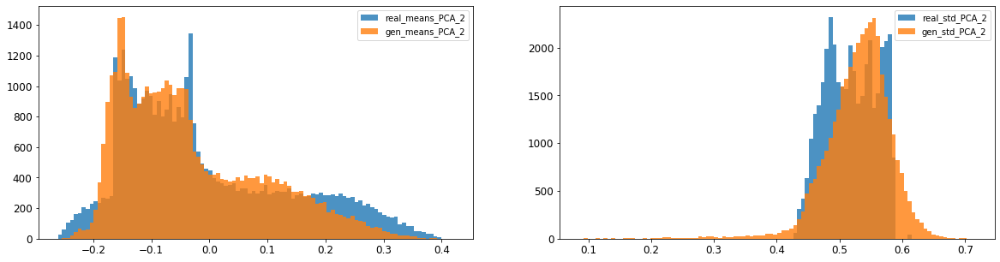

3: mean KL divergence (r,g) = 0.6266290955775461
3: mean JS divergence = 0.11554646162327845
3: mean 1-BC divergence = 0.08576706943658297

3: std KL divergence (r,g) = inf
3: std JS divergence = 0.26381029466785966
3: std 1-BC divergence = 0.23439338231538964


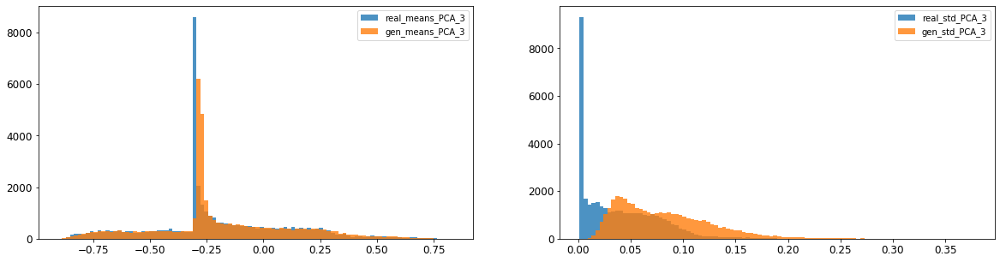

4: mean KL divergence (r,g) = 0.2852706351906397
4: mean JS divergence = 0.0895293638319999
4: mean 1-BC divergence = 0.0770908846444015

4: std KL divergence (r,g) = inf
4: std JS divergence = 0.04048579453027057
4: std 1-BC divergence = 0.03522946978360997


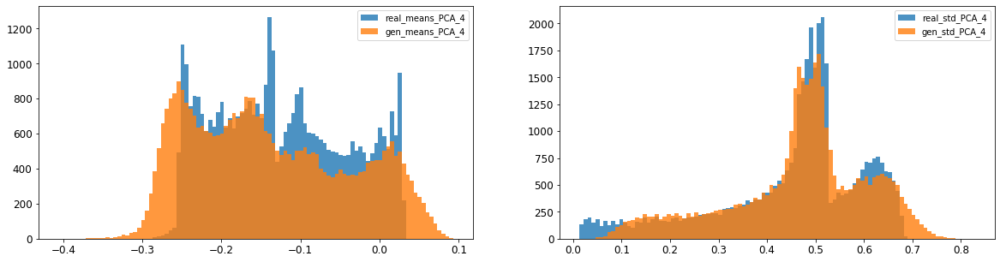

5: mean KL divergence (r,g) = 0.2742720479425359
5: mean JS divergence = 0.07294047900297176
5: mean 1-BC divergence = 0.05628047193003605

5: std KL divergence (r,g) = 1.1506190483799166
5: std JS divergence = 0.223034620843773
5: std 1-BC divergence = 0.17503776235522173


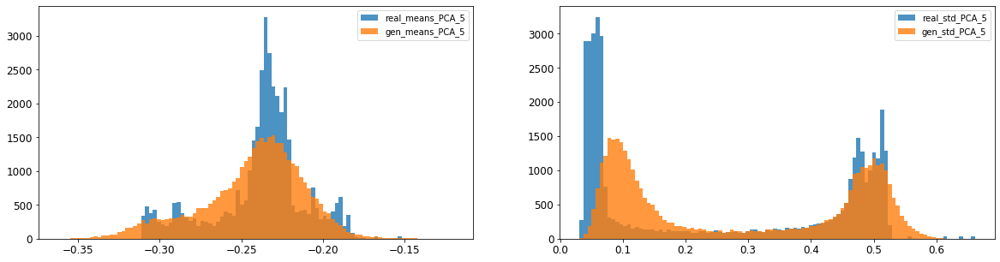

6: mean KL divergence (r,g) = inf
6: mean JS divergence = 0.0394175123917841
6: mean 1-BC divergence = 0.029732720568423687

6: std KL divergence (r,g) = inf
6: std JS divergence = 0.1014710744871109
6: std 1-BC divergence = 0.07589851785793711


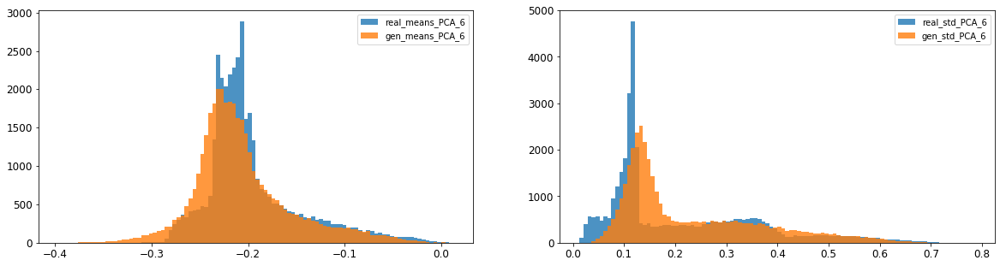

7: mean KL divergence (r,g) = 0.15201735917693124
7: mean JS divergence = 0.03940605997538131
7: mean 1-BC divergence = 0.028827007224857648

7: std KL divergence (r,g) = inf
7: std JS divergence = 0.1323928697025168
7: std 1-BC divergence = 0.10400726533446125


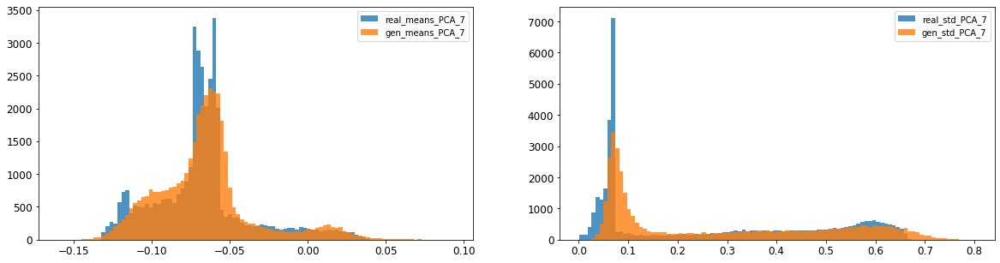

8: mean KL divergence (r,g) = 0.10167440444185713
8: mean JS divergence = 0.025201595452088388
8: mean 1-BC divergence = 0.01763772812505804

8: std KL divergence (r,g) = inf
8: std JS divergence = 0.12351221361604944
8: std 1-BC divergence = 0.09740126527663162


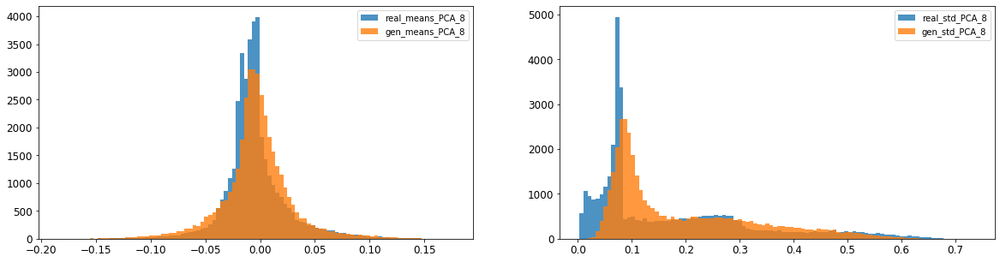

9: mean KL divergence (r,g) = inf
9: mean JS divergence = 0.020201903633589965
9: mean 1-BC divergence = 0.014304058178691959

9: std KL divergence (r,g) = inf
9: std JS divergence = 0.07681609245796321
9: std 1-BC divergence = 0.05729312248153884


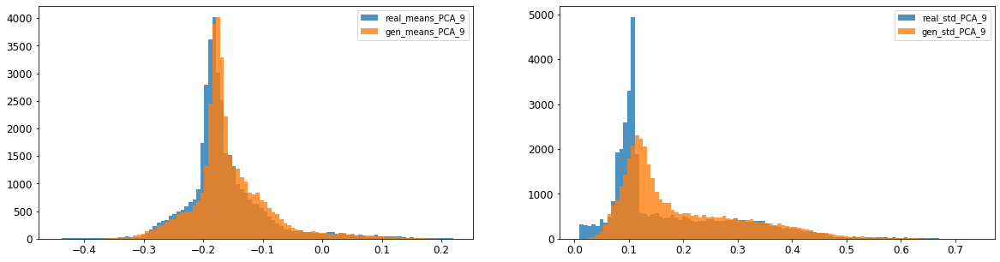

10: mean KL divergence (r,g) = 0.3236629202727779
10: mean JS divergence = 0.08508998405679533
10: mean 1-BC divergence = 0.0609142911241517

10: std KL divergence (r,g) = inf
10: std JS divergence = 0.24075482638009285
10: std 1-BC divergence = 0.19232459056527784


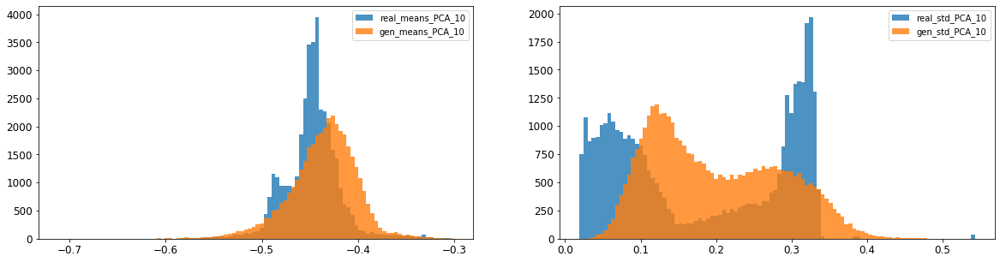

11: mean KL divergence (r,g) = 0.05204829523456588
11: mean JS divergence = 0.013745047997938905
11: mean 1-BC divergence = 0.010139545986053489

11: std KL divergence (r,g) = inf
11: std JS divergence = 0.13984723291669068
11: std 1-BC divergence = 0.10819126759593523


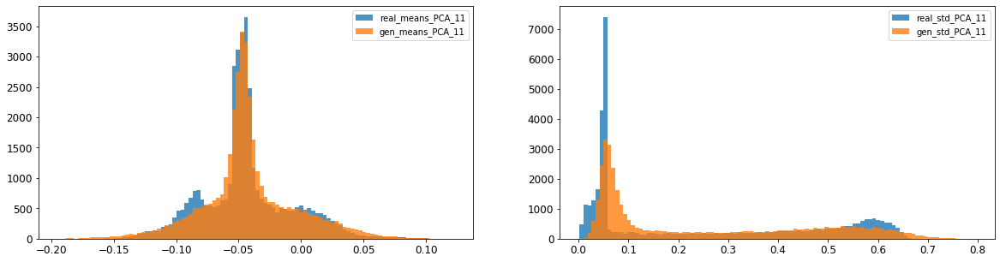

12: mean KL divergence (r,g) = 0.2846437001244648
12: mean JS divergence = 0.07225998495057412
12: mean 1-BC divergence = 0.05096141707588486

12: std KL divergence (r,g) = 0.8109623033357993
12: std JS divergence = 0.11812873750985065
12: std 1-BC divergence = 0.09097314728141026


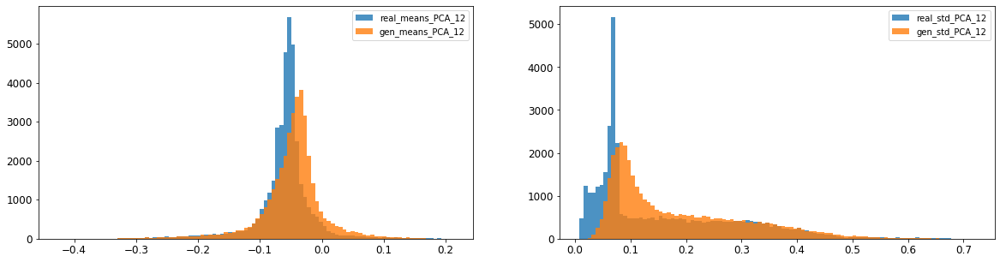

13: mean KL divergence (r,g) = 0.12394927222668657
13: mean JS divergence = 0.03013243360654058
13: mean 1-BC divergence = 0.021073486591448365

13: std KL divergence (r,g) = inf
13: std JS divergence = 0.1671856471073193
13: std 1-BC divergence = 0.12664027327946392


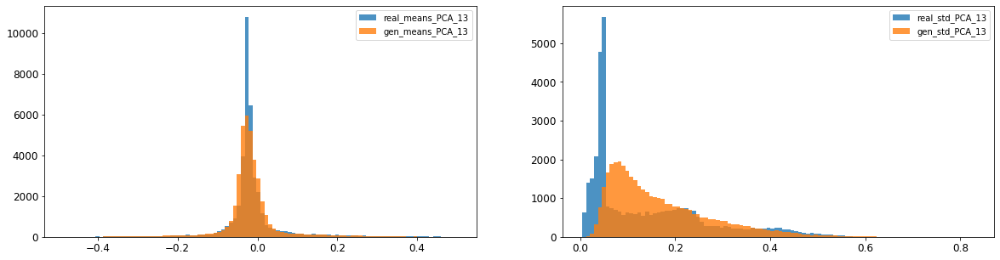

14: mean KL divergence (r,g) = inf
14: mean JS divergence = 0.02213120954666251
14: mean 1-BC divergence = 0.015581259756701882

14: std KL divergence (r,g) = inf
14: std JS divergence = 0.1886329616050606
14: std 1-BC divergence = 0.1459913523134293


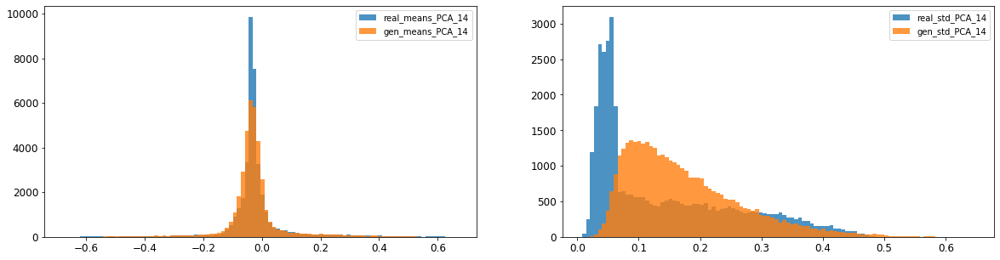

15: mean KL divergence (r,g) = 1.7040183574981007
15: mean JS divergence = 0.4521460389776579
15: mean 1-BC divergence = 0.4153369655581709

15: std KL divergence (r,g) = 8.35067703336898
15: std JS divergence = 0.9849963864525998
15: std 1-BC divergence = 0.9446525184172818


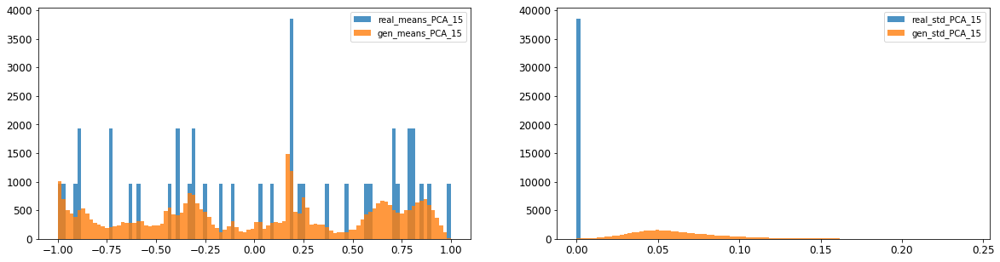

16: mean KL divergence (r,g) = 1.5325448128994346
16: mean JS divergence = 0.42586472077449633
16: mean 1-BC divergence = 0.3909817144765785

16: std KL divergence (r,g) = 6.194401093438519
16: std JS divergence = 0.9477898450716294
16: std 1-BC divergence = 0.8831443453269128


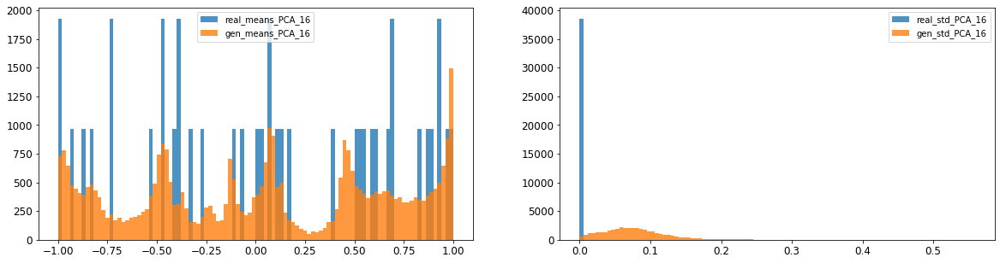



--------------------------------------------------------

Compose KL divergence (r,g) = inf
Compose JS divergence = 0.1019165625713593
Compose 1-BC divergence = 0.0810523090365135

Compose weighted KL divergence (r,g) = inf
Compose weighted JS divergence = 0.1208718955063244
Compose weighted 1-BC divergence = 0.10202926467200646

Multivariate KL divergence = 232.29033502618006


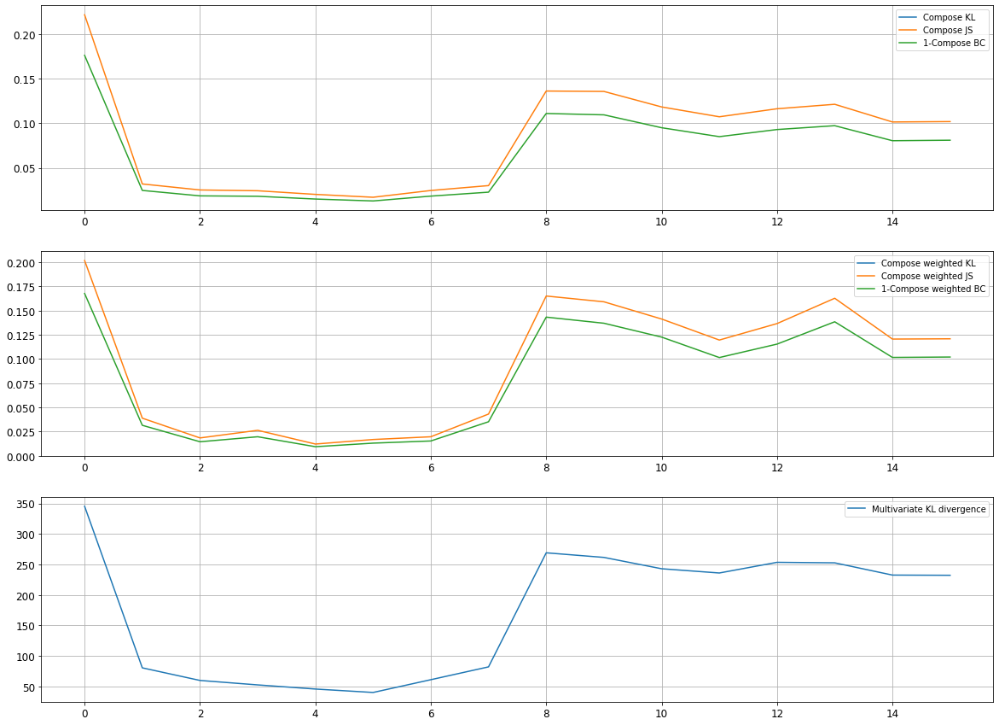

Epoch 3002/10000
discriminator loss: 0.017011 - generator loss: 0.562392 - 148s
Epoch 3003/10000
discriminator loss: 0.016957 - generator loss: 0.572855 - 150s
Epoch 3004/10000
discriminator loss: 0.017513 - generator loss: 0.541088 - 151s
Epoch 3005/10000
discriminator loss: 0.017079 - generator loss: 0.543049 - 148s
Epoch 3006/10000
discriminator loss: 0.017381 - generator loss: 0.541125 - 150s
Epoch 3007/10000
discriminator loss: 0.017769 - generator loss: 0.573192 - 148s
Epoch 3008/10000
discriminator loss: 0.017157 - generator loss: 0.619388 - 148s
Epoch 3009/10000
discriminator loss: 0.017129 - generator loss: 0.562698 - 148s
Epoch 3010/10000
discriminator loss: 0.017195 - generator loss: 0.540202 - 147s
Epoch 3011/10000
discriminator loss: 0.017006 - generator loss: 0.565495 - 149s
Epoch 3012/10000
discriminator loss: 0.016744 - generator loss: 0.597943 - 136s
Epoch 3013/10000
discriminator loss: 0.017114 - generator loss: 0.605776 - 120s
Epoch 3014/10000
discriminator loss: 0.0

discriminator loss: 0.016423 - generator loss: 0.413960 - 146s
Epoch 3106/10000
discriminator loss: 0.017817 - generator loss: 0.382456 - 145s
Epoch 3107/10000
discriminator loss: 0.017044 - generator loss: 0.340727 - 147s
Epoch 3108/10000
discriminator loss: 0.017109 - generator loss: 0.350214 - 148s
Epoch 3109/10000
discriminator loss: 0.017288 - generator loss: 0.408614 - 147s
Epoch 3110/10000
discriminator loss: 0.017588 - generator loss: 0.362857 - 146s
Epoch 3111/10000
discriminator loss: 0.017417 - generator loss: 0.375588 - 148s
Epoch 3112/10000
discriminator loss: 0.017011 - generator loss: 0.381841 - 147s
Epoch 3113/10000
discriminator loss: 0.017668 - generator loss: 0.399695 - 146s
Epoch 3114/10000
discriminator loss: 0.017520 - generator loss: 0.348811 - 147s
Epoch 3115/10000
discriminator loss: 0.017711 - generator loss: 0.313297 - 148s
Epoch 3116/10000
discriminator loss: 0.017223 - generator loss: 0.352210 - 148s
Epoch 3117/10000
discriminator loss: 0.017910 - generator

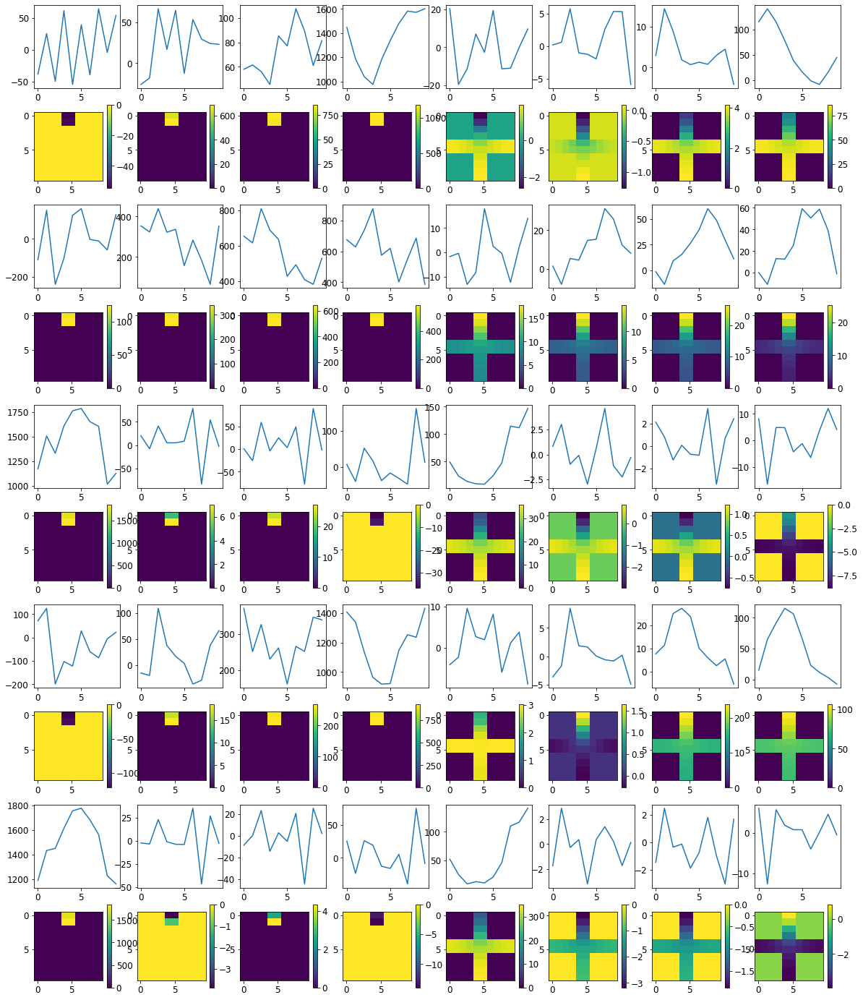


R0 generated:
[[12.219022   15.313433  ]
 [13.252893   15.956325  ]
 [10.871506   15.401799  ]
 [11.48224    17.251602  ]
 [12.986878   16.786737  ]
 [12.614551   16.728891  ]
 [11.708013   17.101137  ]
 [12.887149   15.57108   ]
 [10.578393   14.136531  ]
 [13.106081   17.798183  ]
 [12.9940405  16.76425   ]
 [13.444659   16.29613   ]
 [11.819124   17.066753  ]
 [13.487856   17.311666  ]
 [14.122957   17.396645  ]
 [12.625085   16.914679  ]
 [13.313484   18.471123  ]
 [12.270179   17.936914  ]
 [13.7050295  17.88149   ]
 [14.133191   17.044622  ]
 [ 3.4044237   1.1104311 ]
 [ 4.3602104   2.4039648 ]
 [ 4.896987    1.0210502 ]
 [ 3.8711321   1.9511526 ]
 [ 3.5855916   1.0409434 ]
 [ 4.180418    1.026637  ]
 [ 4.1502824   1.9775828 ]
 [ 4.5791965   2.1165342 ]
 [ 4.474889    1.4062412 ]
 [ 3.1862922   1.0612143 ]
 [16.861298    1.5930303 ]
 [17.373903    0.46678826]
 [17.80556     1.5073411 ]
 [15.550816    0.98710257]
 [17.462645    0.8797692 ]
 [16.86024     0.93653363]
 [17.067629  

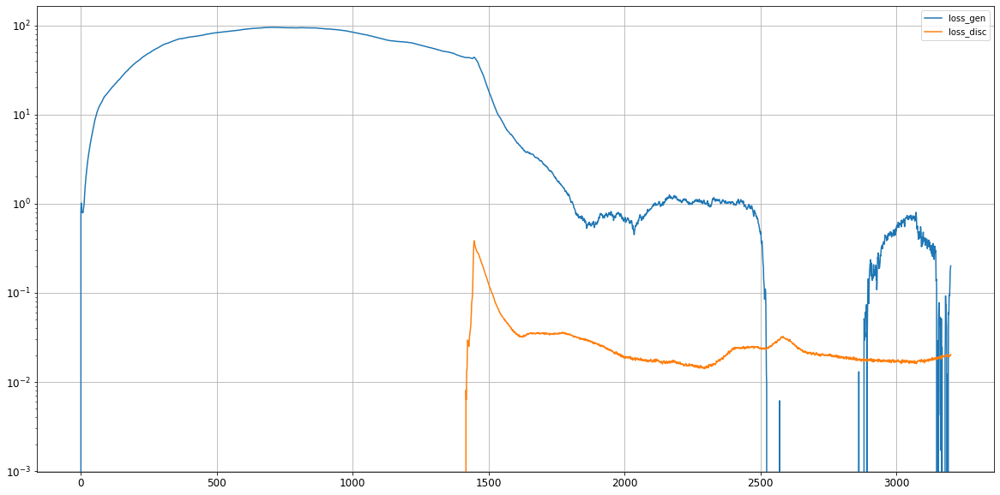

0: mean KL divergence (r,g) = 0.12676253689543618
0: mean JS divergence = 0.03957915755253524
0: mean 1-BC divergence = 0.03554287294714242

0: std KL divergence (r,g) = inf
0: std JS divergence = 0.228463745297056
0: std 1-BC divergence = 0.19680953788526312


/home/viluiz/anaconda3/envs/py3ml/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


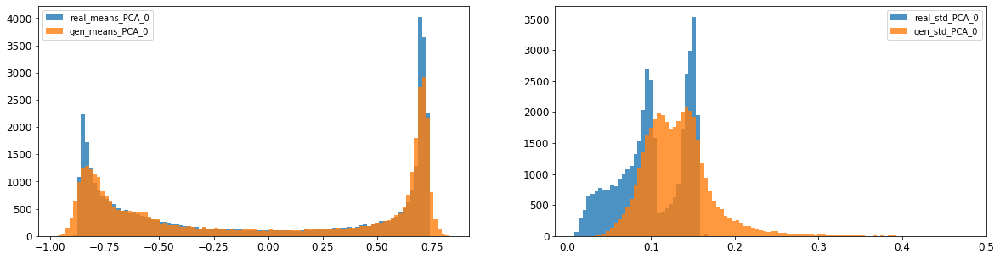

1: mean KL divergence (r,g) = 0.049916630547723925
1: mean JS divergence = 0.011061671729054433
1: mean 1-BC divergence = 0.008192550763495787

1: std KL divergence (r,g) = inf
1: std JS divergence = 0.16948650747568697
1: std 1-BC divergence = 0.14593669405741627


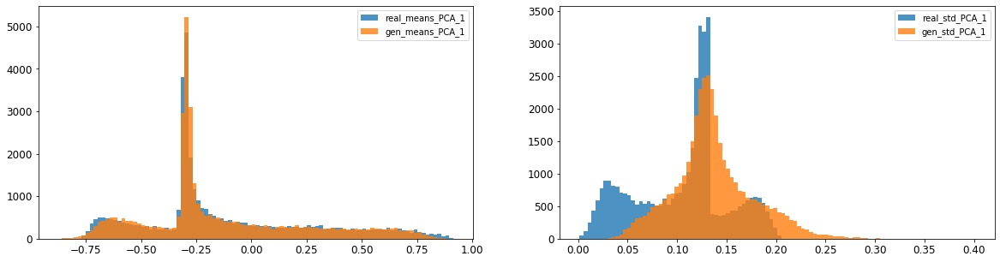

2: mean KL divergence (r,g) = inf
2: mean JS divergence = 0.012727206930907536
2: mean 1-BC divergence = 0.009356192568048982

2: std KL divergence (r,g) = 0.3038230627771711
2: std JS divergence = 0.08979676323979506
2: std 1-BC divergence = 0.08030802338168586


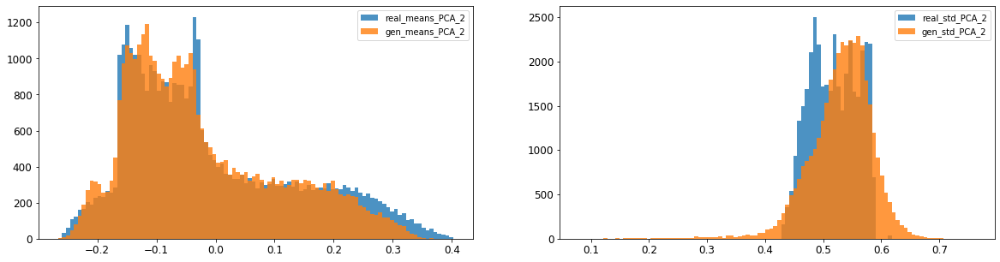

3: mean KL divergence (r,g) = inf
3: mean JS divergence = 0.015370974230590362
3: mean 1-BC divergence = 0.010823096662917142

3: std KL divergence (r,g) = inf
3: std JS divergence = 0.26525810596450144
3: std 1-BC divergence = 0.23496922725151947


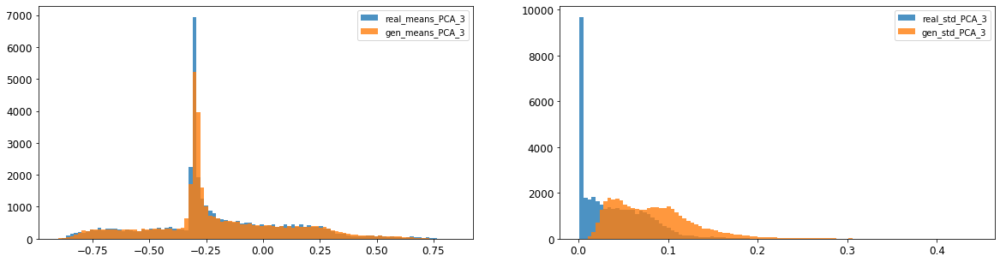

4: mean KL divergence (r,g) = 0.2158307254236806
4: mean JS divergence = 0.06746537881626893
4: mean 1-BC divergence = 0.059268326057904996

4: std KL divergence (r,g) = inf
4: std JS divergence = 0.037943470634541954
4: std 1-BC divergence = 0.030997386640412072


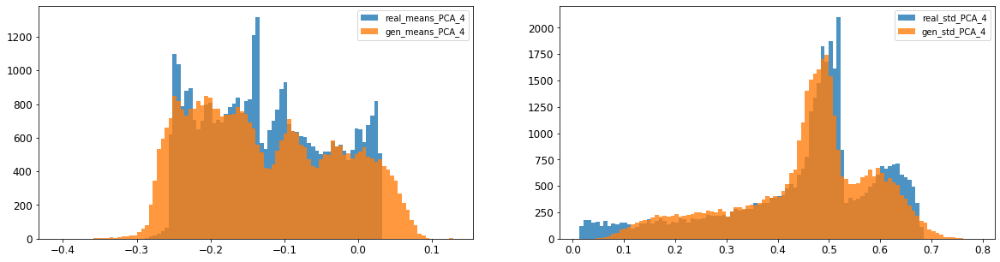

5: mean KL divergence (r,g) = 0.3731699250592494
5: mean JS divergence = 0.0937847292935653
5: mean 1-BC divergence = 0.06767381310557885

5: std KL divergence (r,g) = inf
5: std JS divergence = 0.2184674244017208
5: std 1-BC divergence = 0.1678839696596406


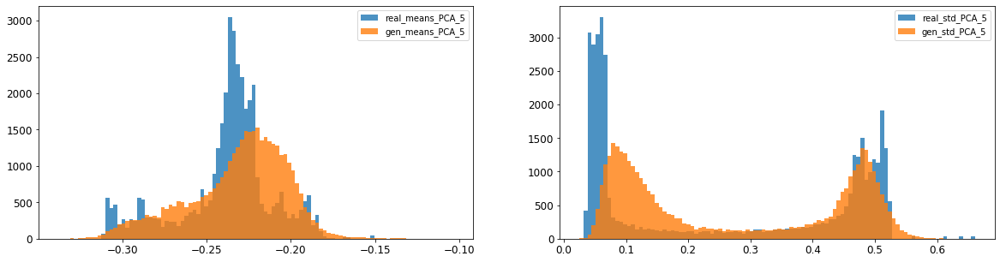

6: mean KL divergence (r,g) = 0.1121497625255536
6: mean JS divergence = 0.02729753118346335
6: mean 1-BC divergence = 0.019674128937895663

6: std KL divergence (r,g) = inf
6: std JS divergence = 0.09712254624830695
6: std 1-BC divergence = 0.07335995679432883


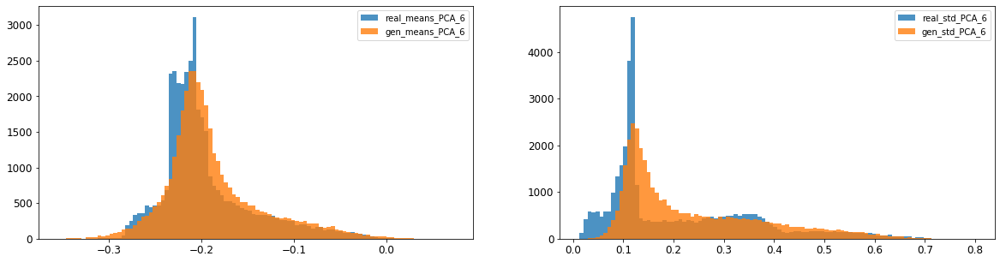

7: mean KL divergence (r,g) = 0.1538675408460319
7: mean JS divergence = 0.03911089142913734
7: mean 1-BC divergence = 0.029811066983431056

7: std KL divergence (r,g) = inf
7: std JS divergence = 0.1411732024623854
7: std 1-BC divergence = 0.1070437150938095


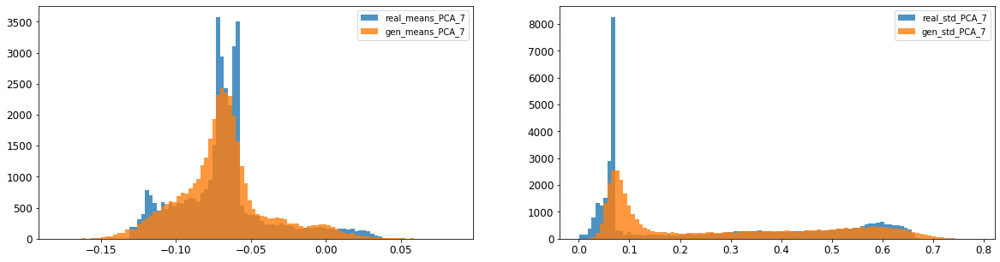

8: mean KL divergence (r,g) = 0.07966044506481224
8: mean JS divergence = 0.020007928998256826
8: mean 1-BC divergence = 0.014091743719120586

8: std KL divergence (r,g) = inf
8: std JS divergence = 0.14514112386776645
8: std 1-BC divergence = 0.11374484118093742


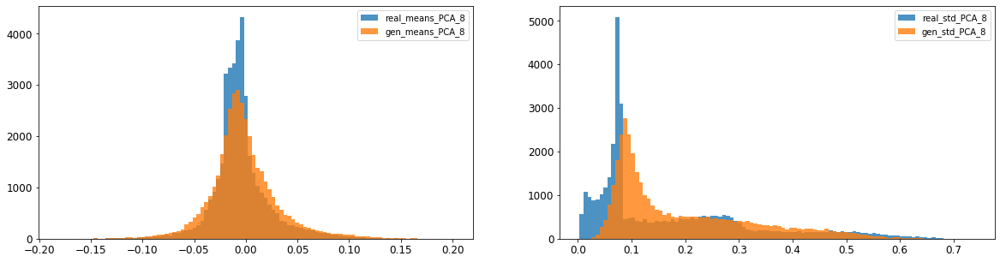

9: mean KL divergence (r,g) = inf
9: mean JS divergence = 0.026954227697965003
9: mean 1-BC divergence = 0.01907650549528317

9: std KL divergence (r,g) = inf
9: std JS divergence = 0.050439134244916355
9: std 1-BC divergence = 0.03802370882768491


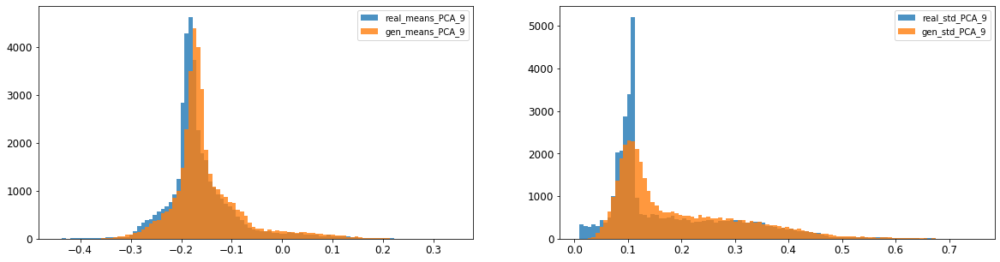

10: mean KL divergence (r,g) = 0.2929442358807776
10: mean JS divergence = 0.07657685602981602
10: mean 1-BC divergence = 0.05486933098077007

10: std KL divergence (r,g) = inf
10: std JS divergence = 0.24569783113984017
10: std 1-BC divergence = 0.19360673471565104


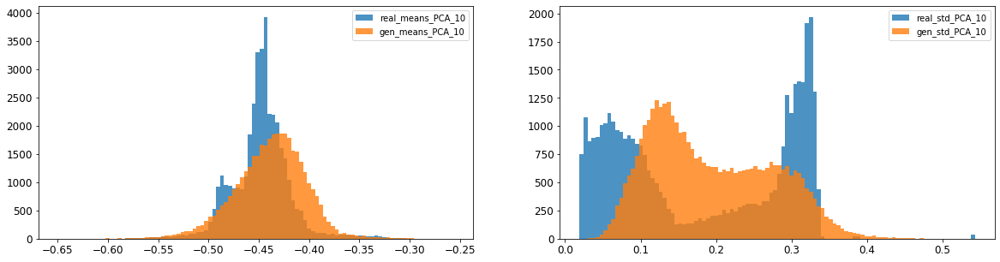

11: mean KL divergence (r,g) = 0.14585700134288723
11: mean JS divergence = 0.03771763262235334
11: mean 1-BC divergence = 0.0266175720472408

11: std KL divergence (r,g) = inf
11: std JS divergence = 0.1261501080601612
11: std 1-BC divergence = 0.0976634973781364


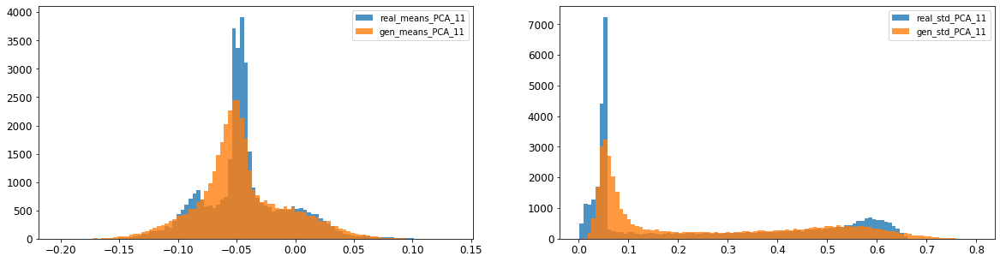

12: mean KL divergence (r,g) = inf
12: mean JS divergence = 0.03755853691133985
12: mean 1-BC divergence = 0.02662480896141195

12: std KL divergence (r,g) = inf
12: std JS divergence = 0.12161296108993014
12: std 1-BC divergence = 0.09567974319372285


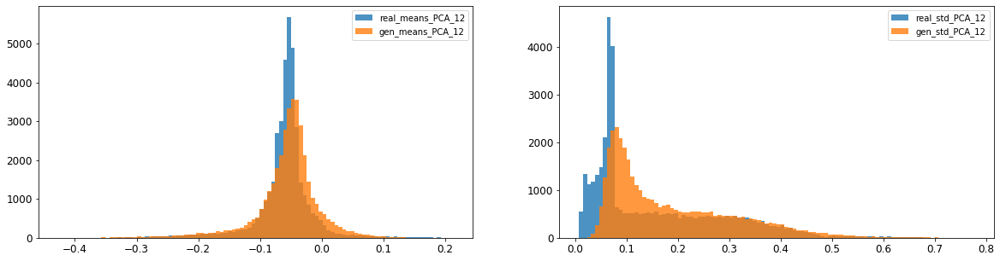

13: mean KL divergence (r,g) = 0.12440089819151884
13: mean JS divergence = 0.029552966713492092
13: mean 1-BC divergence = 0.02066610277095149

13: std KL divergence (r,g) = inf
13: std JS divergence = 0.17126050084145214
13: std 1-BC divergence = 0.1297254750647815


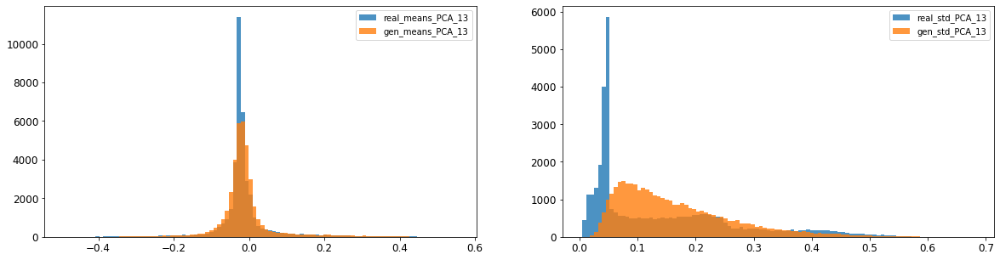

14: mean KL divergence (r,g) = inf
14: mean JS divergence = 0.05052901658510579
14: mean 1-BC divergence = 0.035947520105468866

14: std KL divergence (r,g) = inf
14: std JS divergence = 0.17842792623487824
14: std 1-BC divergence = 0.13515987677700392


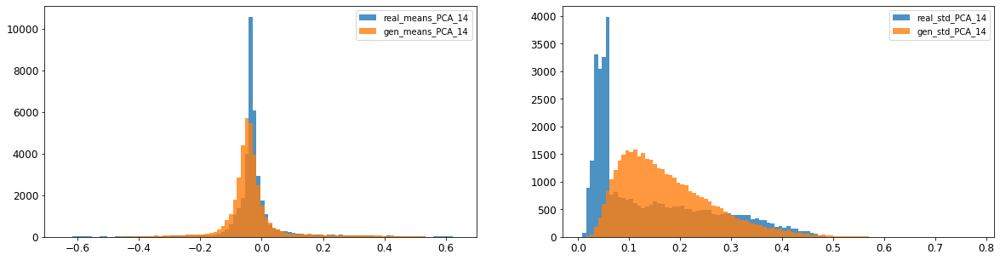

15: mean KL divergence (r,g) = 1.6324462431307583
15: mean JS divergence = 0.4447727672328986
15: mean 1-BC divergence = 0.4088954843179927

15: std KL divergence (r,g) = 8.663464474399873
15: std JS divergence = 0.9875356435294664
15: std 1-BC divergence = 0.9503386337478821


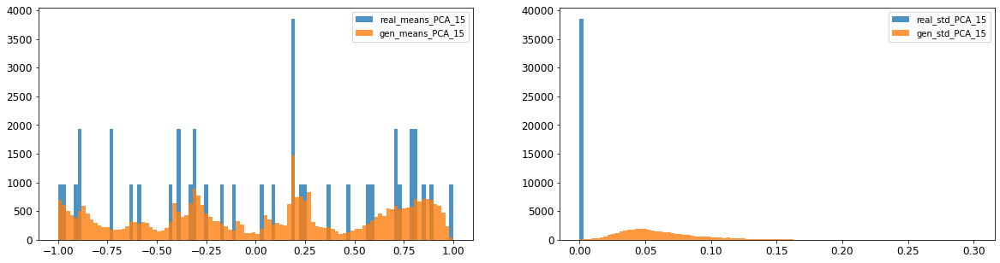

16: mean KL divergence (r,g) = 1.4433437390502992
16: mean JS divergence = 0.3952755937897968
16: mean 1-BC divergence = 0.3628677315301744

16: std KL divergence (r,g) = 5.915907468965952
16: std JS divergence = 0.9389619781774516
16: std 1-BC divergence = 0.8713033624885649


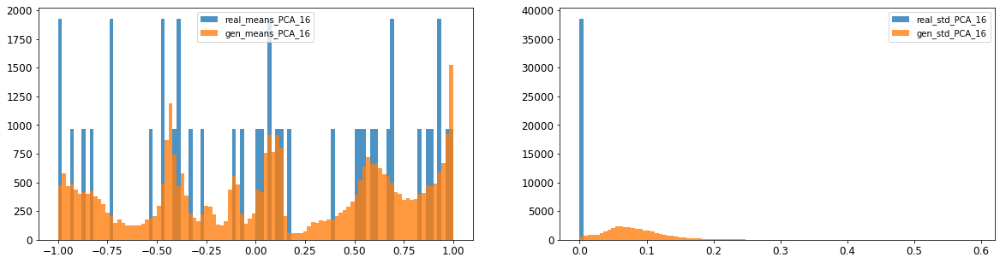



--------------------------------------------------------

Compose KL divergence (r,g) = inf
Compose JS divergence = 0.09572453526422636
Compose 1-BC divergence = 0.0759716006669553

Compose weighted KL divergence (r,g) = inf
Compose weighted JS divergence = 0.11291694838800499
Compose weighted 1-BC divergence = 0.09700583559778053

Multivariate KL divergence = 235.1689123338496


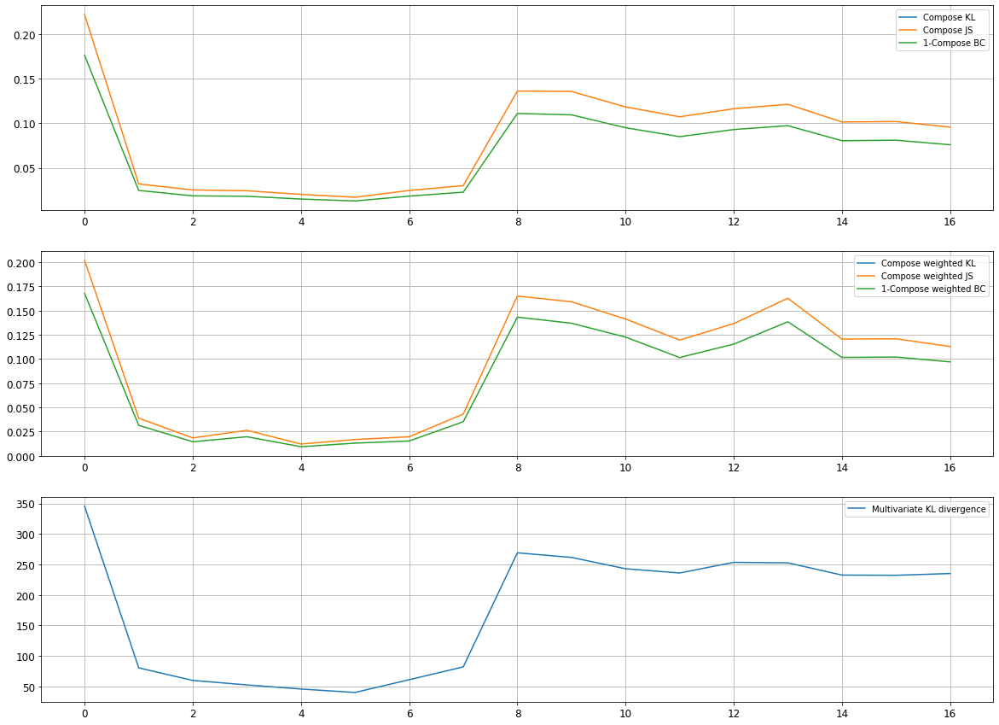

Epoch 3202/10000
discriminator loss: 0.019704 - generator loss: 0.241549 - 145s
Epoch 3203/10000
discriminator loss: 0.020390 - generator loss: 0.223236 - 149s
Epoch 3204/10000
discriminator loss: 0.019542 - generator loss: 0.224074 - 149s
Epoch 3205/10000
discriminator loss: 0.019366 - generator loss: 0.242950 - 148s
Epoch 3206/10000
discriminator loss: 0.020083 - generator loss: 0.250476 - 147s
Epoch 3207/10000
discriminator loss: 0.020073 - generator loss: 0.218892 - 146s
Epoch 3208/10000
discriminator loss: 0.020295 - generator loss: 0.267911 - 147s
Epoch 3209/10000
discriminator loss: 0.019798 - generator loss: 0.271727 - 146s
Epoch 3210/10000
discriminator loss: 0.020589 - generator loss: 0.256011 - 146s
Epoch 3211/10000
discriminator loss: 0.020238 - generator loss: 0.316592 - 147s
Epoch 3212/10000
discriminator loss: 0.019548 - generator loss: 0.327402 - 146s
Epoch 3213/10000
discriminator loss: 0.020644 - generator loss: 0.282491 - 146s
Epoch 3214/10000
discriminator loss: 0.0

discriminator loss: 0.019017 - generator loss: 0.140348 - 145s
Epoch 3306/10000
discriminator loss: 0.019149 - generator loss: 0.191225 - 147s
Epoch 3307/10000
discriminator loss: 0.019150 - generator loss: 0.159259 - 146s
Epoch 3308/10000
discriminator loss: 0.018736 - generator loss: 0.169872 - 146s
Epoch 3309/10000
discriminator loss: 0.019199 - generator loss: 0.131518 - 145s
Epoch 3310/10000
discriminator loss: 0.018736 - generator loss: 0.188389 - 147s
Epoch 3311/10000
discriminator loss: 0.019070 - generator loss: 0.204564 - 146s
Epoch 3312/10000
discriminator loss: 0.019555 - generator loss: 0.237295 - 146s
Epoch 3313/10000
discriminator loss: 0.019589 - generator loss: 0.205759 - 147s
Epoch 3314/10000
discriminator loss: 0.018999 - generator loss: 0.218905 - 147s
Epoch 3315/10000
discriminator loss: 0.018547 - generator loss: 0.231151 - 146s
Epoch 3316/10000
discriminator loss: 0.018695 - generator loss: 0.205268 - 148s
Epoch 3317/10000
discriminator loss: 0.019413 - generator

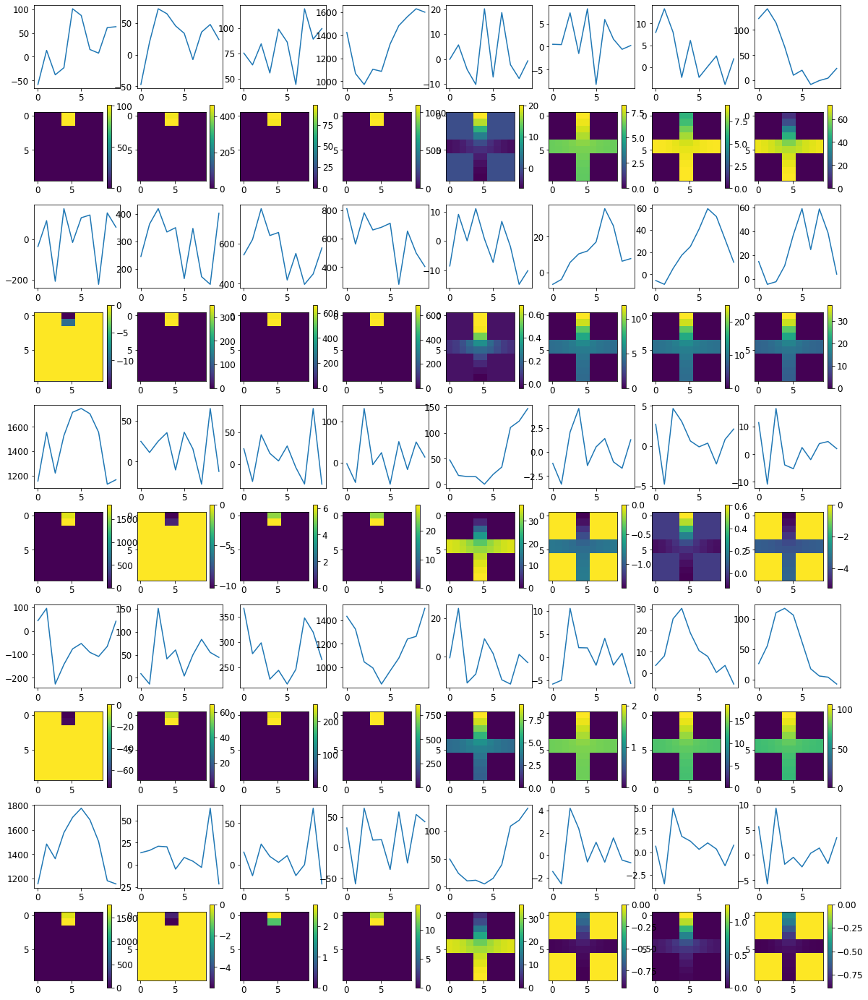


R0 generated:
[[12.574384   17.311686  ]
 [13.893739   16.545252  ]
 [11.7727585  16.258448  ]
 [11.917002   18.1785    ]
 [12.782091   16.400087  ]
 [11.752636   16.090275  ]
 [13.053137   18.374672  ]
 [12.701221   16.345453  ]
 [11.853646   15.414248  ]
 [12.300408   17.212679  ]
 [12.994982   15.679743  ]
 [12.645571   16.229424  ]
 [11.781801   16.70821   ]
 [11.70871    17.143625  ]
 [13.807796   16.425714  ]
 [11.551814   14.964429  ]
 [13.111141   17.90448   ]
 [11.329833   17.296787  ]
 [13.487232   17.087385  ]
 [12.678945   16.410109  ]
 [ 4.166       1.1559428 ]
 [ 4.1946063   2.3735728 ]
 [ 4.3241916   0.9122795 ]
 [ 3.4809601   1.8246392 ]
 [ 3.9667084   1.3949499 ]
 [ 4.1633506   1.117634  ]
 [ 4.2635245   1.7338834 ]
 [ 4.3964996   1.5444847 ]
 [ 3.5982733   0.9678293 ]
 [ 3.1680892   1.582485  ]
 [16.54653     0.8625998 ]
 [17.689108    0.9595831 ]
 [16.882662    1.498229  ]
 [16.80499     1.4099013 ]
 [17.028343    0.88308996]
 [16.424051    1.6765294 ]
 [17.004122  

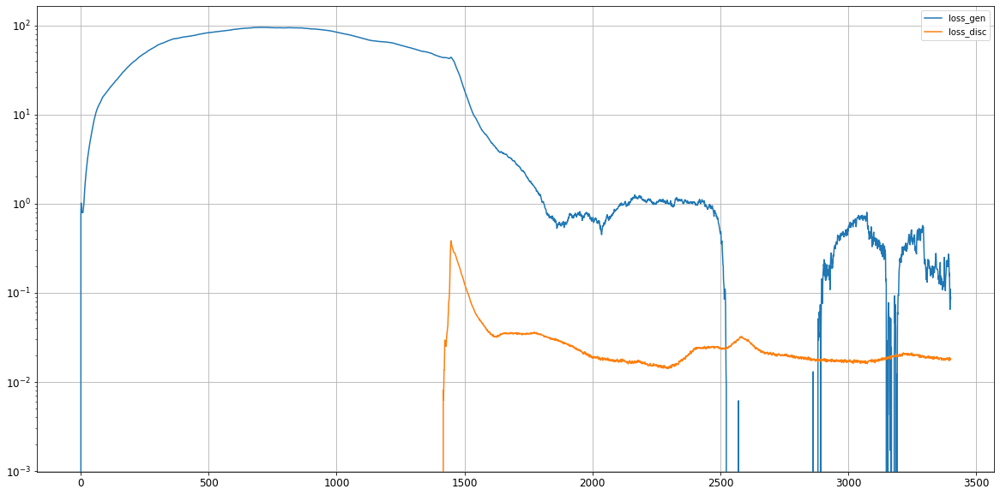

0: mean KL divergence (r,g) = 0.14769482110957105
0: mean JS divergence = 0.03838252595608929
0: mean 1-BC divergence = 0.03090423614251392

0: std KL divergence (r,g) = inf
0: std JS divergence = 0.24796086348643587
0: std 1-BC divergence = 0.21557801386841813


/home/viluiz/anaconda3/envs/py3ml/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


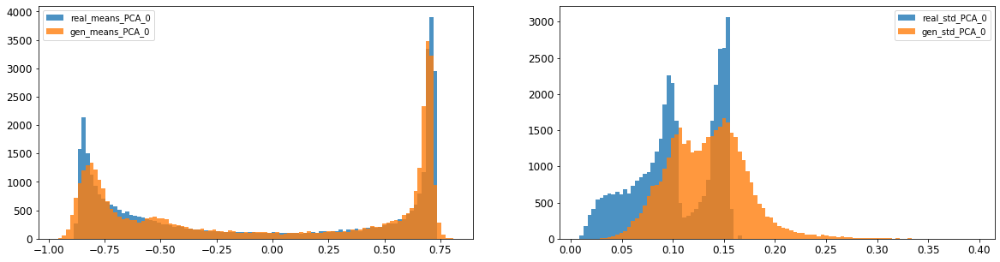

1: mean KL divergence (r,g) = 0.11886481220813425
1: mean JS divergence = 0.02777990380117769
1: mean 1-BC divergence = 0.01980462247547521

1: std KL divergence (r,g) = inf
1: std JS divergence = 0.19368945417565414
1: std 1-BC divergence = 0.16613751984321223


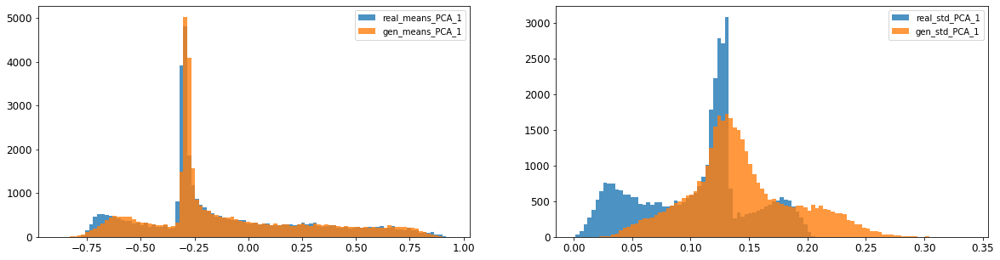

2: mean KL divergence (r,g) = inf
2: mean JS divergence = 0.014464314188646554
2: mean 1-BC divergence = 0.010495787940094425

2: std KL divergence (r,g) = 0.28489069957000246
2: std JS divergence = 0.08853149507606474
2: std 1-BC divergence = 0.08163194177029565


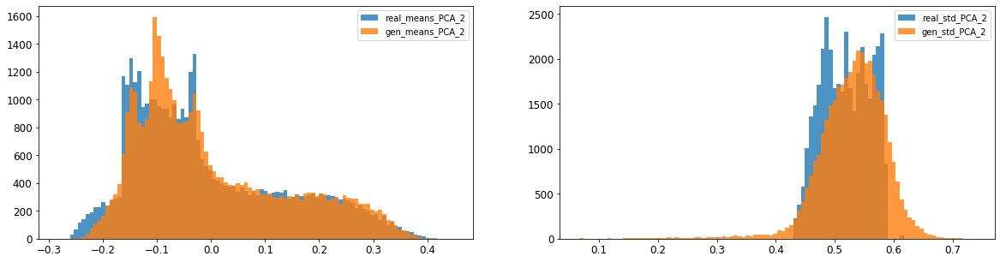

3: mean KL divergence (r,g) = 0.10678500024014533
3: mean JS divergence = 0.02651647530016144
3: mean 1-BC divergence = 0.018701627846542612

3: std KL divergence (r,g) = inf
3: std JS divergence = 0.2904490401784265
3: std 1-BC divergence = 0.2591188512588861


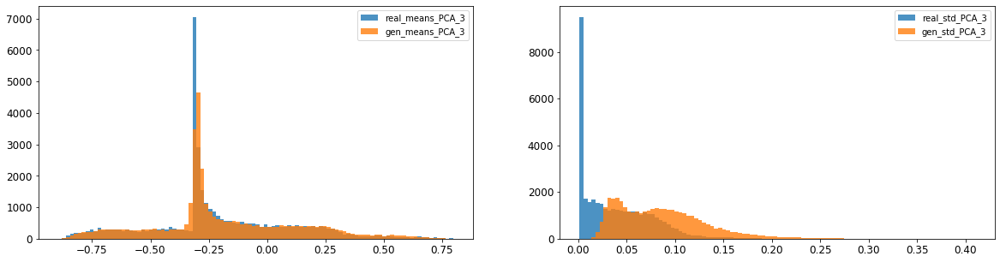

4: mean KL divergence (r,g) = 0.06516116527753248
4: mean JS divergence = 0.017397098395608285
4: mean 1-BC divergence = 0.013813694165089596

4: std KL divergence (r,g) = inf
4: std JS divergence = 0.0412521641327892
4: std 1-BC divergence = 0.03681019253075124


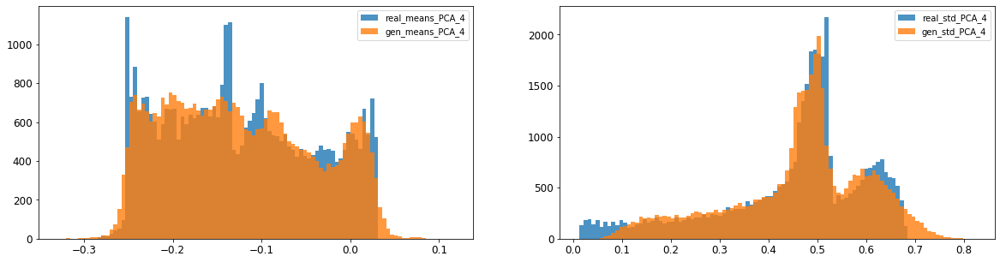

5: mean KL divergence (r,g) = 0.2884842815730171
5: mean JS divergence = 0.0764429665478675
5: mean 1-BC divergence = 0.058207498878893094

5: std KL divergence (r,g) = 1.2259210028803005
5: std JS divergence = 0.2322422285651703
5: std 1-BC divergence = 0.1785710179939104


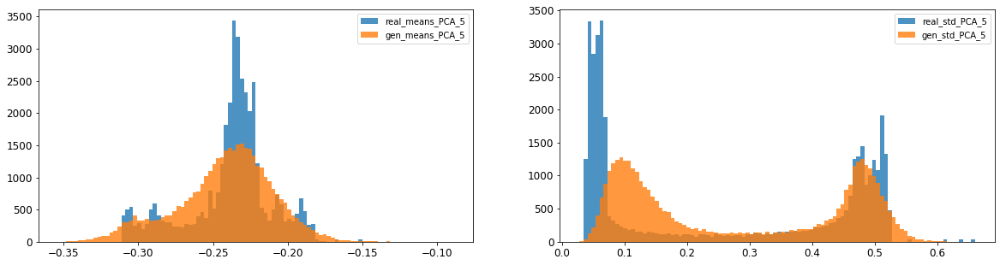

6: mean KL divergence (r,g) = 0.08154846139580596
6: mean JS divergence = 0.022892068201697174
6: mean 1-BC divergence = 0.01746305490755118

6: std KL divergence (r,g) = inf
6: std JS divergence = 0.1005477116145151
6: std 1-BC divergence = 0.0745202174397196


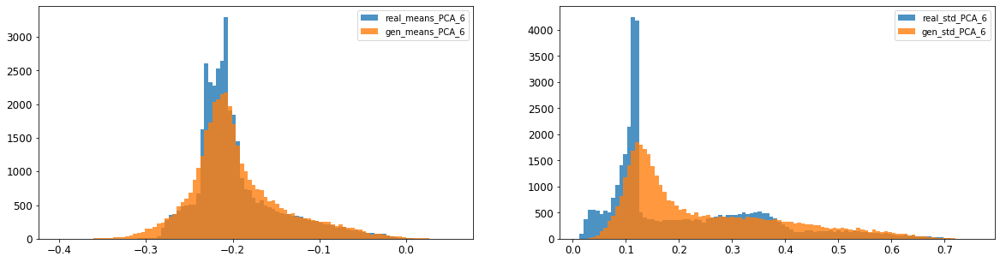

7: mean KL divergence (r,g) = 0.13205958405544369
7: mean JS divergence = 0.03539171755819089
7: mean 1-BC divergence = 0.02685399761403373

7: std KL divergence (r,g) = inf
7: std JS divergence = 0.11744719811778978
7: std 1-BC divergence = 0.09125643515051718


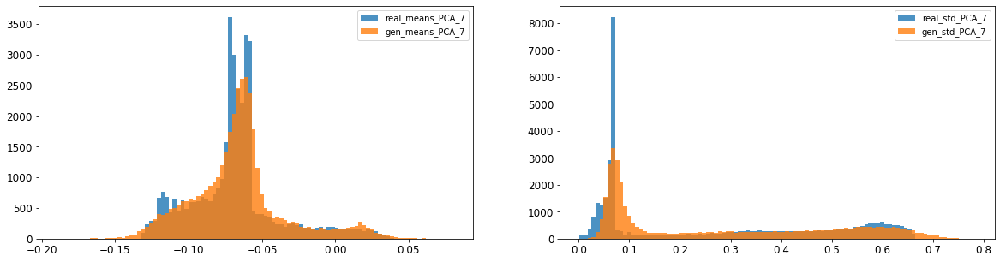

8: mean KL divergence (r,g) = inf
8: mean JS divergence = 0.04531178905290342
8: mean 1-BC divergence = 0.031945359716568755

8: std KL divergence (r,g) = inf
8: std JS divergence = 0.1408685036724285
8: std 1-BC divergence = 0.10878466835859246


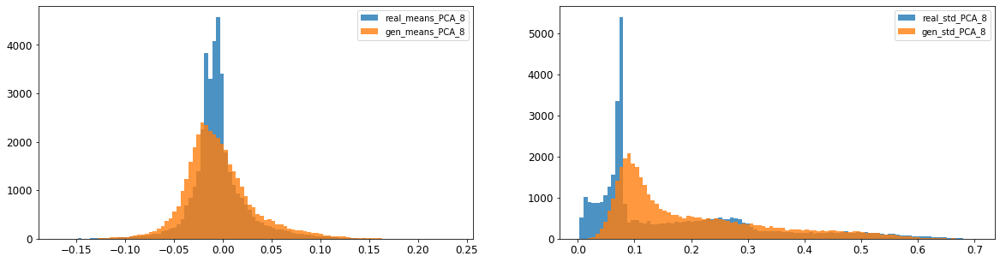

9: mean KL divergence (r,g) = inf
9: mean JS divergence = 0.009498251683243586
9: mean 1-BC divergence = 0.006826100879262942

9: std KL divergence (r,g) = inf
9: std JS divergence = 0.05978196315171555
9: std 1-BC divergence = 0.04450464990498082


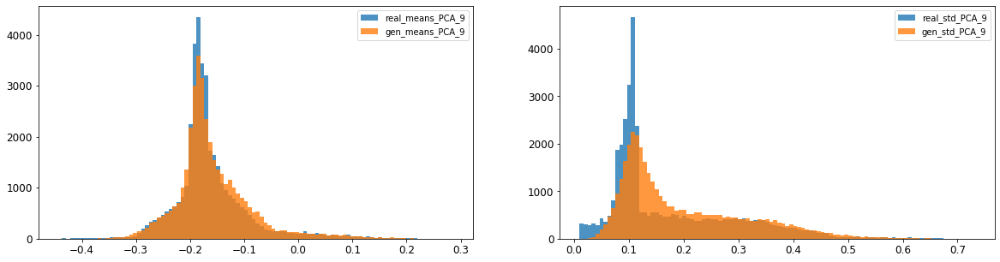

10: mean KL divergence (r,g) = 0.18917924795955127
10: mean JS divergence = 0.048967378317028215
10: mean 1-BC divergence = 0.03474402858530623

10: std KL divergence (r,g) = inf
10: std JS divergence = 0.2721159380449119
10: std 1-BC divergence = 0.21660006497429996


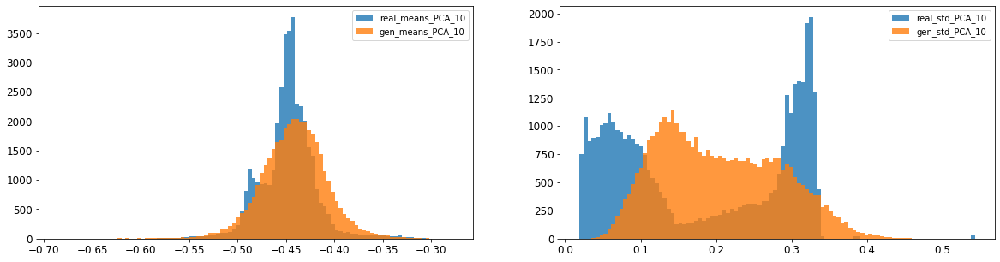

11: mean KL divergence (r,g) = 0.0595750183164639
11: mean JS divergence = 0.01595940932443402
11: mean 1-BC divergence = 0.011580461484355098

11: std KL divergence (r,g) = inf
11: std JS divergence = 0.11947594495605904
11: std 1-BC divergence = 0.09138136070375347


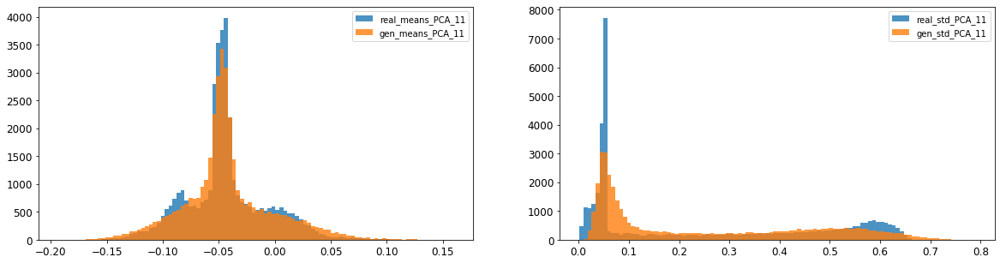

12: mean KL divergence (r,g) = 0.12213175218605431
12: mean JS divergence = 0.030487838772185815
12: mean 1-BC divergence = 0.021381354396377783

12: std KL divergence (r,g) = inf
12: std JS divergence = 0.13516141939606374
12: std 1-BC divergence = 0.10285850993727186


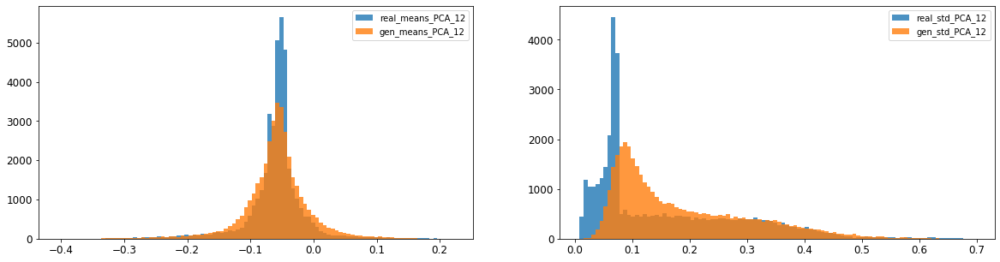

13: mean KL divergence (r,g) = 0.2829934826692675
13: mean JS divergence = 0.0717269090958634
13: mean 1-BC divergence = 0.05069608400649783

13: std KL divergence (r,g) = inf
13: std JS divergence = 0.14935671423417743
13: std 1-BC divergence = 0.11393399072079535


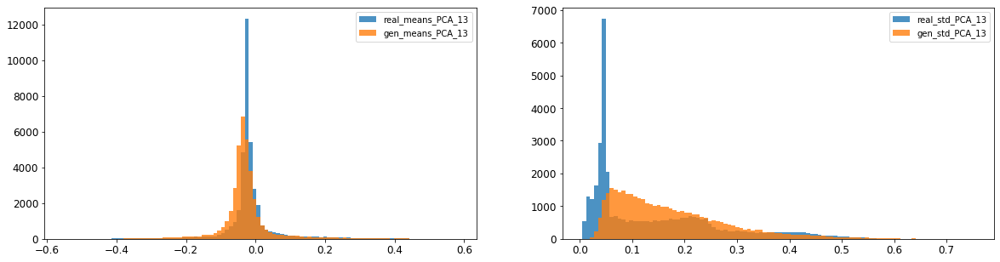

14: mean KL divergence (r,g) = inf
14: mean JS divergence = 0.05818819130101857
14: mean 1-BC divergence = 0.04147510132825738

14: std KL divergence (r,g) = inf
14: std JS divergence = 0.195424646094217
14: std 1-BC divergence = 0.15230855321928383


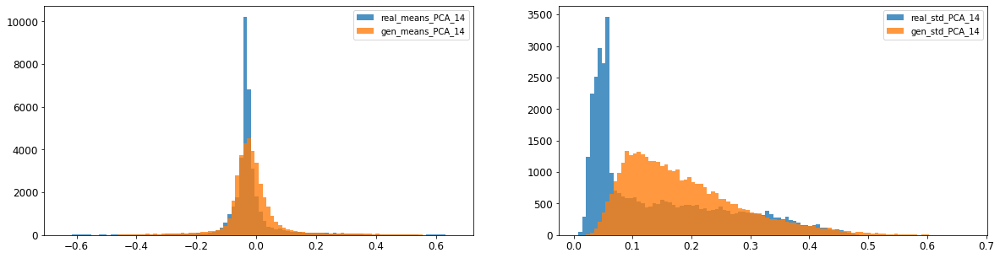

15: mean KL divergence (r,g) = 1.555136905063906
15: mean JS divergence = 0.4273273631058663
15: mean 1-BC divergence = 0.39249239184215556

15: std KL divergence (r,g) = 7.478432580567353
15: std JS divergence = 0.9749761728374322
15: std 1-BC divergence = 0.9251169135551023


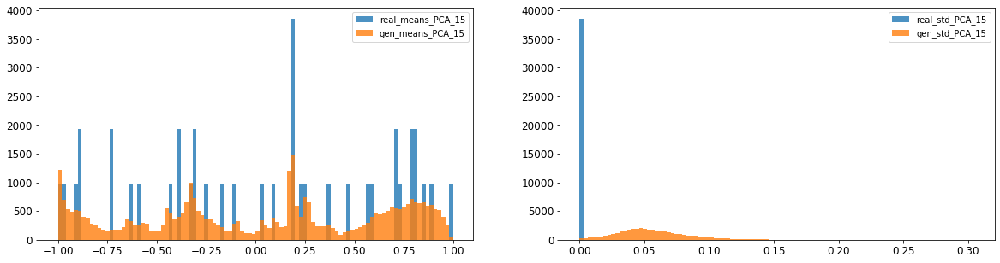

16: mean KL divergence (r,g) = 1.4041205931377274
16: mean JS divergence = 0.38769552281819614
16: mean 1-BC divergence = 0.35609921304713565

16: std KL divergence (r,g) = 5.985392569287236
16: std JS divergence = 0.9412881143675484
16: std 1-BC divergence = 0.87436557674199


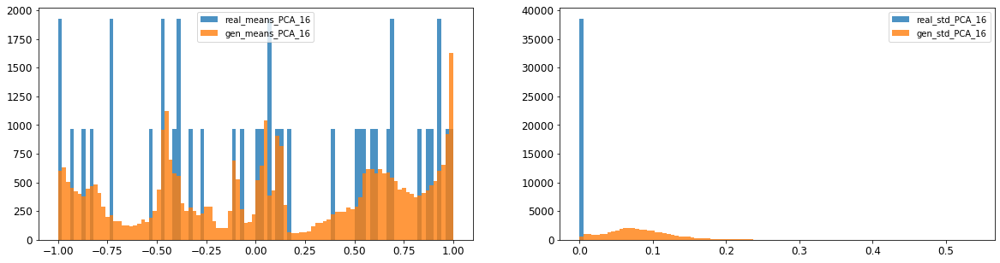



--------------------------------------------------------

Compose KL divergence (r,g) = inf
Compose JS divergence = 0.09745707074641781
Compose 1-BC divergence = 0.07762963326805017

Compose weighted KL divergence (r,g) = inf
Compose weighted JS divergence = 0.12192602344171666
Compose weighted 1-BC divergence = 0.1041506831270792

Multivariate KL divergence = 238.34811232658873


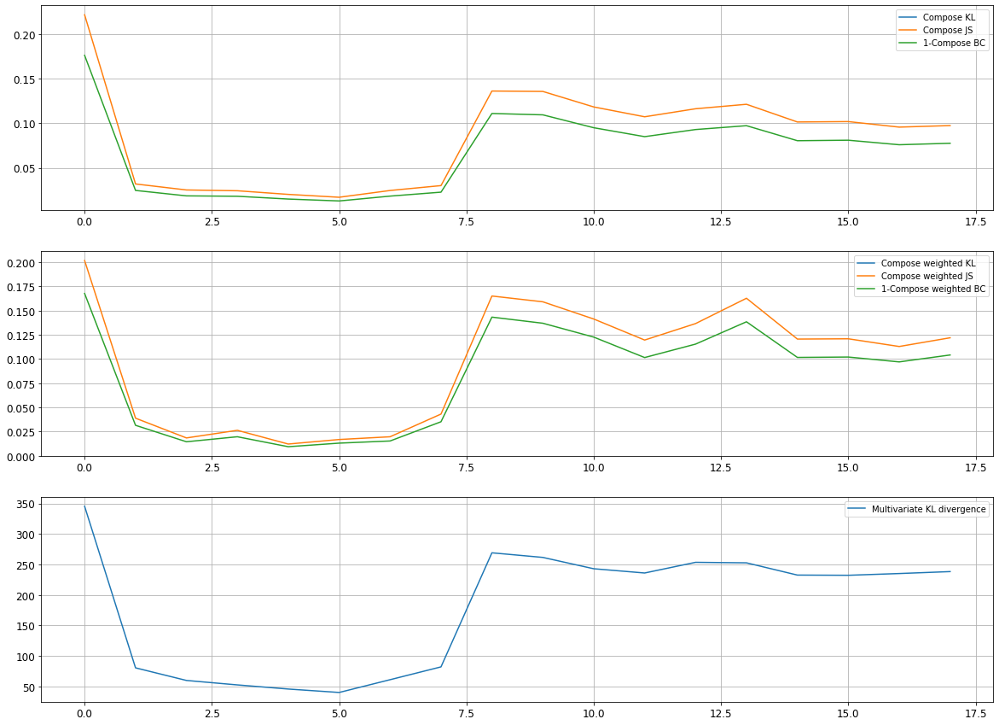

Epoch 3402/10000
discriminator loss: 0.018471 - generator loss: 0.097770 - 144s
Epoch 3403/10000
discriminator loss: 0.018210 - generator loss: 0.093899 - 147s
Epoch 3404/10000
discriminator loss: 0.018033 - generator loss: 0.071288 - 148s
Epoch 3405/10000
discriminator loss: 0.017263 - generator loss: 0.078673 - 147s
Epoch 3406/10000
discriminator loss: 0.018179 - generator loss: 0.077535 - 148s
Epoch 3407/10000
discriminator loss: 0.017968 - generator loss: 0.098312 - 148s
Epoch 3408/10000
discriminator loss: 0.018139 - generator loss: 0.074855 - 149s
Epoch 3409/10000
discriminator loss: 0.018671 - generator loss: 0.092050 - 148s
Epoch 3410/10000
discriminator loss: 0.017561 - generator loss: 0.092997 - 148s
Epoch 3411/10000
discriminator loss: 0.017816 - generator loss: 0.086475 - 148s
Epoch 3412/10000
discriminator loss: 0.017013 - generator loss: 0.092725 - 146s
Epoch 3413/10000
discriminator loss: 0.017573 - generator loss: 0.104544 - 147s
Epoch 3414/10000
discriminator loss: 0.0

discriminator loss: 0.017664 - generator loss: 0.437304 - 147s
Epoch 3506/10000
discriminator loss: 0.017670 - generator loss: 0.422387 - 148s
Epoch 3507/10000
discriminator loss: 0.017570 - generator loss: 0.455415 - 146s
Epoch 3508/10000
discriminator loss: 0.017570 - generator loss: 0.445881 - 147s
Epoch 3509/10000
discriminator loss: 0.017607 - generator loss: 0.451421 - 147s
Epoch 3510/10000
discriminator loss: 0.017733 - generator loss: 0.453478 - 146s
Epoch 3511/10000
discriminator loss: 0.017464 - generator loss: 0.418199 - 146s
Epoch 3512/10000
discriminator loss: 0.017805 - generator loss: 0.437269 - 146s
Epoch 3513/10000
discriminator loss: 0.017718 - generator loss: 0.450175 - 148s
Epoch 3514/10000
discriminator loss: 0.018342 - generator loss: 0.413689 - 146s
Epoch 3515/10000
discriminator loss: 0.018957 - generator loss: 0.396409 - 147s
Epoch 3516/10000
discriminator loss: 0.020125 - generator loss: 0.429797 - 146s
Epoch 3517/10000
discriminator loss: 0.018787 - generator

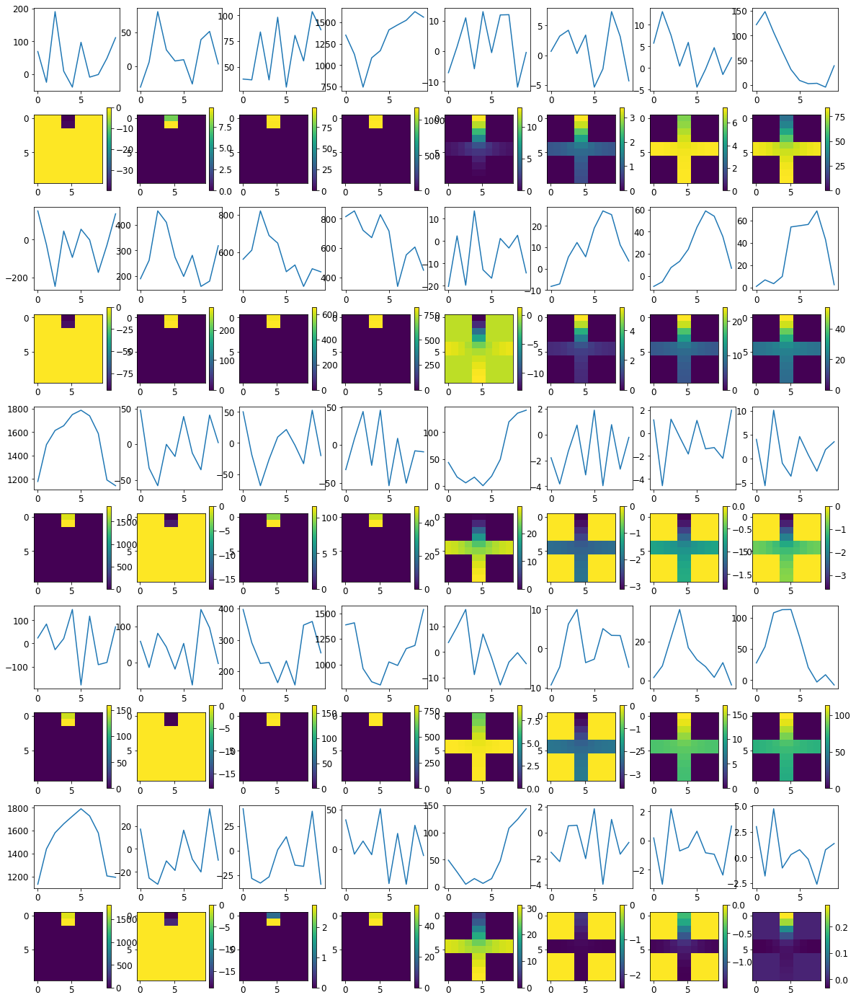


R0 generated:
[[ 8.638618   16.642353  ]
 [ 9.450011   17.465395  ]
 [ 5.8696427  15.682109  ]
 [ 6.8705797  16.769234  ]
 [ 6.31925    17.228025  ]
 [ 8.157343   13.161467  ]
 [ 6.0287414  17.668457  ]
 [ 9.147367   16.46655   ]
 [ 7.813206   15.784629  ]
 [ 5.829337   17.126257  ]
 [13.396467   15.727288  ]
 [13.081207   16.23459   ]
 [12.528522   17.604374  ]
 [12.147207   16.6359    ]
 [14.336488   16.05302   ]
 [12.63943    16.728588  ]
 [13.197962   17.683332  ]
 [12.189153   17.719574  ]
 [13.014312   17.282425  ]
 [12.868831   16.379816  ]
 [ 3.426124    1.0452076 ]
 [ 3.4151433   1.643302  ]
 [ 3.9194353   0.78390896]
 [ 3.006504    1.0481837 ]
 [ 3.173124    1.0947438 ]
 [ 3.8792772   1.0107836 ]
 [ 3.5912278   1.5051901 ]
 [ 4.1156754   0.98404366]
 [ 2.89458     1.2477633 ]
 [ 3.239958    1.3400578 ]
 [17.067583    0.87370086]
 [16.841581    1.5114636 ]
 [17.149923    0.49349958]
 [17.202126    1.1651739 ]
 [17.327837    0.6741394 ]
 [17.035856    1.6431451 ]
 [16.44825   

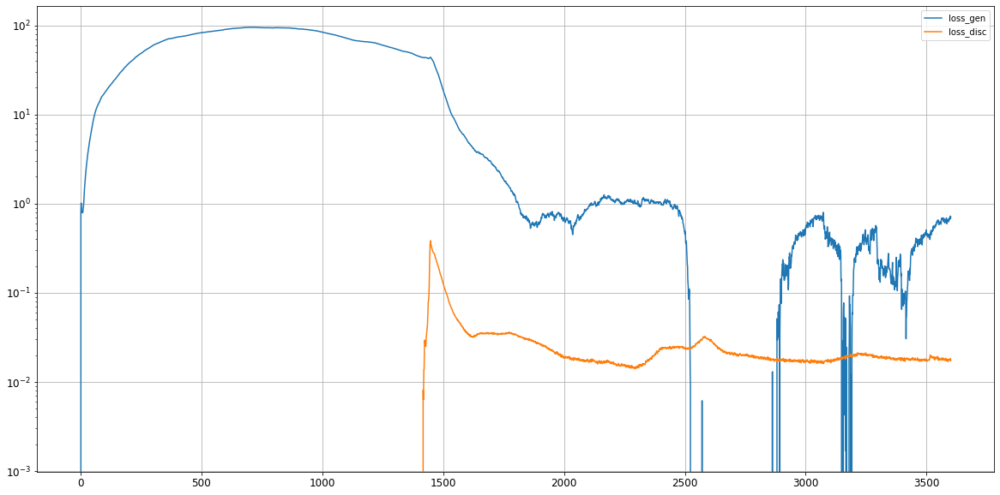

0: mean KL divergence (r,g) = 0.25953029539452155
0: mean JS divergence = 0.06889742808399876
0: mean 1-BC divergence = 0.058828498210002245


/home/viluiz/anaconda3/envs/py3ml/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until



0: std KL divergence (r,g) = inf
0: std JS divergence = 0.3014472044911495
0: std 1-BC divergence = 0.2573956575554742


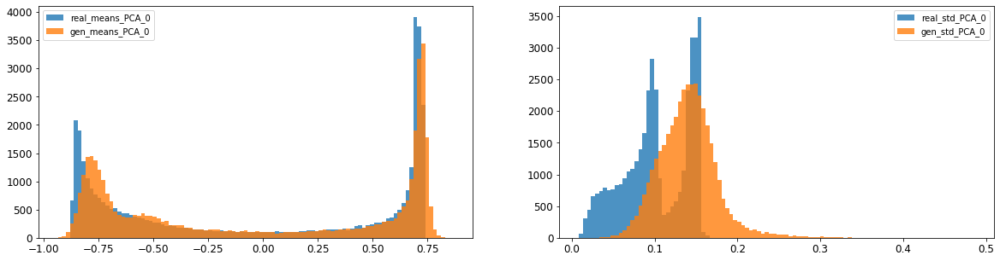

1: mean KL divergence (r,g) = 0.1418590432673798
1: mean JS divergence = 0.037413679056300636
1: mean 1-BC divergence = 0.026914954051976858

1: std KL divergence (r,g) = inf
1: std JS divergence = 0.18309748213489596
1: std 1-BC divergence = 0.15523633757673627


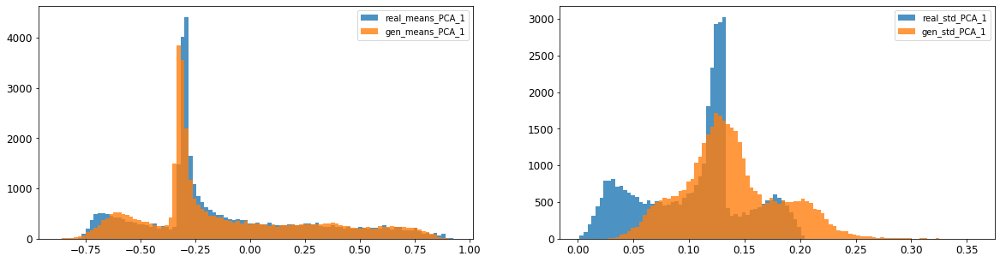

2: mean KL divergence (r,g) = 0.04438223047605111
2: mean JS divergence = 0.01319150204838392
2: mean 1-BC divergence = 0.011040448119944313

2: std KL divergence (r,g) = 0.37970776556568775
2: std JS divergence = 0.1158025173947281
2: std 1-BC divergence = 0.10565080789297021


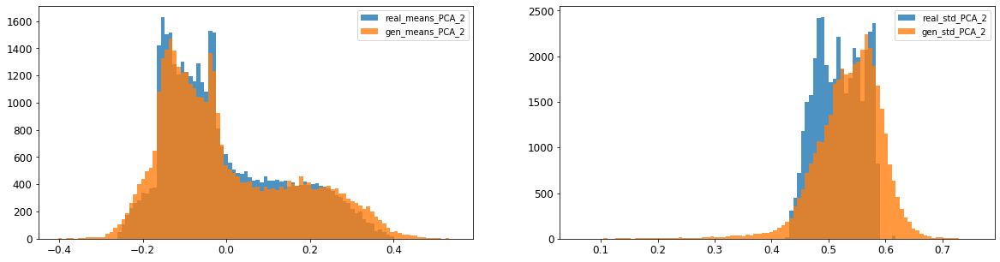

3: mean KL divergence (r,g) = inf
3: mean JS divergence = 0.018862713985708882
3: mean 1-BC divergence = 0.013634833003601687

3: std KL divergence (r,g) = inf
3: std JS divergence = 0.28713544863881607
3: std 1-BC divergence = 0.25628074461805206


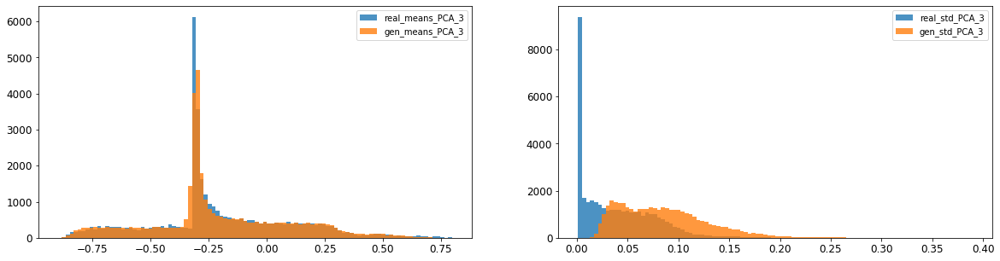

4: mean KL divergence (r,g) = 0.12567389153249492
4: mean JS divergence = 0.03864650442582758
4: mean 1-BC divergence = 0.034732613219918496

4: std KL divergence (r,g) = inf
4: std JS divergence = 0.029119896222956264
4: std 1-BC divergence = 0.0253658413881257


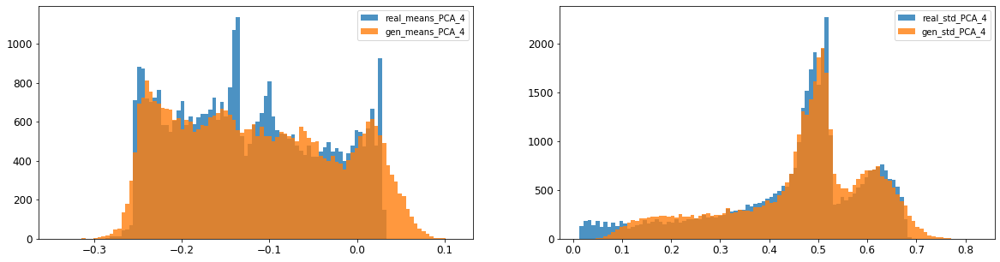

5: mean KL divergence (r,g) = 0.3460305722762566
5: mean JS divergence = 0.08984149211724371
5: mean 1-BC divergence = 0.06821874891857738

5: std KL divergence (r,g) = inf
5: std JS divergence = 0.25140902377646707
5: std 1-BC divergence = 0.19818401599016722


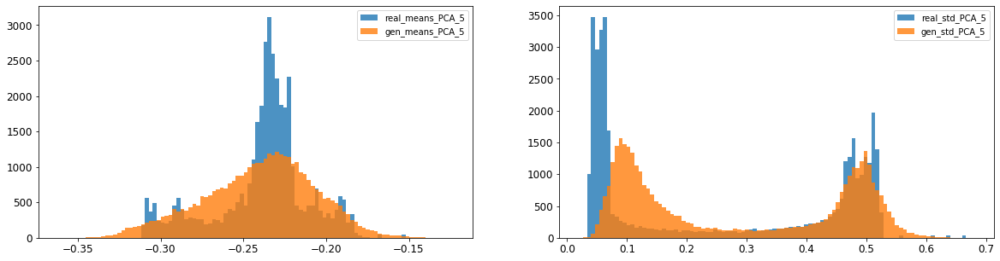

6: mean KL divergence (r,g) = inf
6: mean JS divergence = 0.0747368300202272
6: mean 1-BC divergence = 0.057853040383300636

6: std KL divergence (r,g) = inf
6: std JS divergence = 0.08902117624289213
6: std 1-BC divergence = 0.06673769869224577


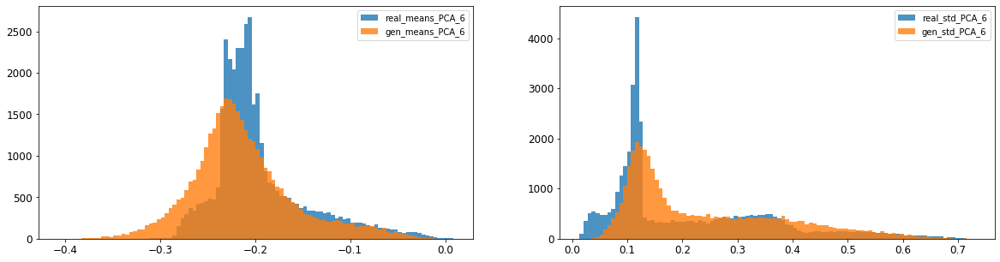

7: mean KL divergence (r,g) = 0.14506930056113665
7: mean JS divergence = 0.040482050877972325
7: mean 1-BC divergence = 0.033054329454162756

7: std KL divergence (r,g) = inf
7: std JS divergence = 0.1251513265332486
7: std 1-BC divergence = 0.09770001671586548


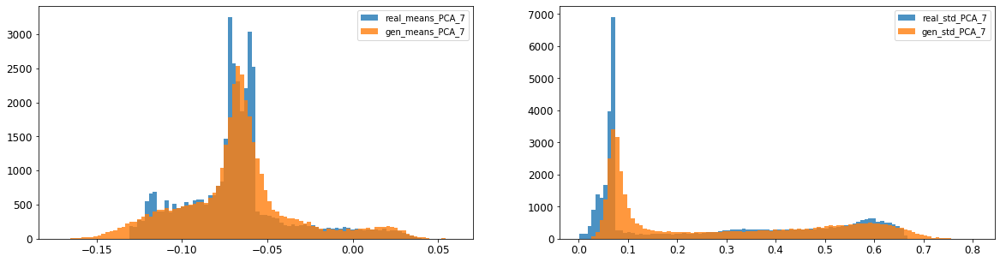

8: mean KL divergence (r,g) = inf
8: mean JS divergence = 0.04321381400069724
8: mean 1-BC divergence = 0.03055305079819015

8: std KL divergence (r,g) = inf
8: std JS divergence = 0.14342065895715994
8: std 1-BC divergence = 0.11191586499382777


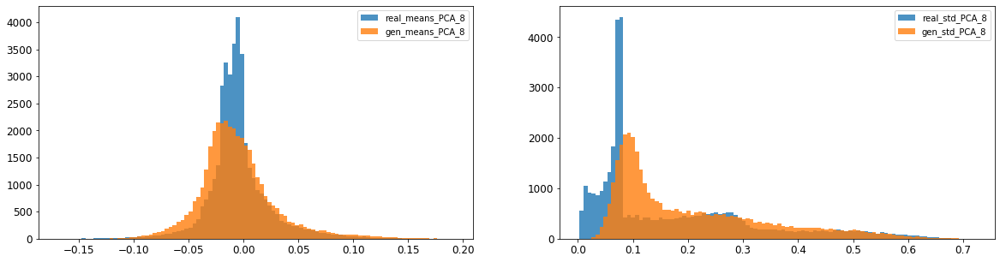

9: mean KL divergence (r,g) = inf
9: mean JS divergence = 0.006206500666014286
9: mean 1-BC divergence = 0.004482178479256693

9: std KL divergence (r,g) = inf
9: std JS divergence = 0.05382367070182463
9: std 1-BC divergence = 0.04054937770618461


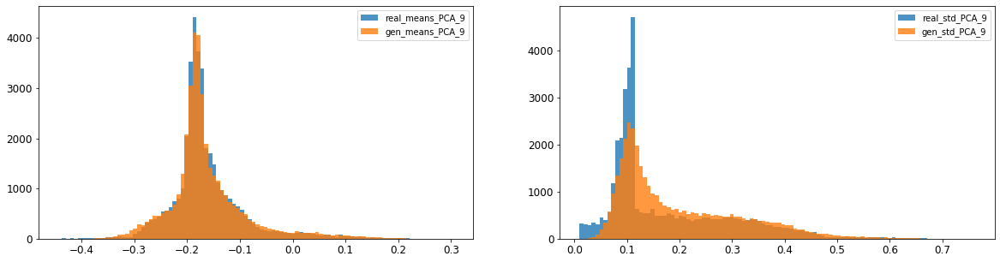

10: mean KL divergence (r,g) = 0.19662840566015796
10: mean JS divergence = 0.05142696934073065
10: mean 1-BC divergence = 0.036878850352330295

10: std KL divergence (r,g) = inf
10: std JS divergence = 0.23518384305359052
10: std 1-BC divergence = 0.1841996494823276


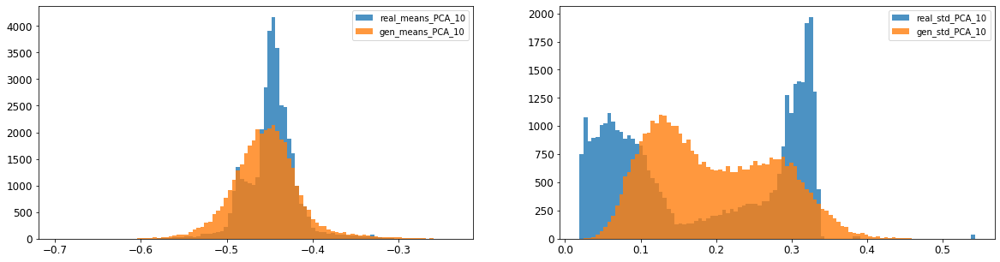

11: mean KL divergence (r,g) = 0.06963487555720622
11: mean JS divergence = 0.01836212739068639
11: mean 1-BC divergence = 0.013172021827251967

11: std KL divergence (r,g) = inf
11: std JS divergence = 0.11516697600969533
11: std 1-BC divergence = 0.0889459242315348


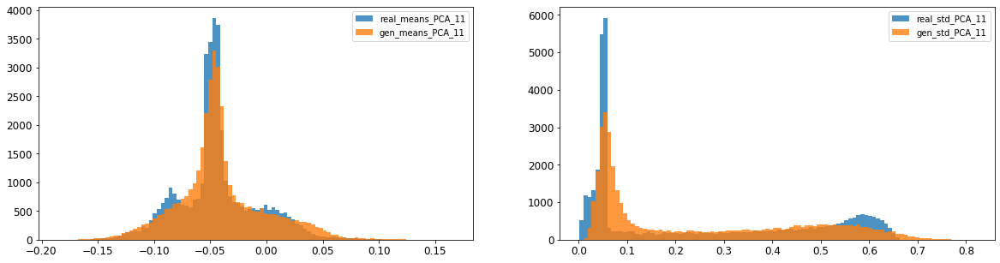

12: mean KL divergence (r,g) = inf
12: mean JS divergence = 0.04209990240009789
12: mean 1-BC divergence = 0.029592126050056344

12: std KL divergence (r,g) = inf
12: std JS divergence = 0.1352017586632428
12: std 1-BC divergence = 0.10284306865823056


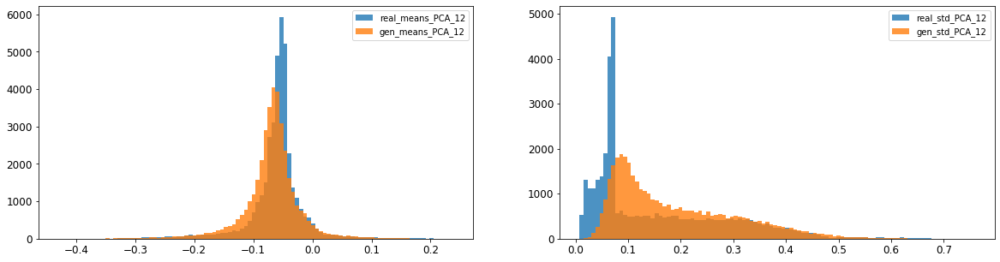

13: mean KL divergence (r,g) = 0.1767543291734209
13: mean JS divergence = 0.0441673463536841
13: mean 1-BC divergence = 0.03105963284412172

13: std KL divergence (r,g) = inf
13: std JS divergence = 0.13885235126152423
13: std 1-BC divergence = 0.10527820561519996


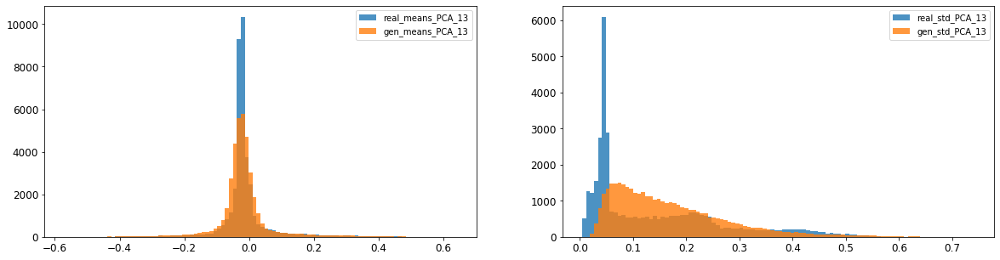

14: mean KL divergence (r,g) = 0.2019325023095612
14: mean JS divergence = 0.04784348113841275
14: mean 1-BC divergence = 0.0336018984887414

14: std KL divergence (r,g) = inf
14: std JS divergence = 0.17781177191496383
14: std 1-BC divergence = 0.13409877708273477


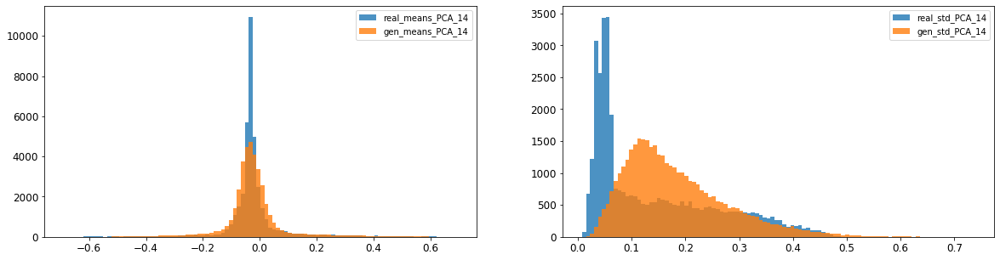

15: mean KL divergence (r,g) = 1.5820352276965268
15: mean JS divergence = 0.43394874816385043
15: mean 1-BC divergence = 0.3983859234895414

15: std KL divergence (r,g) = 8.678731231053185
15: std JS divergence = 0.987648242431042
15: std 1-BC divergence = 0.9506007008344474


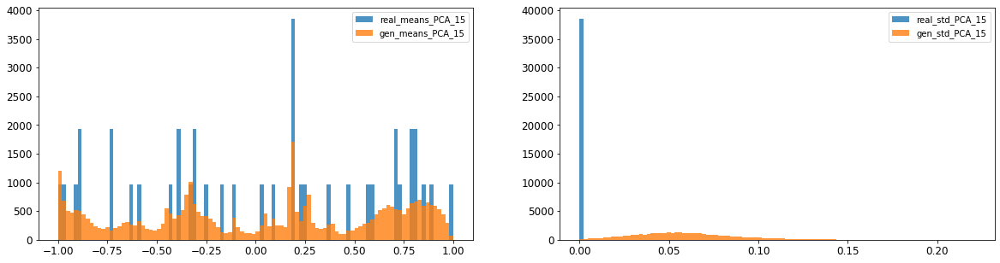

16: mean KL divergence (r,g) = 1.4222733832997083
16: mean JS divergence = 0.3922134952416829
16: mean 1-BC divergence = 0.3608600544428102

16: std KL divergence (r,g) = 6.589463892956097
16: std JS divergence = 0.9582574051506247
16: std 1-BC divergence = 0.8980970265807094


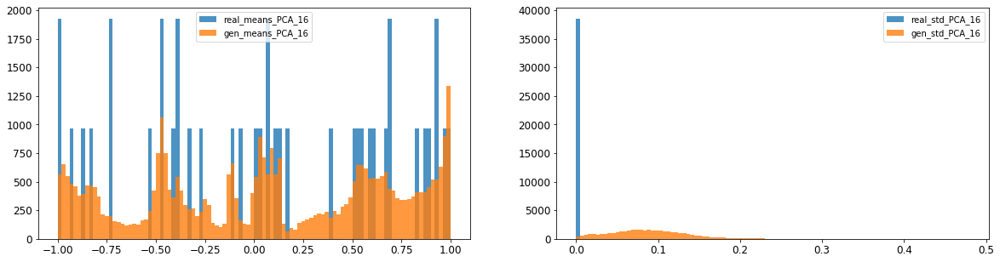



--------------------------------------------------------

Compose KL divergence (r,g) = inf
Compose JS divergence = 0.10056791493010472
Compose 1-BC divergence = 0.08046664041337048

Compose weighted KL divergence (r,g) = inf
Compose weighted JS divergence = 0.14681613388519232
Compose weighted 1-BC divergence = 0.12474520881641538

Multivariate KL divergence = 237.17585456517094


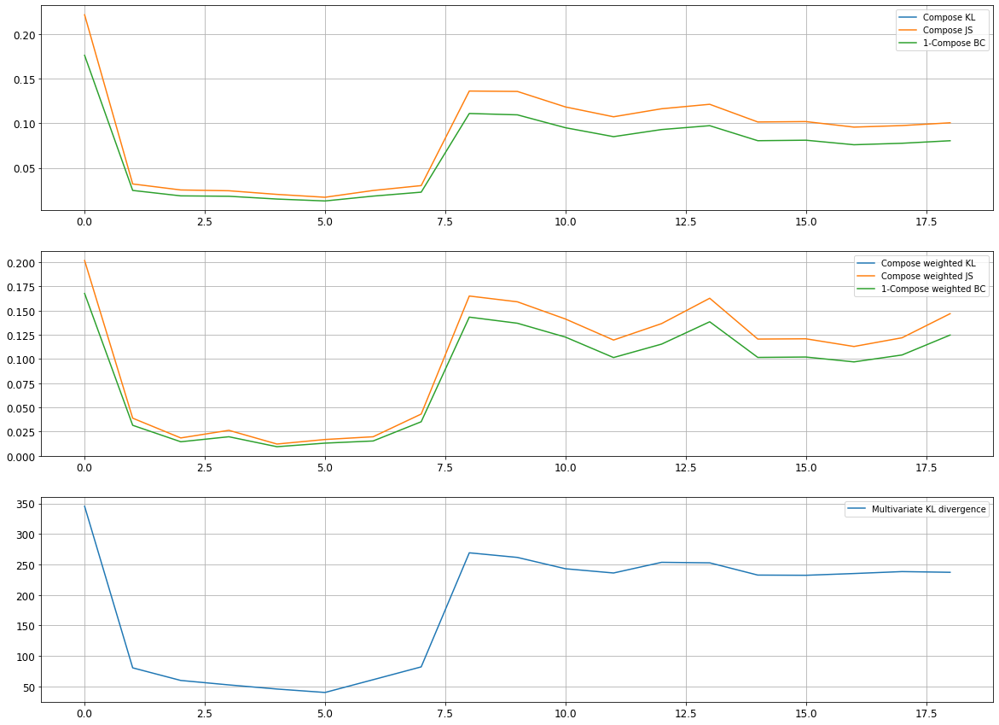

Epoch 3602/10000
discriminator loss: 0.017909 - generator loss: 0.688383 - 147s
Epoch 3603/10000
discriminator loss: 0.017941 - generator loss: 0.725856 - 148s
Epoch 3604/10000
discriminator loss: 0.017828 - generator loss: 0.716256 - 149s
Epoch 3605/10000
discriminator loss: 0.017596 - generator loss: 0.694140 - 148s
Epoch 3606/10000
discriminator loss: 0.017416 - generator loss: 0.685155 - 148s
Epoch 3607/10000
discriminator loss: 0.017813 - generator loss: 0.698521 - 147s
Epoch 3608/10000
discriminator loss: 0.017831 - generator loss: 0.700755 - 148s
Epoch 3609/10000
discriminator loss: 0.017874 - generator loss: 0.722998 - 148s
Epoch 3610/10000
discriminator loss: 0.017461 - generator loss: 0.747593 - 149s
Epoch 3611/10000
discriminator loss: 0.017893 - generator loss: 0.737039 - 149s
Epoch 3612/10000
discriminator loss: 0.017299 - generator loss: 0.760682 - 149s
Epoch 3613/10000
discriminator loss: 0.017860 - generator loss: 0.742011 - 148s
Epoch 3614/10000
discriminator loss: 0.0

discriminator loss: 0.017589 - generator loss: 0.612803 - 147s
Epoch 3706/10000
discriminator loss: 0.017922 - generator loss: 0.588166 - 147s
Epoch 3707/10000
discriminator loss: 0.018487 - generator loss: 0.653325 - 146s
Epoch 3708/10000
discriminator loss: 0.018491 - generator loss: 0.716940 - 146s
Epoch 3709/10000
discriminator loss: 0.018202 - generator loss: 0.773933 - 146s
Epoch 3710/10000
discriminator loss: 0.018500 - generator loss: 0.781295 - 147s
Epoch 3711/10000
discriminator loss: 0.018323 - generator loss: 0.830085 - 146s
Epoch 3712/10000
discriminator loss: 0.017902 - generator loss: 0.847703 - 146s
Epoch 3713/10000
discriminator loss: 0.017549 - generator loss: 0.815488 - 147s
Epoch 3714/10000
discriminator loss: 0.018013 - generator loss: 0.833145 - 146s
Epoch 3715/10000
discriminator loss: 0.017851 - generator loss: 0.799508 - 146s
Epoch 3716/10000
discriminator loss: 0.017907 - generator loss: 0.780841 - 146s
Epoch 3717/10000
discriminator loss: 0.018651 - generator

KeyboardInterrupt: 

In [132]:
hist = train(train_dataset, model_name='wgan-winit', epochs=10000)